In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os

# Konfigurasi agar GPU digunakan secara efisien
physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU Terdeteksi: ", physical_devices[0])
else:
    print("Peringatan: GPU tidak terdeteksi. Training akan lambat.")

GPU Terdeteksi:  PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [ ]:
# Create the .kaggle directory if it doesn't exist
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the .kaggle directory
# IMPORTANT: Make sure you have uploaded kaggle.json to your Colab session's /content/ directory first.
# If you uploaded it somewhere else, adjust the source path accordingly.
!mv /content/kaggle.json ~/.kaggle/

# Set read-only permissions for the kaggle.json file for security
!chmod 600 ~/.kaggle/kaggle.json

print("Kaggle API credentials set up successfully!")

Kaggle API credentials set up successfully!


In [ ]:
# Install kaggle if not already installed
!pip install -q kaggle

# Make sure your Kaggle API credentials (kaggle.json) are set up in ~/.kaggle/
# If you haven't done this, please refer to the previous instructions.

# Download the dataset
!kaggle datasets download -d joosthazelzet/lego-brick-images

# Unzip the downloaded dataset to the specified directory
# The zip file will be downloaded to the current working directory (/content/)
!unzip -q /content/lego-brick-images.zip -d /content/dataset/

# Clean up the zip file after extraction
!rm /content/lego-brick-images.zip

print("Dataset downloaded and extracted to /content/dataset/")

Dataset URL: https://www.kaggle.com/datasets/joosthazelzet/lego-brick-images
License(s): GPL-2.0
 97% 994M/1.00G [00:05<00:00, 148MB/s]
100% 1.00G/1.00G [00:05<00:00, 190MB/s]
Dataset downloaded and extracted to /content/dataset/


In [ ]:
# Parameter Konfigurasi
BATCH_SIZE = 64
IMG_HEIGHT = 64  # Menggunakan 64x64 agar detail LEGO cukup terlihat
IMG_WIDTH = 64
CHANNELS = 3     # RGB


# --- OPSI B: Membuat Dataset Loader ---
# Ganti 'path/to/images' dengan path folder dataset Anda
dataset_dir = '/content/dataset/LEGO brick images v1'

# Jika folder kosong/tidak ada, kita buat dummy data agar kode tetap jalan (untuk testing)
if not os.path.exists(dataset_dir) or not os.listdir(dataset_dir):
    print("Dataset tidak ditemukan. Membuat data dummy untuk demonstrasi struktur kode.")
    os.makedirs(dataset_dir, exist_ok=True)
    # Membuat 100 gambar random noise sebagai placeholder
    for i in range(100):
        img = np.random.randint(0, 255, (64, 64, 3), dtype=np.uint8)
        tf.keras.utils.save_img(f"{dataset_dir}/dummy_{i}.png", img)

# Memuat dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    dataset_dir,
    label_mode=None, # Kita tidak butuh label untuk GAN
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE
)

# Normalisasi ke [-1, 1]
train_dataset = train_dataset.map(lambda x: (x - 127.5) / 127.5)

# Optimasi performa (Caching & Prefetching)
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

Found 6379 files.


In [ ]:
latent_dim = 128

def build_generator():
    model = keras.Sequential(name="generator")

    # Input: Latent Vector
    # Mulai dengan dense layer yang cukup besar untuk di-reshape
    # Kita ingin mulai dari ukuran 8x8 dengan 512 filter
    model.add(layers.Dense(8 * 8 * 512, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Reshape menjadi tensor 3D
    model.add(layers.Reshape((8, 8, 512)))

    # Upsampling 1: 8x8 -> 16x16
    model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 2: 16x16 -> 32x32
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 3: 32x32 -> 64x64
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Output Layer: 64x64 -> 64x64x3 (RGB)
    # Aktivasi TANH penting agar output di range [-1, 1]
    model.add(layers.Conv2D(CHANNELS, (3, 3), padding='same', activation='tanh'))

    return model

def build_discriminator():
    model = keras.Sequential(name="discriminator")

    # Input: Gambar 64x64x3
    # Downsampling 1: 64 -> 32
    model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 2: 32 -> 16
    model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 3: 16 -> 8
    model.add(layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Flatten dan Output
    model.add(layers.Flatten())
    model.add(layers.Dense(1)) # Output berupa logit (skor real/fake)

    return model

# Inisialisasi Model
generator = build_generator()
discriminator = build_discriminator()

generator.summary()
# discriminator.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32768)          │     4,194,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32768)          │       131,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 256)    │     2,097,152 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 128)    │       524,288 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 64)     │       131,072 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 64, 64, 3)      │         1,731 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,081,411 (27.01 MB)

 Trainable params: 7,014,979 (26.76 MB)

 Non-trainable params: 66,432 (259.50 KB)

In [ ]:
class DCGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        # Metric trackers
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # 1. Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 2. Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # 3. Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # 4. Assemble labels discriminating real from fake images
        # Label 1 untuk fake, 0 untuk real (atau sebaliknya, teknik ini menggunakan label smoothing)
        # Di sini kita pakai standar: 1=Real, 0=Fake.
        # Namun, karena kita concat [Fake, Real], maka labelnya: [0...0, 1...1]
        labels = tf.concat(
            [tf.zeros((batch_size, 1)), tf.ones((batch_size, 1))], axis=0
        )

        # Tambahkan sedikit noise pada label (Label Smoothing) untuk stabilitas
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # 5. Train the Discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)

        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # 6. Sample random points in the latent space (lagi, untuk Generator)
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 7. Assemble labels that say "all real images" (We want to fool the discriminator)
        misleading_labels = tf.ones((batch_size, 1))

        # 8. Train the Generator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)

        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(
            zip(grads, self.generator.trainable_weights)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 127.5
        generated_images += 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(10, 4))
        for i in range(self.num_img):
            plt.subplot(1, self.num_img, i+1)
            img = keras.utils.array_to_img(generated_images[i])
            plt.imshow(img)
            plt.axis('off')

        plt.suptitle(f"Epoch {epoch+1}")
        plt.show() # Tampilkan inline di Colab

        # Opsional: Simpan ke file
        # plt.savefig(f"generated_lego_epoch_{epoch}.png")
        # plt.close()

Mulai Training...
Epoch 1/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - d_loss: 0.4866 - g_loss: 0.7345

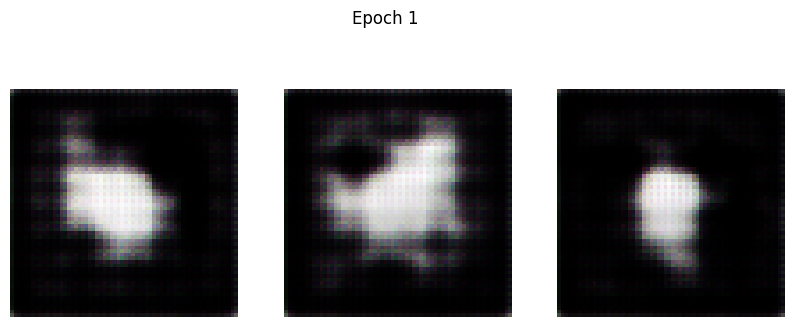

100/100 ━━━━━━━━━━━━━━━━━━━━ 44s 199ms/step - d_loss: 0.4872 - g_loss: 0.7349
Epoch 2/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 0.6685 - g_loss: 0.7150

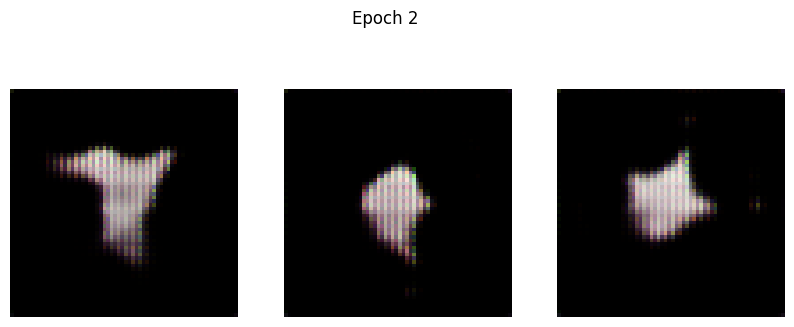

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: 0.6686 - g_loss: 0.7152
Epoch 3/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_loss: 0.6755 - g_loss: 0.7148

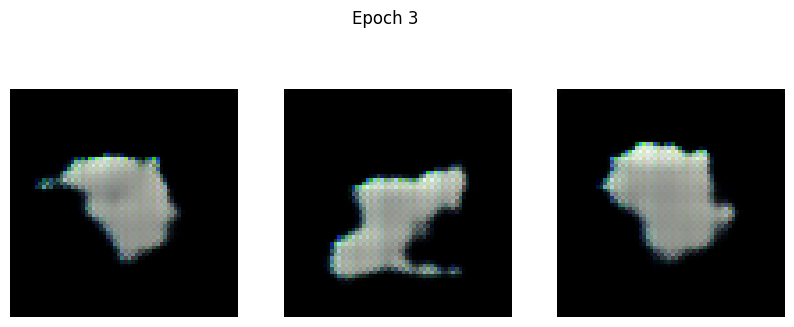

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: 0.6755 - g_loss: 0.7149
Epoch 4/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: 0.6575 - g_loss: 0.7231

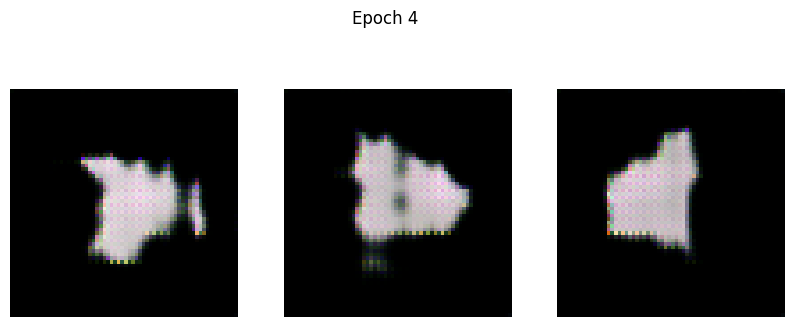

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - d_loss: 0.6575 - g_loss: 0.7235
Epoch 5/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: 0.6476 - g_loss: 0.8413

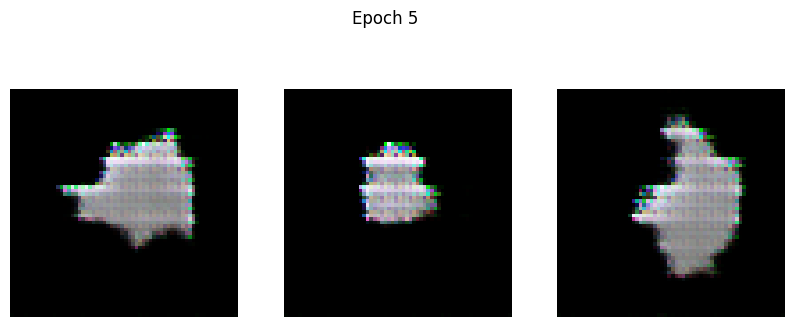

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: 0.6477 - g_loss: 0.8414
Epoch 6/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - d_loss: 0.6467 - g_loss: 0.8329

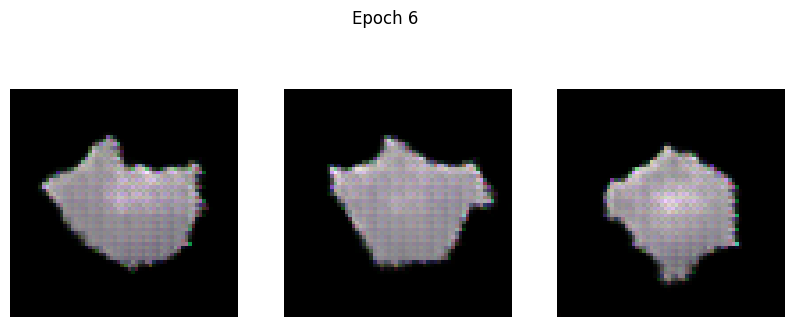

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - d_loss: 0.6467 - g_loss: 0.8331
Epoch 7/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - d_loss: 0.6575 - g_loss: 0.8409

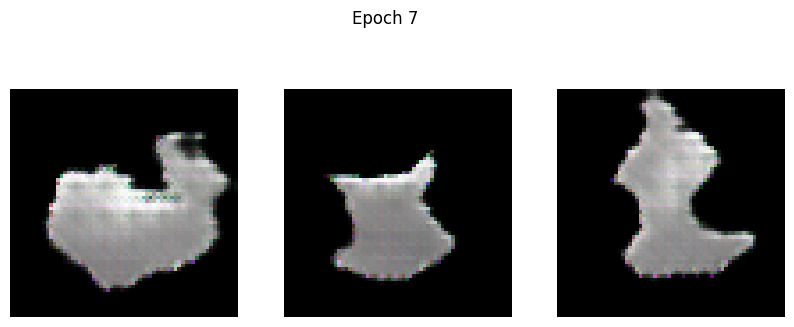

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - d_loss: 0.6576 - g_loss: 0.8406
Epoch 8/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.6481 - g_loss: 0.7596

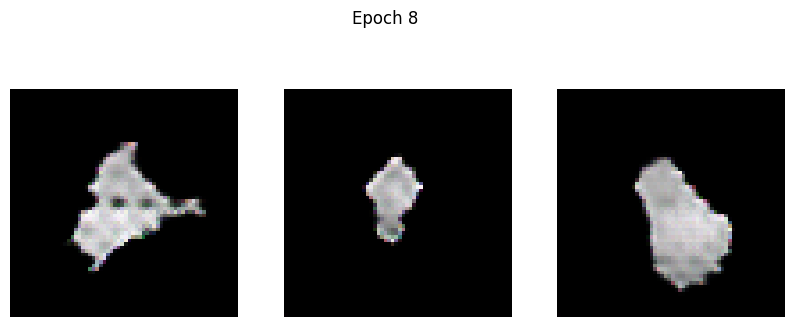

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.6481 - g_loss: 0.7596
Epoch 9/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6397 - g_loss: 0.7804

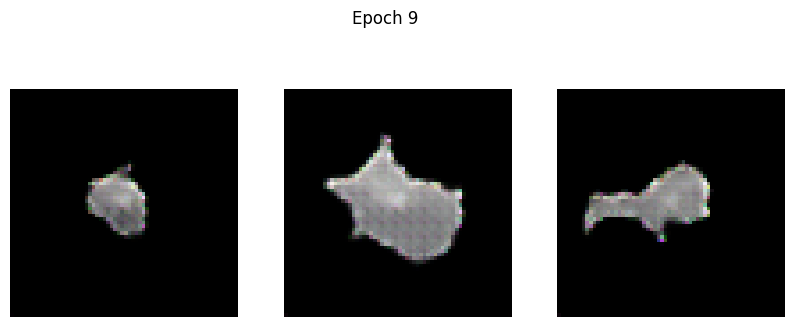

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6398 - g_loss: 0.7803
Epoch 10/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6501 - g_loss: 0.7840

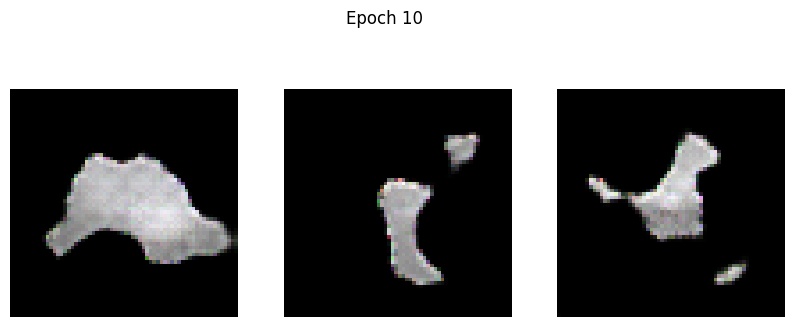

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.6501 - g_loss: 0.7840
Epoch 11/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6397 - g_loss: 0.7791

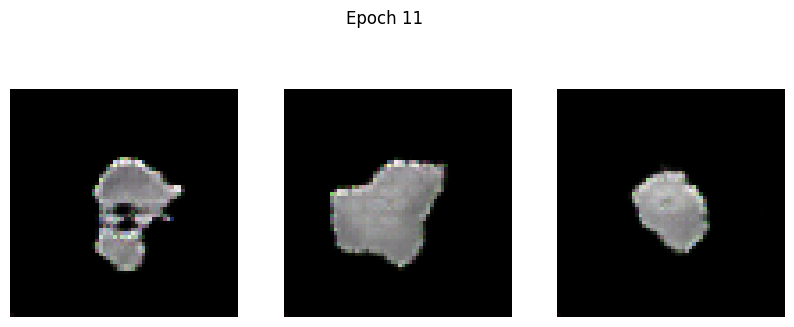

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.6397 - g_loss: 0.7792
Epoch 12/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6315 - g_loss: 0.8266

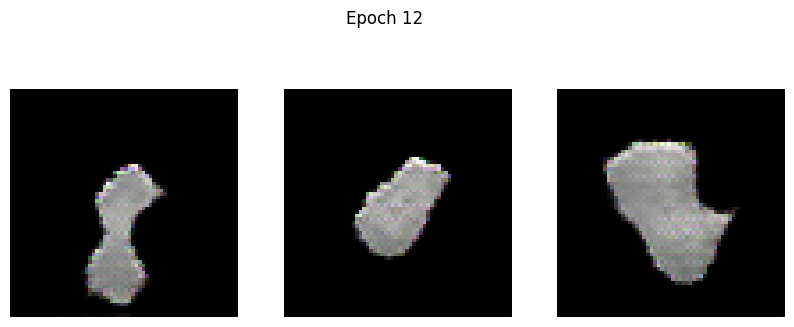

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.6315 - g_loss: 0.8265
Epoch 13/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6274 - g_loss: 0.8124

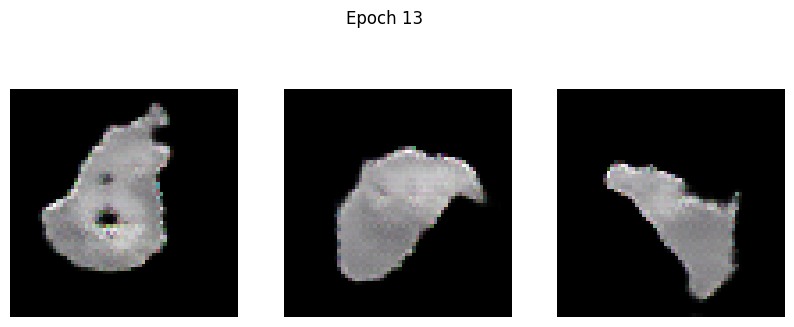

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.6273 - g_loss: 0.8126
Epoch 14/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6273 - g_loss: 0.8817

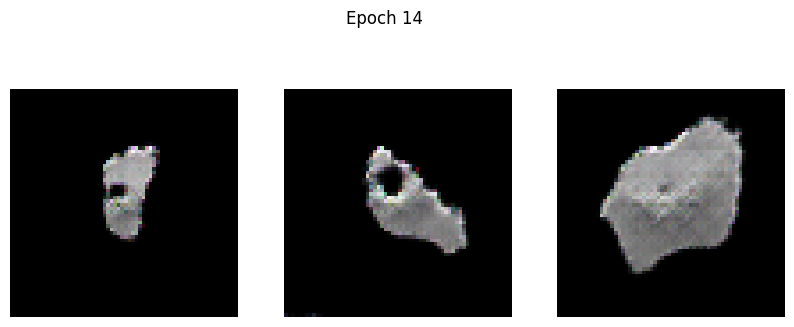

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6272 - g_loss: 0.8818
Epoch 15/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6075 - g_loss: 0.8762

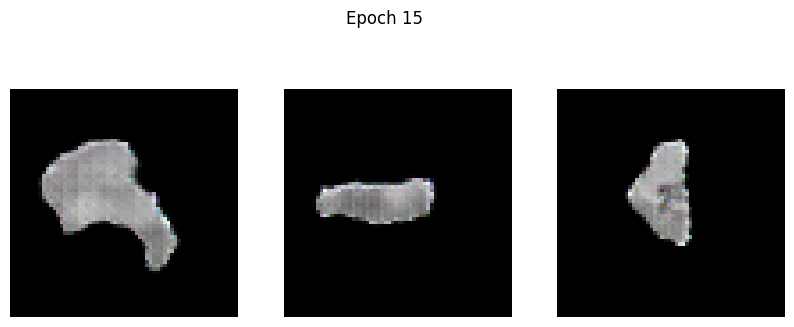

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6074 - g_loss: 0.8762
Epoch 16/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6015 - g_loss: 0.9528

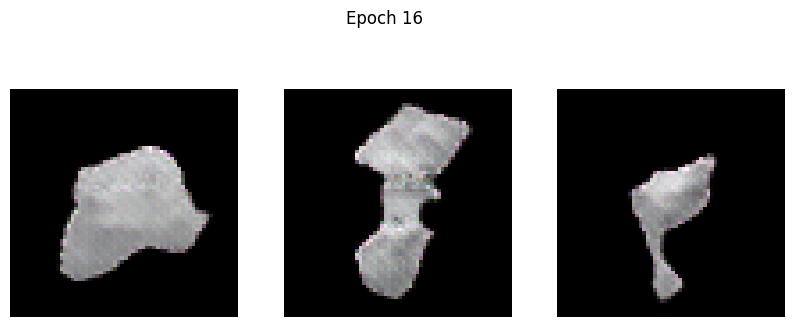

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6015 - g_loss: 0.9526
Epoch 17/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5772 - g_loss: 0.9122

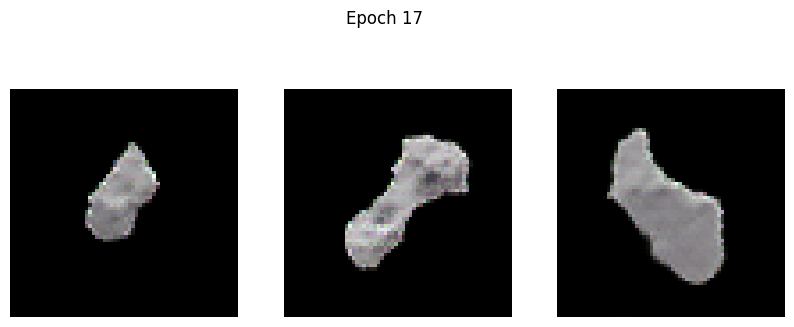

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5772 - g_loss: 0.9123
Epoch 18/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5641 - g_loss: 0.9709

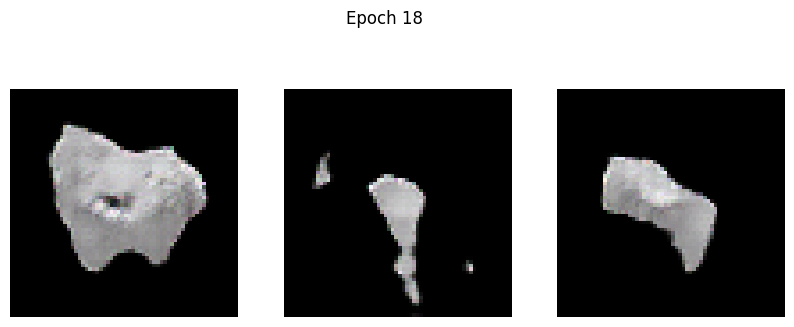

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.5641 - g_loss: 0.9709
Epoch 19/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5586 - g_loss: 0.9913

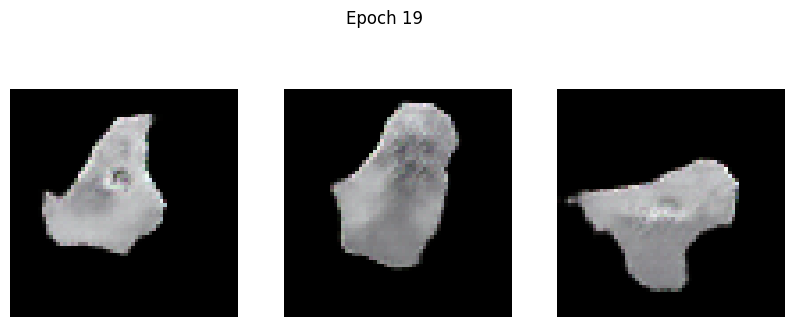

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.5586 - g_loss: 0.9914
Epoch 20/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5496 - g_loss: 1.0593

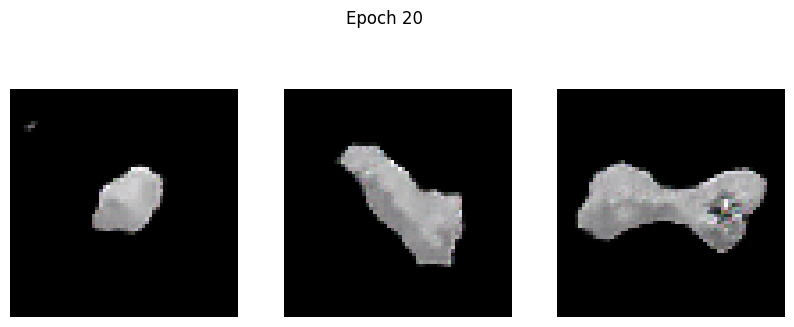

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5498 - g_loss: 1.0595
Epoch 21/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5277 - g_loss: 1.0189

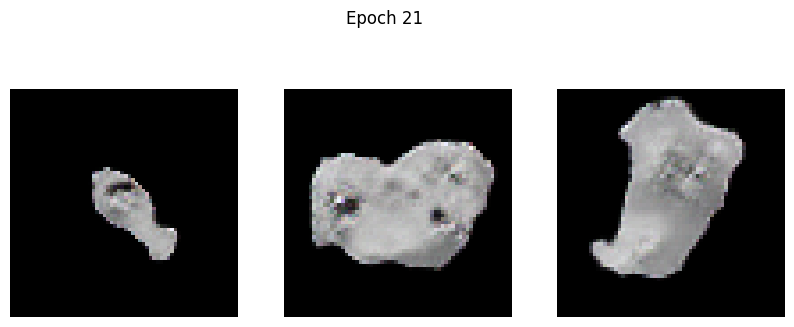

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5277 - g_loss: 1.0190
Epoch 22/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5247 - g_loss: 1.0615

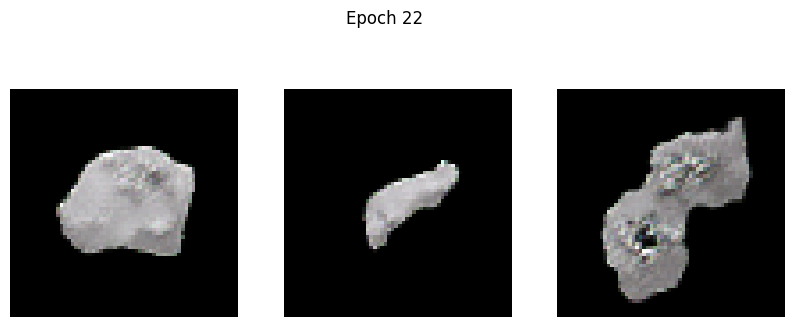

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5247 - g_loss: 1.0620
Epoch 23/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5036 - g_loss: 1.1210

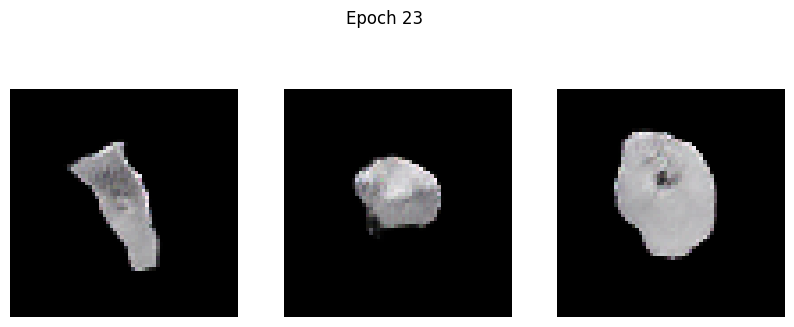

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5037 - g_loss: 1.1211
Epoch 24/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5031 - g_loss: 1.1476

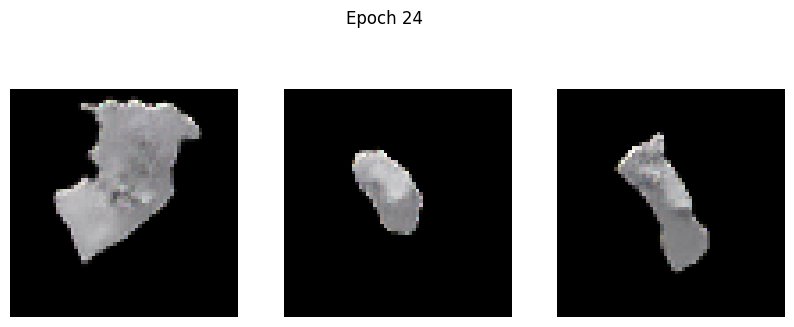

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5031 - g_loss: 1.1477
Epoch 25/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4863 - g_loss: 1.2242

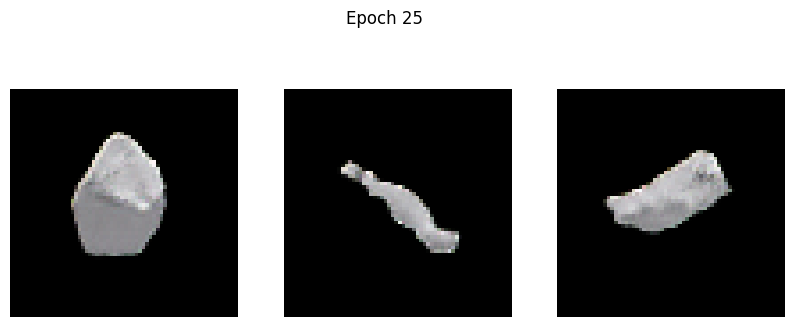

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4863 - g_loss: 1.2242
Epoch 26/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5030 - g_loss: 1.2476

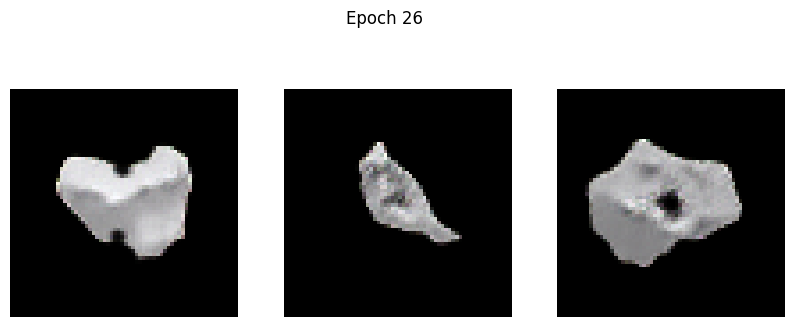

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5029 - g_loss: 1.2474
Epoch 27/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4568 - g_loss: 1.2677

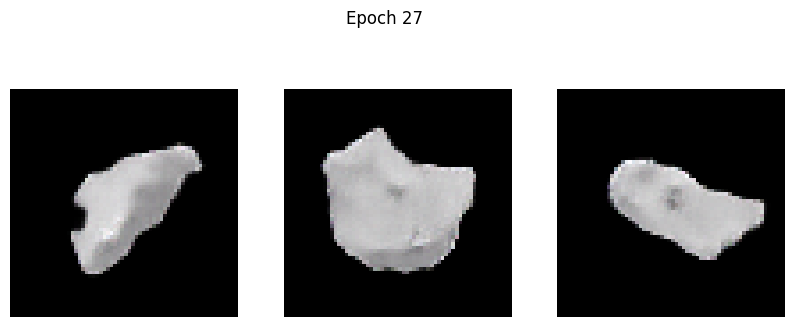

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4568 - g_loss: 1.2678
Epoch 28/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4782 - g_loss: 1.3383

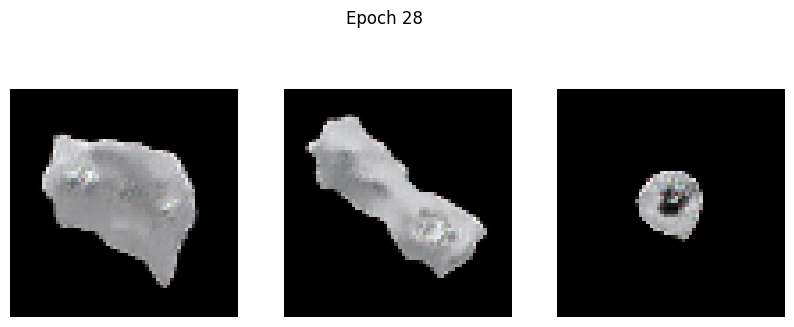

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4782 - g_loss: 1.3381
Epoch 29/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4215 - g_loss: 1.3231

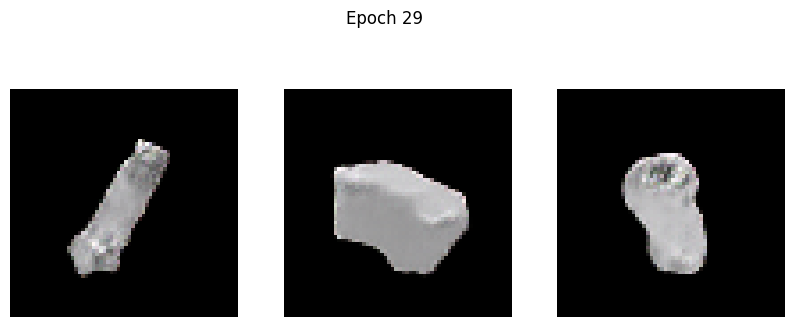

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4216 - g_loss: 1.3233
Epoch 30/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4271 - g_loss: 1.4401

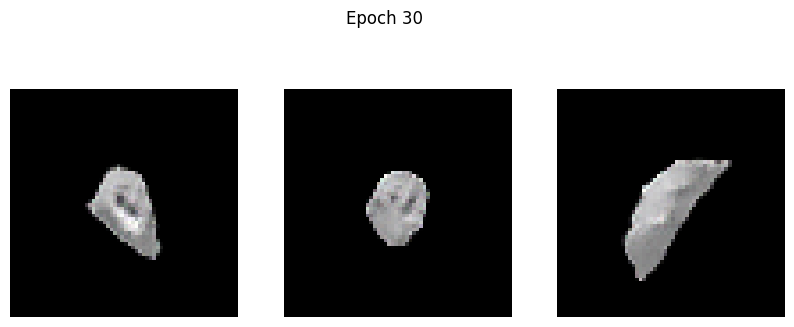

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4272 - g_loss: 1.4399
Epoch 31/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4178 - g_loss: 1.4451

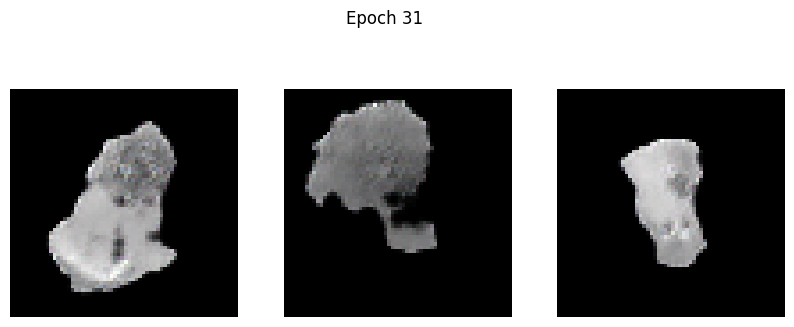

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4182 - g_loss: 1.4450
Epoch 32/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4055 - g_loss: 1.3646

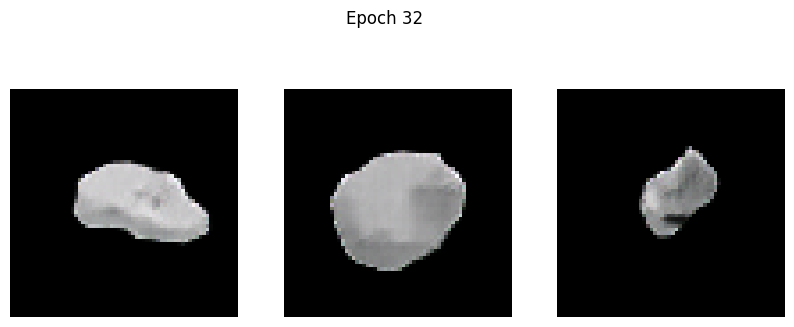

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4057 - g_loss: 1.3652
Epoch 33/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4134 - g_loss: 1.5250

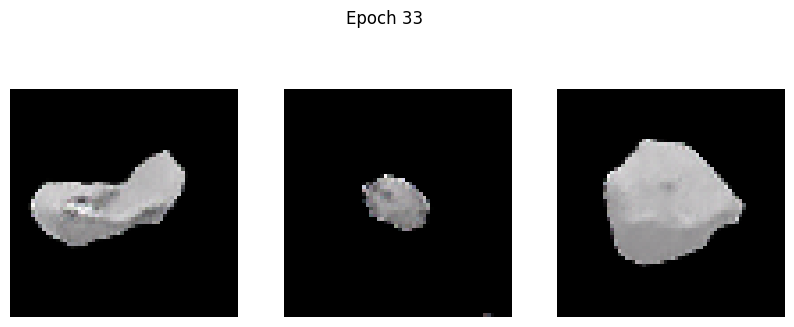

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4135 - g_loss: 1.5248
Epoch 34/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3744 - g_loss: 1.4251

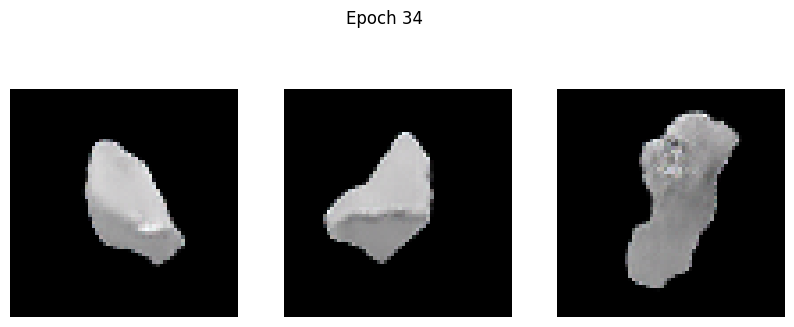

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3745 - g_loss: 1.4255
Epoch 35/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4280 - g_loss: 1.5551

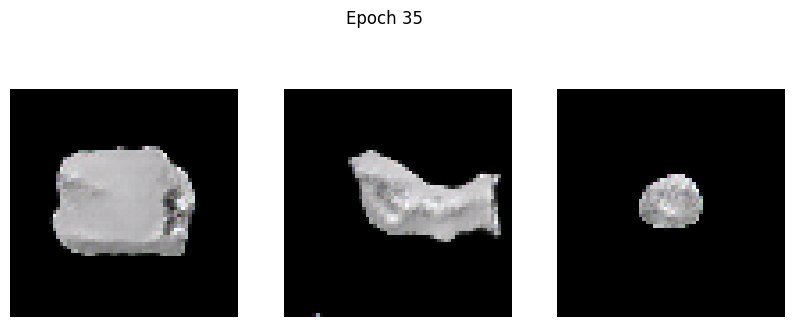

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4279 - g_loss: 1.5550
Epoch 36/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3785 - g_loss: 1.5408

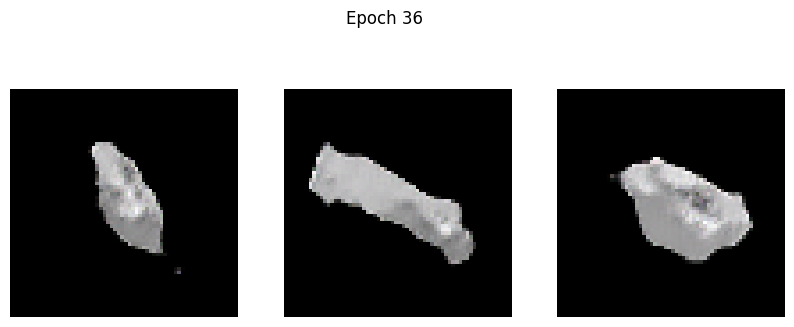

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3786 - g_loss: 1.5408
Epoch 37/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3798 - g_loss: 1.5792

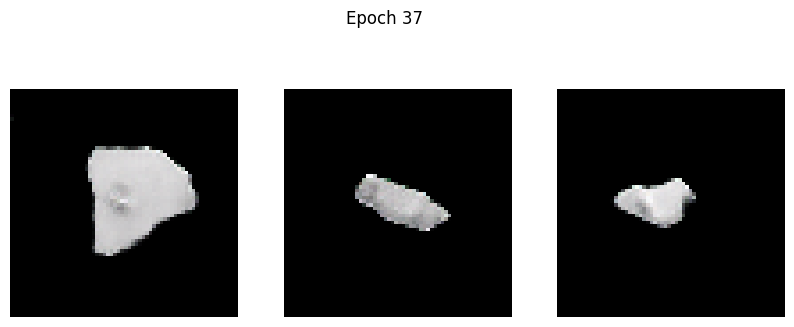

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3799 - g_loss: 1.5796
Epoch 38/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4152 - g_loss: 1.6026

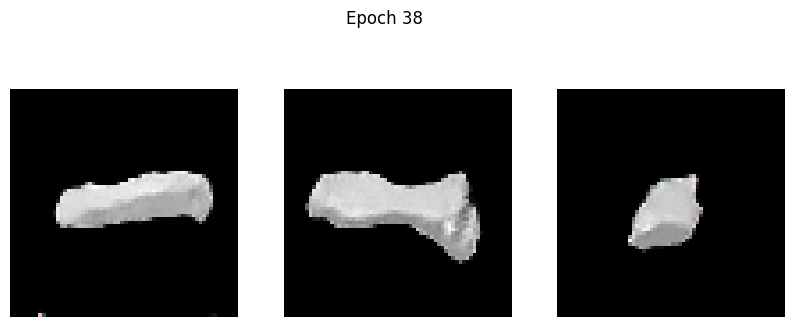

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4151 - g_loss: 1.6028
Epoch 39/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3630 - g_loss: 1.5711

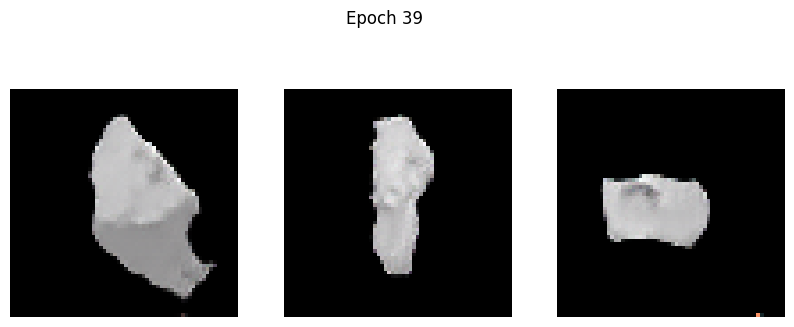

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3630 - g_loss: 1.5715
Epoch 40/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4315 - g_loss: 1.7169

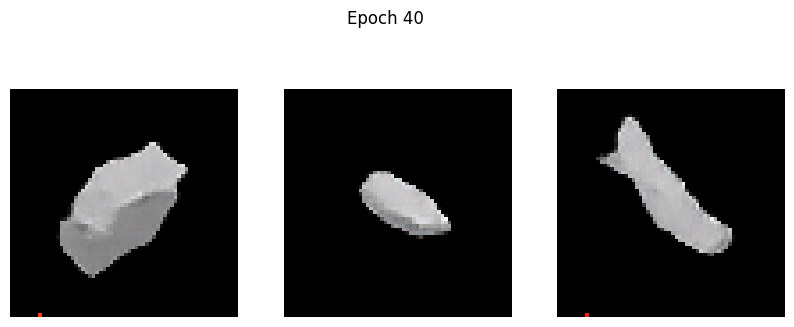

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4311 - g_loss: 1.7161
Epoch 41/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3837 - g_loss: 1.7116

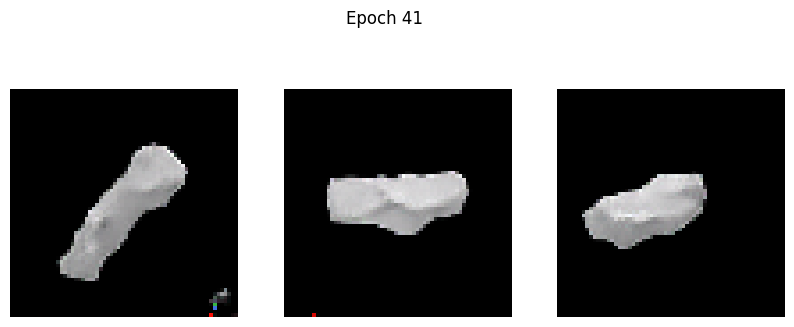

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3837 - g_loss: 1.7113
Epoch 42/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3721 - g_loss: 1.6926

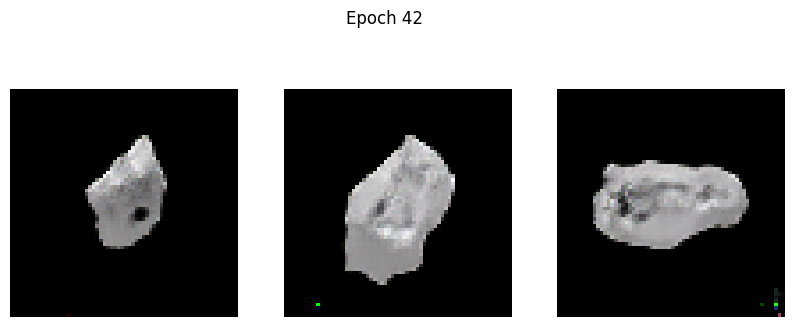

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3719 - g_loss: 1.6925
Epoch 43/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3648 - g_loss: 1.7496

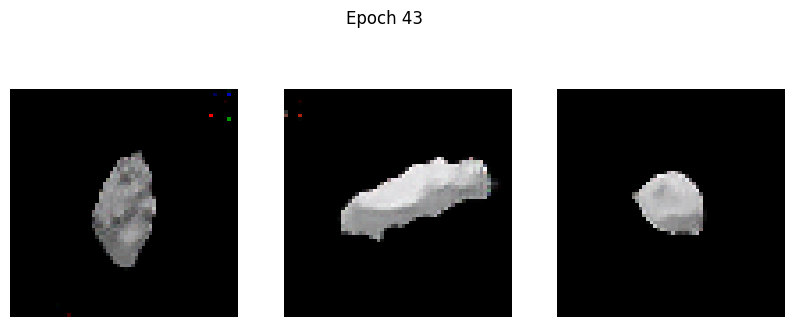

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3651 - g_loss: 1.7499
Epoch 44/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3718 - g_loss: 1.6737

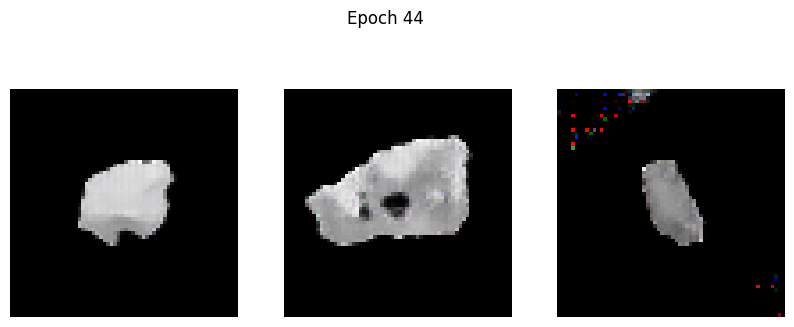

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3727 - g_loss: 1.6744
Epoch 45/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3733 - g_loss: 1.4559

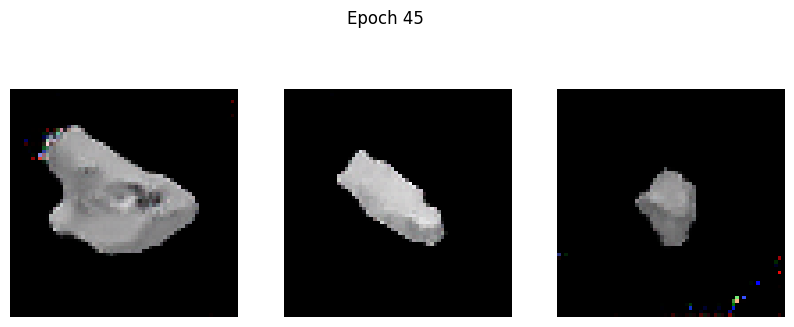

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3732 - g_loss: 1.4565
Epoch 46/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4491 - g_loss: 1.7269

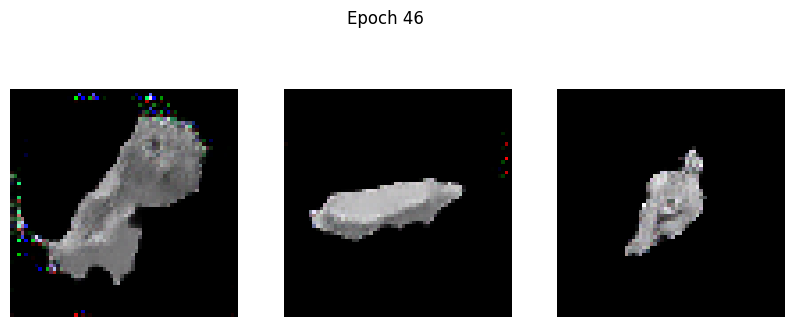

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4489 - g_loss: 1.7266
Epoch 47/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3683 - g_loss: 1.6298

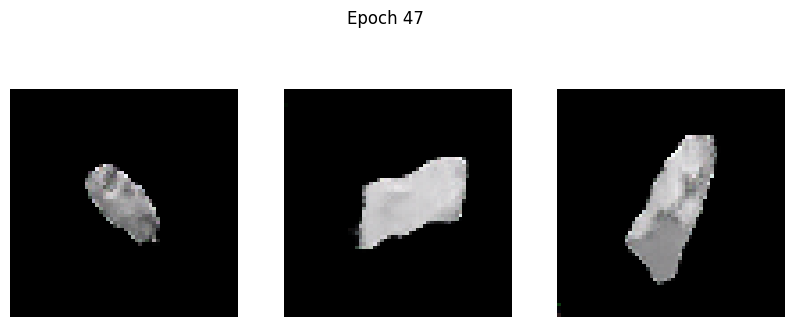

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3684 - g_loss: 1.6298
Epoch 48/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3344 - g_loss: 1.6897

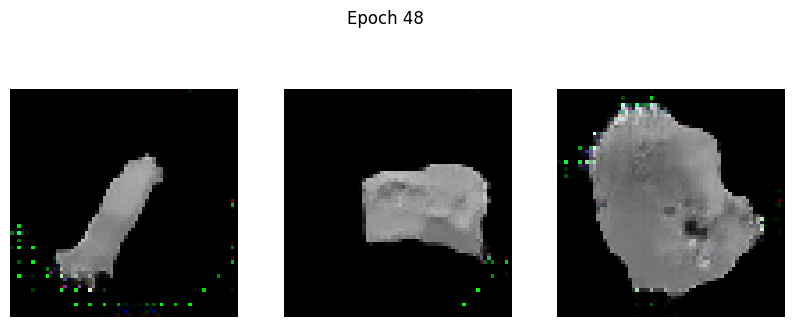

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3345 - g_loss: 1.6896
Epoch 49/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3832 - g_loss: 1.7975

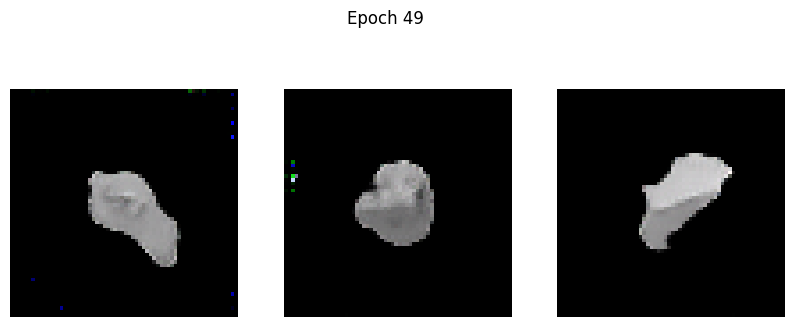

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3832 - g_loss: 1.7972
Epoch 50/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3323 - g_loss: 1.7109

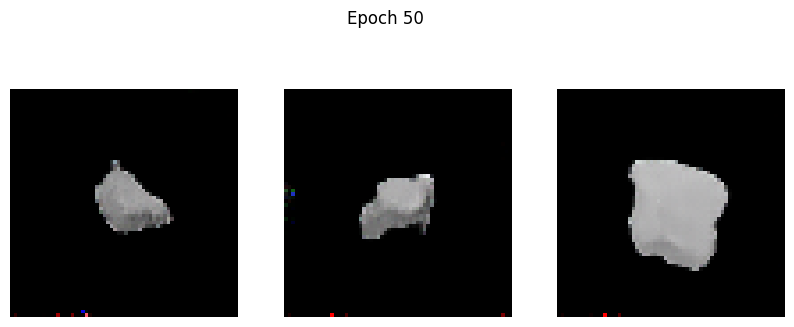

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3327 - g_loss: 1.7120
Epoch 51/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3226 - g_loss: 1.6595

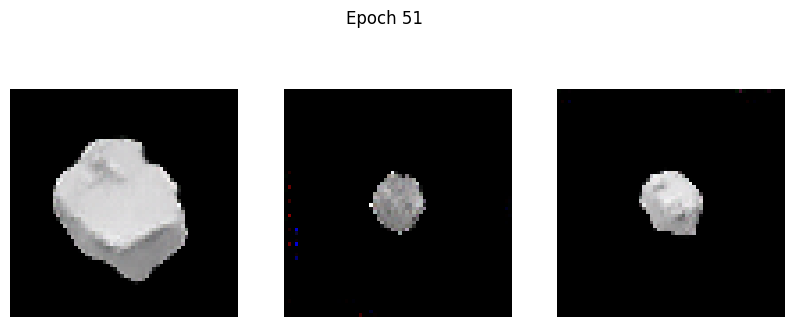

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3226 - g_loss: 1.6598
Epoch 52/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3515 - g_loss: 1.8301

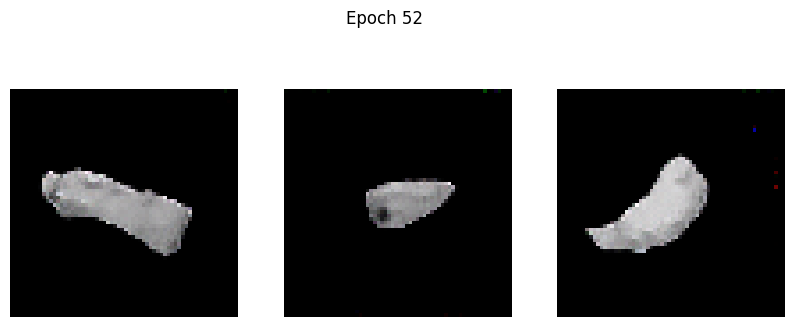

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3517 - g_loss: 1.8304
Epoch 53/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3590 - g_loss: 1.8050

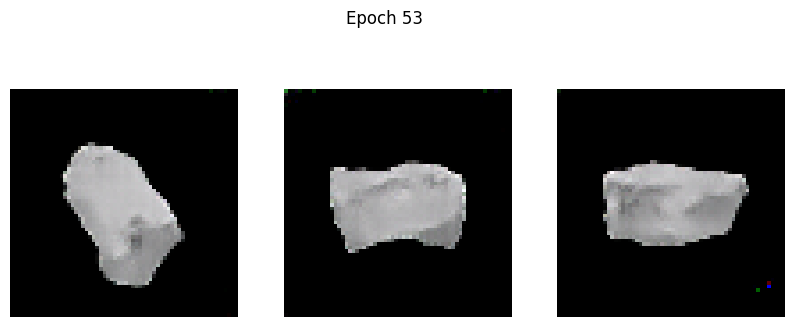

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3588 - g_loss: 1.8049
Epoch 54/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3315 - g_loss: 1.8248

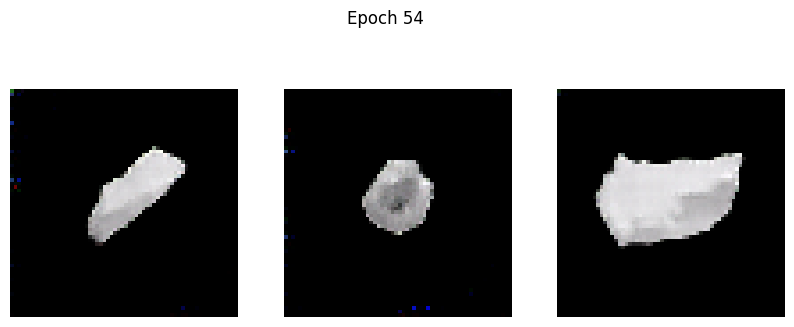

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3315 - g_loss: 1.8248
Epoch 55/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3937 - g_loss: 1.8491

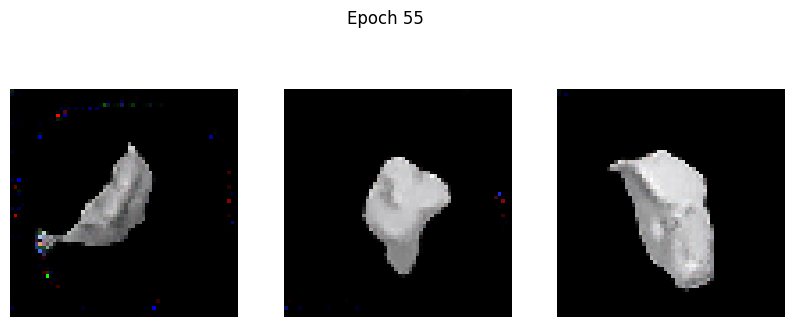

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3942 - g_loss: 1.8507
Epoch 56/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2954 - g_loss: 1.6630

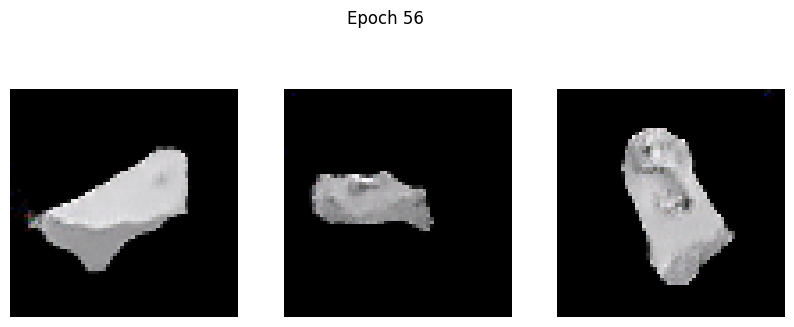

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2953 - g_loss: 1.6633
Epoch 57/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3033 - g_loss: 1.8493

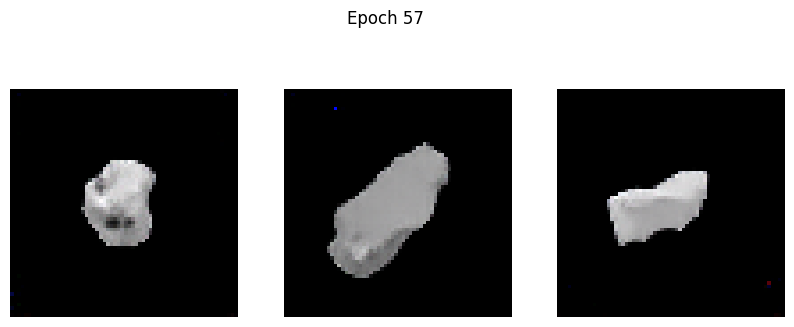

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3035 - g_loss: 1.8494
Epoch 58/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3220 - g_loss: 1.8803

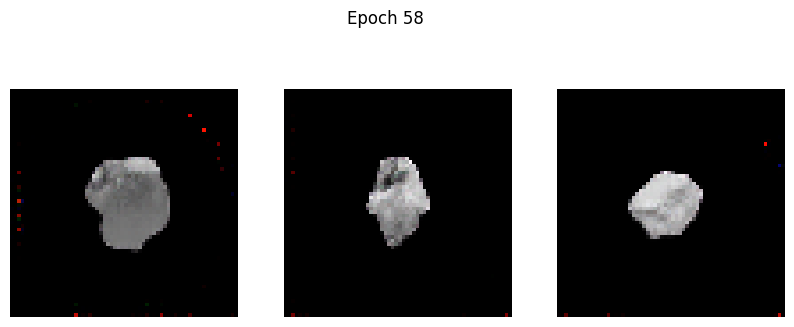

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3221 - g_loss: 1.8802
Epoch 59/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3665 - g_loss: 1.9065

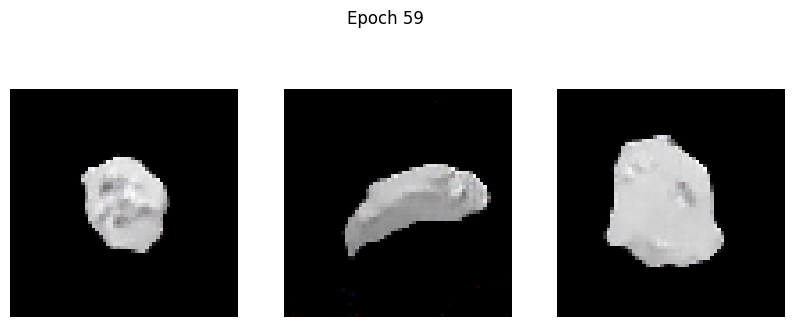

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3662 - g_loss: 1.9064
Epoch 60/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2889 - g_loss: 1.9118

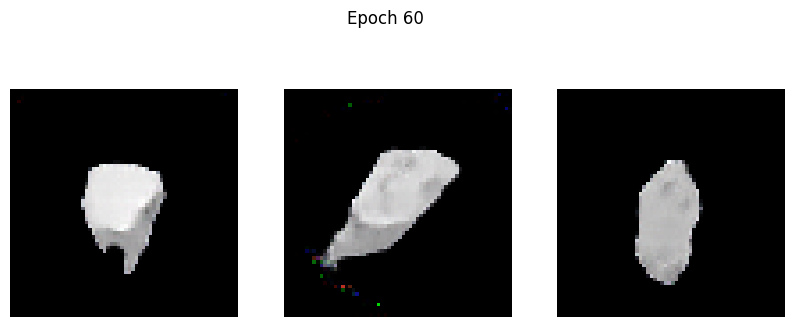

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2890 - g_loss: 1.9119
Epoch 61/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4027 - g_loss: 1.9988

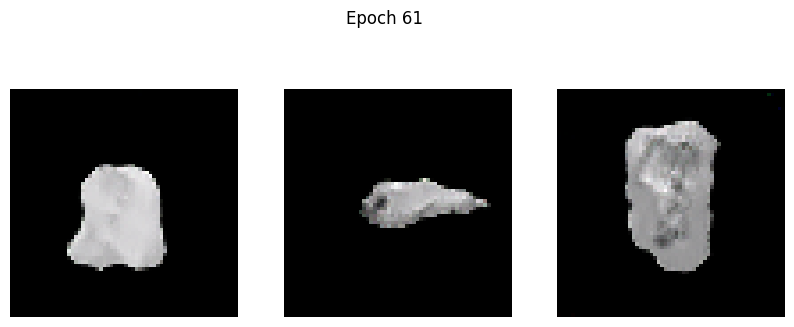

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4022 - g_loss: 1.9980
Epoch 62/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3055 - g_loss: 1.9111

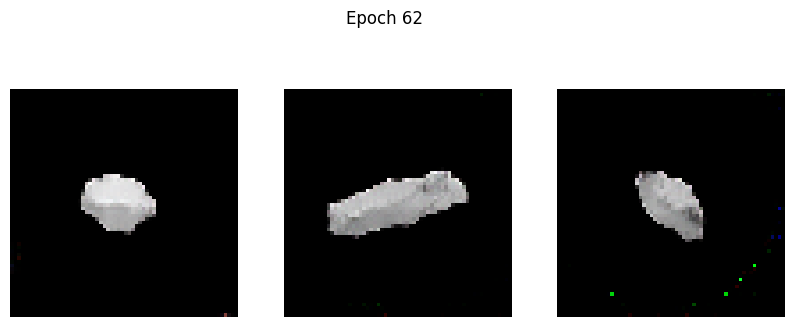

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3055 - g_loss: 1.9111
Epoch 63/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3121 - g_loss: 1.9677

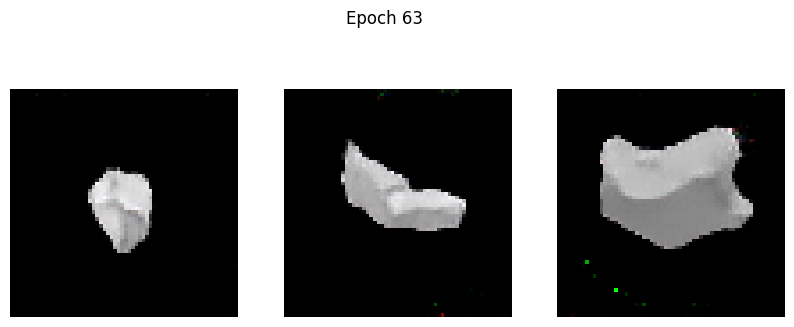

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3122 - g_loss: 1.9677
Epoch 64/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3843 - g_loss: 2.0577

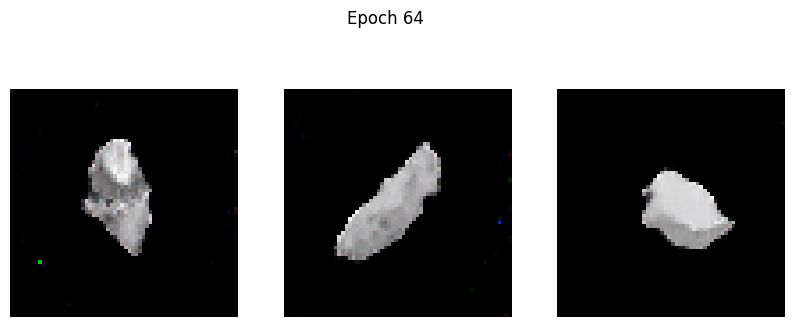

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3847 - g_loss: 2.0574
Epoch 65/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2750 - g_loss: 1.8076

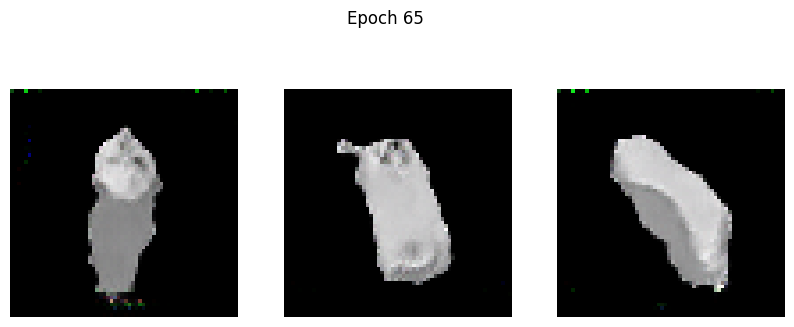

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2750 - g_loss: 1.8079
Epoch 66/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3792 - g_loss: 2.0289

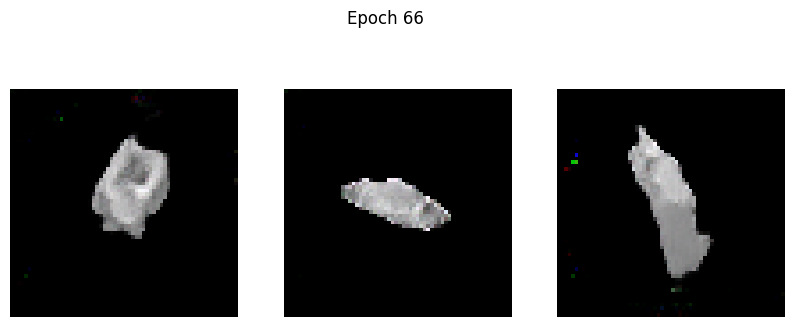

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3792 - g_loss: 2.0282
Epoch 67/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2765 - g_loss: 1.8573

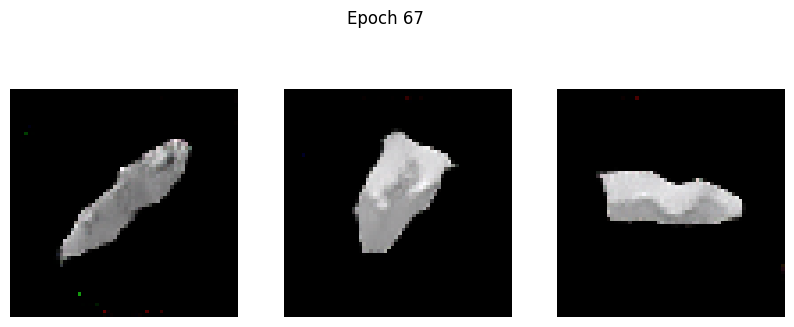

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2766 - g_loss: 1.8579
Epoch 68/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2850 - g_loss: 1.9725

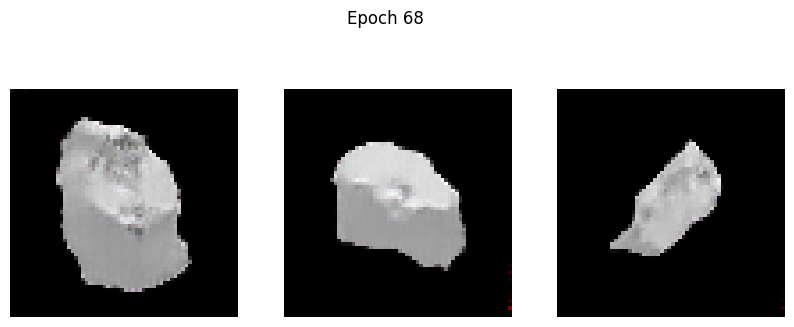

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2852 - g_loss: 1.9725
Epoch 69/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2939 - g_loss: 1.9614

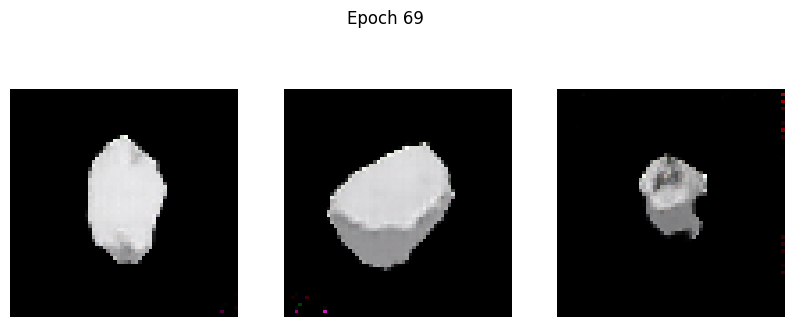

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2938 - g_loss: 1.9620
Epoch 70/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2786 - g_loss: 2.0749

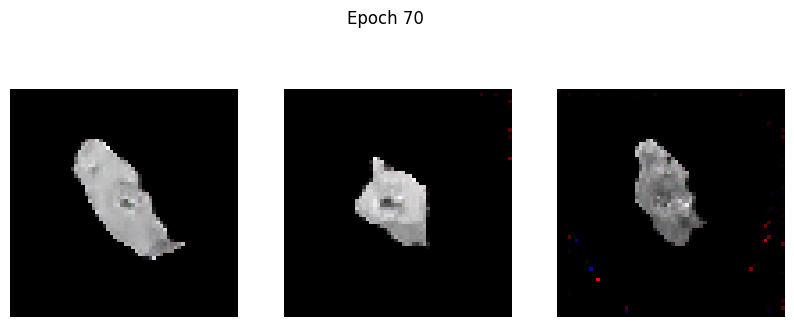

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2786 - g_loss: 2.0747
Epoch 71/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2890 - g_loss: 2.0290

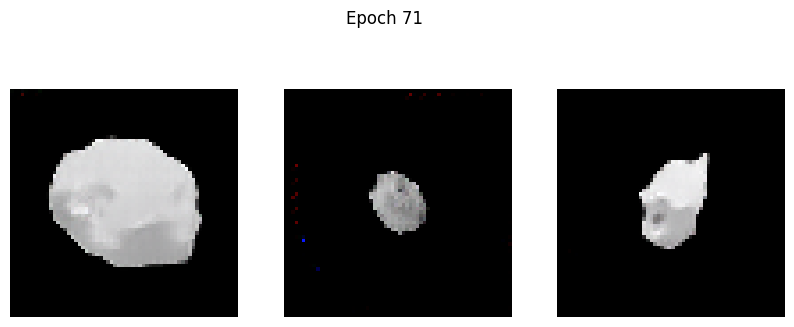

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2891 - g_loss: 2.0291
Epoch 72/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2806 - g_loss: 2.0586

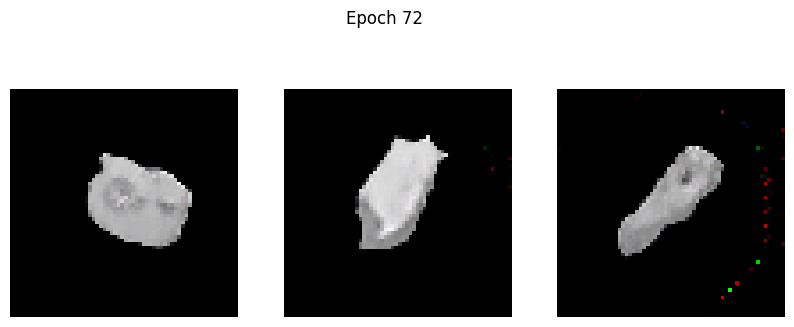

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2805 - g_loss: 2.0585
Epoch 73/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.4366 - g_loss: 2.2610

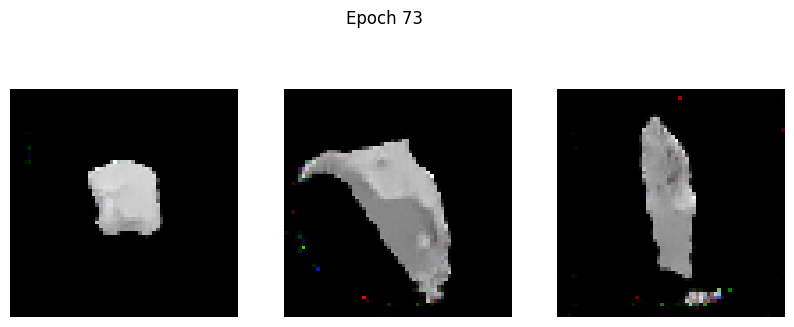

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.4361 - g_loss: 2.2598
Epoch 74/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2485 - g_loss: 2.0299

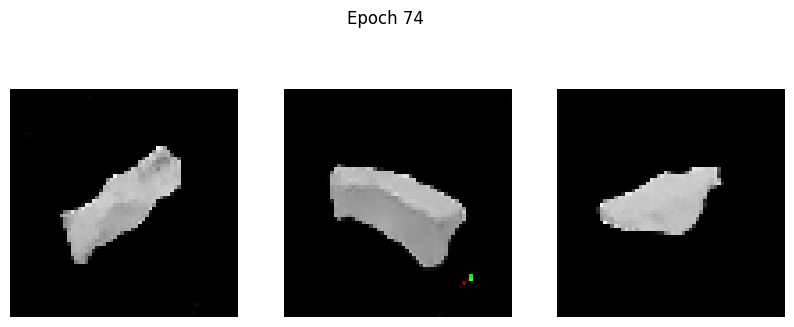

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2487 - g_loss: 2.0303
Epoch 75/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2933 - g_loss: 2.0912

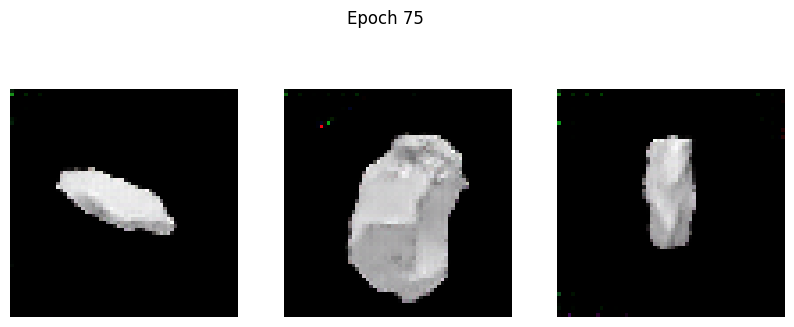

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2934 - g_loss: 2.0913
Epoch 76/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2925 - g_loss: 2.1447

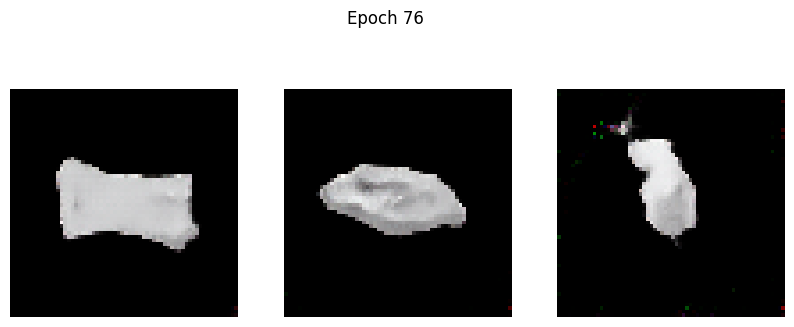

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2924 - g_loss: 2.1441
Epoch 77/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2760 - g_loss: 2.1551

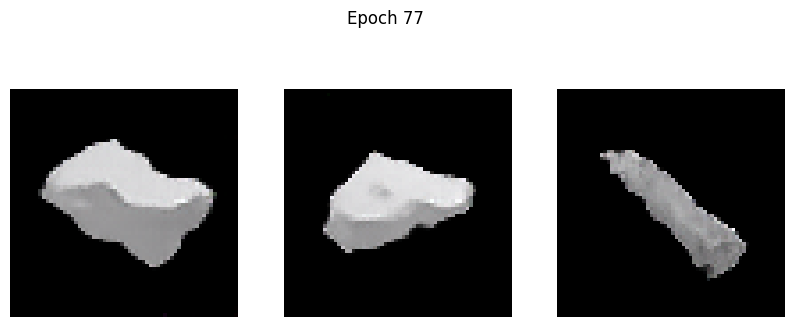

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2760 - g_loss: 2.1551
Epoch 78/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2701 - g_loss: 2.1152

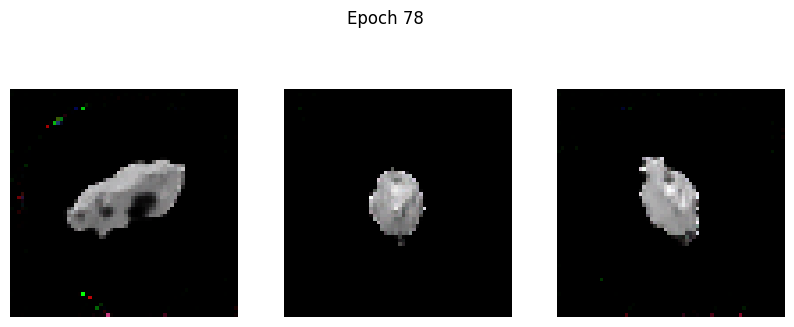

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2701 - g_loss: 2.1156
Epoch 79/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2965 - g_loss: 2.2255

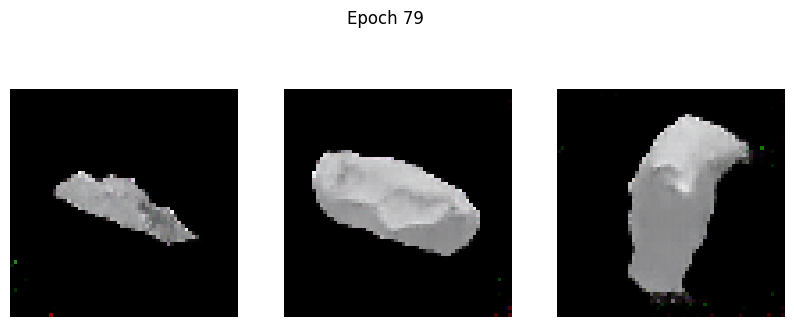

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2966 - g_loss: 2.2251
Epoch 80/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2892 - g_loss: 2.2118

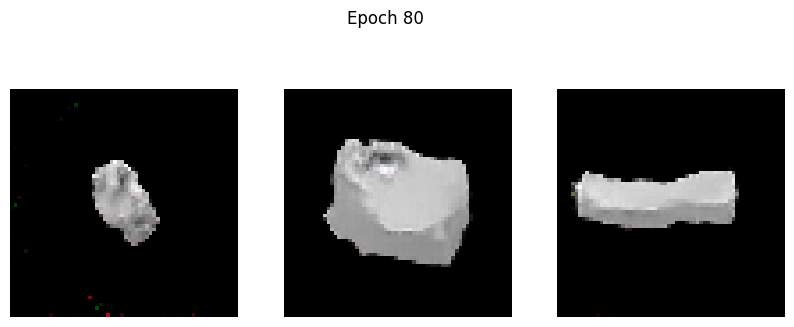

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2894 - g_loss: 2.2115
Epoch 81/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2557 - g_loss: 2.1574

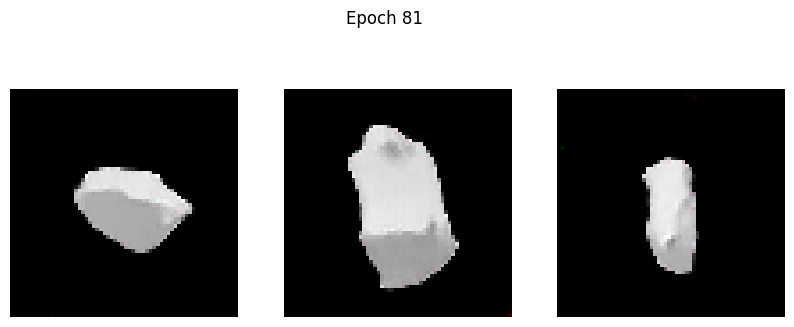

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2558 - g_loss: 2.1574
Epoch 82/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2723 - g_loss: 2.2509

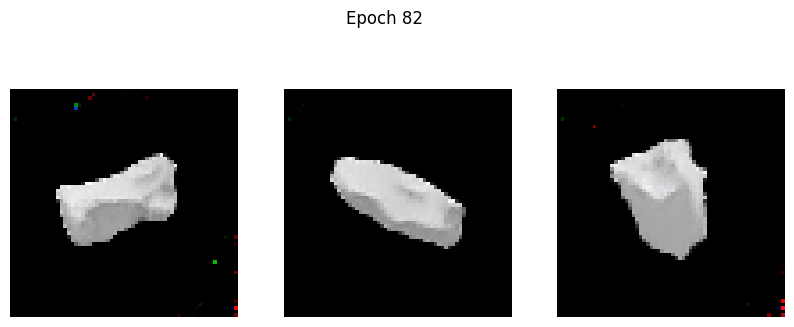

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2725 - g_loss: 2.2508
Epoch 83/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2468 - g_loss: 2.2086

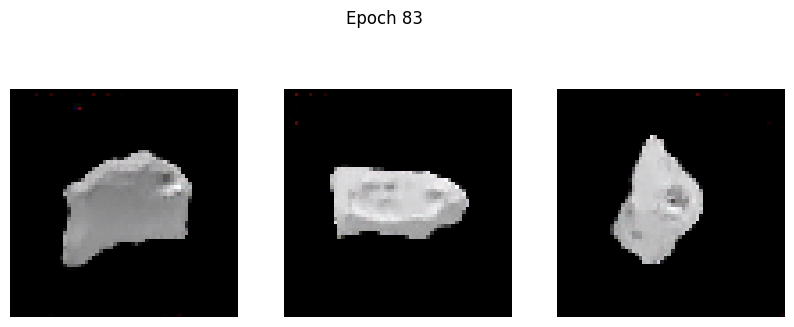

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2469 - g_loss: 2.2090
Epoch 84/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3443 - g_loss: 2.3176

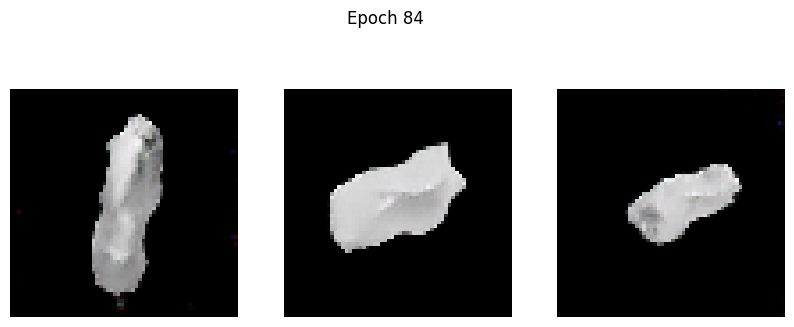

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3436 - g_loss: 2.3165
Epoch 85/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3139 - g_loss: 2.2534

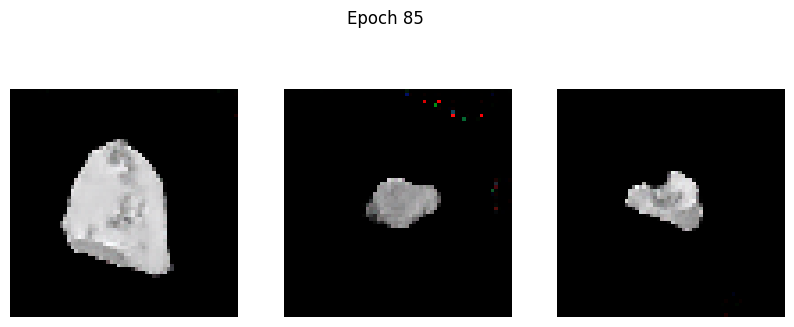

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3138 - g_loss: 2.2530
Epoch 86/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2440 - g_loss: 2.1890

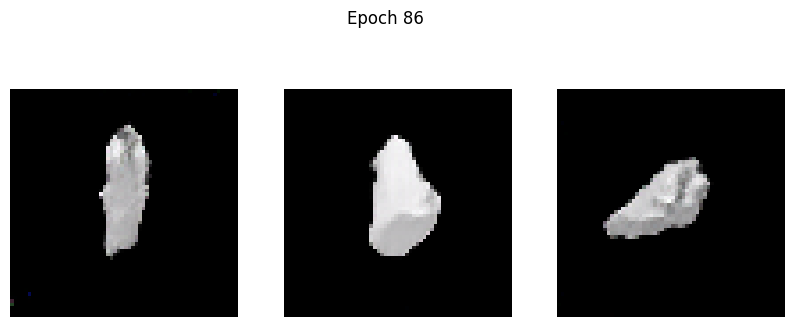

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2443 - g_loss: 2.1895
Epoch 87/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2971 - g_loss: 2.3494

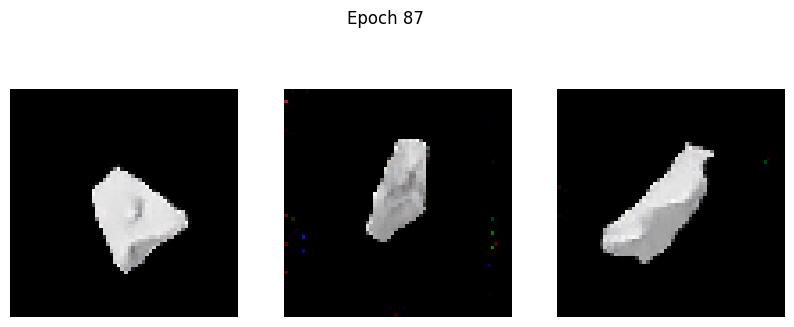

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2967 - g_loss: 2.3485
Epoch 88/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2466 - g_loss: 2.3060

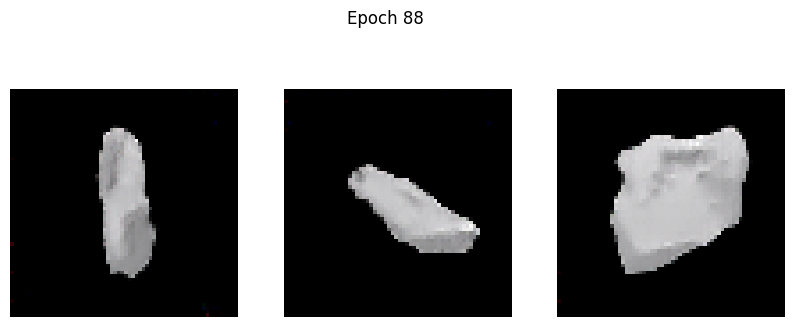

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2466 - g_loss: 2.3058
Epoch 89/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5270 - g_loss: 2.8185

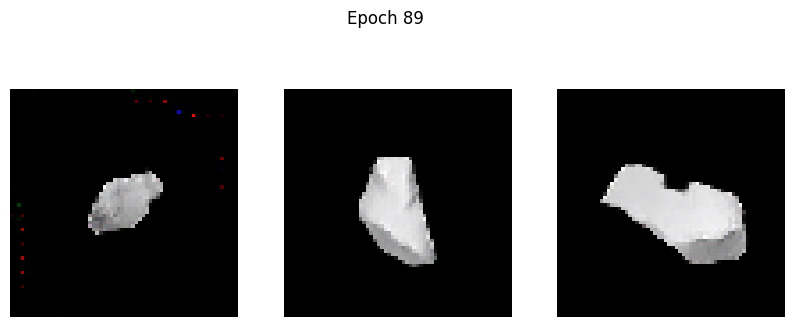

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.5267 - g_loss: 2.8166
Epoch 90/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2154 - g_loss: 2.0733

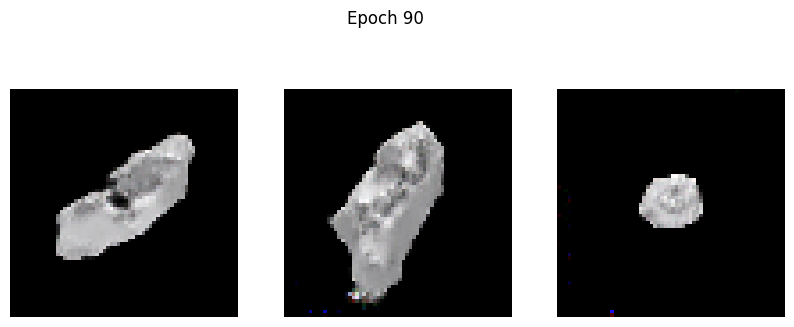

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2155 - g_loss: 2.0734
Epoch 91/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2136 - g_loss: 2.1576

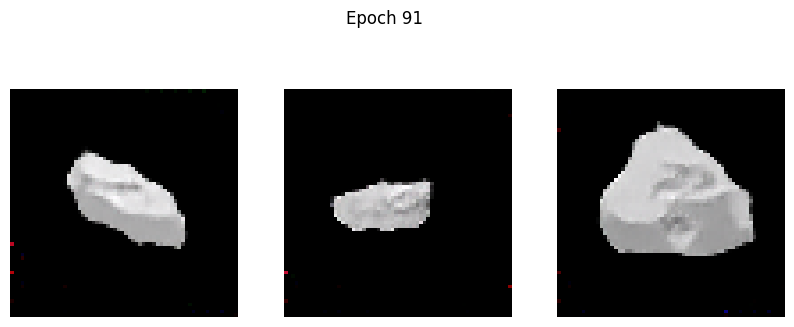

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2137 - g_loss: 2.1578
Epoch 92/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2622 - g_loss: 2.3256

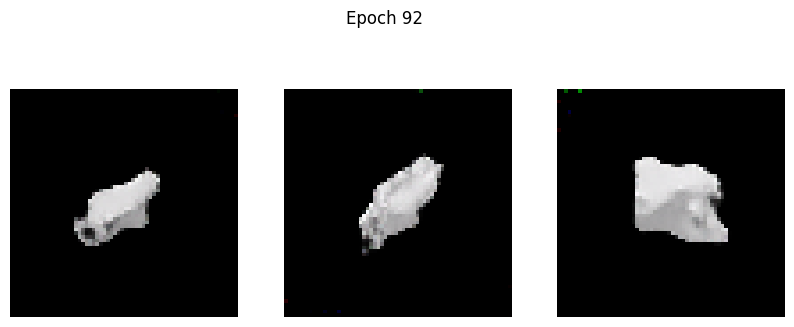

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2624 - g_loss: 2.3253
Epoch 93/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2204 - g_loss: 2.2378

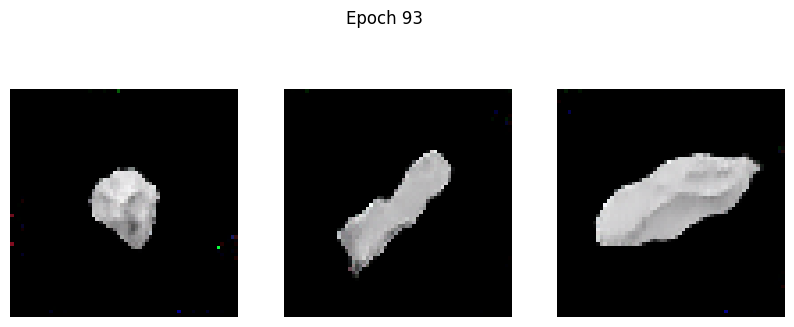

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2205 - g_loss: 2.2381
Epoch 94/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2423 - g_loss: 2.3460

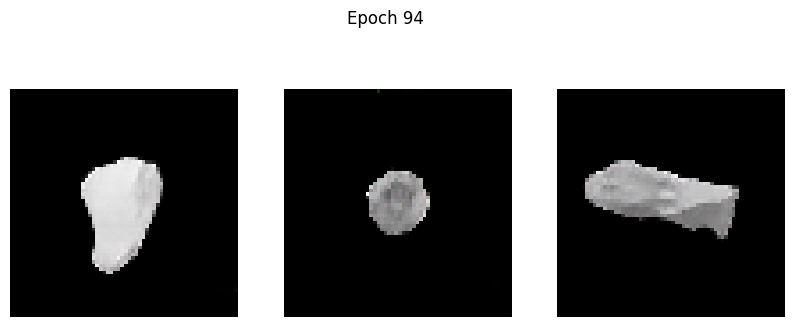

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2425 - g_loss: 2.3459
Epoch 95/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2429 - g_loss: 2.3584

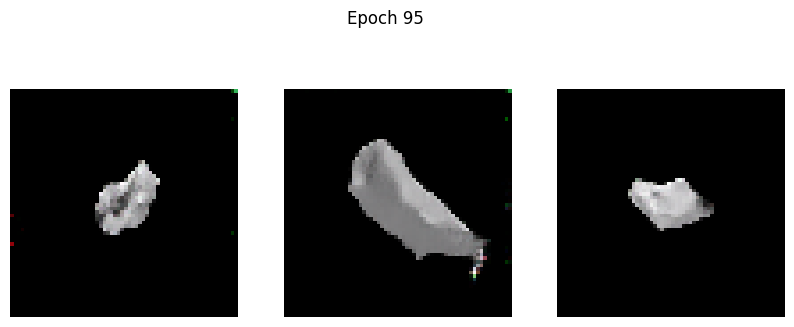

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2429 - g_loss: 2.3579
Epoch 96/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2476 - g_loss: 2.3381

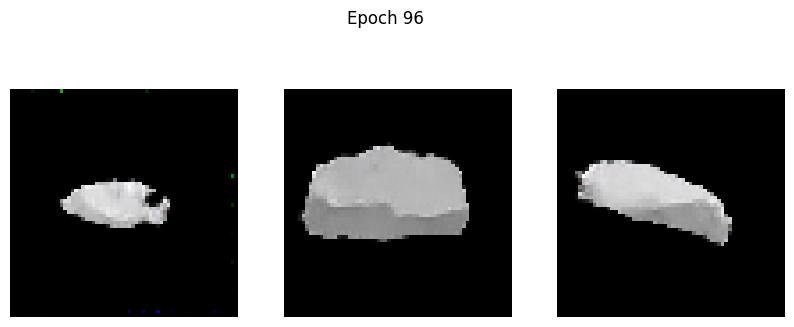

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2478 - g_loss: 2.3382
Epoch 97/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1970 - g_loss: 2.3385

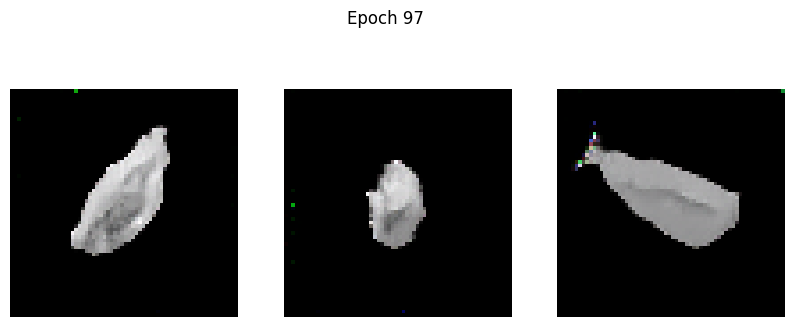

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1973 - g_loss: 2.3386
Epoch 98/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2616 - g_loss: 2.3977

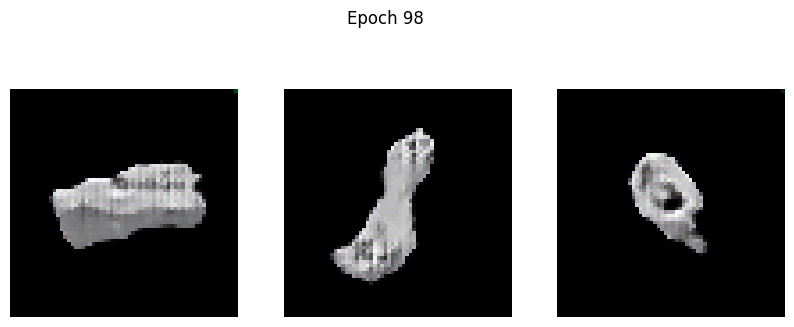

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2634 - g_loss: 2.4017
Epoch 99/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2978 - g_loss: 2.3536

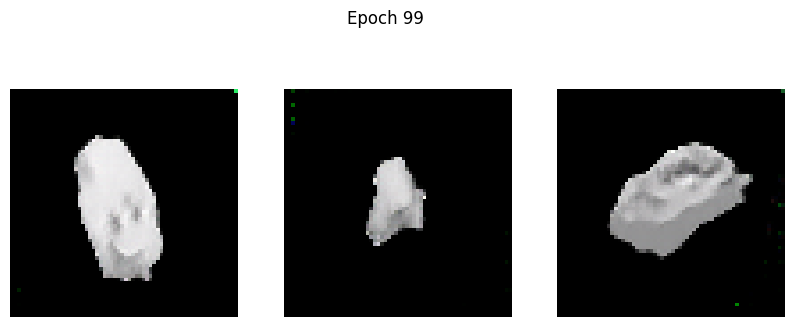

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2974 - g_loss: 2.3519
Epoch 100/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2335 - g_loss: 2.2190

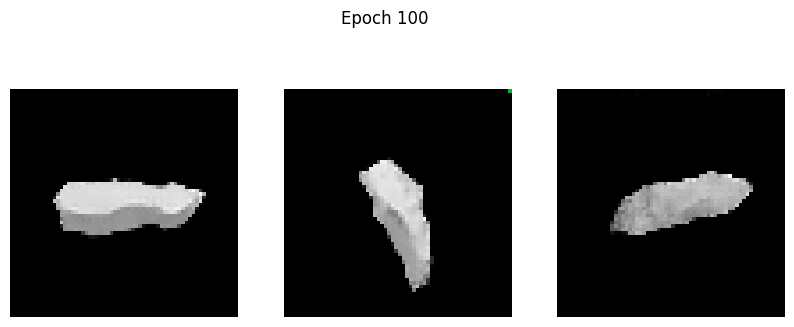

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2334 - g_loss: 2.2191
Epoch 101/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2040 - g_loss: 2.2927

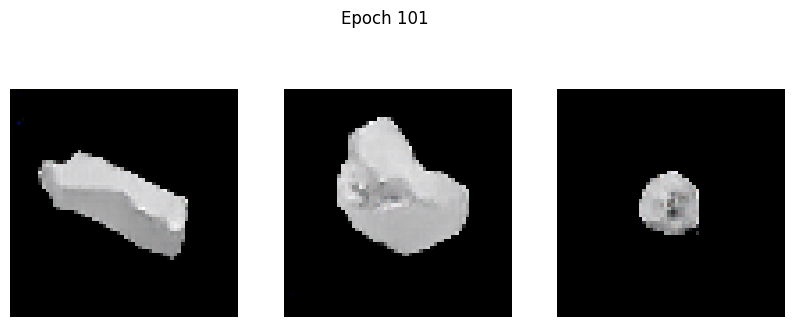

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2040 - g_loss: 2.2929
Epoch 102/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3839 - g_loss: 2.5605

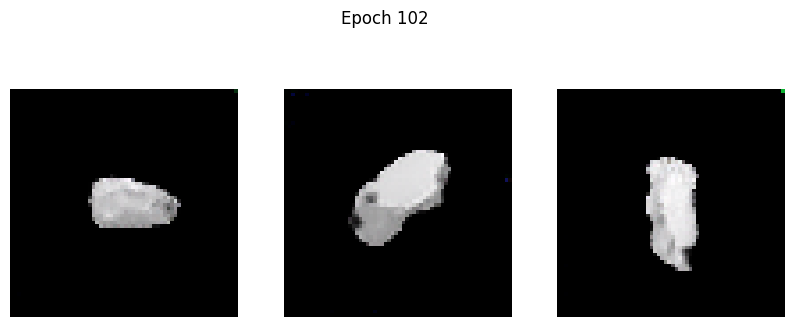

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3833 - g_loss: 2.5595
Epoch 103/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2111 - g_loss: 2.3209

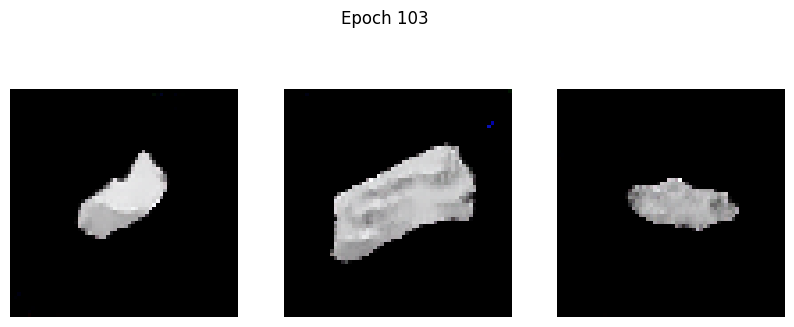

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2112 - g_loss: 2.3210
Epoch 104/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2190 - g_loss: 2.4566

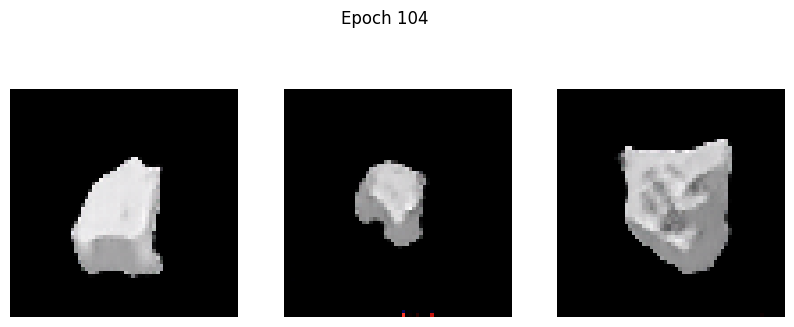

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2190 - g_loss: 2.4561
Epoch 105/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2485 - g_loss: 2.4662

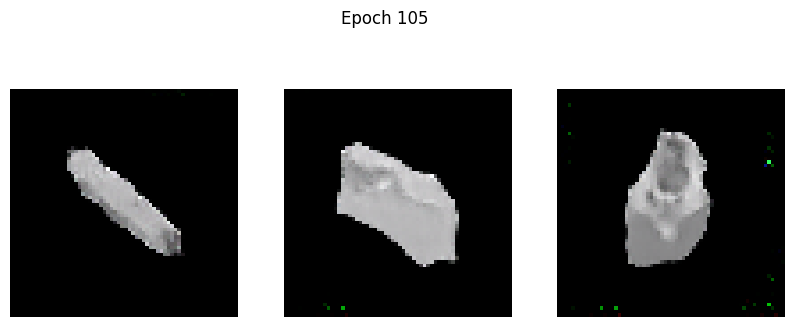

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2487 - g_loss: 2.4663
Epoch 106/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2355 - g_loss: 2.4292

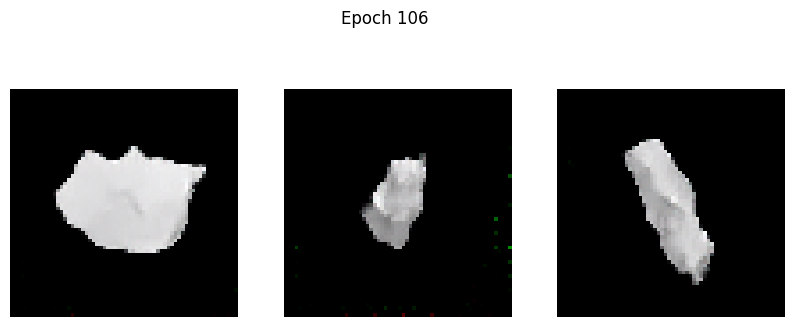

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2354 - g_loss: 2.4292
Epoch 107/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2192 - g_loss: 2.4338

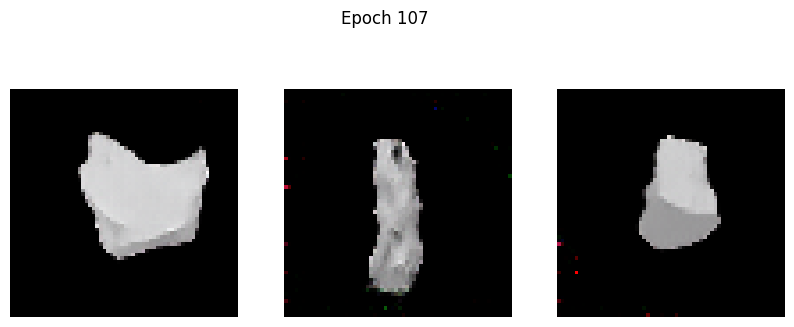

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2193 - g_loss: 2.4337
Epoch 108/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2706 - g_loss: 2.4362

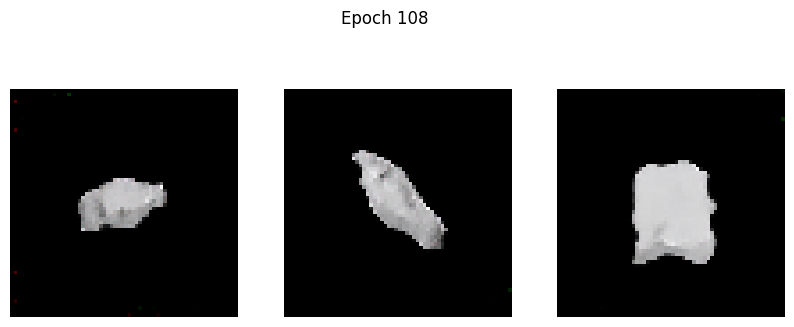

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2705 - g_loss: 2.4361
Epoch 109/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2493 - g_loss: 2.5356

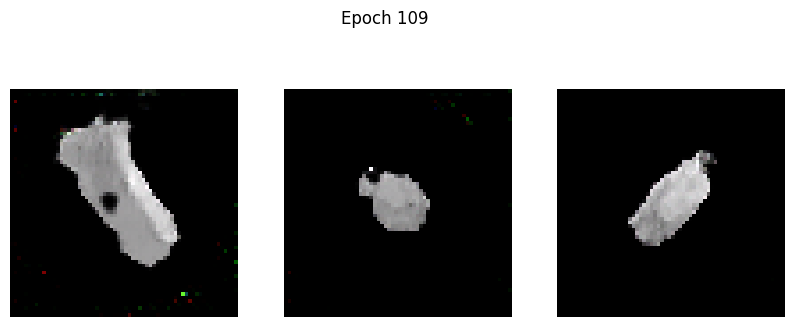

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2493 - g_loss: 2.5353
Epoch 110/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2384 - g_loss: 2.4780

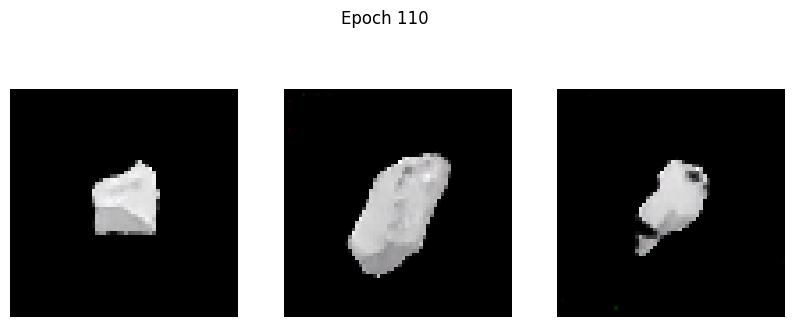

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2387 - g_loss: 2.4779
Epoch 111/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1919 - g_loss: 2.4486

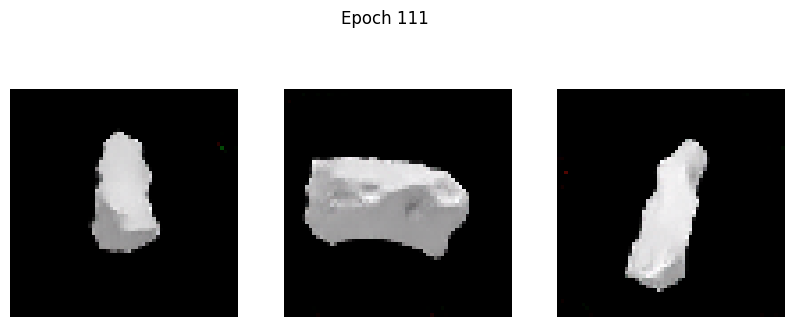

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1919 - g_loss: 2.4489
Epoch 112/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2334 - g_loss: 2.6388

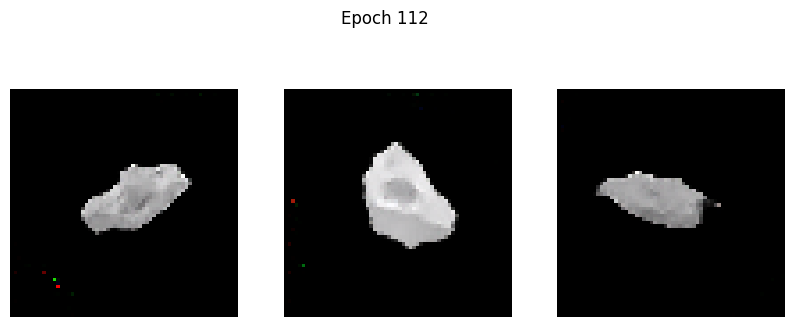

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2339 - g_loss: 2.6385
Epoch 113/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2007 - g_loss: 2.4773

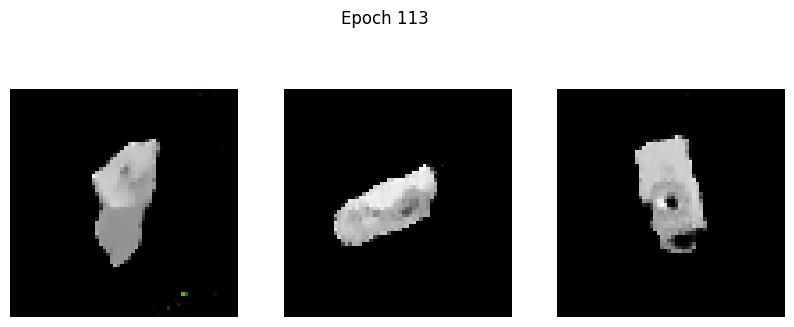

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2008 - g_loss: 2.4771
Epoch 114/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2168 - g_loss: 2.5423

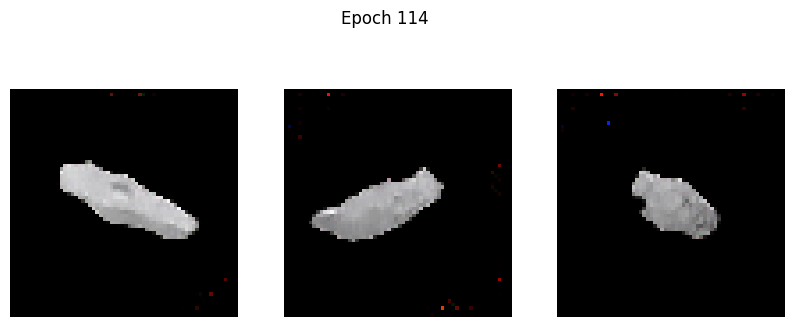

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2172 - g_loss: 2.5429
Epoch 115/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2420 - g_loss: 2.4022

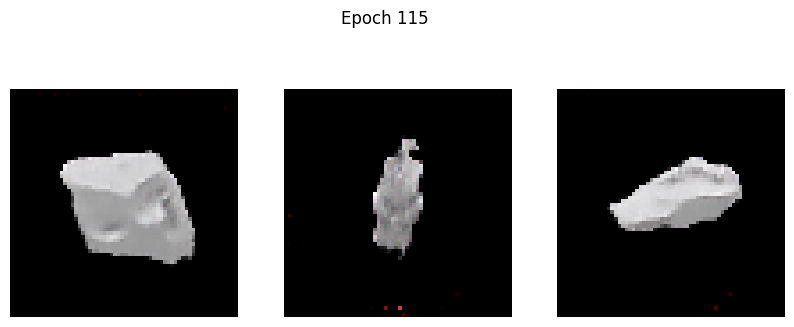

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2417 - g_loss: 2.4022
Epoch 116/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1764 - g_loss: 2.5515

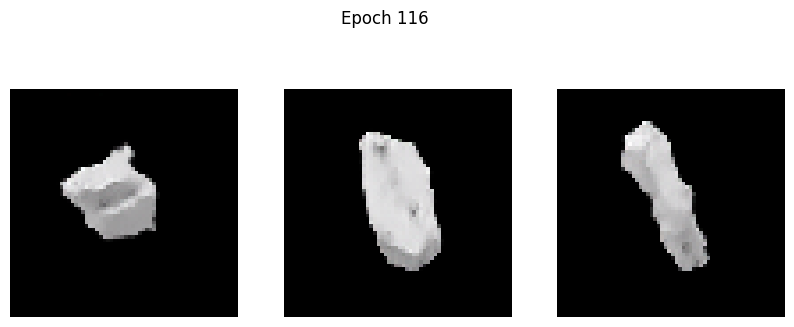

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1767 - g_loss: 2.5513
Epoch 117/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1777 - g_loss: 2.5520

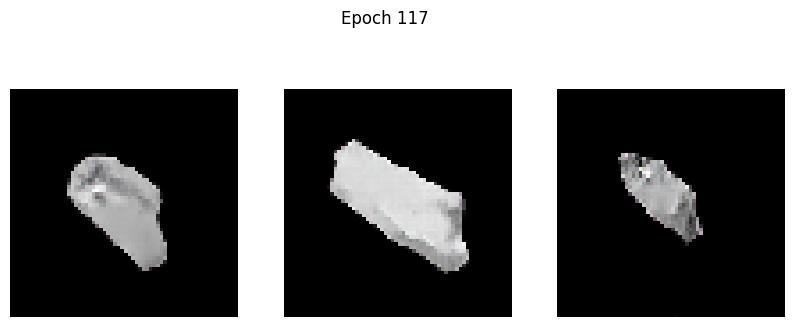

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1780 - g_loss: 2.5522
Epoch 118/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2532 - g_loss: 2.6245

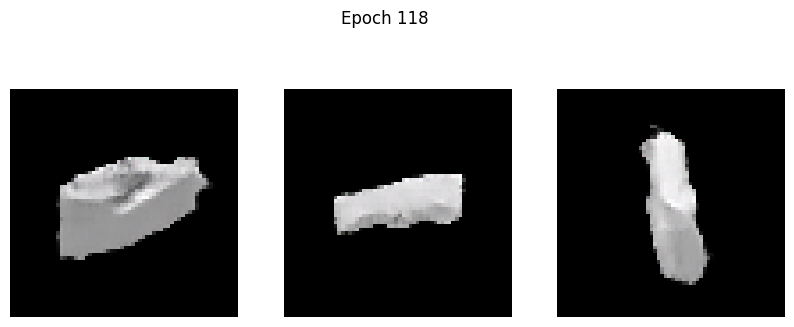

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2528 - g_loss: 2.6241
Epoch 119/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2554 - g_loss: 2.6501

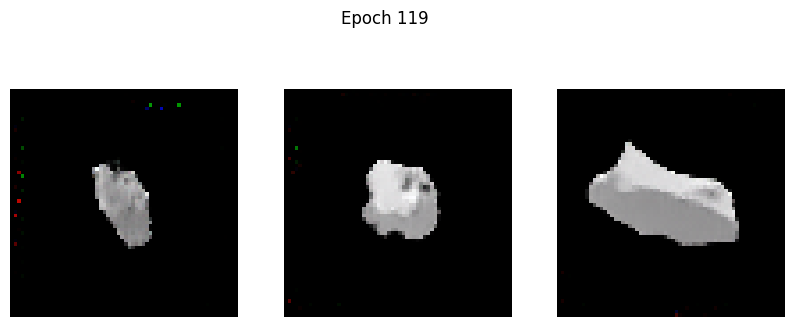

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2552 - g_loss: 2.6497
Epoch 120/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2138 - g_loss: 2.5734

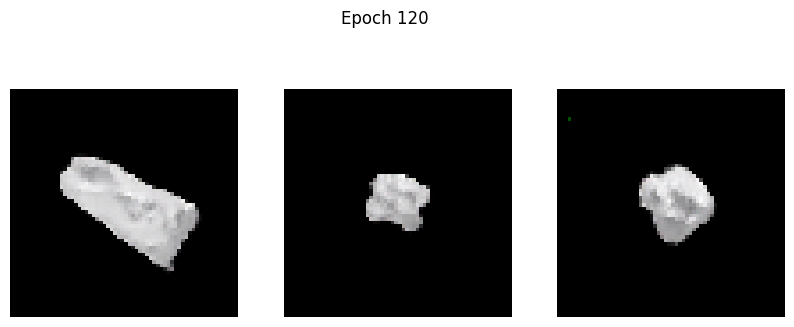

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2139 - g_loss: 2.5737
Epoch 121/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1886 - g_loss: 2.6577

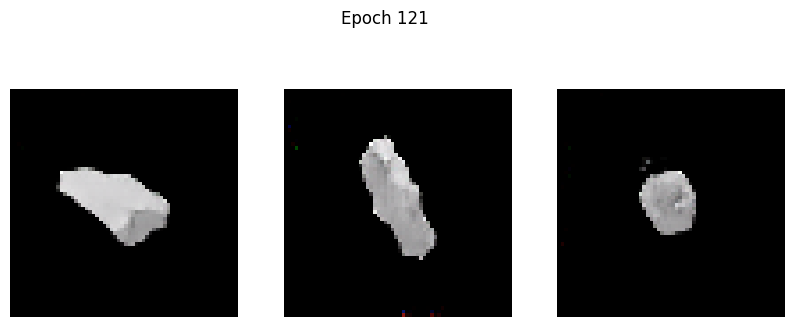

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1887 - g_loss: 2.6577
Epoch 122/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2504 - g_loss: 2.7219

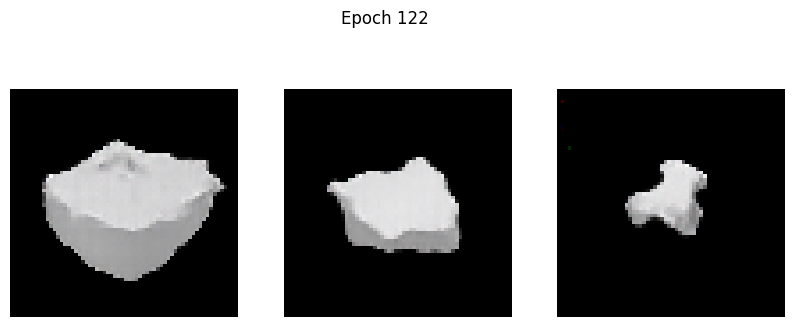

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2505 - g_loss: 2.7218
Epoch 123/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1741 - g_loss: 2.6536

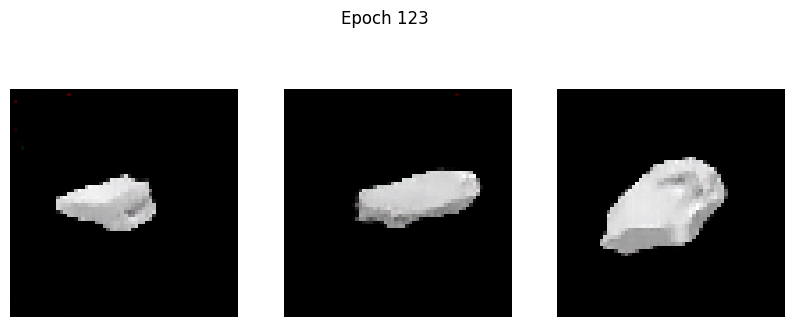

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1741 - g_loss: 2.6534
Epoch 124/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2713 - g_loss: 2.7970

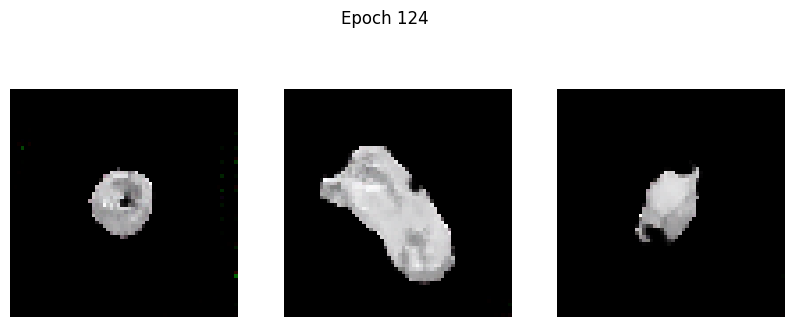

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2709 - g_loss: 2.7960
Epoch 125/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3577 - g_loss: 2.7893

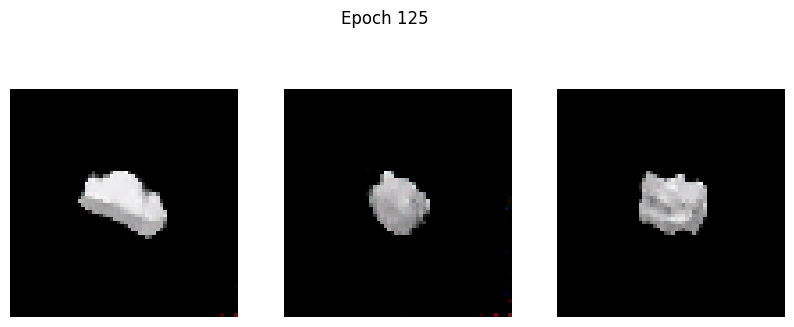

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3566 - g_loss: 2.7881
Epoch 126/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1820 - g_loss: 2.6852

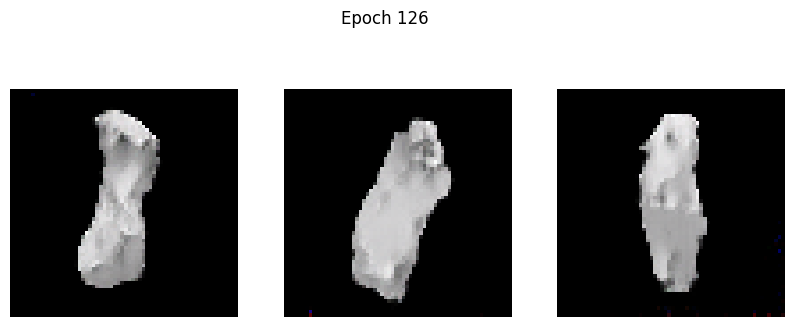

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1820 - g_loss: 2.6851
Epoch 127/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2634 - g_loss: 2.7297

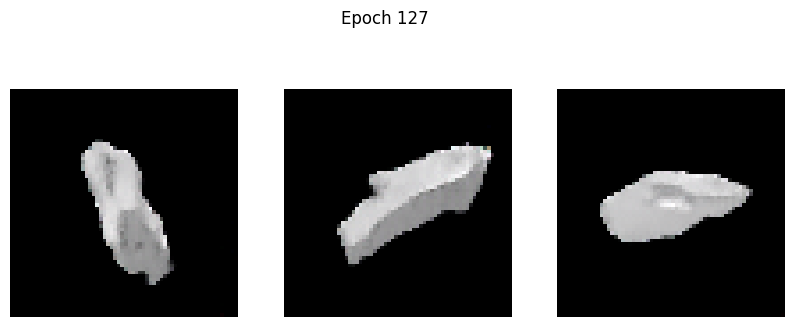

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2632 - g_loss: 2.7296
Epoch 128/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1808 - g_loss: 2.6356

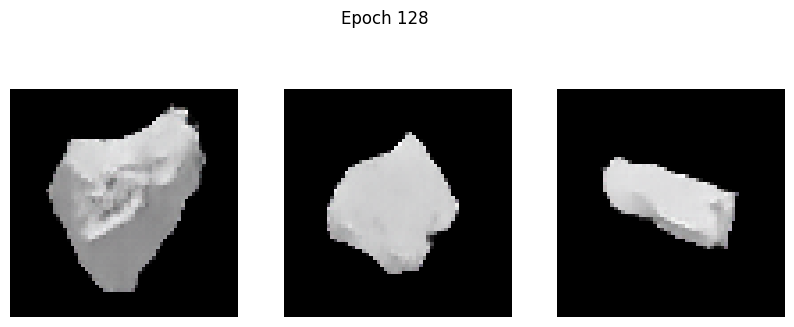

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1808 - g_loss: 2.6360
Epoch 129/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1668 - g_loss: 2.7409

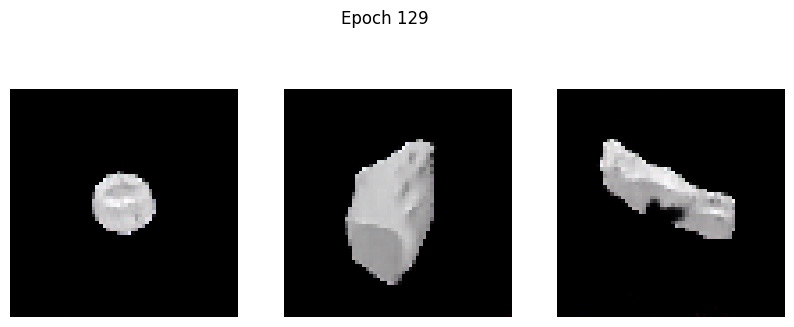

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1674 - g_loss: 2.7417
Epoch 130/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 1.5897 - g_loss: 6.2440

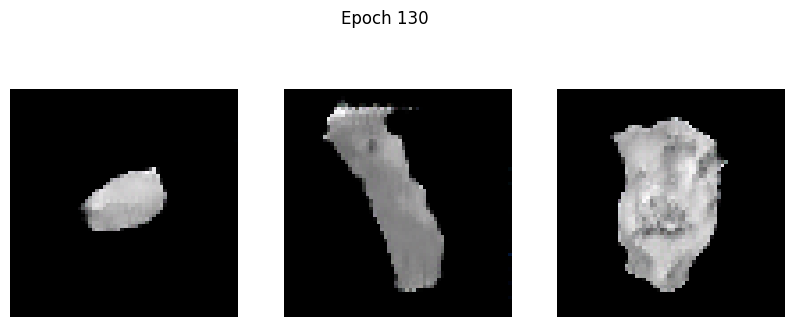

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 1.5818 - g_loss: 6.2255
Epoch 131/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2079 - g_loss: 2.3197

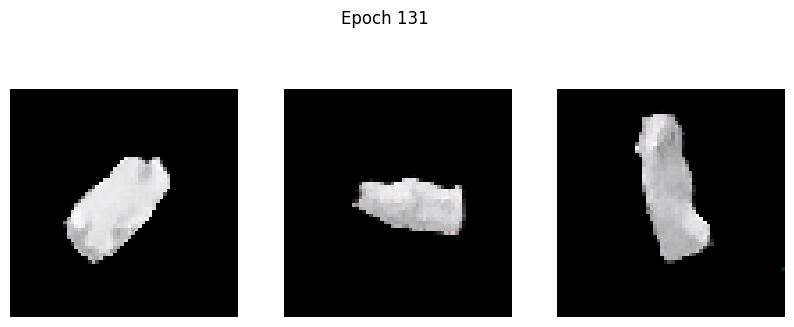

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2080 - g_loss: 2.3202
Epoch 132/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1805 - g_loss: 2.4927

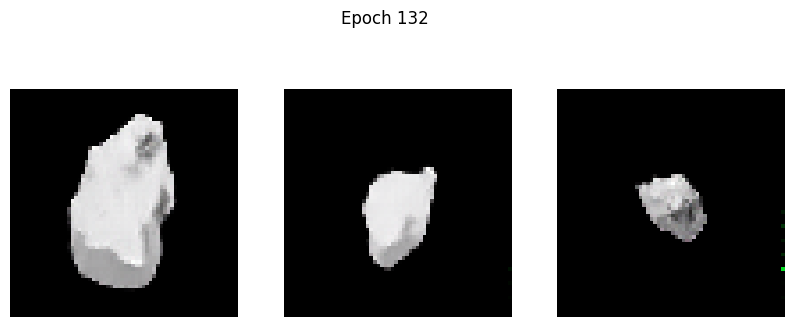

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1805 - g_loss: 2.4927
Epoch 133/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1675 - g_loss: 2.5240

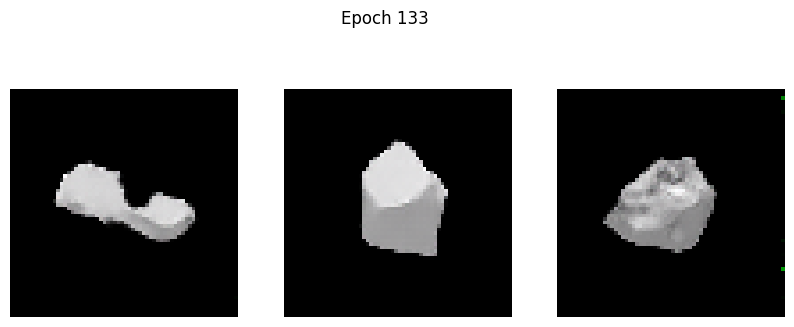

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1677 - g_loss: 2.5242
Epoch 134/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1596 - g_loss: 2.6071

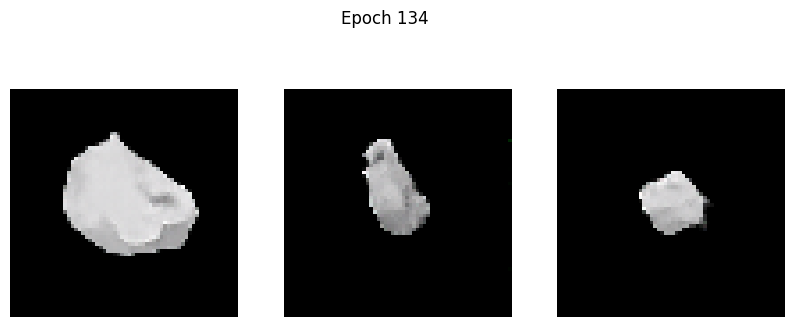

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1598 - g_loss: 2.6072
Epoch 135/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1700 - g_loss: 2.6642

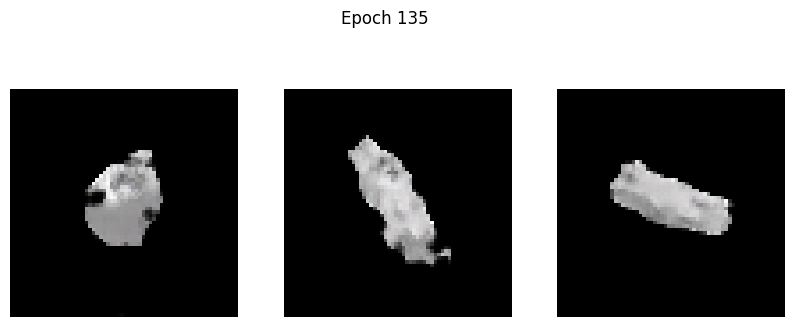

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1705 - g_loss: 2.6646
Epoch 136/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1754 - g_loss: 2.6595

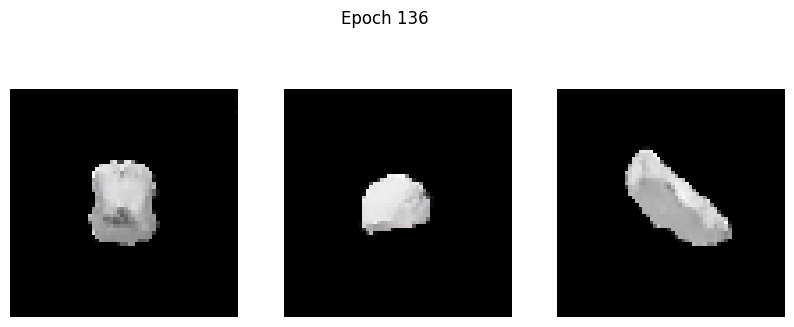

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1755 - g_loss: 2.6596
Epoch 137/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1779 - g_loss: 2.7393

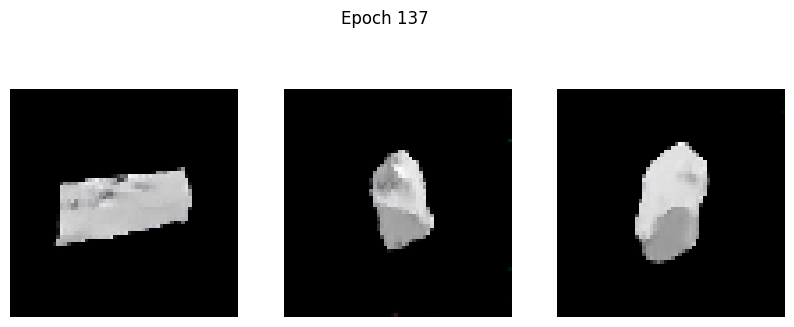

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1779 - g_loss: 2.7391
Epoch 138/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2186 - g_loss: 2.7508

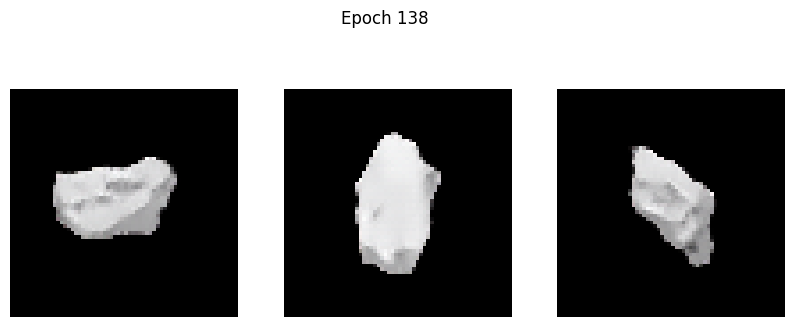

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2188 - g_loss: 2.7513
Epoch 139/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1700 - g_loss: 2.7329

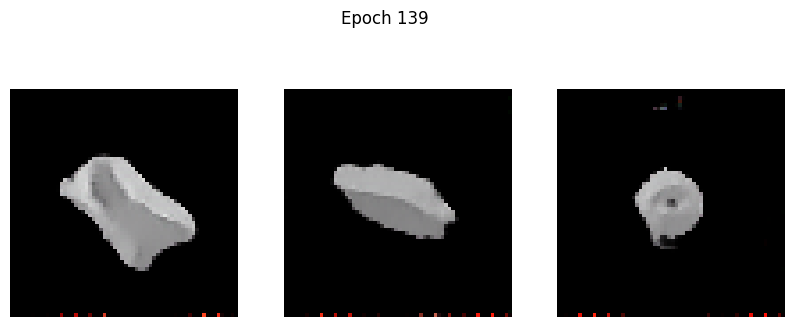

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1701 - g_loss: 2.7330
Epoch 140/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2243 - g_loss: 2.8682

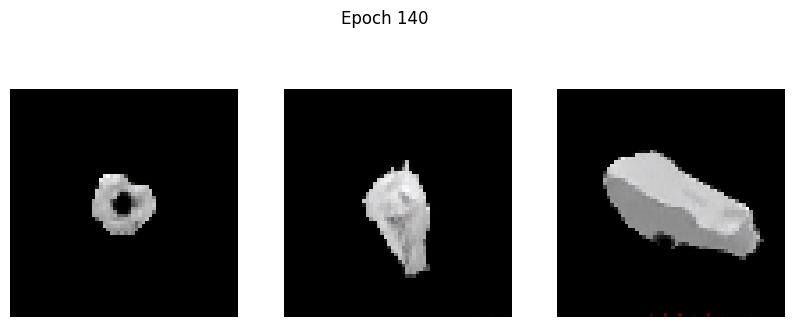

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2240 - g_loss: 2.8672
Epoch 141/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1618 - g_loss: 2.7473

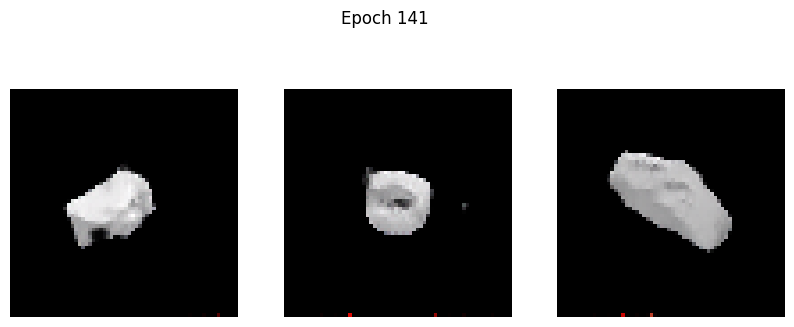

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1619 - g_loss: 2.7479
Epoch 142/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2432 - g_loss: 2.8851

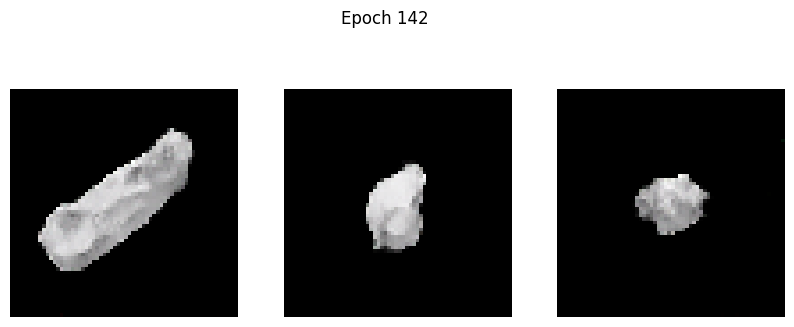

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2429 - g_loss: 2.8842
Epoch 143/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1579 - g_loss: 2.7595

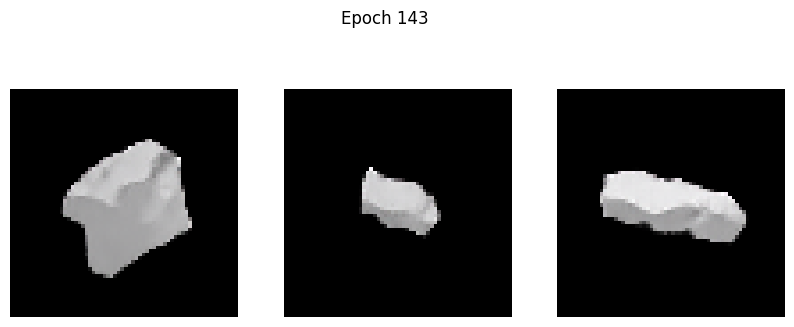

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1579 - g_loss: 2.7594
Epoch 144/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2110 - g_loss: 2.9084

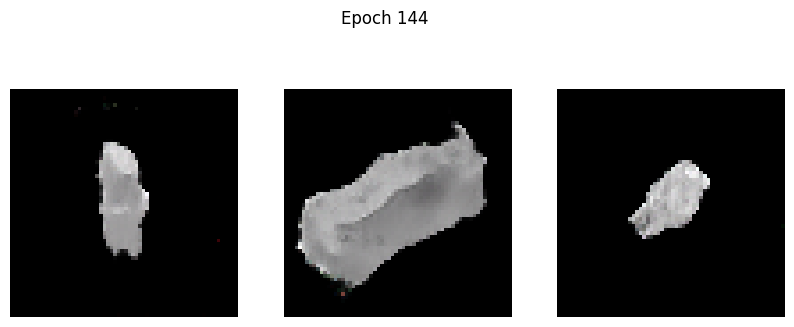

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2119 - g_loss: 2.9092
Epoch 145/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1875 - g_loss: 2.7431

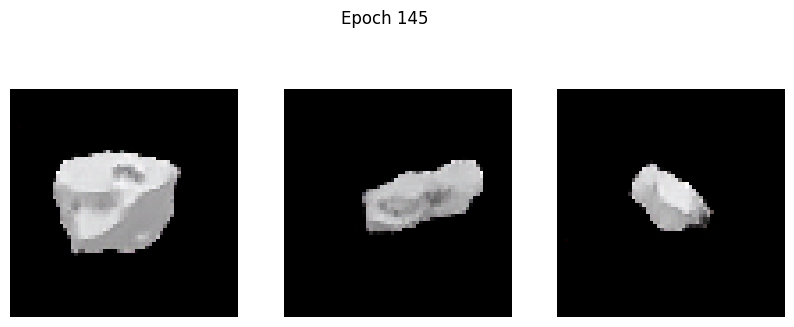

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1875 - g_loss: 2.7427
Epoch 146/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1518 - g_loss: 2.7552

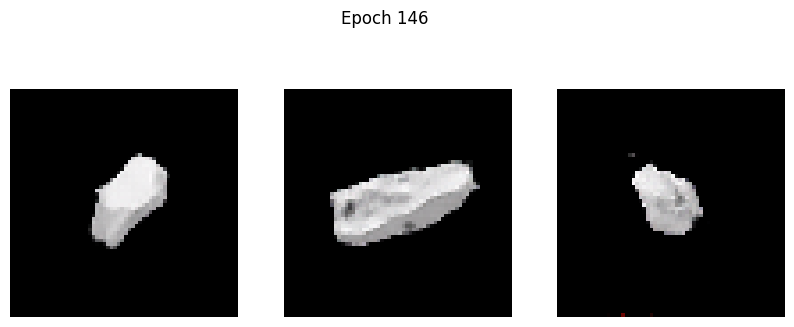

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1519 - g_loss: 2.7555
Epoch 147/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1963 - g_loss: 2.8776

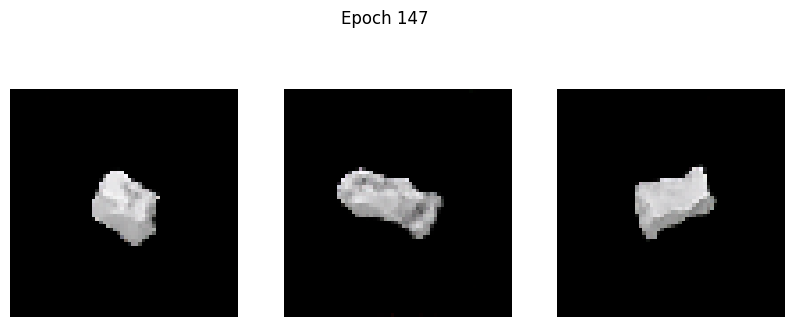

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1968 - g_loss: 2.8780
Epoch 148/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2861 - g_loss: 2.8729

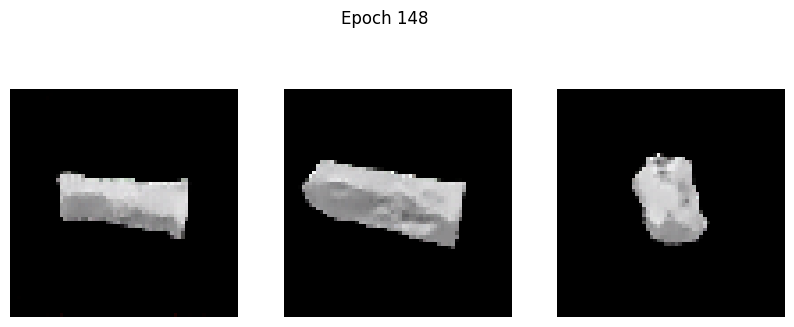

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2854 - g_loss: 2.8719
Epoch 149/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1502 - g_loss: 2.8431

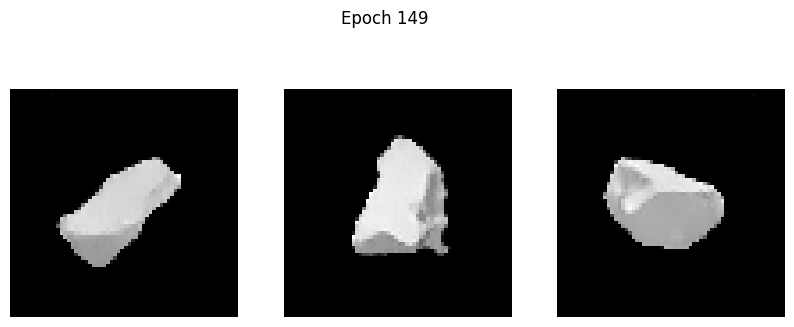

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1502 - g_loss: 2.8428
Epoch 150/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1674 - g_loss: 2.8461

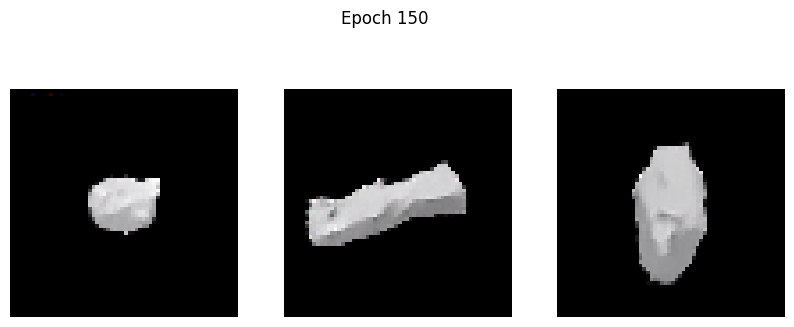

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1673 - g_loss: 2.8464
Epoch 151/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2937 - g_loss: 2.9809

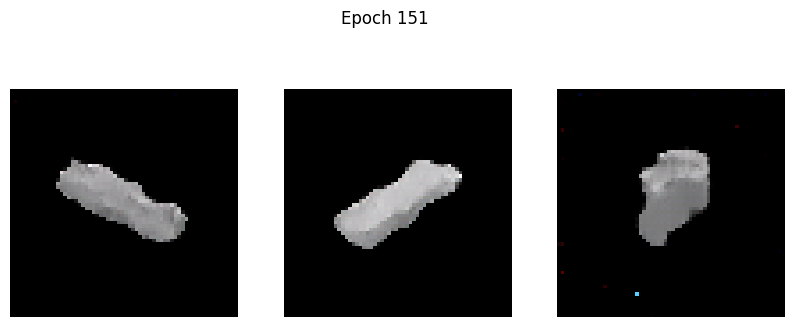

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2934 - g_loss: 2.9799
Epoch 152/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1549 - g_loss: 2.7907

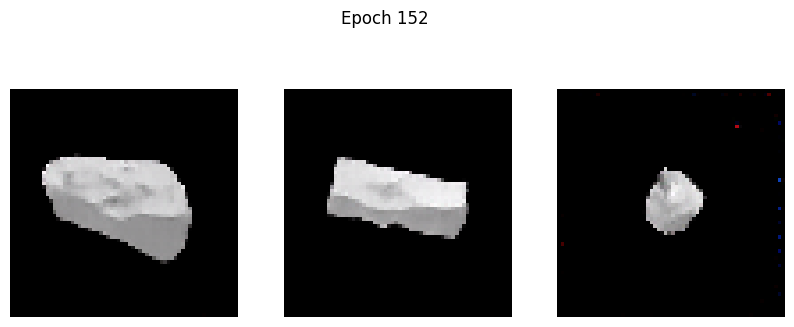

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1550 - g_loss: 2.7911
Epoch 153/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1817 - g_loss: 2.8911

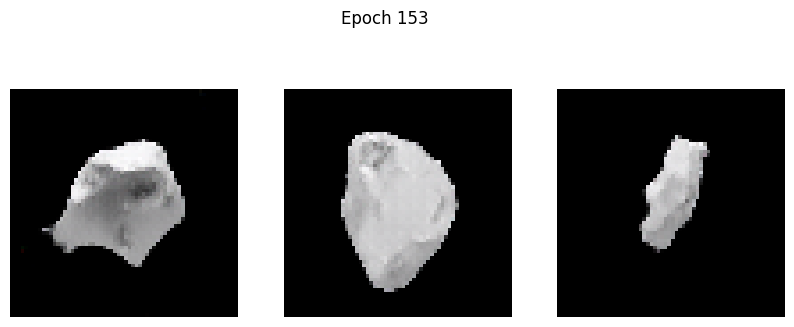

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1816 - g_loss: 2.8914
Epoch 154/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2044 - g_loss: 2.8990

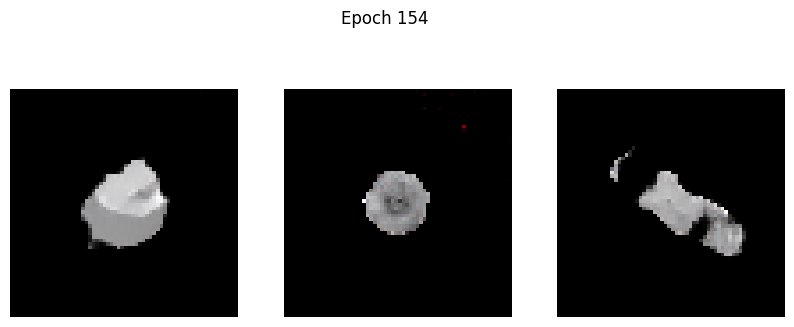

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2045 - g_loss: 2.8992
Epoch 155/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1989 - g_loss: 2.9755

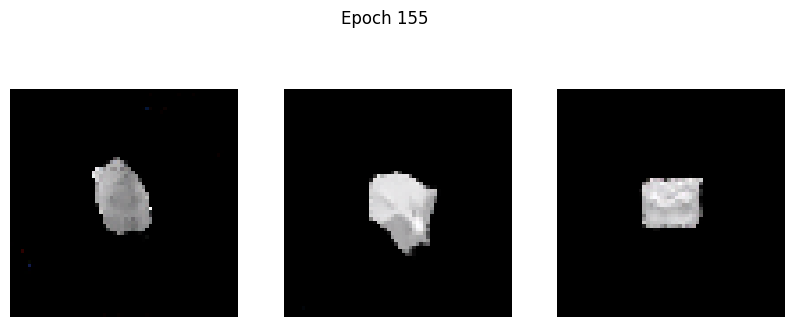

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1987 - g_loss: 2.9748
Epoch 156/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1705 - g_loss: 2.9468

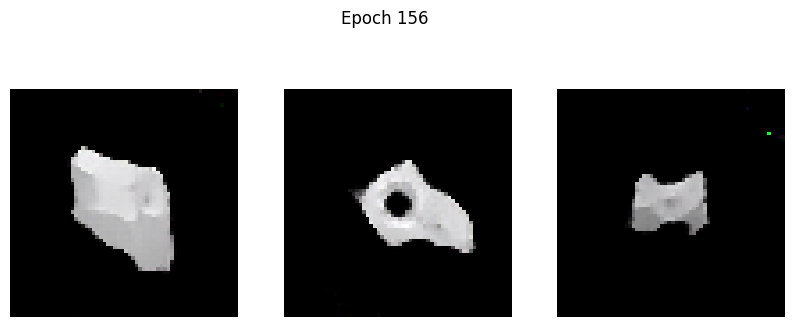

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1703 - g_loss: 2.9462
Epoch 157/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2226 - g_loss: 3.0412

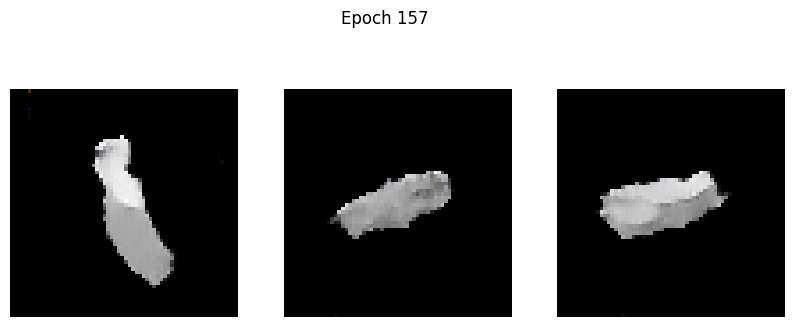

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2227 - g_loss: 3.0410
Epoch 158/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1568 - g_loss: 2.9731

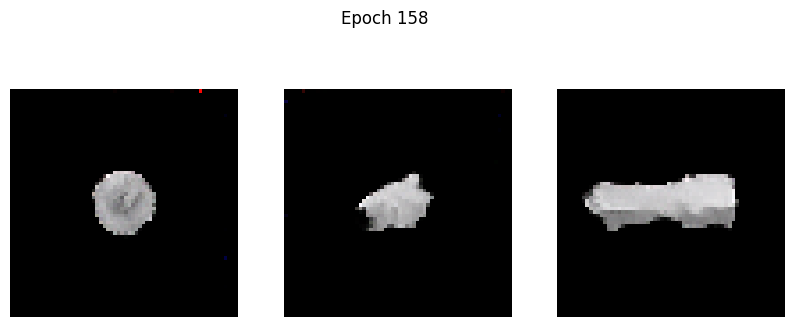

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1570 - g_loss: 2.9731
Epoch 159/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1497 - g_loss: 2.9236

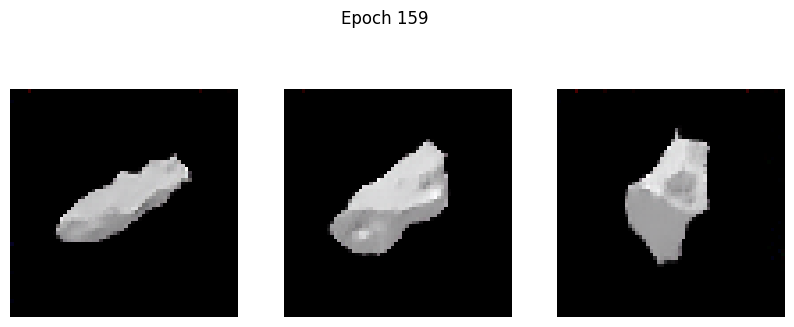

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1498 - g_loss: 2.9238
Epoch 160/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3419 - g_loss: 3.3023

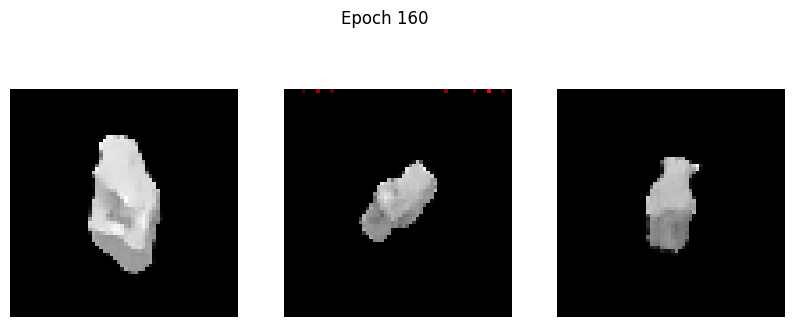

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3408 - g_loss: 3.2997
Epoch 161/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1562 - g_loss: 2.9999

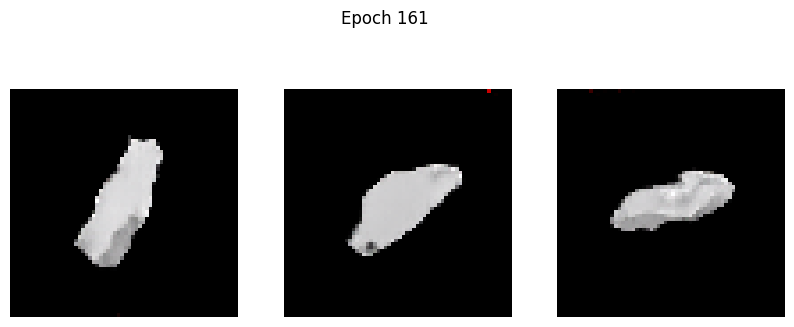

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1562 - g_loss: 2.9994
Epoch 162/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1572 - g_loss: 2.9457

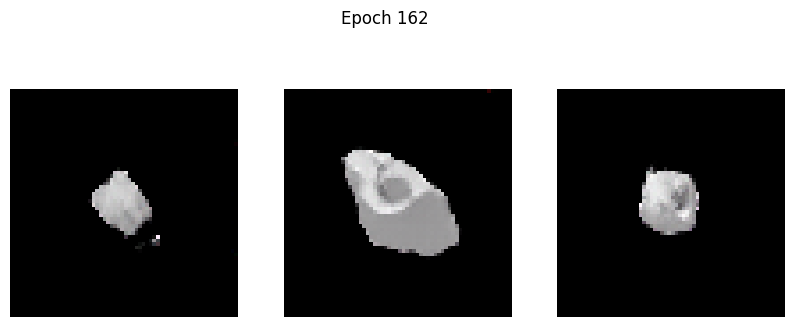

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1575 - g_loss: 2.9461
Epoch 163/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1838 - g_loss: 2.9289

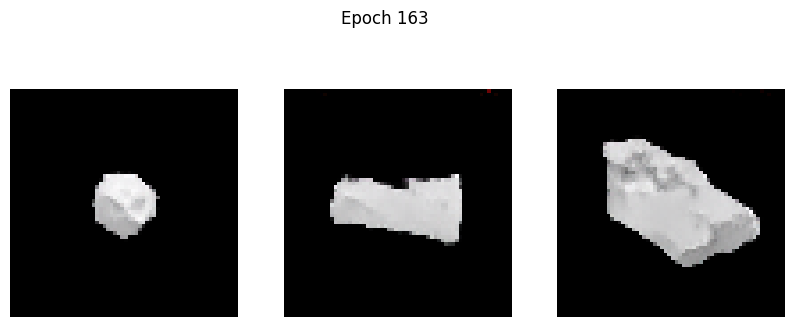

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1836 - g_loss: 2.9293
Epoch 164/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1868 - g_loss: 3.0398

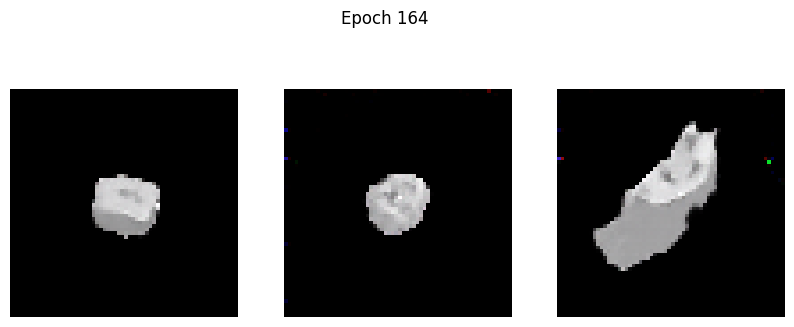

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1865 - g_loss: 3.0395
Epoch 165/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1861 - g_loss: 3.0644

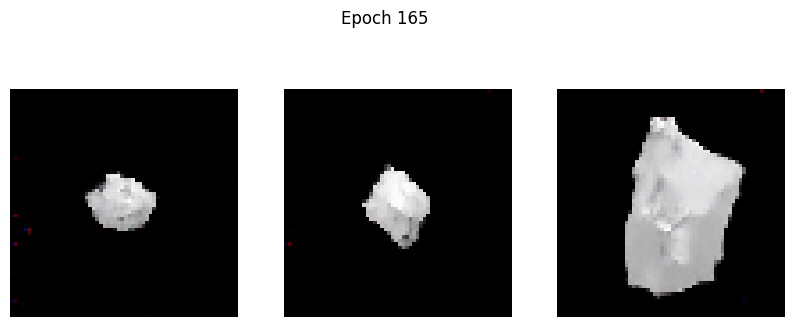

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - d_loss: 0.1862 - g_loss: 3.0649
Epoch 166/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2161 - g_loss: 3.1342

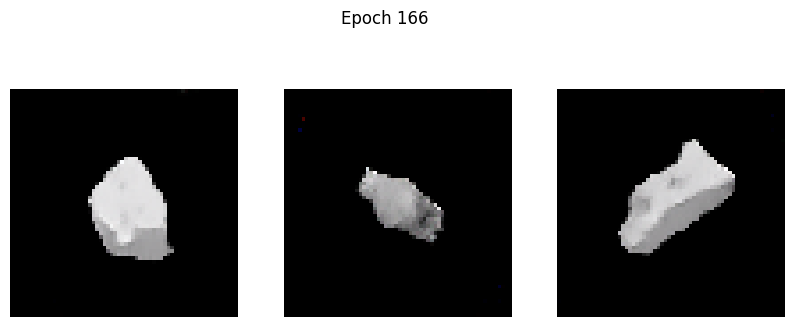

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2163 - g_loss: 3.1336
Epoch 167/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1234 - g_loss: 3.0021

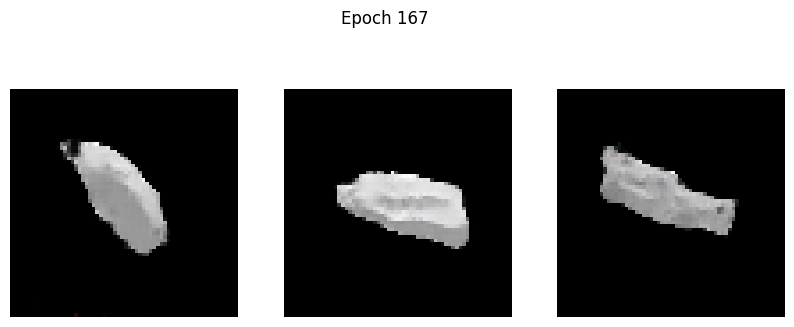

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1234 - g_loss: 3.0024
Epoch 168/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2808 - g_loss: 3.1186

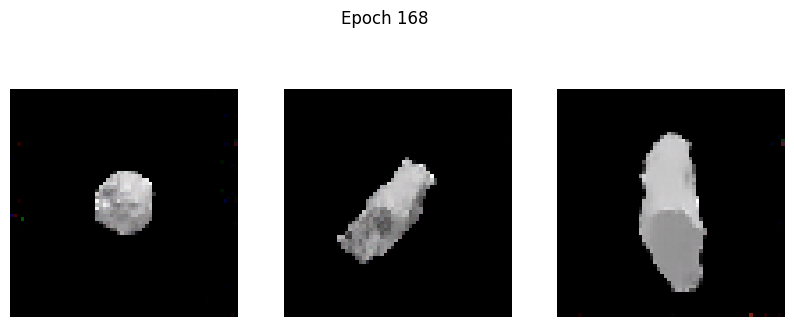

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2809 - g_loss: 3.1187
Epoch 169/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1249 - g_loss: 2.9741

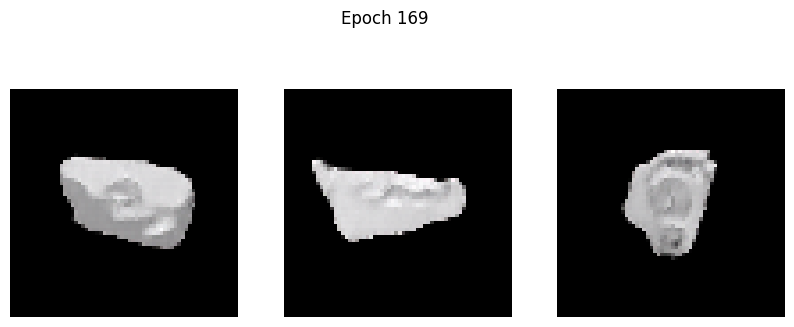

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1249 - g_loss: 2.9740
Epoch 170/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2894 - g_loss: 3.2894

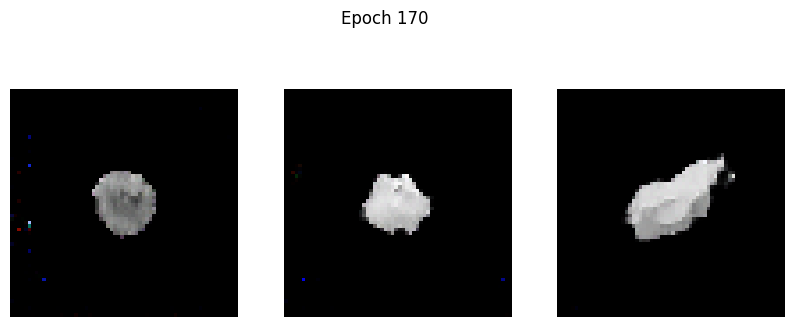

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2917 - g_loss: 3.2926
Epoch 171/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1968 - g_loss: 2.8693

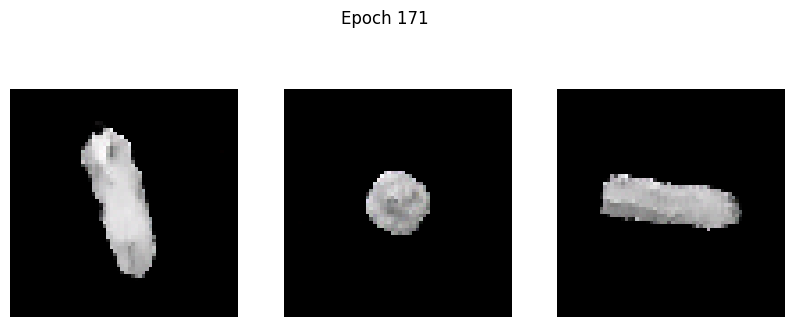

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1966 - g_loss: 2.8684
Epoch 172/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1516 - g_loss: 2.8677

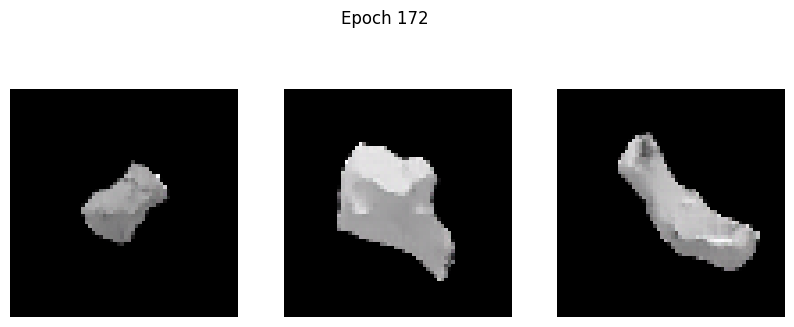

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1516 - g_loss: 2.8678
Epoch 173/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1230 - g_loss: 2.9260

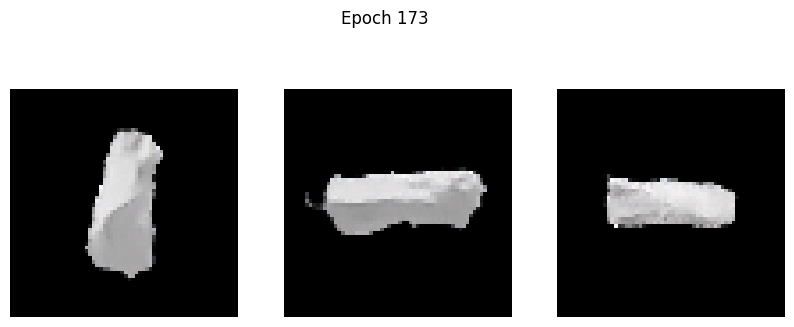

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1231 - g_loss: 2.9260
Epoch 174/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1422 - g_loss: 2.9634

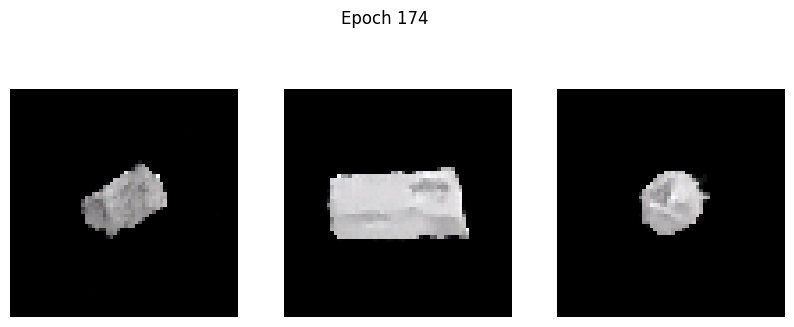

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1422 - g_loss: 2.9636
Epoch 175/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1349 - g_loss: 3.1090

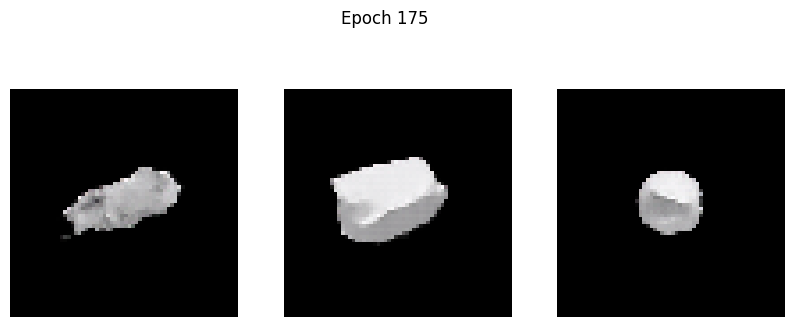

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1350 - g_loss: 3.1087
Epoch 176/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1437 - g_loss: 3.0517

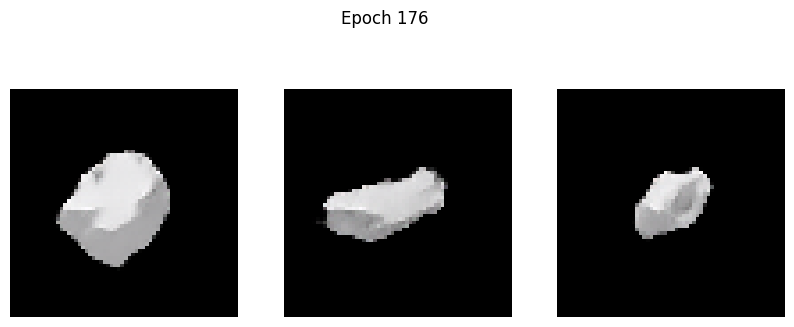

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1439 - g_loss: 3.0517
Epoch 177/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1381 - g_loss: 3.1242

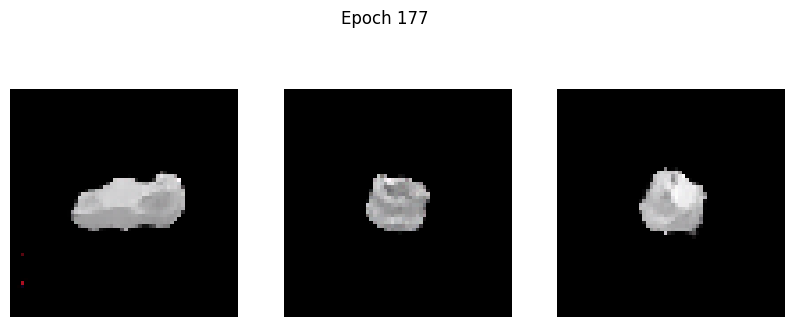

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1384 - g_loss: 3.1244
Epoch 178/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1291 - g_loss: 3.1066

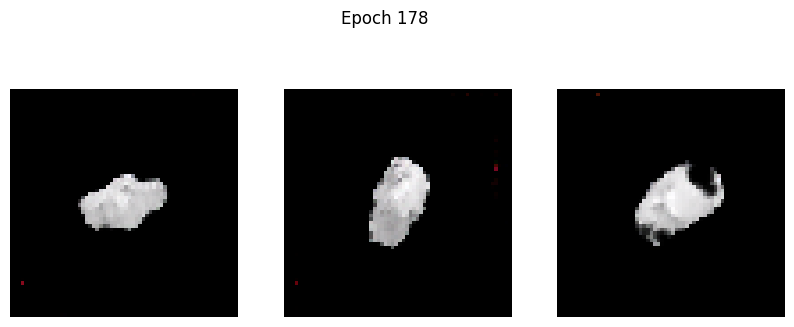

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1291 - g_loss: 3.1069
Epoch 179/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2140 - g_loss: 3.1530

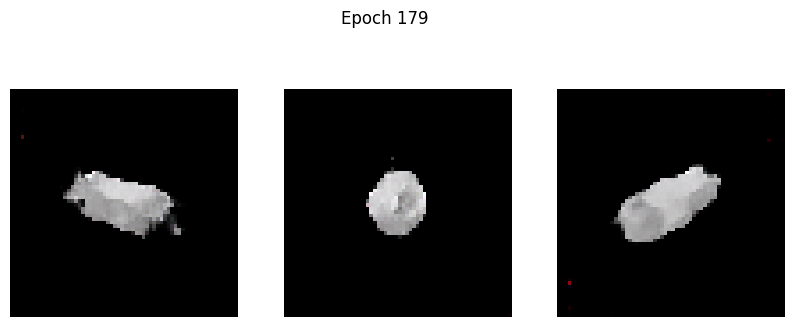

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2137 - g_loss: 3.1531
Epoch 180/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1284 - g_loss: 3.1237

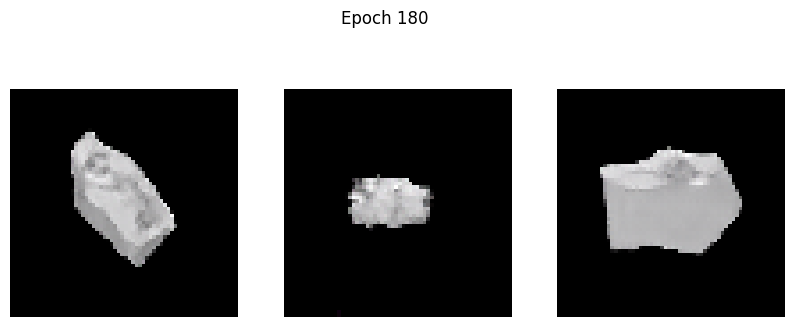

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1285 - g_loss: 3.1240
Epoch 181/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1380 - g_loss: 3.1922

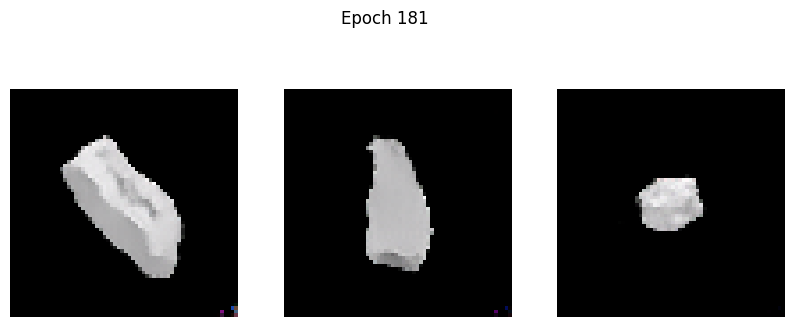

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1381 - g_loss: 3.1920
Epoch 182/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2309 - g_loss: 3.2458

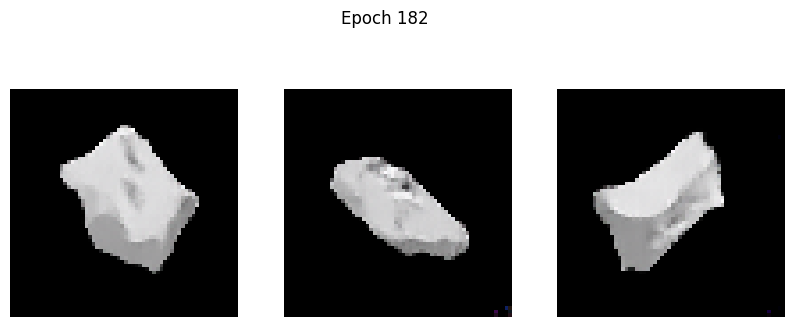

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2308 - g_loss: 3.2456
Epoch 183/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1097 - g_loss: 3.1588

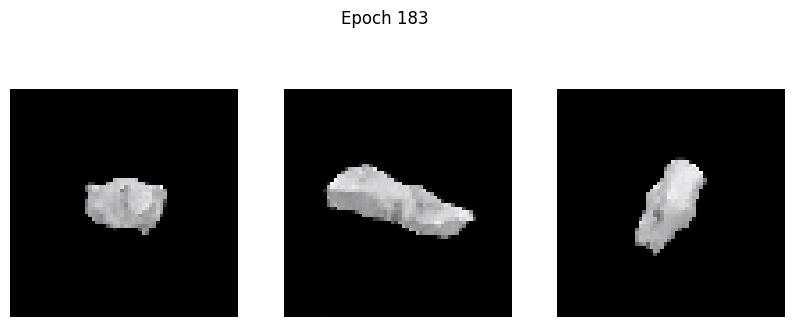

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1098 - g_loss: 3.1586
Epoch 184/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1533 - g_loss: 3.3266

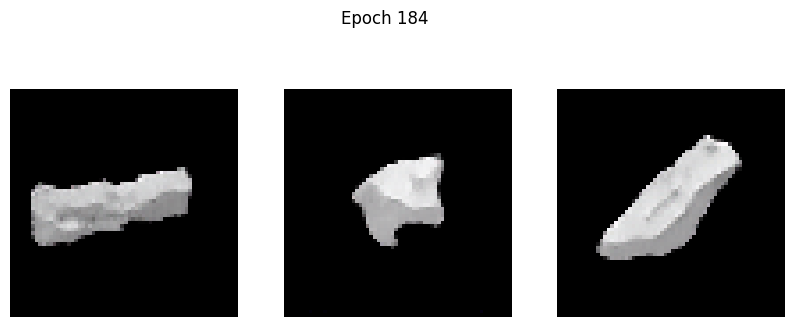

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1536 - g_loss: 3.3256
Epoch 185/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1243 - g_loss: 3.2244

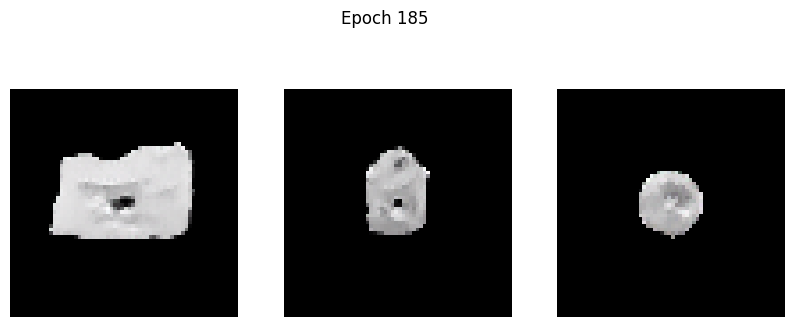

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1244 - g_loss: 3.2243
Epoch 186/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1917 - g_loss: 3.3614

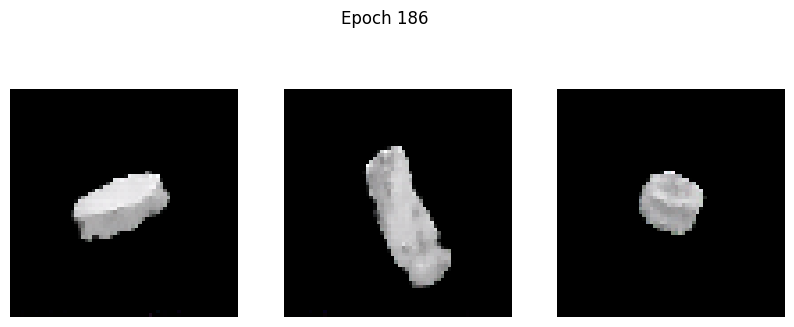

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1917 - g_loss: 3.3609
Epoch 187/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1508 - g_loss: 3.2439

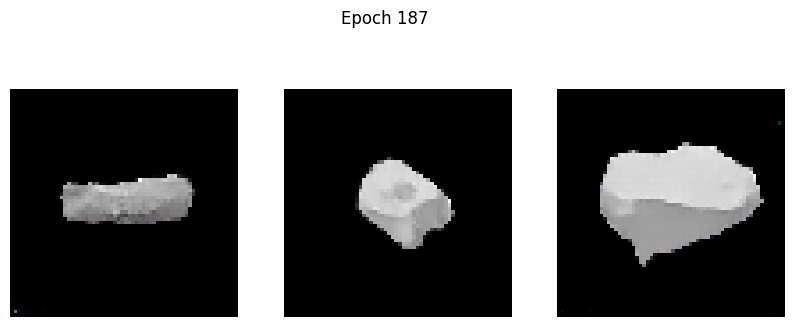

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1510 - g_loss: 3.2441
Epoch 188/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1332 - g_loss: 3.2397

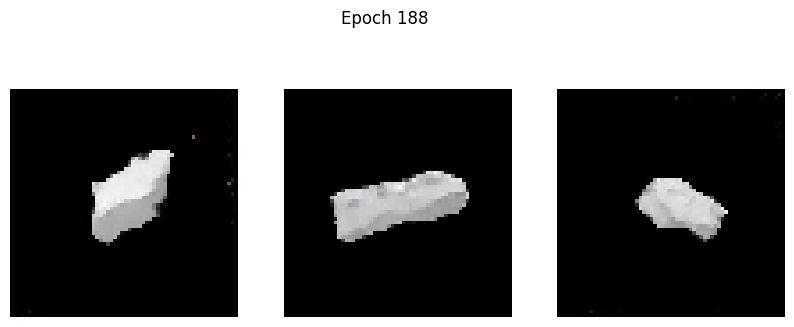

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1333 - g_loss: 3.2396
Epoch 189/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1507 - g_loss: 3.2654

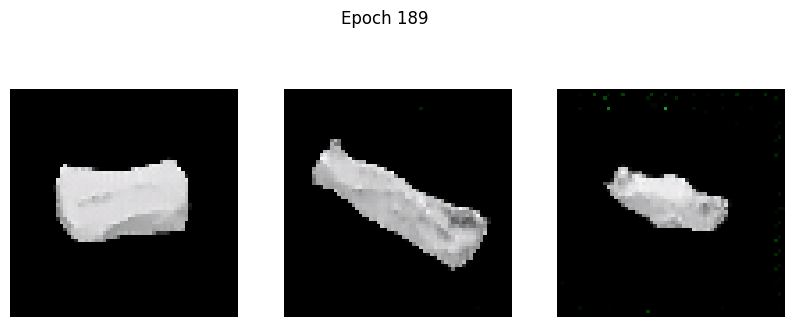

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1514 - g_loss: 3.2656
Epoch 190/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1408 - g_loss: 3.1476

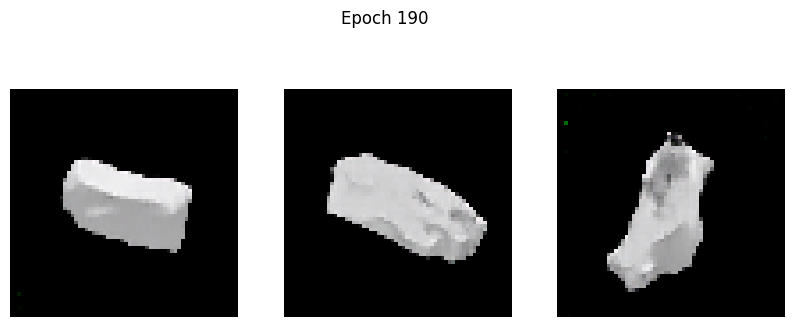

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - d_loss: 0.1409 - g_loss: 3.1482
Epoch 191/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1569 - g_loss: 3.2632

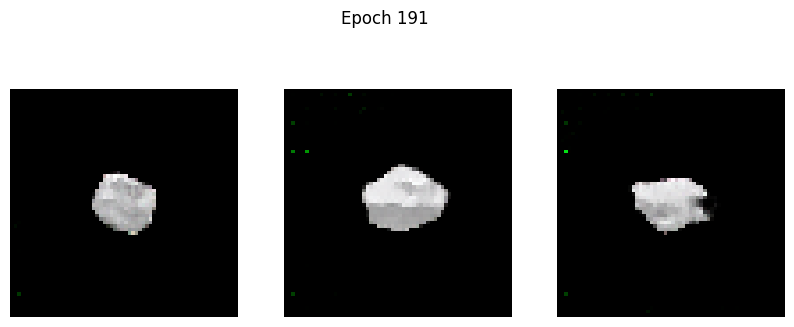

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1567 - g_loss: 3.2625
Epoch 192/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1607 - g_loss: 3.2622

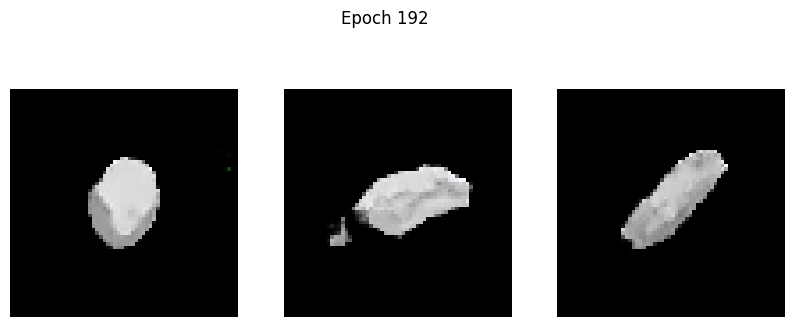

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1605 - g_loss: 3.2622
Epoch 193/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1203 - g_loss: 3.2560

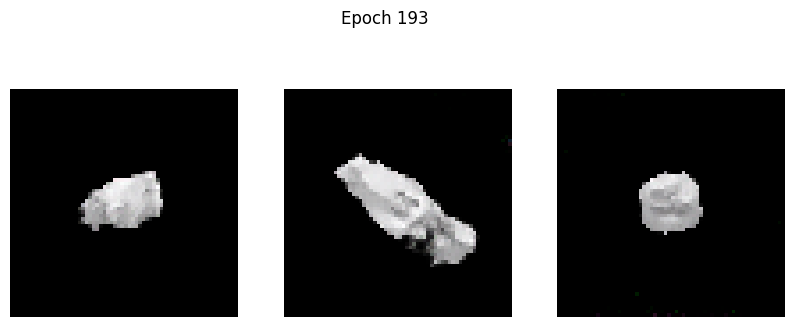

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1204 - g_loss: 3.2564
Epoch 194/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6995 - g_loss: 3.9770

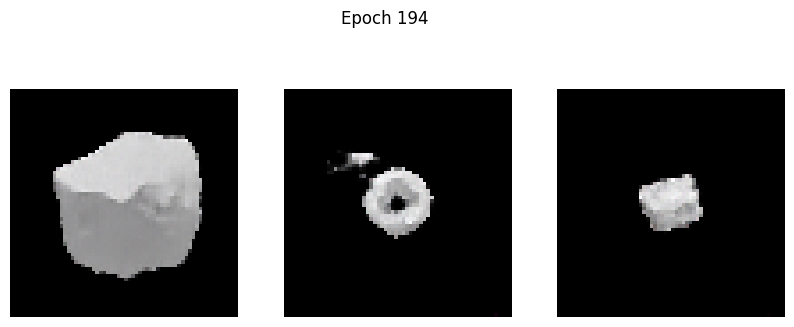

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6976 - g_loss: 3.9722
Epoch 195/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1253 - g_loss: 3.0043

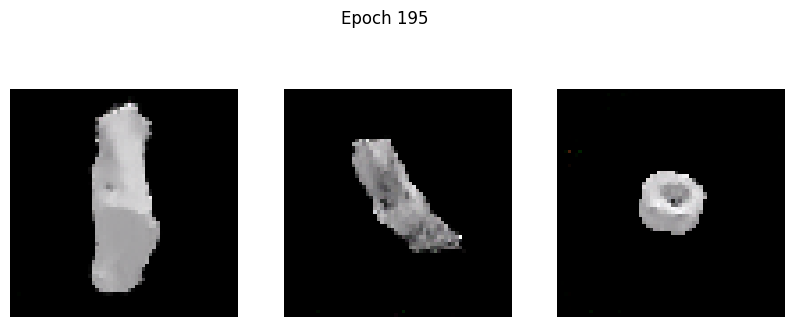

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1253 - g_loss: 3.0044
Epoch 196/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1118 - g_loss: 3.1880

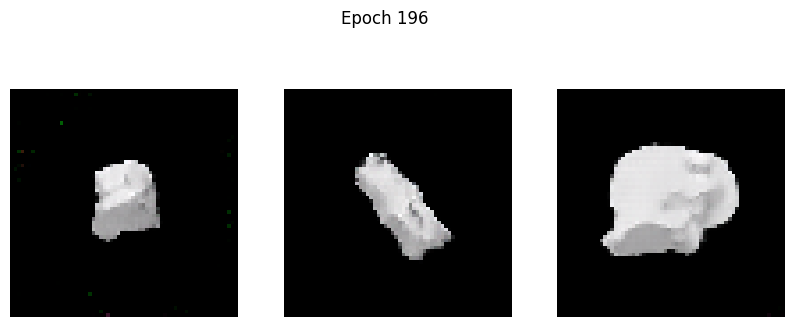

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1118 - g_loss: 3.1878
Epoch 197/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1145 - g_loss: 3.1466

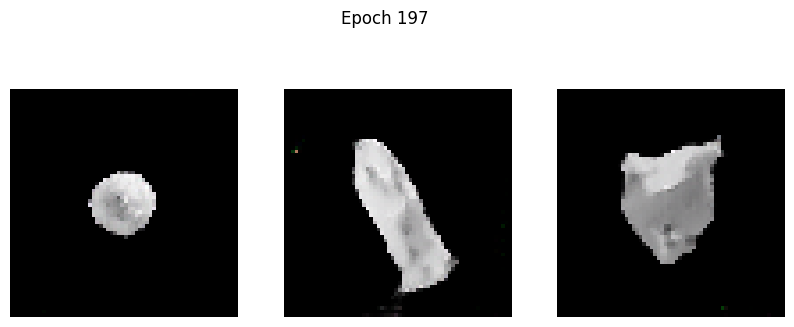

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1145 - g_loss: 3.1467
Epoch 198/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1246 - g_loss: 3.2174

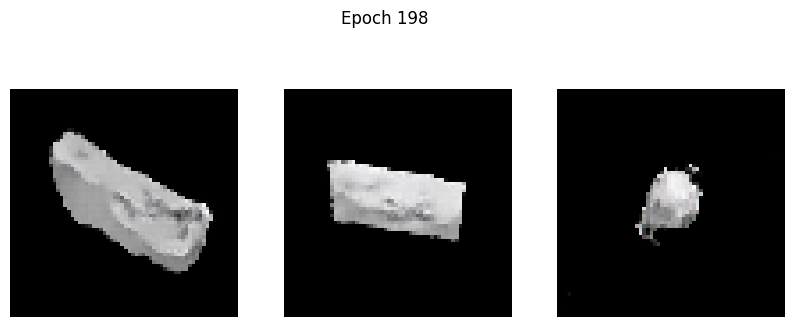

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1247 - g_loss: 3.2181
Epoch 199/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1193 - g_loss: 3.3419

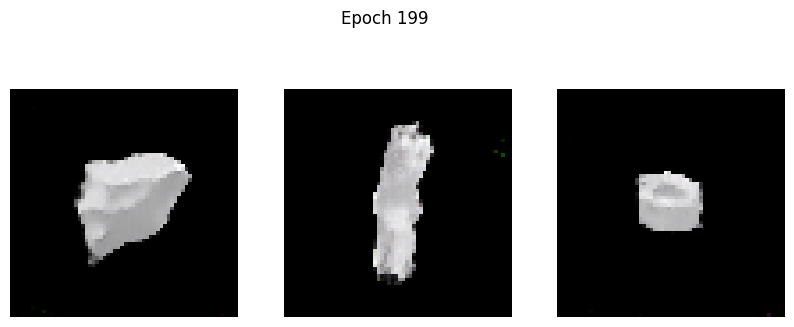

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1193 - g_loss: 3.3418
Epoch 200/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1381 - g_loss: 3.3814

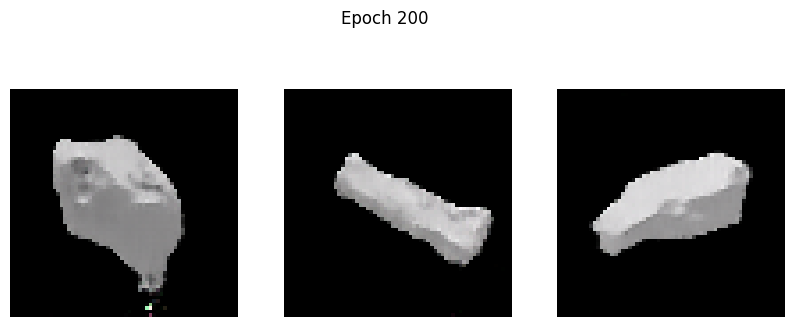

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1380 - g_loss: 3.3814
Epoch 201/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1420 - g_loss: 3.4372

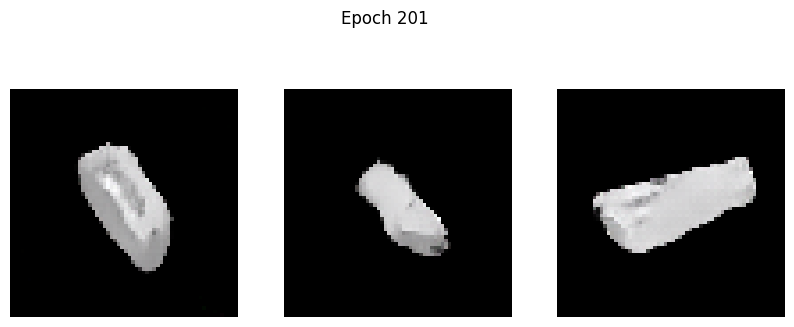

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1421 - g_loss: 3.4368
Epoch 202/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1521 - g_loss: 3.3383

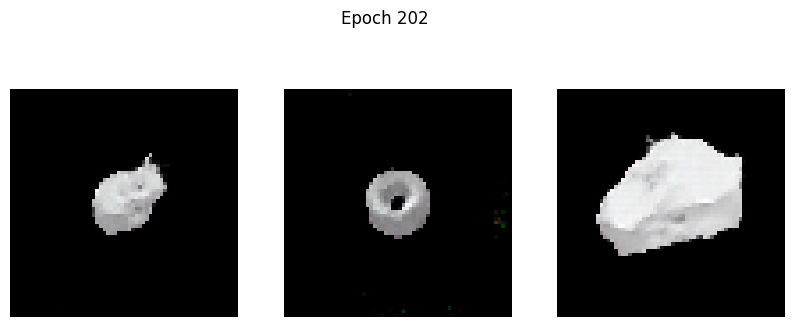

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1524 - g_loss: 3.3388
Epoch 203/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1295 - g_loss: 3.3396

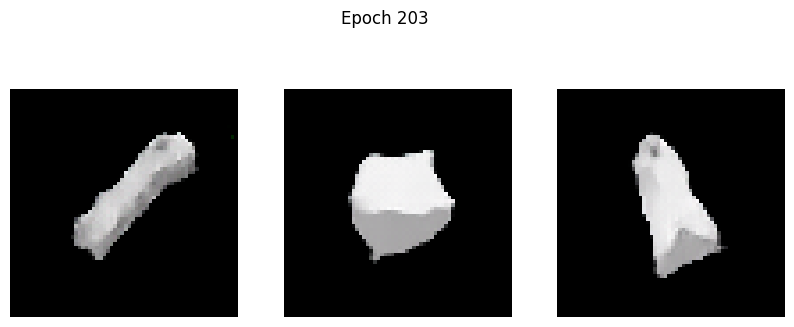

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1298 - g_loss: 3.3401
Epoch 204/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1070 - g_loss: 3.3988

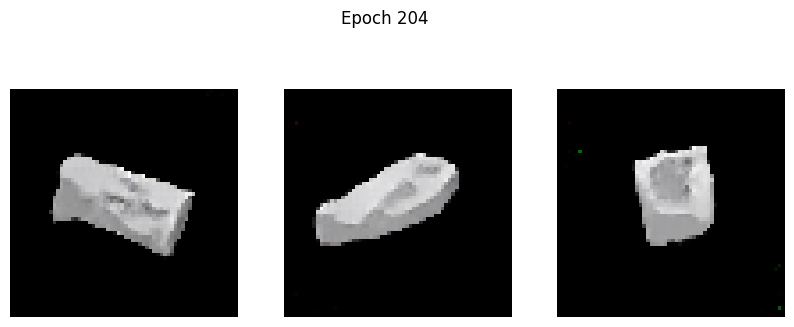

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1071 - g_loss: 3.3985
Epoch 205/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1848 - g_loss: 3.5089

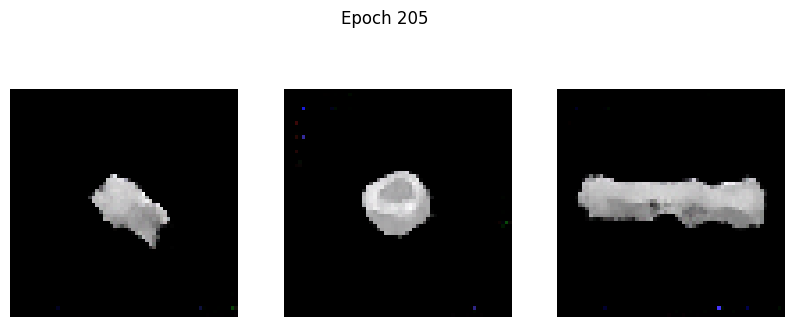

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1850 - g_loss: 3.5083
Epoch 206/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1098 - g_loss: 3.2750

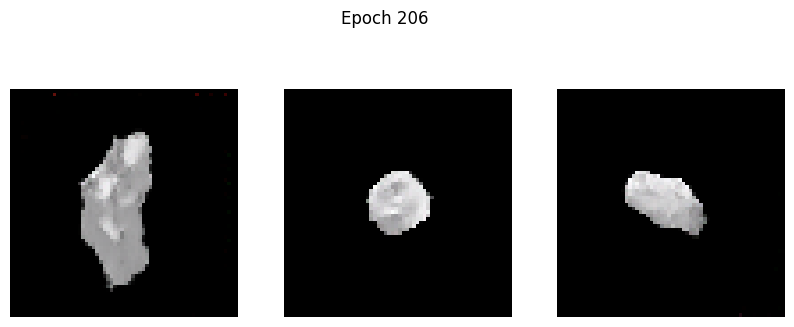

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1098 - g_loss: 3.2752
Epoch 207/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1103 - g_loss: 3.3440

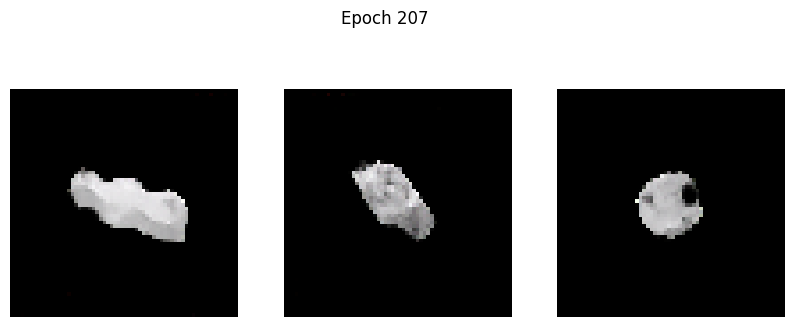

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1105 - g_loss: 3.3447
Epoch 208/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2935 - g_loss: 3.6604

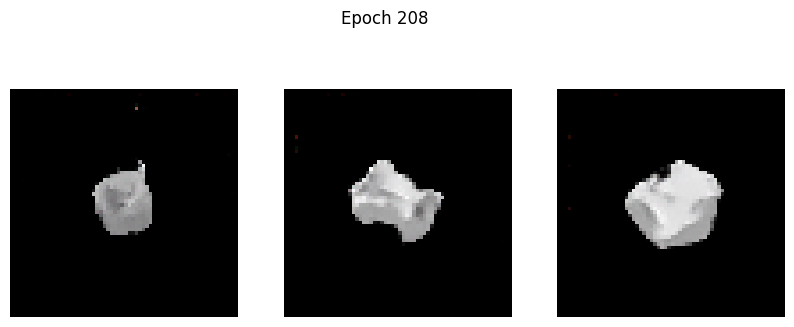

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2927 - g_loss: 3.6586
Epoch 209/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1196 - g_loss: 3.2954

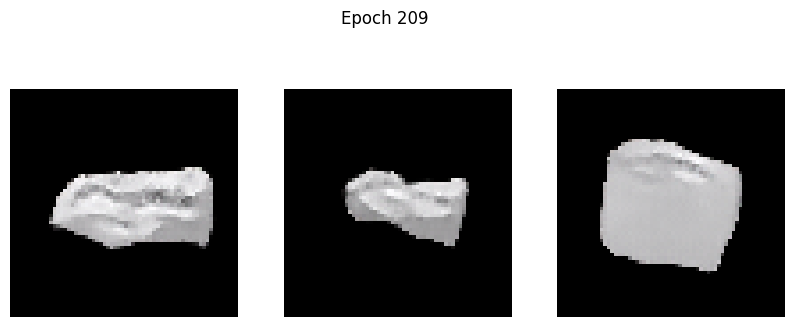

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1197 - g_loss: 3.2963
Epoch 210/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2132 - g_loss: 3.4266

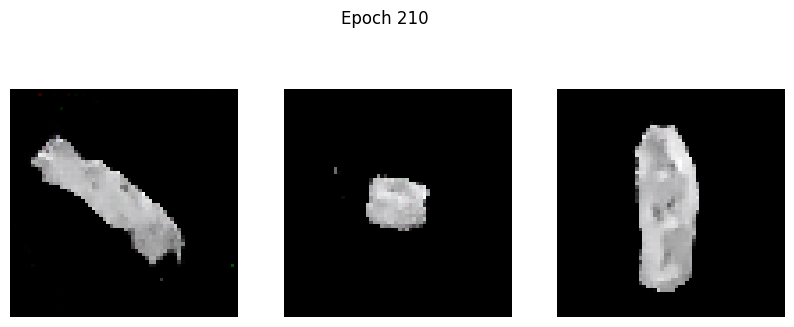

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2126 - g_loss: 3.4265
Epoch 211/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0984 - g_loss: 3.4062

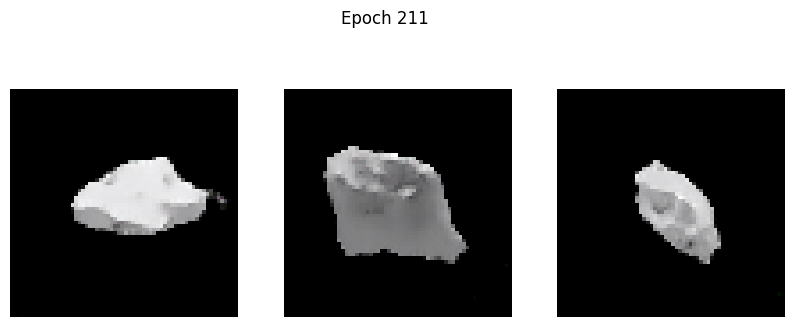

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0985 - g_loss: 3.4062
Epoch 212/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1031 - g_loss: 3.4902

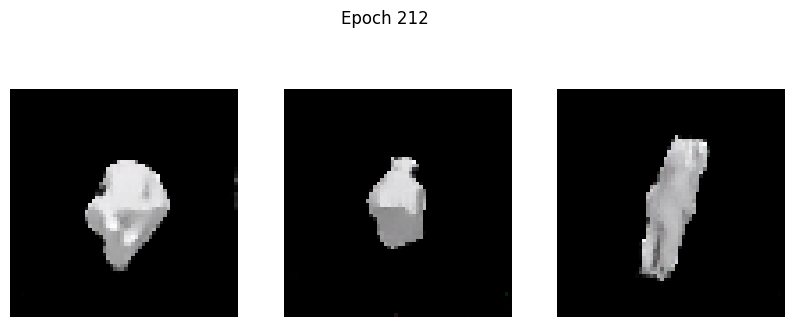

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1032 - g_loss: 3.4900
Epoch 213/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1736 - g_loss: 3.5075

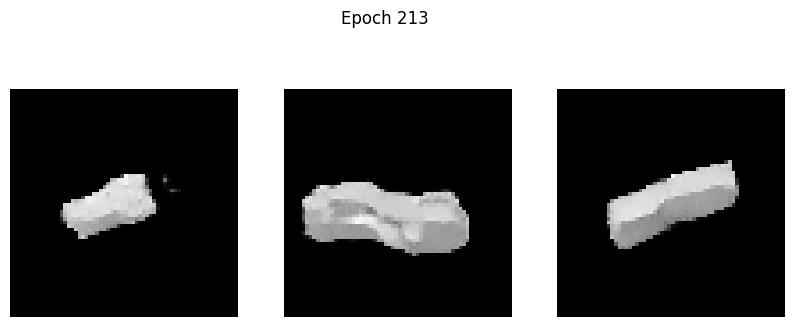

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1738 - g_loss: 3.5082
Epoch 214/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1560 - g_loss: 3.5101

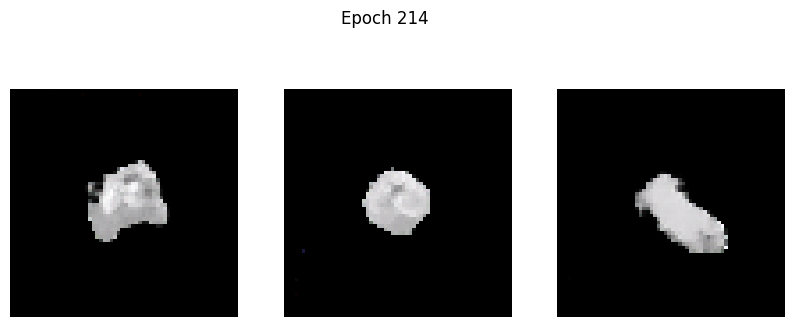

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1557 - g_loss: 3.5094
Epoch 215/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2044 - g_loss: 3.5977

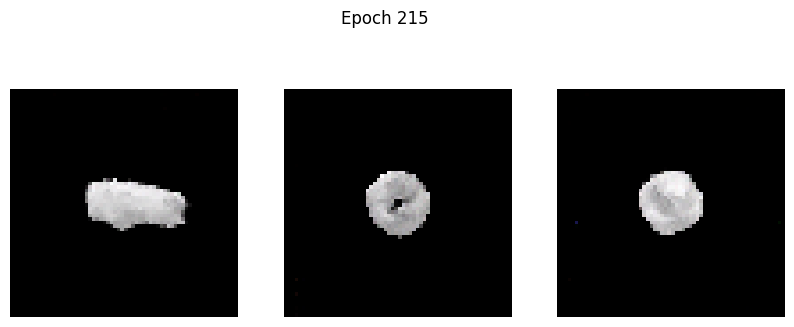

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2041 - g_loss: 3.5971
Epoch 216/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1125 - g_loss: 3.5212

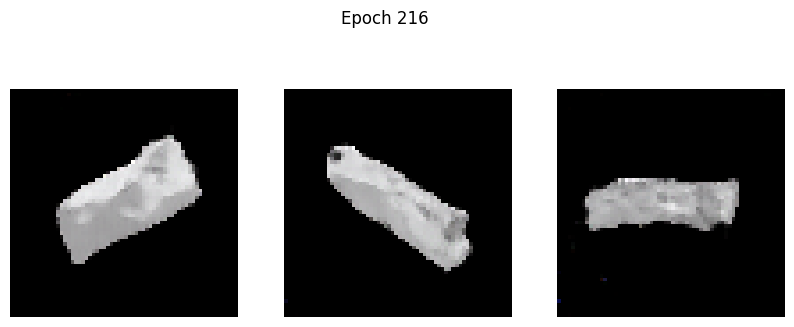

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1135 - g_loss: 3.5217
Epoch 217/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1300 - g_loss: 3.3800

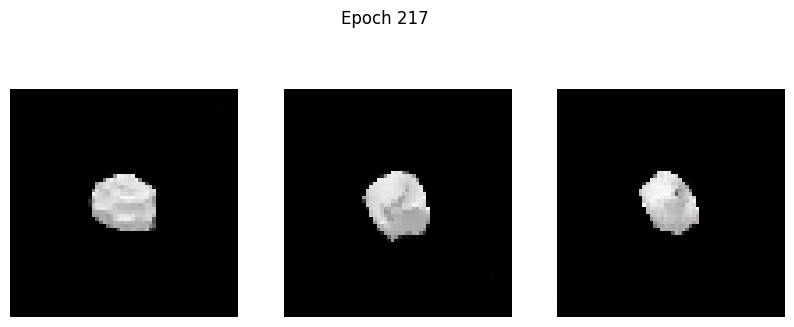

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1298 - g_loss: 3.3801
Epoch 218/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0997 - g_loss: 3.4435

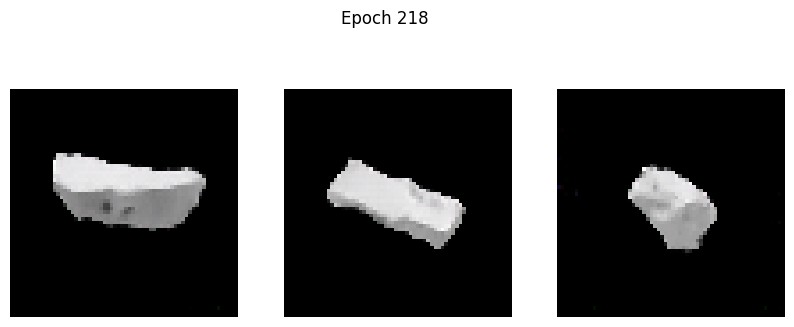

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0999 - g_loss: 3.4435
Epoch 219/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1125 - g_loss: 3.5240

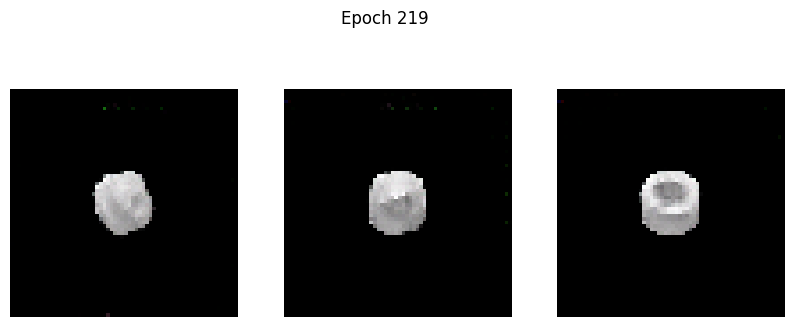

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1125 - g_loss: 3.5239
Epoch 220/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1097 - g_loss: 3.4689

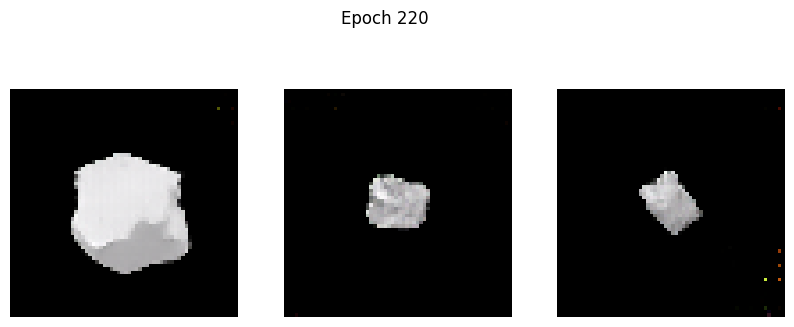

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1099 - g_loss: 3.4699
Epoch 221/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1183 - g_loss: 3.5145

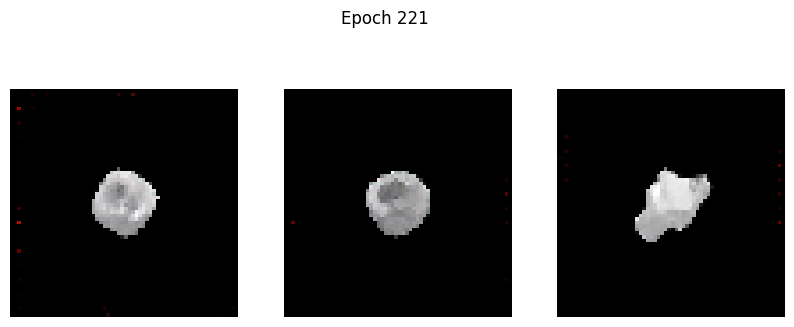

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1182 - g_loss: 3.5143
Epoch 222/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1265 - g_loss: 3.5887

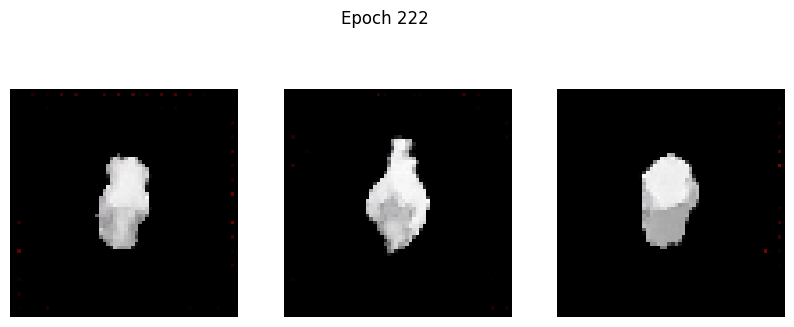

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1266 - g_loss: 3.5883
Epoch 223/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1090 - g_loss: 3.5419

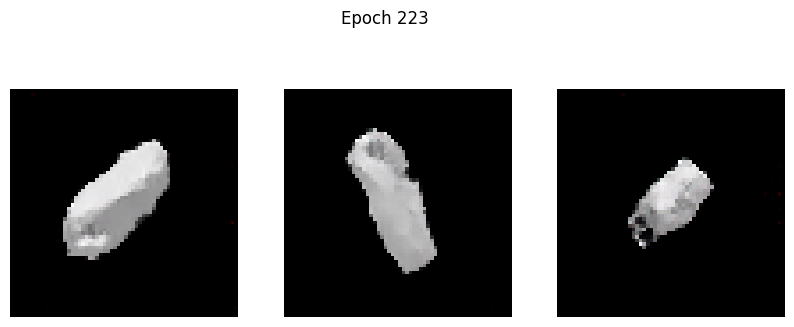

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1090 - g_loss: 3.5422
Epoch 224/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4945 - g_loss: 4.0224

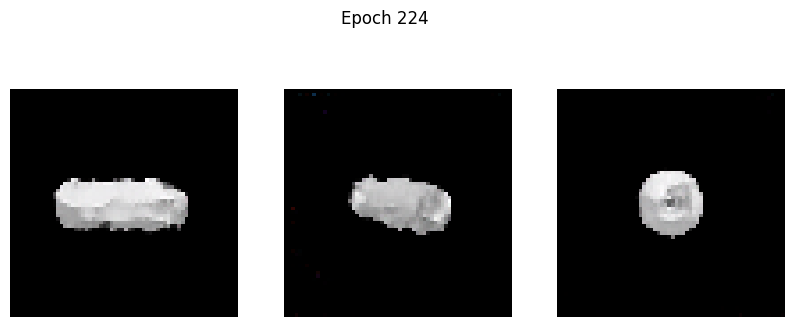

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4932 - g_loss: 4.0203
Epoch 225/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1032 - g_loss: 3.3757

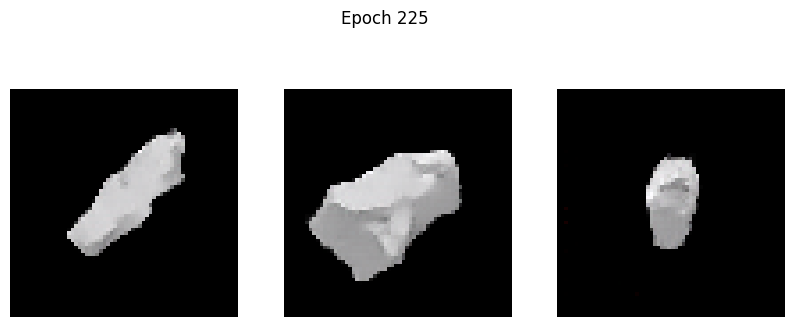

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1032 - g_loss: 3.3760
Epoch 226/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0901 - g_loss: 3.4803

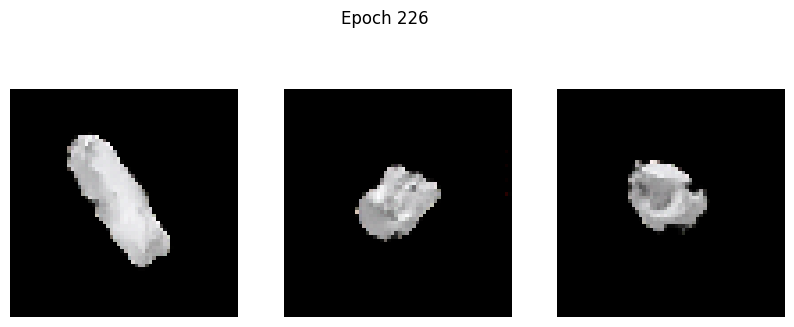

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0905 - g_loss: 3.4814
Epoch 227/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1556 - g_loss: 3.4113

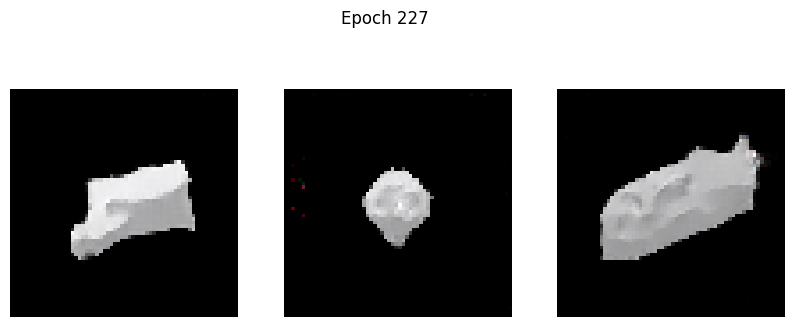

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1553 - g_loss: 3.4118
Epoch 228/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0788 - g_loss: 3.5397

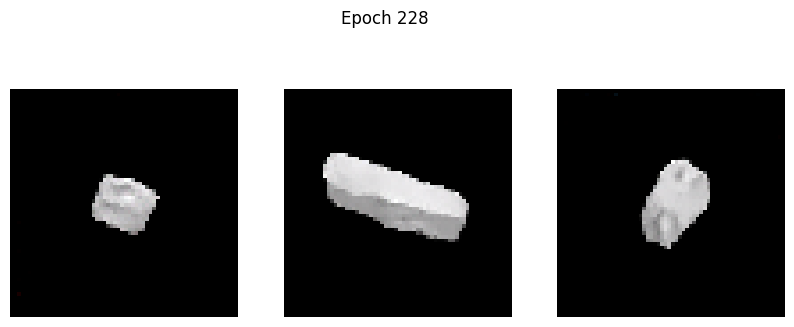

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0788 - g_loss: 3.5399
Epoch 229/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2346 - g_loss: 3.7759

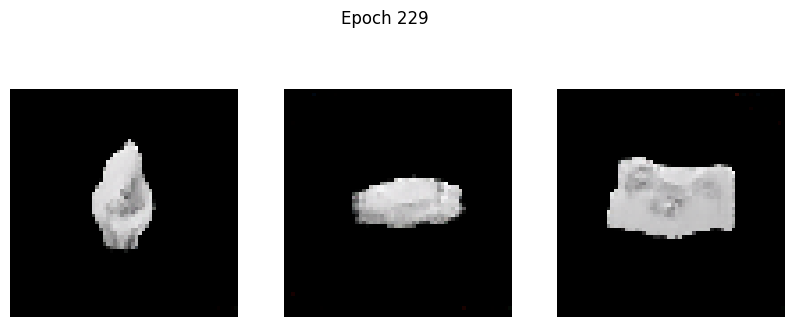

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2342 - g_loss: 3.7748
Epoch 230/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0766 - g_loss: 3.5253

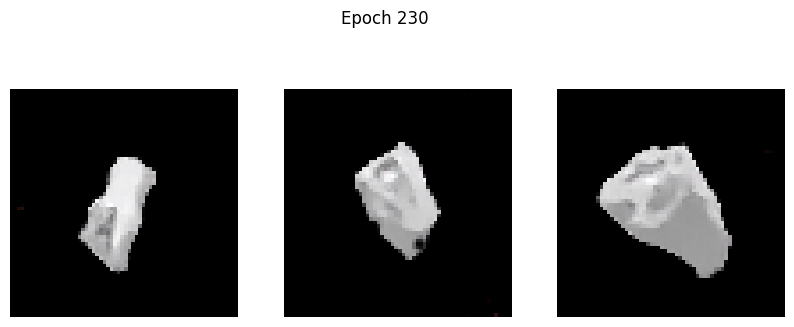

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0767 - g_loss: 3.5255
Epoch 231/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1048 - g_loss: 3.6449

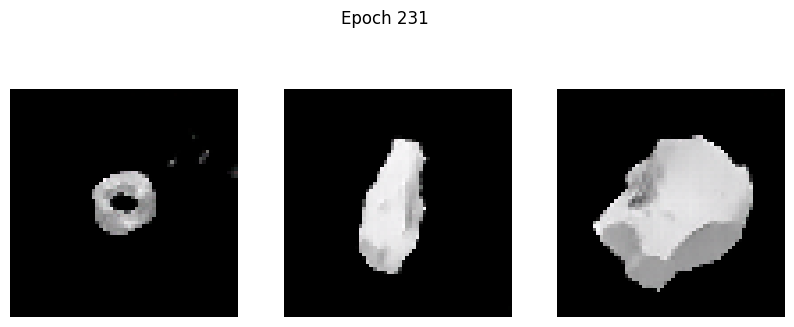

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1048 - g_loss: 3.6448
Epoch 232/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0834 - g_loss: 3.6022

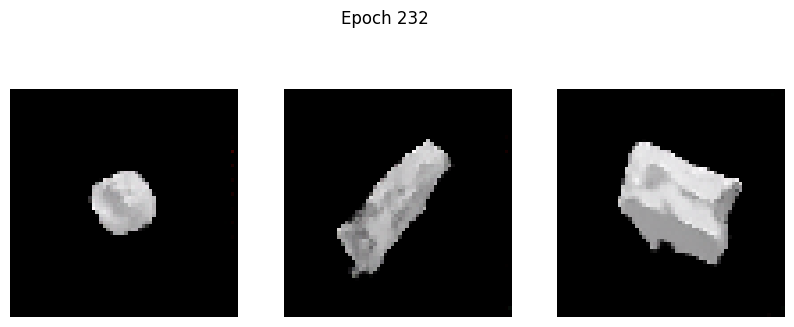

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0835 - g_loss: 3.6020
Epoch 233/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0838 - g_loss: 3.7354

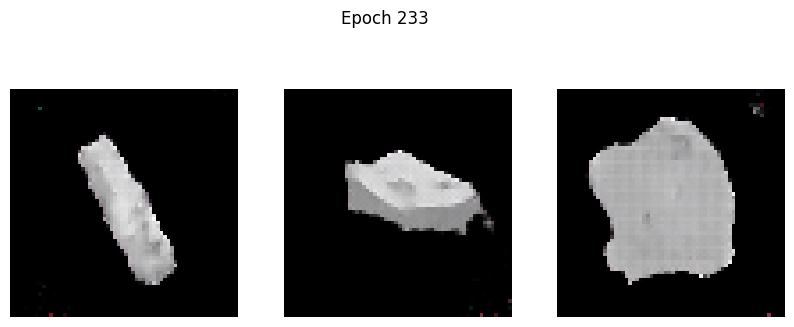

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0854 - g_loss: 3.7383
Epoch 234/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2388 - g_loss: 3.4810

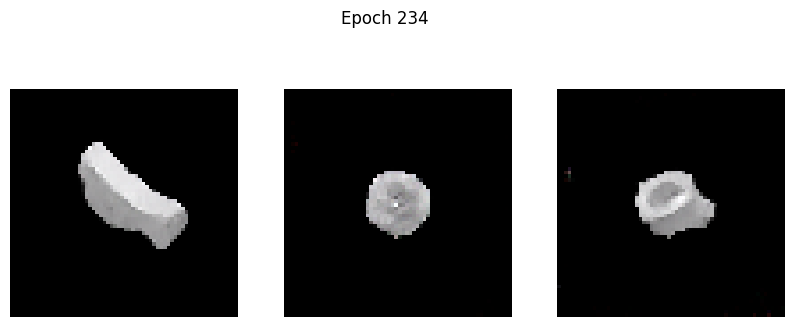

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2381 - g_loss: 3.4812
Epoch 235/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1007 - g_loss: 3.5875

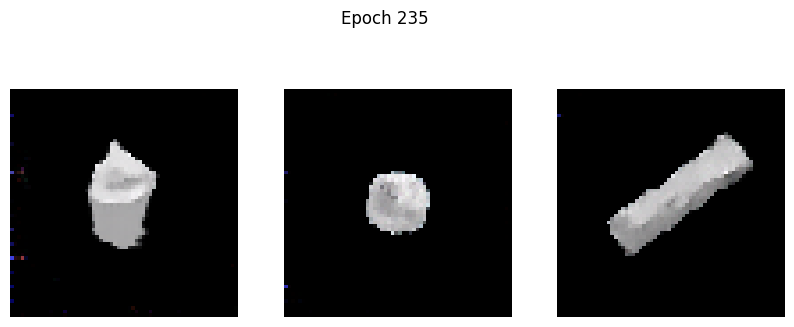

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1006 - g_loss: 3.5871
Epoch 236/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1968 - g_loss: 3.6793

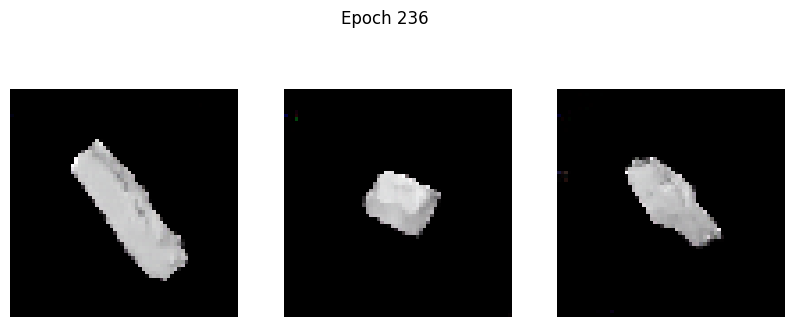

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1963 - g_loss: 3.6787
Epoch 237/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1148 - g_loss: 3.6688

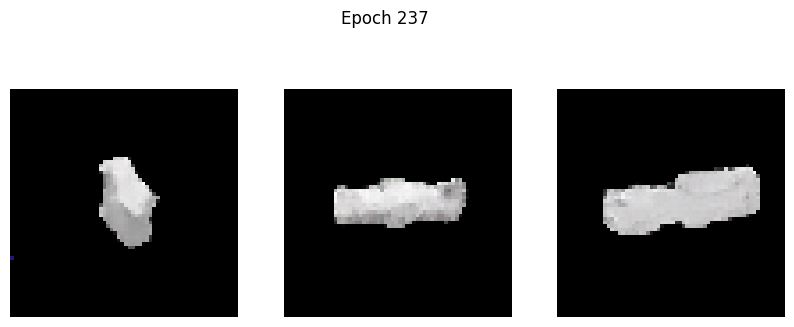

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1147 - g_loss: 3.6686
Epoch 238/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0840 - g_loss: 3.6556

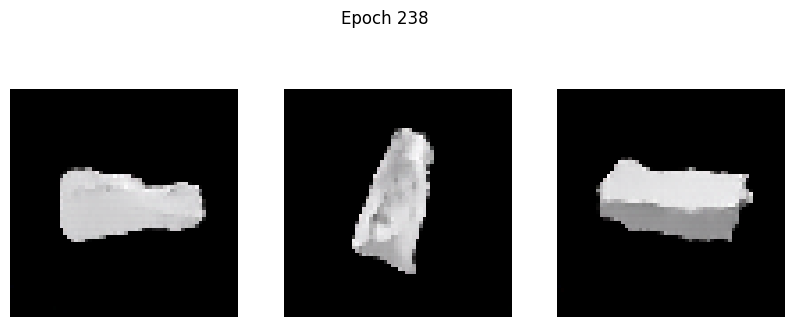

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0840 - g_loss: 3.6557
Epoch 239/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1184 - g_loss: 3.8256

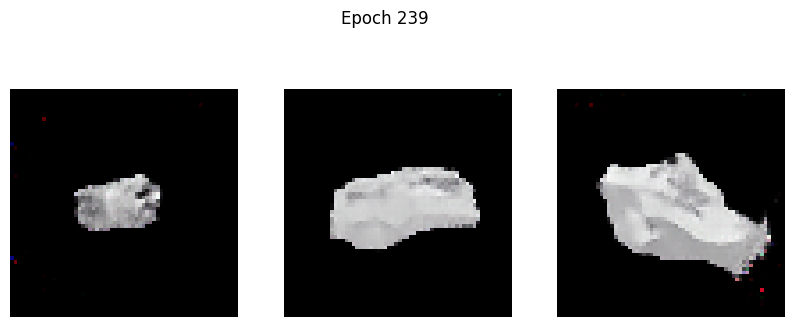

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1196 - g_loss: 3.8270
Epoch 240/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1203 - g_loss: 3.4606

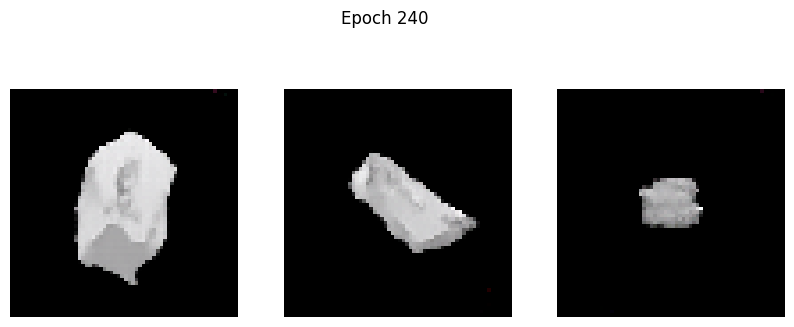

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1202 - g_loss: 3.4612
Epoch 241/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1144 - g_loss: 3.7294

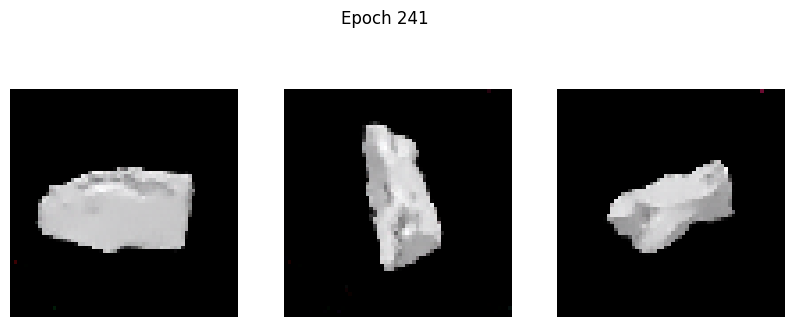

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1143 - g_loss: 3.7289
Epoch 242/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0909 - g_loss: 3.7859

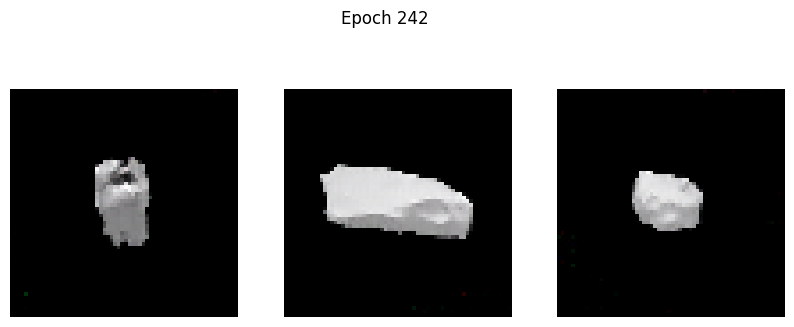

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0911 - g_loss: 3.7858
Epoch 243/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2042 - g_loss: 3.7539

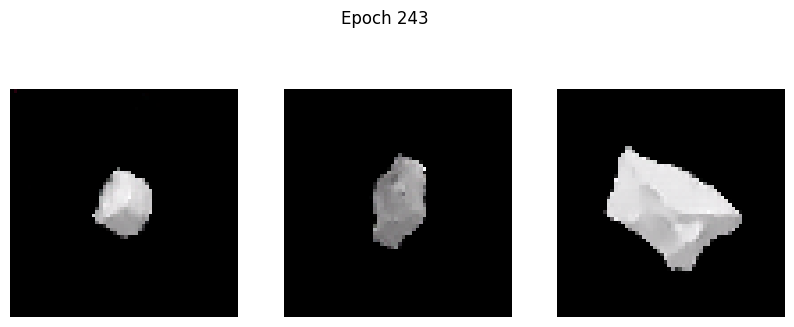

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2036 - g_loss: 3.7536
Epoch 244/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0794 - g_loss: 3.6774

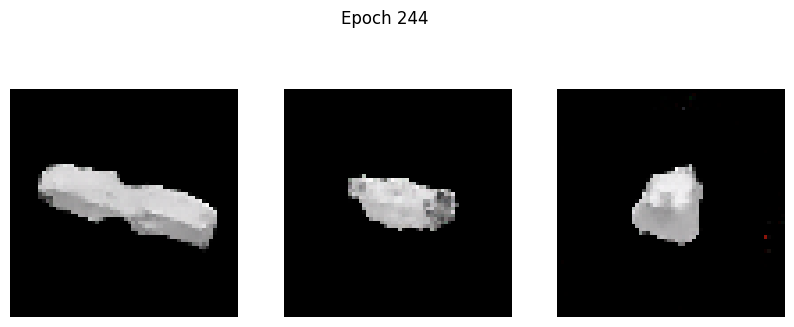

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0794 - g_loss: 3.6772
Epoch 245/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1105 - g_loss: 3.8215

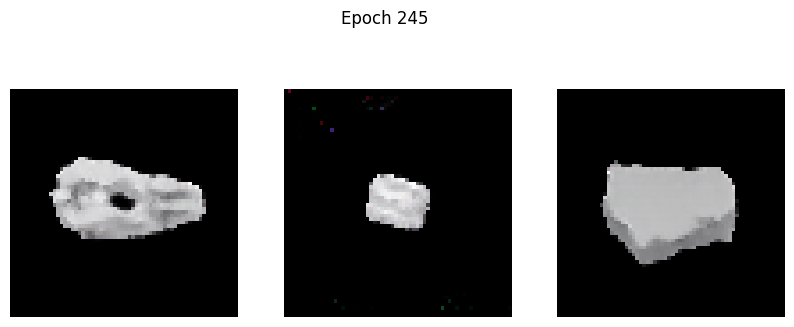

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1106 - g_loss: 3.8213
Epoch 246/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1009 - g_loss: 3.8042

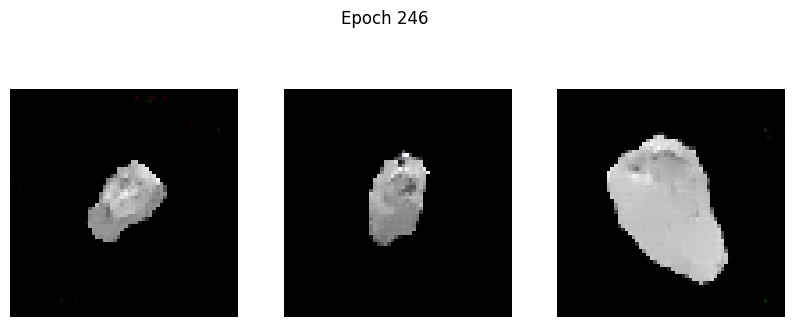

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1010 - g_loss: 3.8039
Epoch 247/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4134 - g_loss: 4.3264

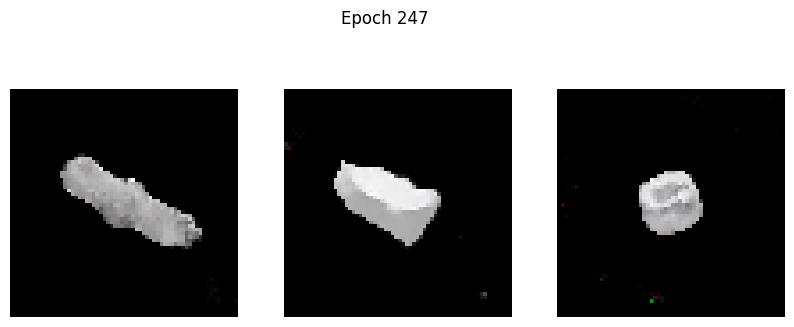

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4120 - g_loss: 4.3231
Epoch 248/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0726 - g_loss: 3.5781

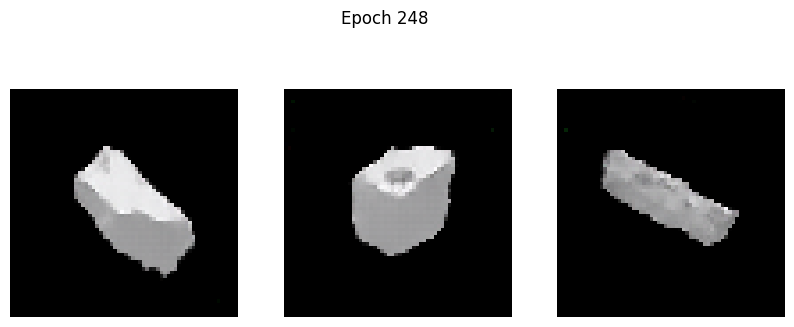

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0727 - g_loss: 3.5785
Epoch 249/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0785 - g_loss: 3.6449

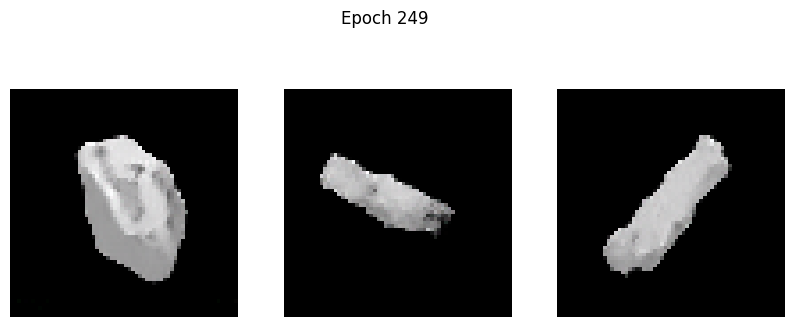

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0786 - g_loss: 3.6453
Epoch 250/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2769 - g_loss: 3.9527

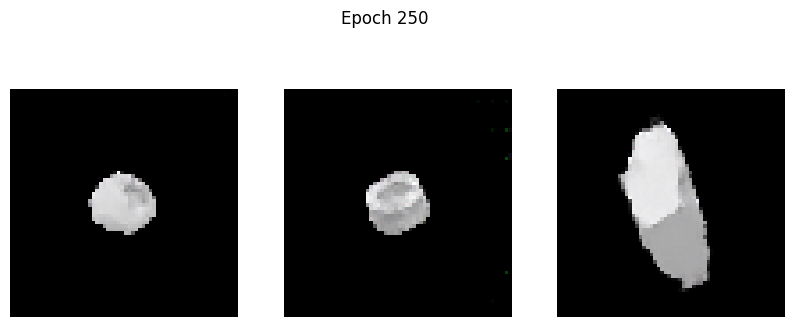

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2761 - g_loss: 3.9512
Epoch 251/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0957 - g_loss: 3.7951

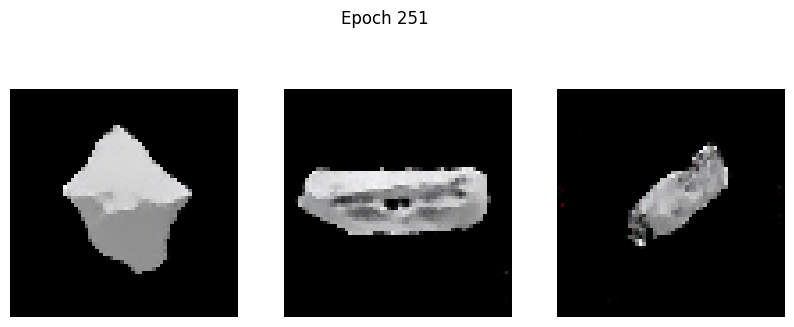

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0957 - g_loss: 3.7943
Epoch 252/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0868 - g_loss: 3.7327

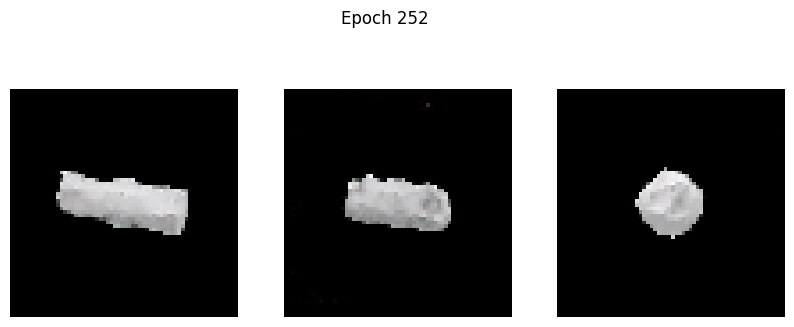

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0869 - g_loss: 3.7334
Epoch 253/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1336 - g_loss: 3.8665

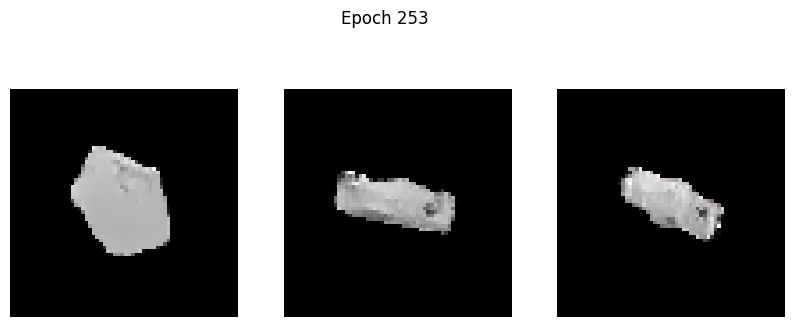

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1334 - g_loss: 3.8658
Epoch 254/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0628 - g_loss: 3.6563

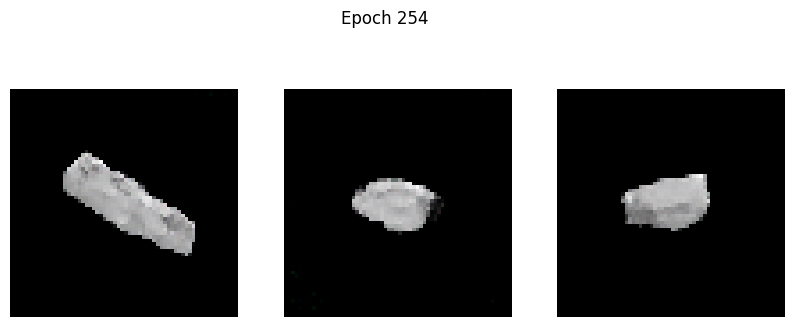

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0631 - g_loss: 3.6574
Epoch 255/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0683 - g_loss: 3.8249

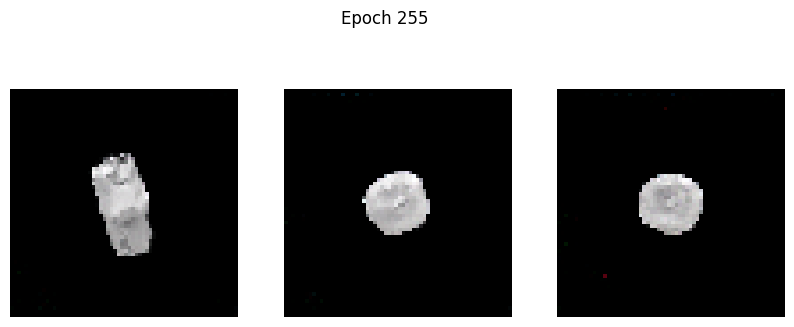

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0686 - g_loss: 3.8256
Epoch 256/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1222 - g_loss: 3.8212

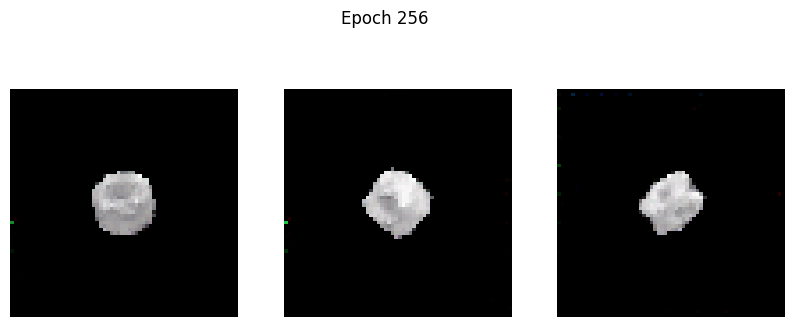

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1222 - g_loss: 3.8212
Epoch 257/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1136 - g_loss: 3.8008

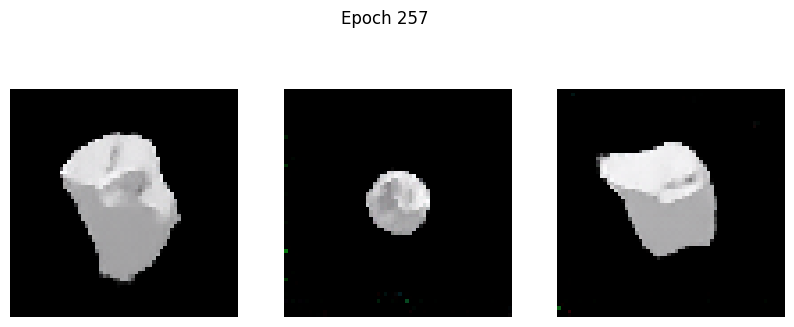

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1139 - g_loss: 3.8020
Epoch 258/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0920 - g_loss: 3.9131

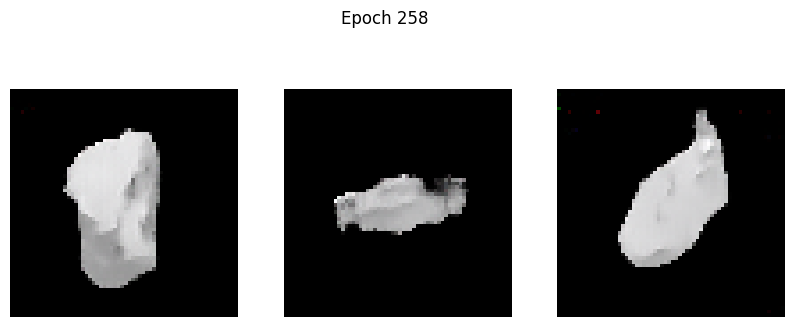

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0922 - g_loss: 3.9132
Epoch 259/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0821 - g_loss: 3.9577

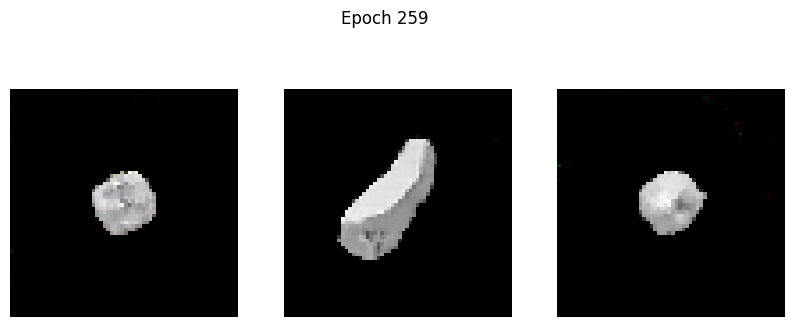

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0825 - g_loss: 3.9579
Epoch 260/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1065 - g_loss: 3.8100

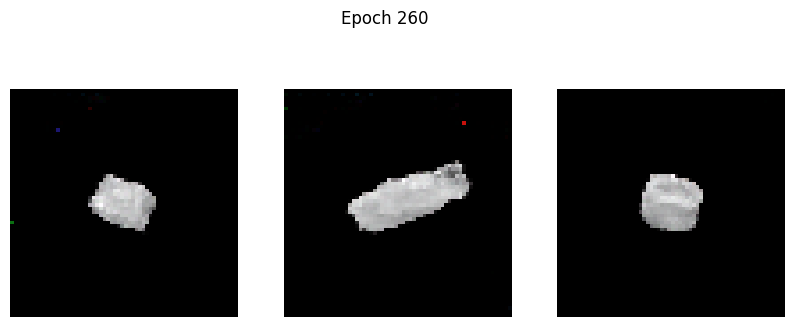

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1067 - g_loss: 3.8110
Epoch 261/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0791 - g_loss: 3.9217

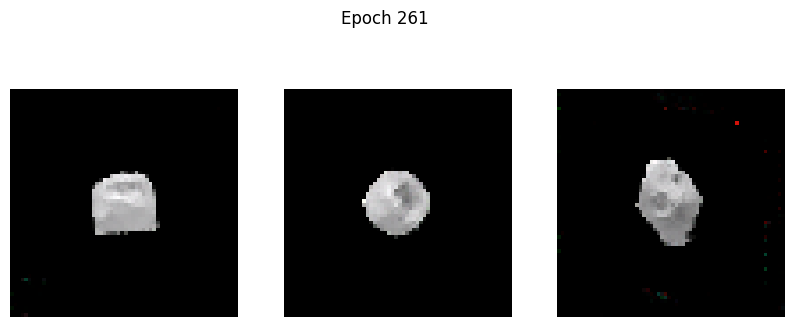

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0792 - g_loss: 3.9211
Epoch 262/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1075 - g_loss: 3.8858

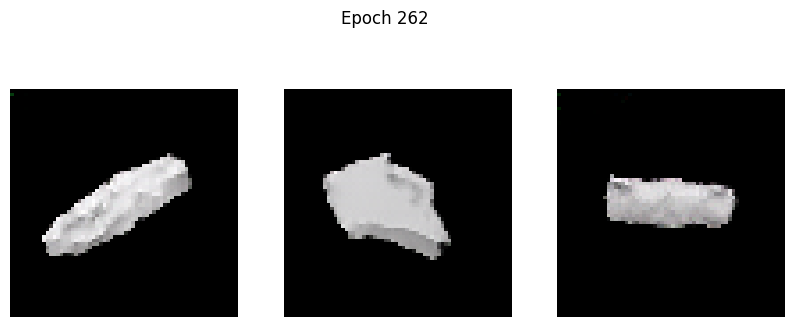

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1076 - g_loss: 3.8864
Epoch 263/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0752 - g_loss: 3.8492

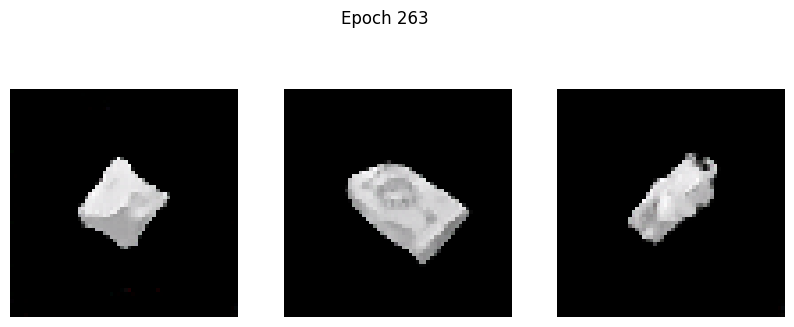

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0758 - g_loss: 3.8514
Epoch 264/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0742 - g_loss: 3.7807

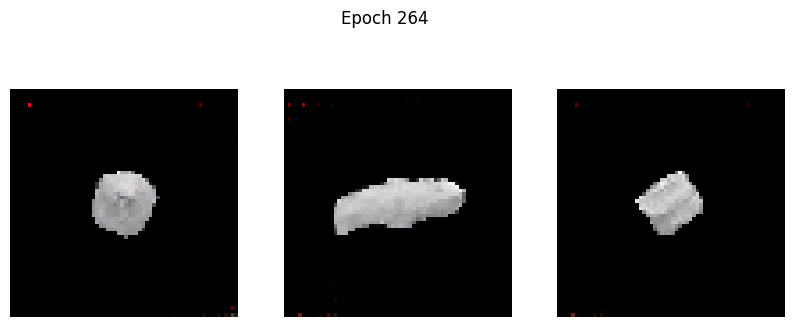

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0742 - g_loss: 3.7814
Epoch 265/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0921 - g_loss: 3.9634

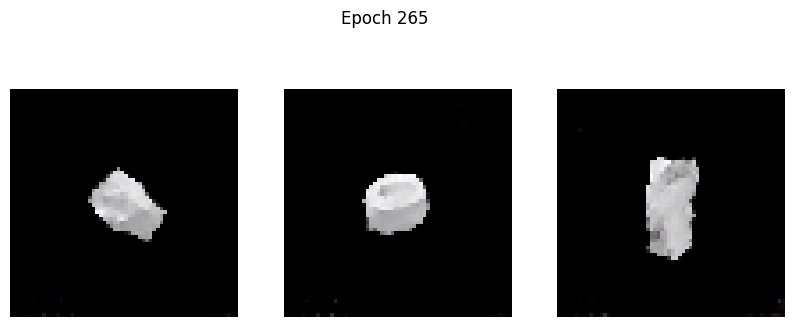

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0922 - g_loss: 3.9636
Epoch 266/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0719 - g_loss: 3.9434

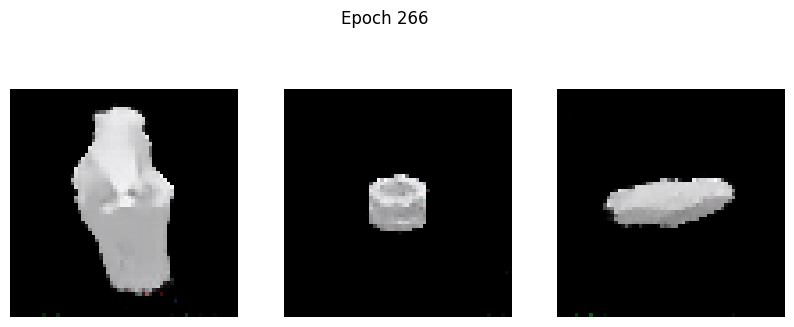

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0719 - g_loss: 3.9439
Epoch 267/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1322 - g_loss: 4.1410

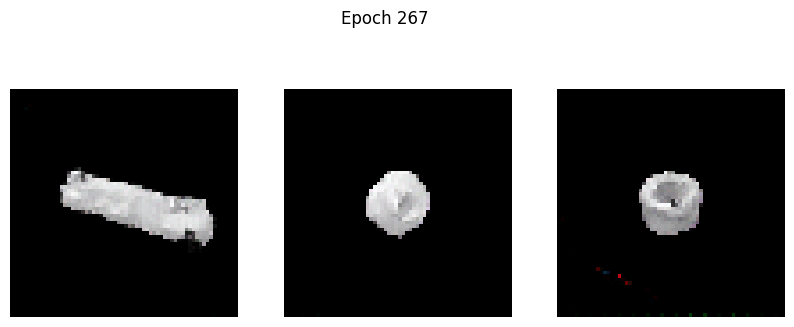

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1320 - g_loss: 4.1403
Epoch 268/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0893 - g_loss: 3.9938

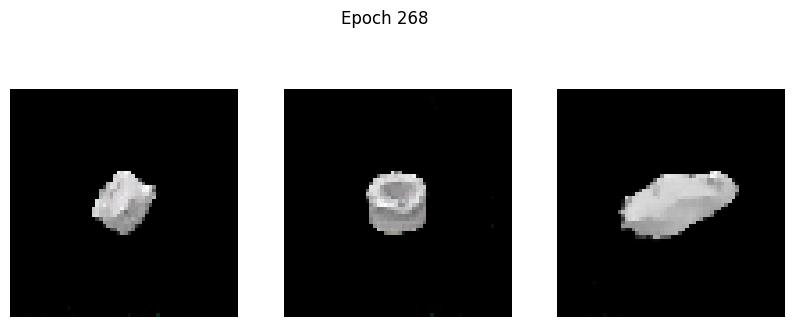

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0894 - g_loss: 3.9936
Epoch 269/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0896 - g_loss: 3.9063

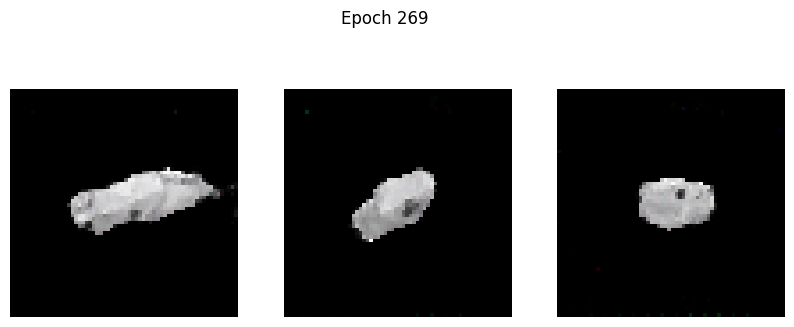

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0897 - g_loss: 3.9067
Epoch 270/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1400 - g_loss: 4.2397

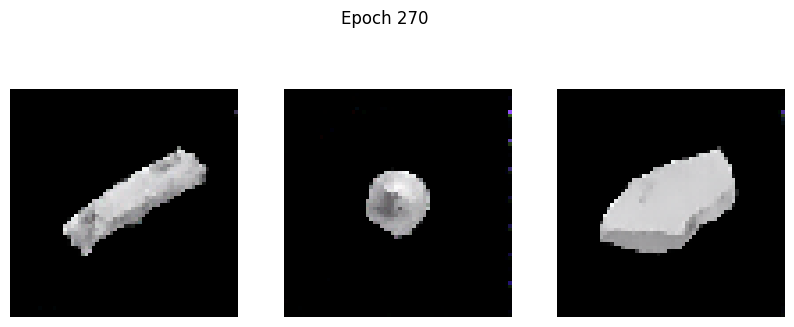

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1399 - g_loss: 4.2382
Epoch 271/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0687 - g_loss: 4.0801

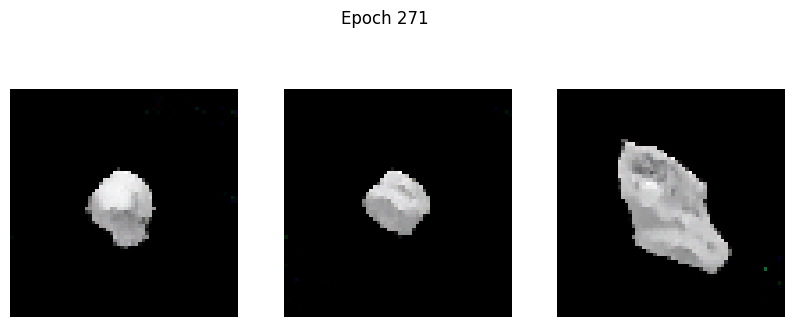

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0688 - g_loss: 4.0798
Epoch 272/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1756 - g_loss: 4.0226

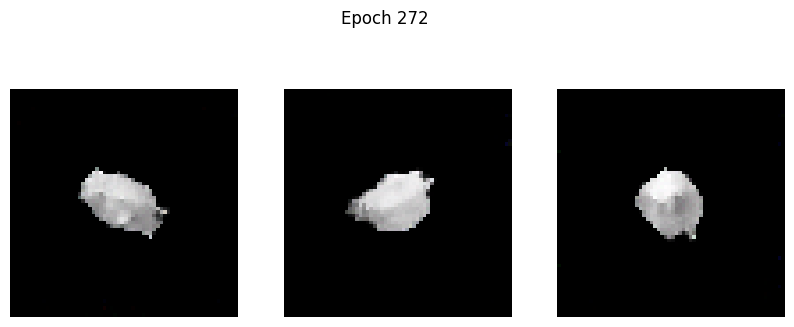

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1770 - g_loss: 4.0246
Epoch 273/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1125 - g_loss: 3.8564

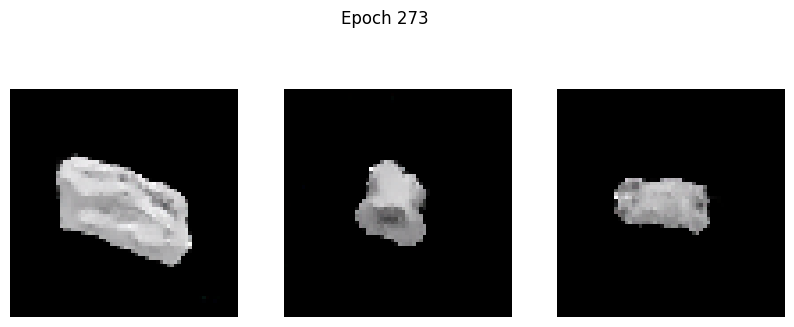

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1123 - g_loss: 3.8568
Epoch 274/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0716 - g_loss: 3.9899

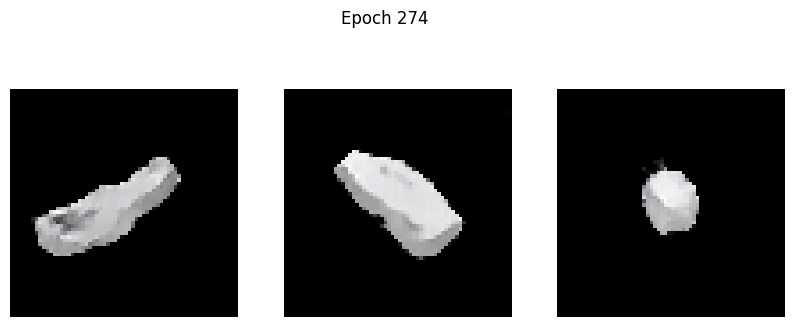

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0715 - g_loss: 3.9893
Epoch 275/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0688 - g_loss: 3.9117

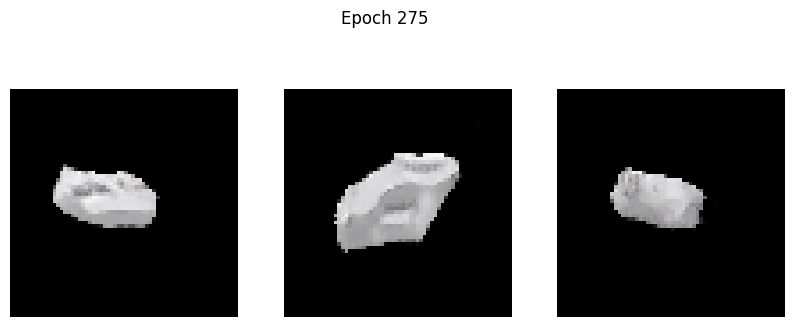

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0688 - g_loss: 3.9118
Epoch 276/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0755 - g_loss: 4.0040

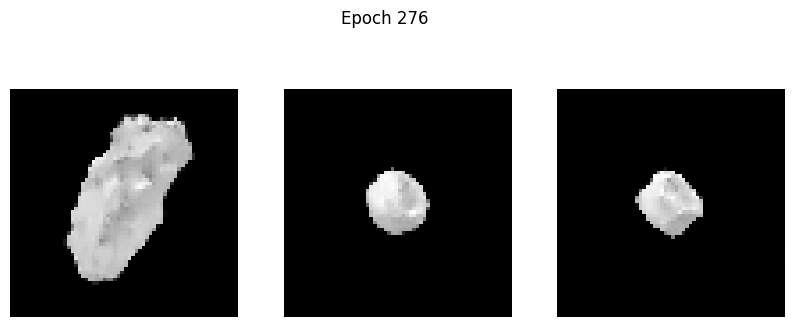

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0753 - g_loss: 4.0034
Epoch 277/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1041 - g_loss: 4.0719

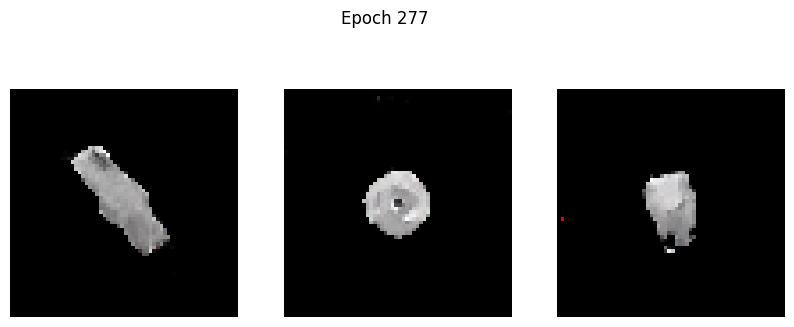

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1047 - g_loss: 4.0734
Epoch 278/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0617 - g_loss: 4.0134

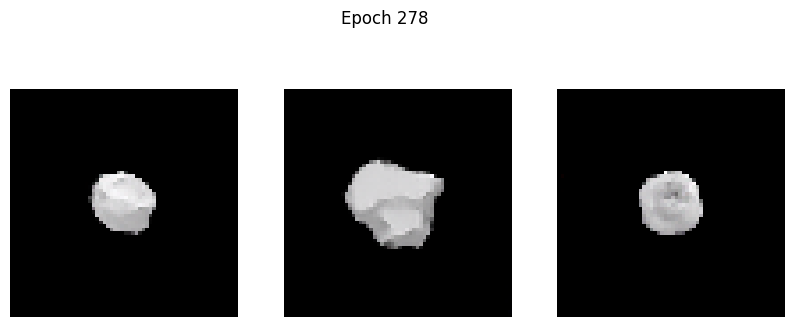

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0617 - g_loss: 4.0136
Epoch 279/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0705 - g_loss: 4.0351

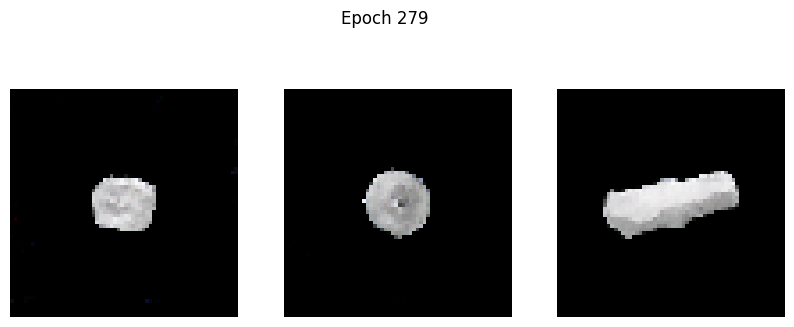

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0706 - g_loss: 4.0355
Epoch 280/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0922 - g_loss: 4.0540

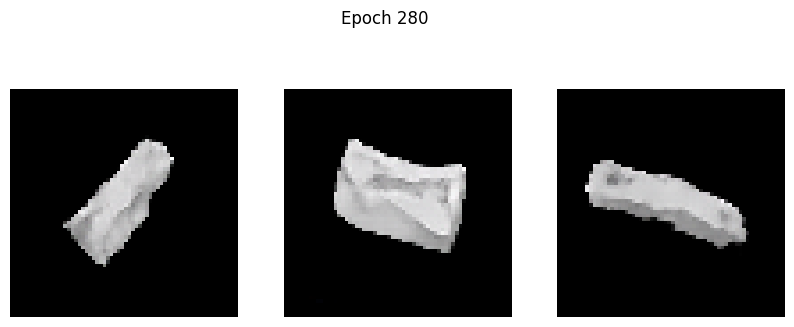

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0921 - g_loss: 4.0537
Epoch 281/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0971 - g_loss: 4.1856

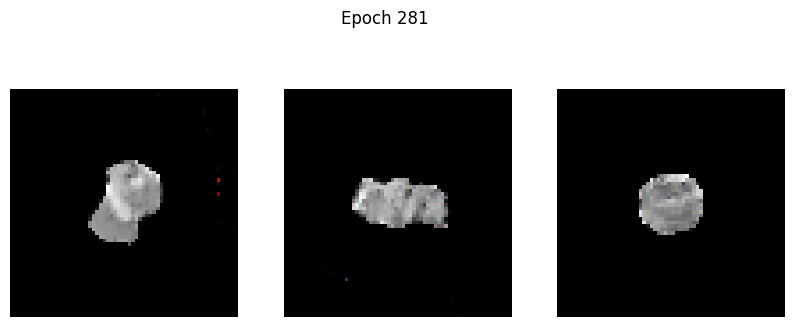

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0987 - g_loss: 4.1889
Epoch 282/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1447 - g_loss: 4.1241

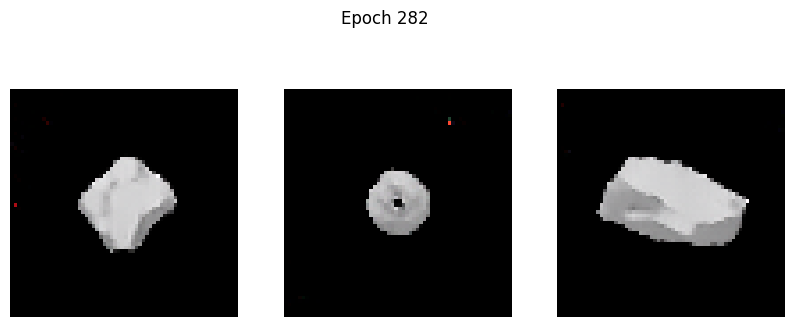

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1442 - g_loss: 4.1229
Epoch 283/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1085 - g_loss: 4.1882

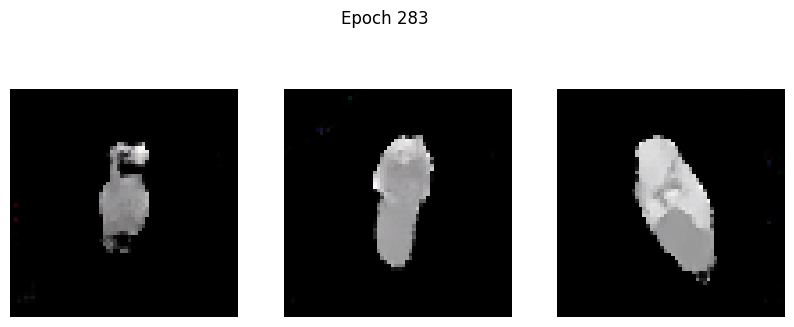

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1083 - g_loss: 4.1870
Epoch 284/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0670 - g_loss: 4.0399

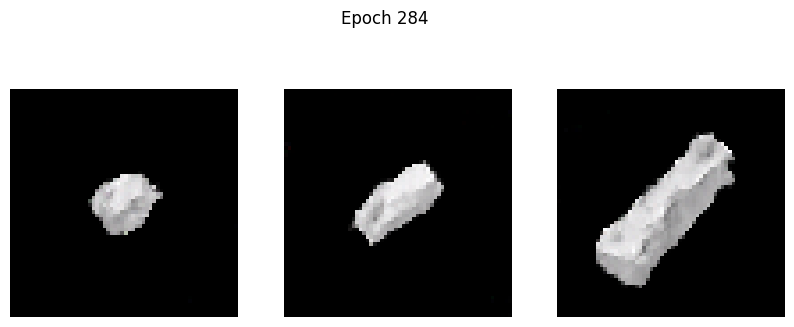

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0670 - g_loss: 4.0394
Epoch 285/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1821 - g_loss: 4.1557

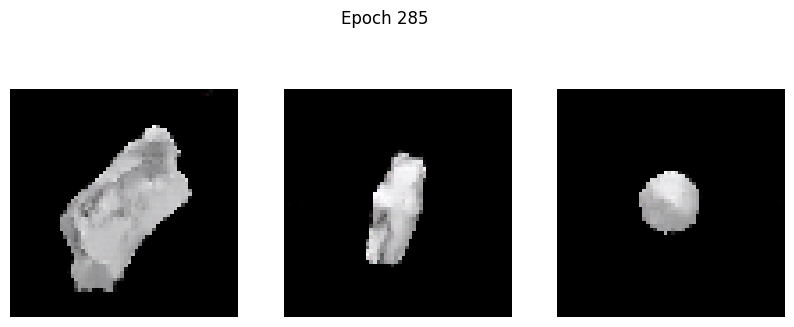

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1816 - g_loss: 4.1548
Epoch 286/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0599 - g_loss: 3.9153

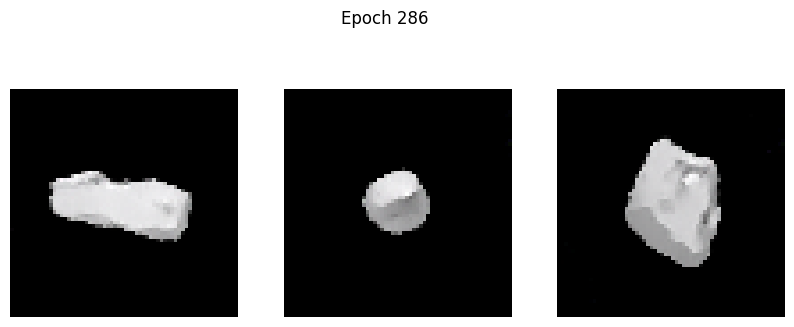

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0599 - g_loss: 3.9160
Epoch 287/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1063 - g_loss: 4.0461

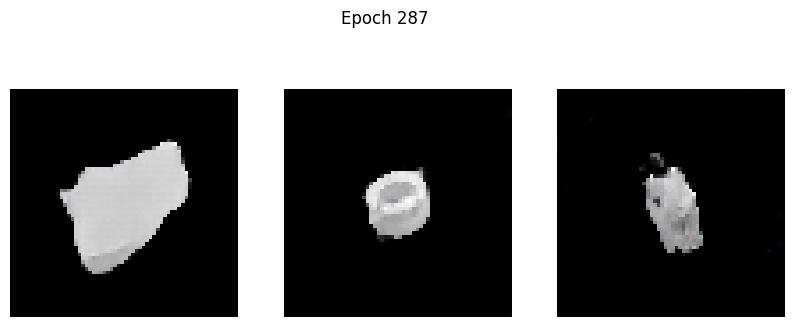

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1063 - g_loss: 4.0462
Epoch 288/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1138 - g_loss: 4.1895

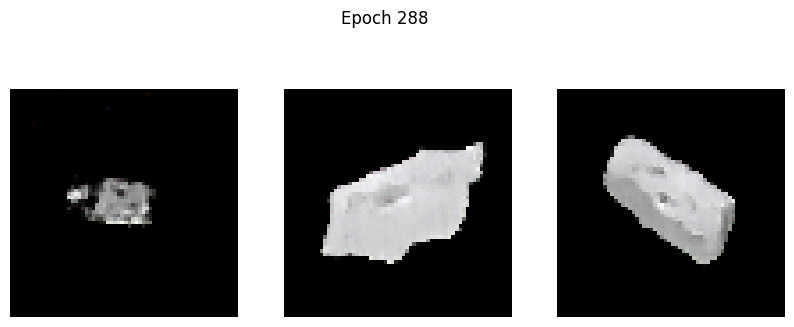

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1162 - g_loss: 4.1947
Epoch 289/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1160 - g_loss: 4.0124

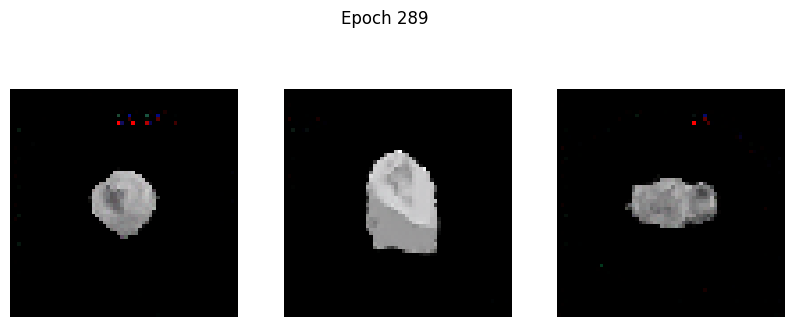

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1157 - g_loss: 4.0111
Epoch 290/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0708 - g_loss: 3.8788

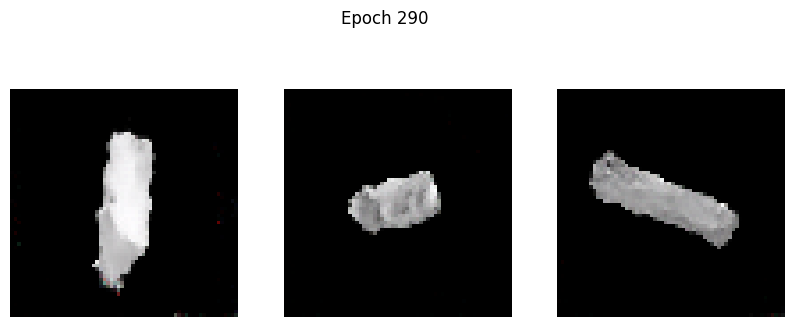

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0708 - g_loss: 3.8800
Epoch 291/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0840 - g_loss: 4.0862

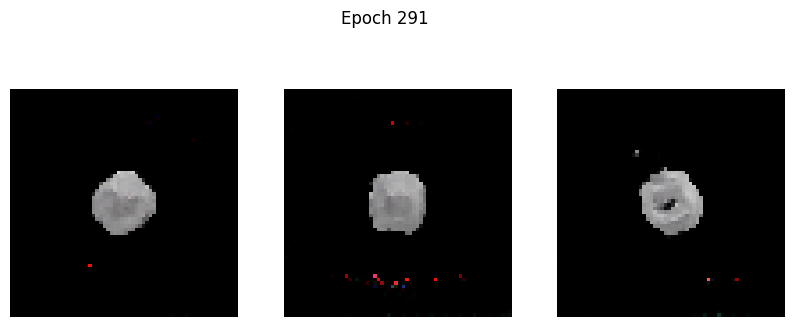

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0839 - g_loss: 4.0855
Epoch 292/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0484 - g_loss: 3.9288

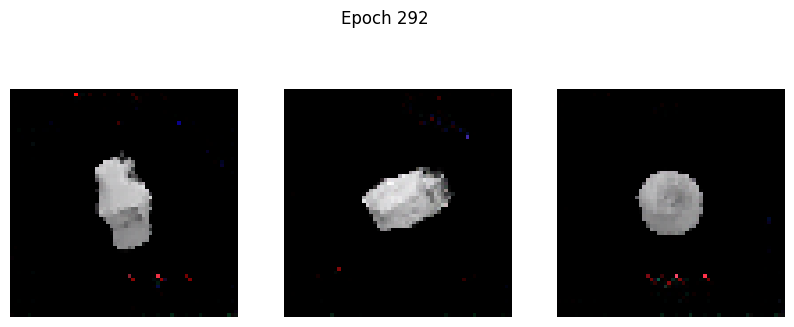

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0485 - g_loss: 3.9300
Epoch 293/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0534 - g_loss: 4.0887

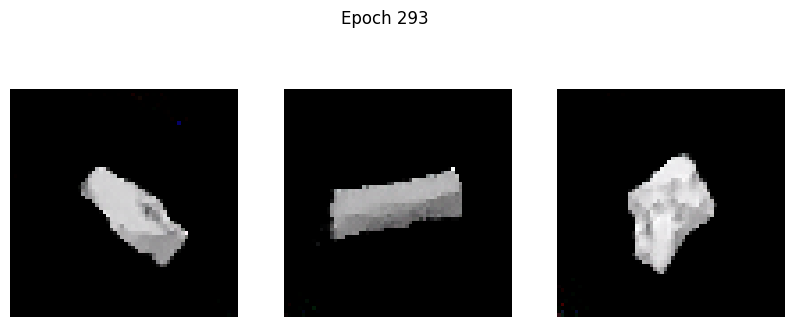

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0534 - g_loss: 4.0885
Epoch 294/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0700 - g_loss: 4.1840

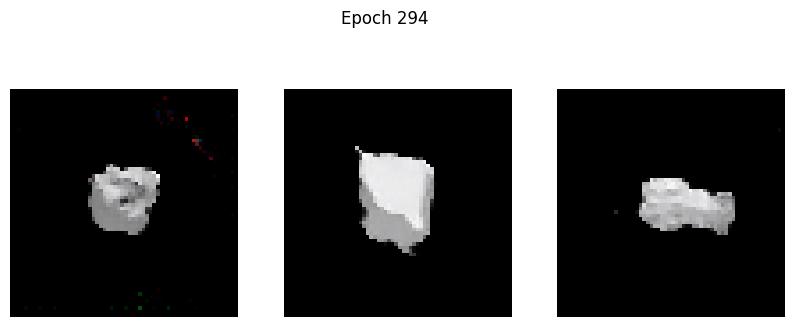

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0700 - g_loss: 4.1841
Epoch 295/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0570 - g_loss: 4.1658

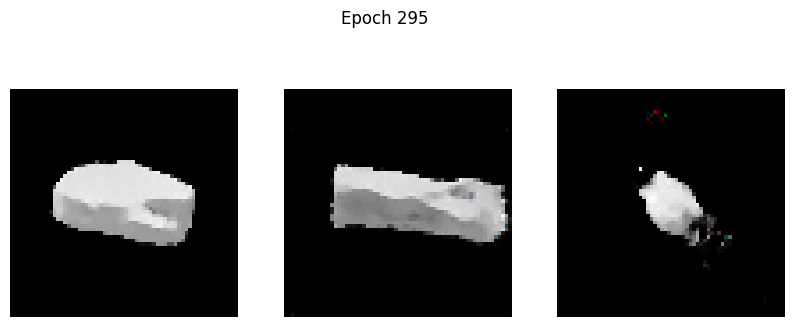

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0571 - g_loss: 4.1657
Epoch 296/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2377 - g_loss: 4.5045

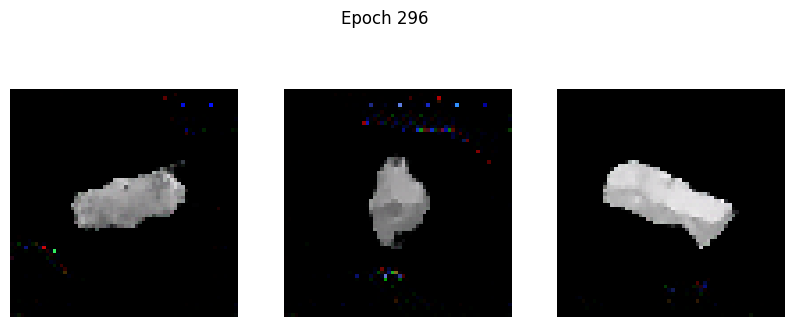

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2380 - g_loss: 4.5034
Epoch 297/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0510 - g_loss: 3.8753

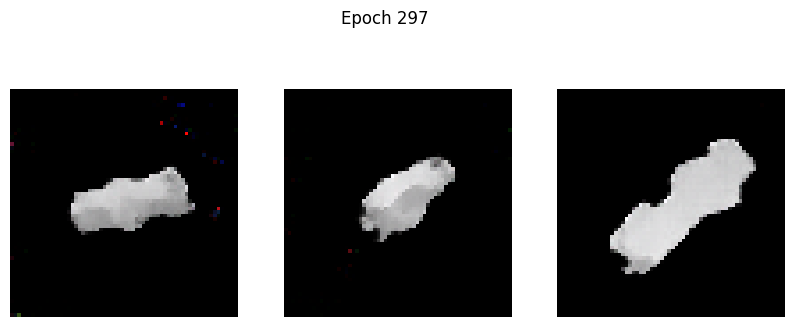

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0510 - g_loss: 3.8762
Epoch 298/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0513 - g_loss: 4.0541

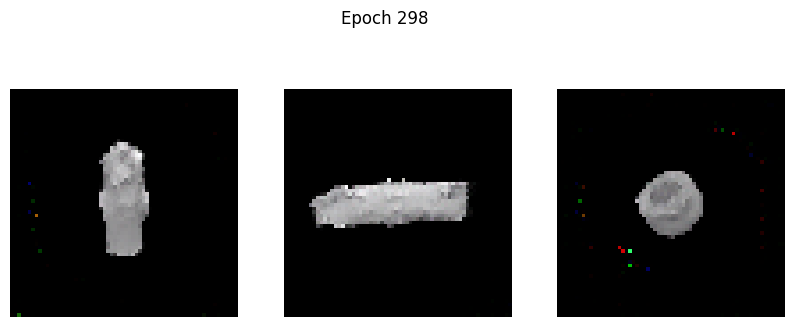

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0514 - g_loss: 4.0545
Epoch 299/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0591 - g_loss: 4.1172

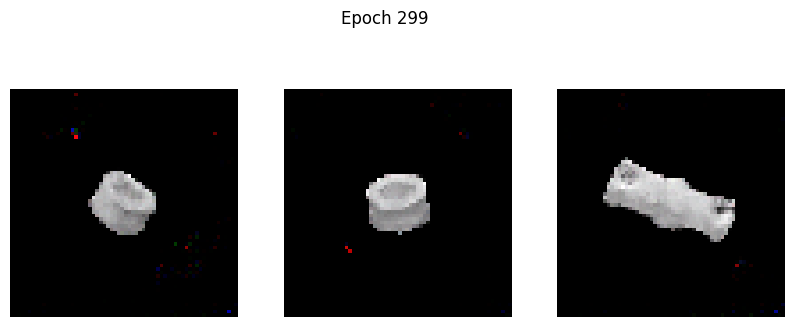

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0592 - g_loss: 4.1178
Epoch 300/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1108 - g_loss: 4.2610

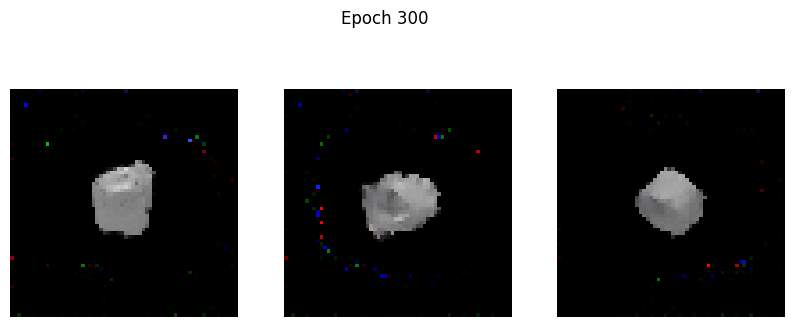

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1105 - g_loss: 4.2600
Epoch 301/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0610 - g_loss: 4.2074

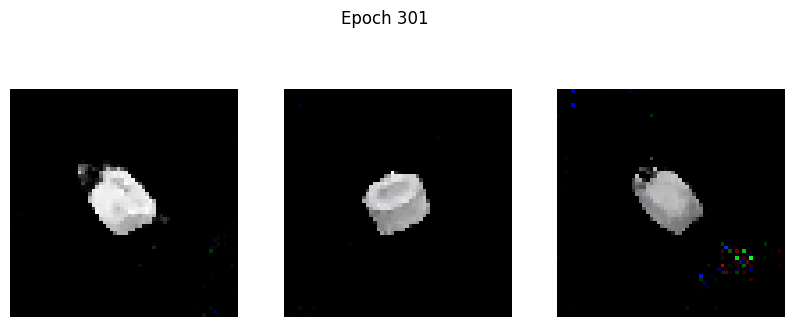

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0611 - g_loss: 4.2075
Epoch 302/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0749 - g_loss: 4.2965

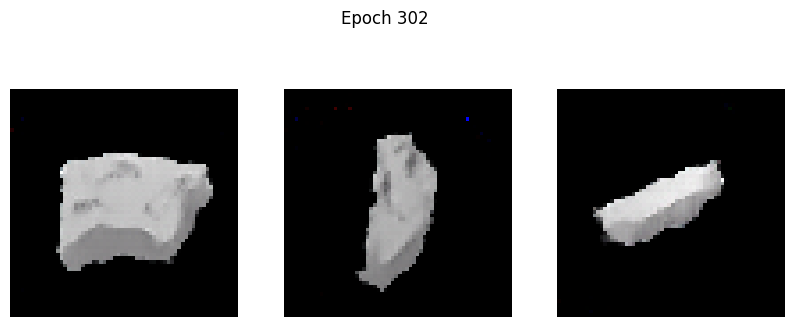

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0753 - g_loss: 4.2968
Epoch 303/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1742 - g_loss: 4.4205

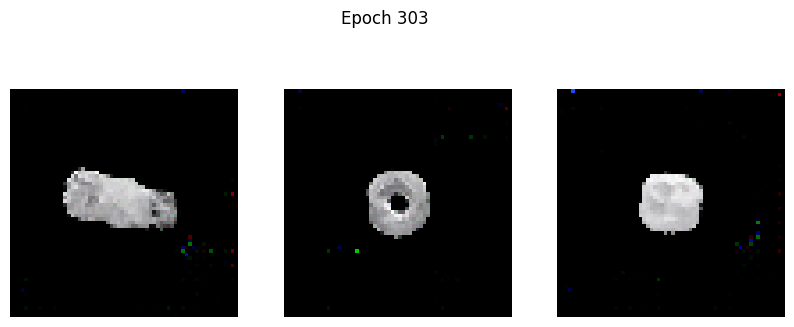

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1734 - g_loss: 4.4192
Epoch 304/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0661 - g_loss: 4.3074

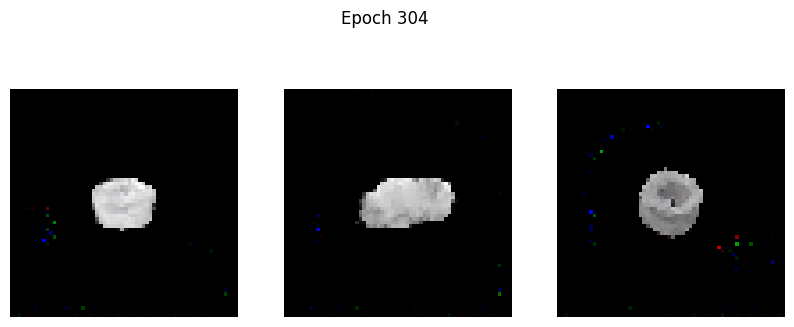

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0661 - g_loss: 4.3068
Epoch 305/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0619 - g_loss: 4.1165

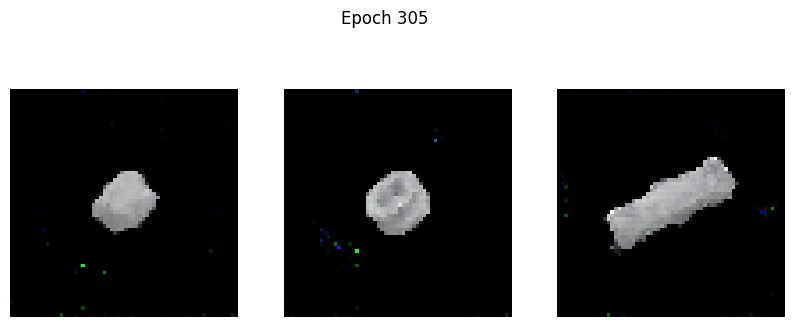

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0620 - g_loss: 4.1173
Epoch 306/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0476 - g_loss: 4.3745

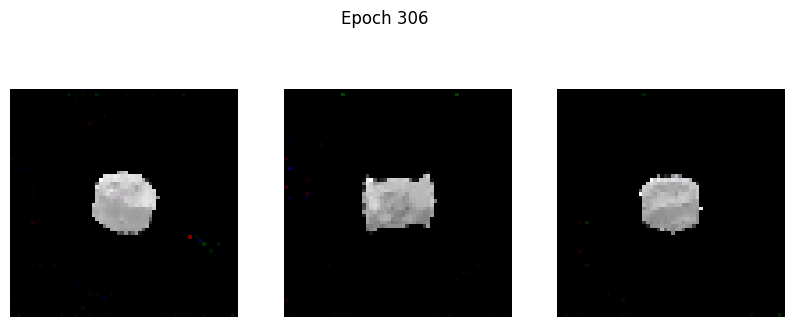

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0477 - g_loss: 4.3742
Epoch 307/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0603 - g_loss: 4.2137

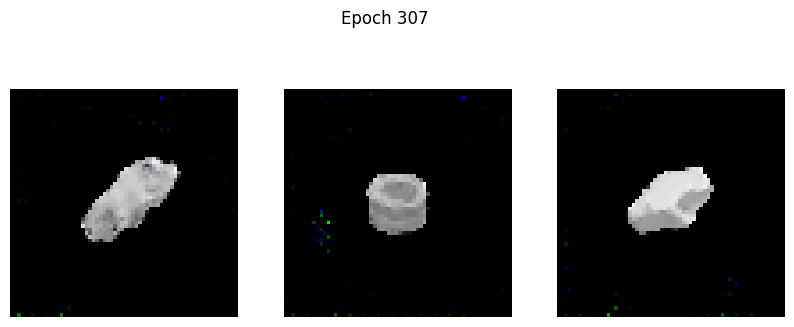

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0605 - g_loss: 4.2146
Epoch 308/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0625 - g_loss: 4.2916

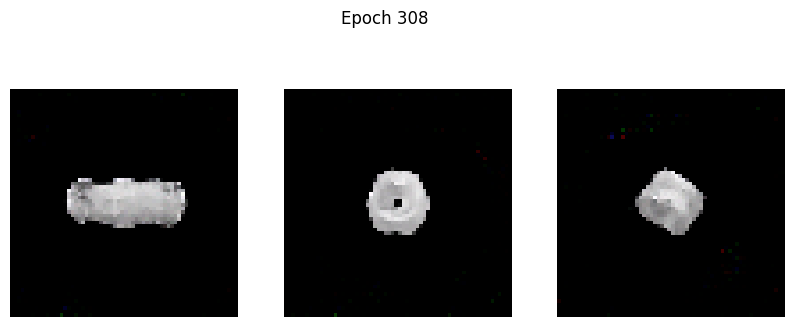

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0625 - g_loss: 4.2918
Epoch 309/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0883 - g_loss: 4.3387

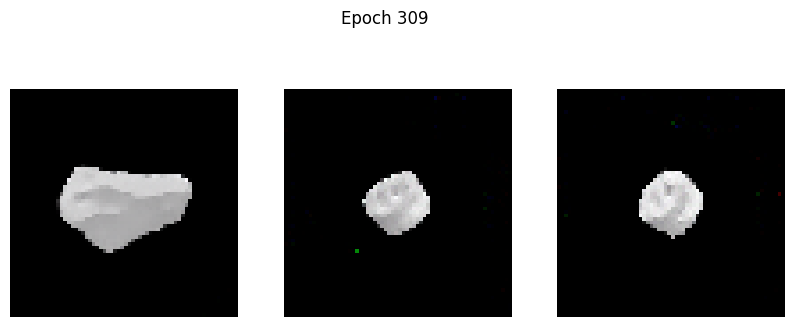

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0882 - g_loss: 4.3388
Epoch 310/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0376 - g_loss: 4.2596

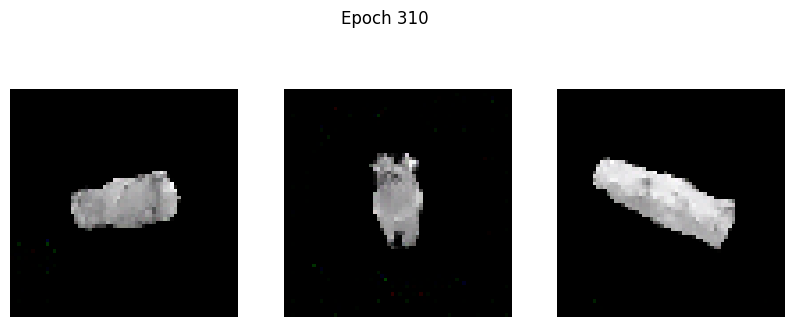

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0376 - g_loss: 4.2595
Epoch 311/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.8824 - g_loss: 6.7847

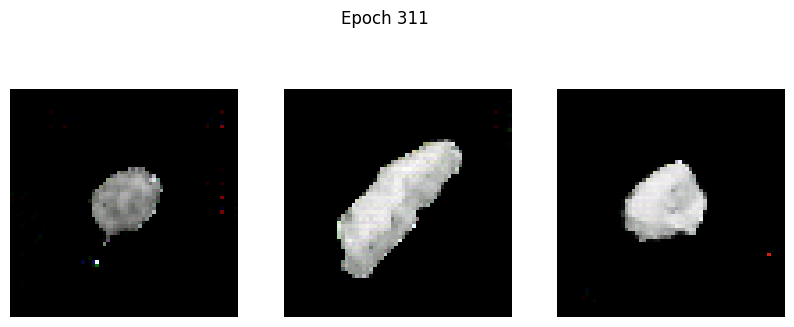

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.8864 - g_loss: 6.7906
Epoch 312/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2400 - g_loss: 3.2246

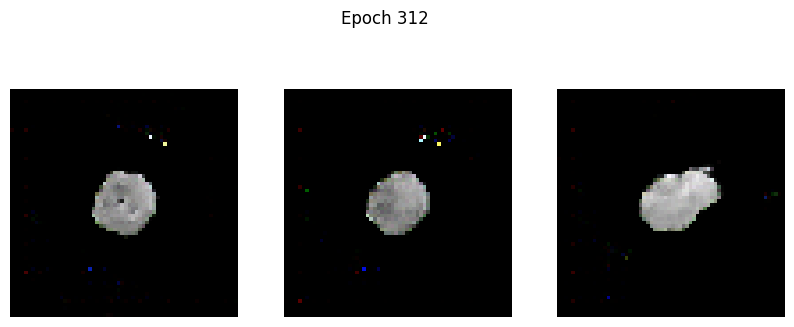

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2396 - g_loss: 3.2252
Epoch 313/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1194 - g_loss: 3.5932

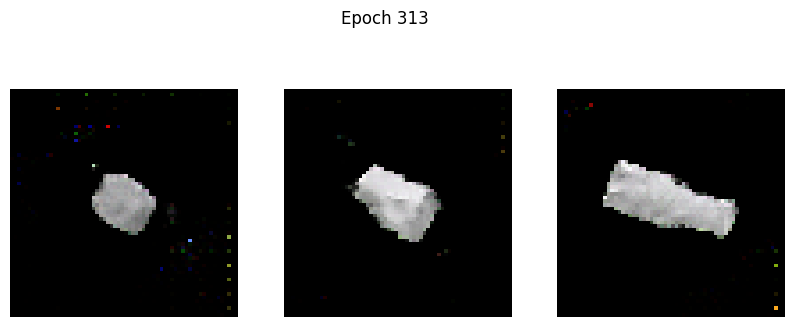

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1193 - g_loss: 3.5930
Epoch 314/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0823 - g_loss: 3.6660

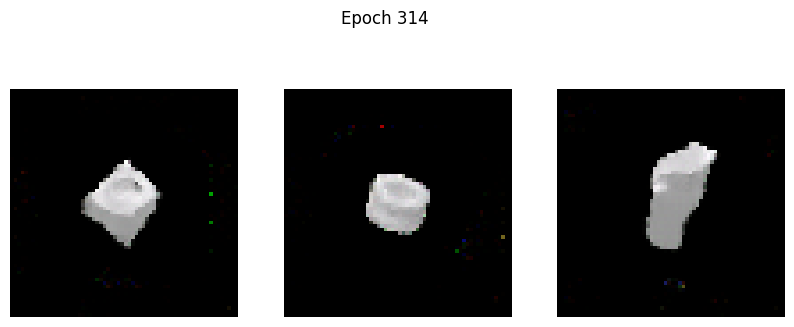

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0823 - g_loss: 3.6658
Epoch 315/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0769 - g_loss: 3.7329

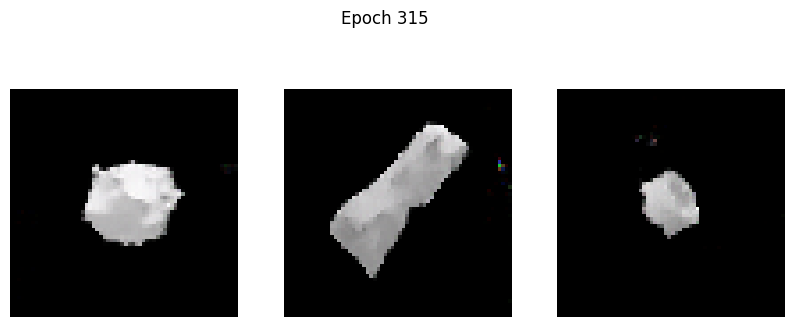

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0769 - g_loss: 3.7333
Epoch 316/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0553 - g_loss: 3.7998

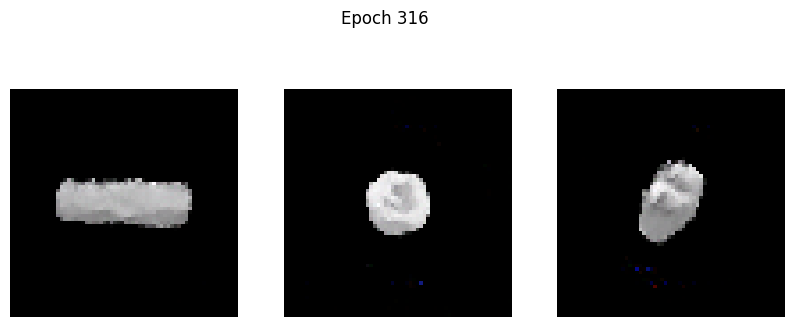

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0554 - g_loss: 3.8002
Epoch 317/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0603 - g_loss: 3.9647

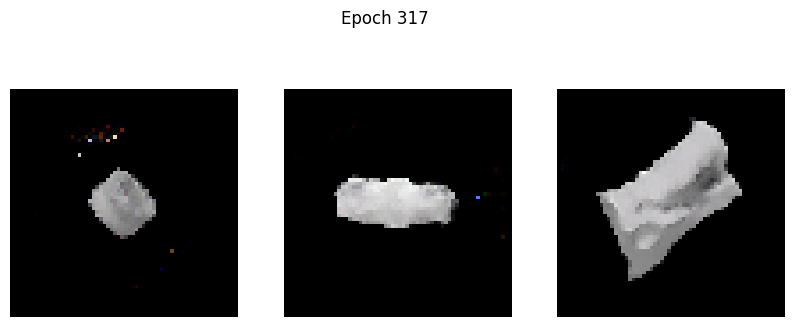

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0603 - g_loss: 3.9650
Epoch 318/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0573 - g_loss: 4.0817

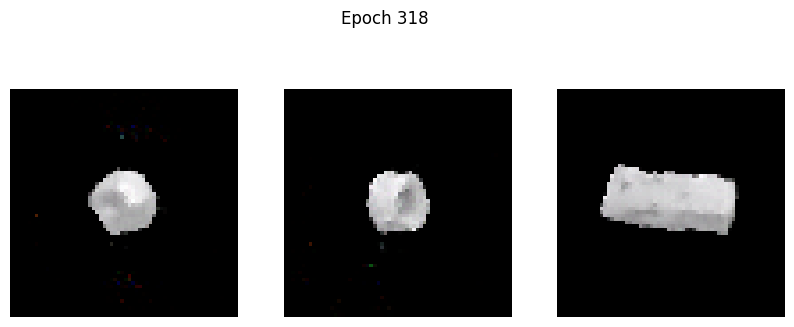

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0574 - g_loss: 4.0818
Epoch 319/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0655 - g_loss: 4.1398

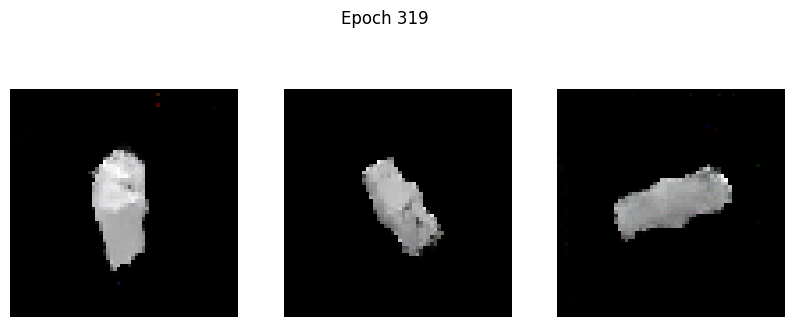

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0655 - g_loss: 4.1395
Epoch 320/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0443 - g_loss: 4.0564

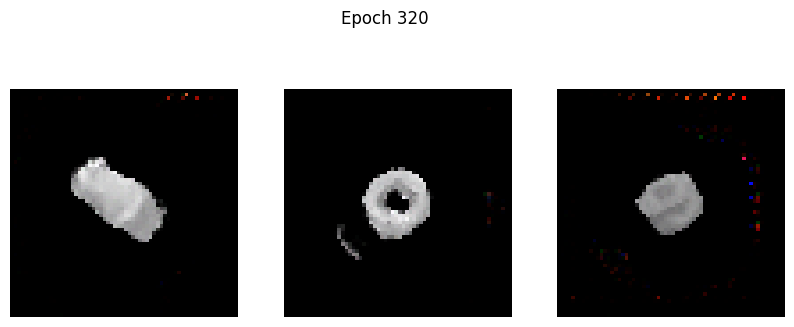

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0446 - g_loss: 4.0572
Epoch 321/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0660 - g_loss: 4.3241

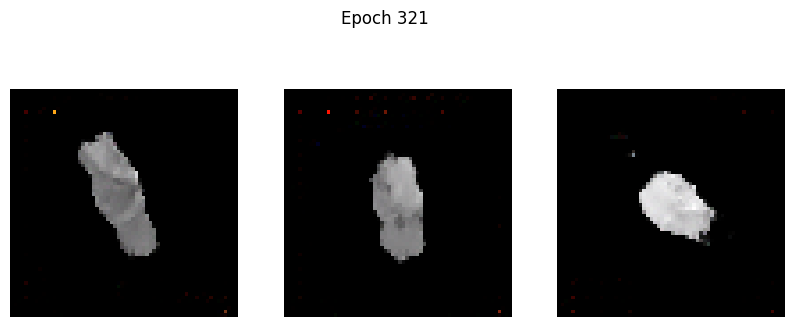

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0659 - g_loss: 4.3226
Epoch 322/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0621 - g_loss: 4.3919

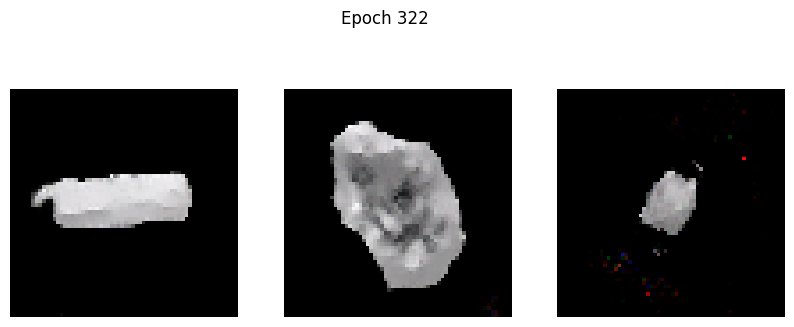

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0620 - g_loss: 4.3900
Epoch 323/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0990 - g_loss: 4.3905

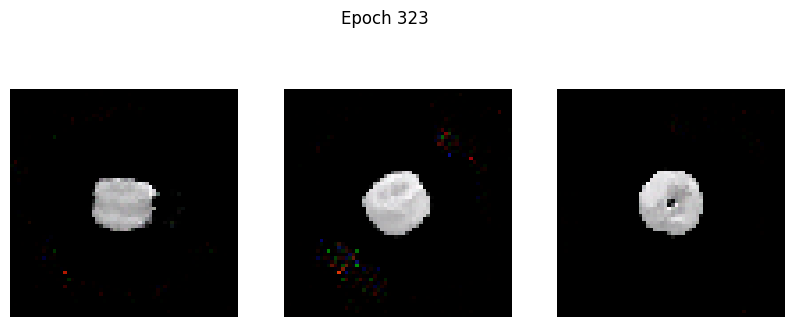

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0991 - g_loss: 4.3903
Epoch 324/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0509 - g_loss: 4.1145

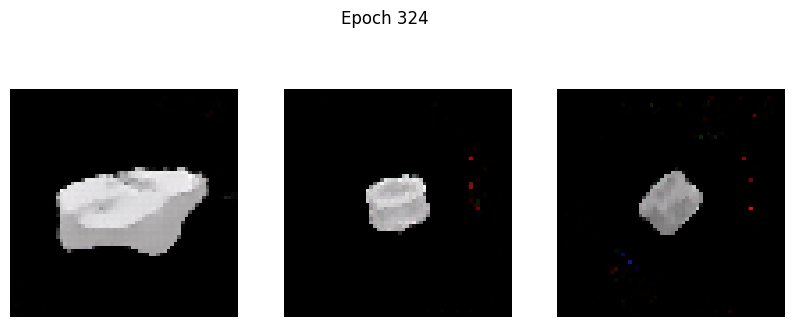

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0510 - g_loss: 4.1163
Epoch 325/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0593 - g_loss: 4.3310

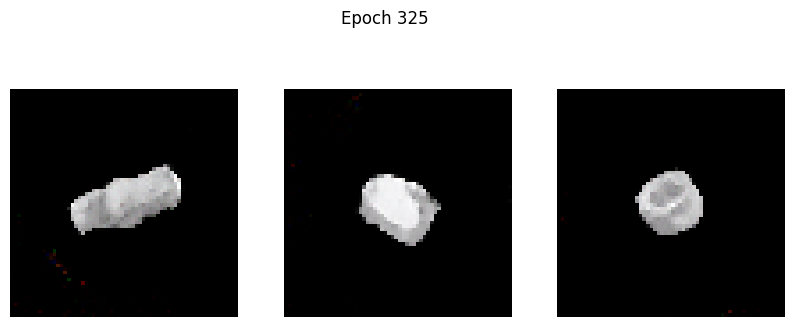

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0595 - g_loss: 4.3313
Epoch 326/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0799 - g_loss: 4.3352

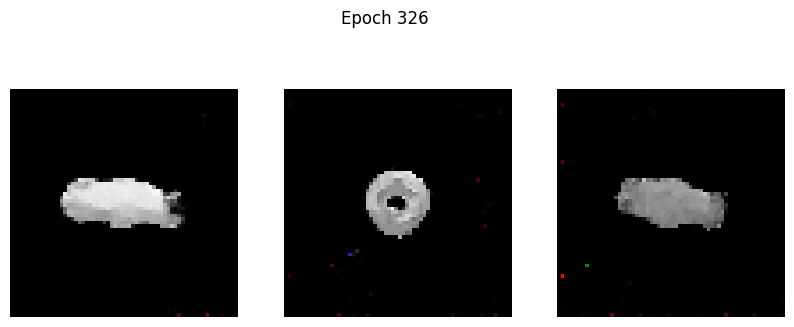

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0798 - g_loss: 4.3349
Epoch 327/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0692 - g_loss: 4.3456

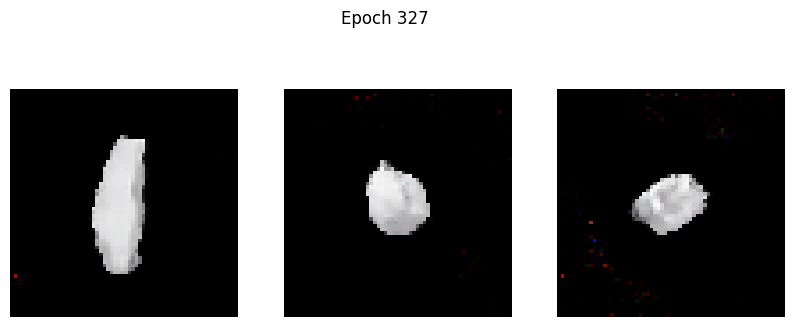

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0693 - g_loss: 4.3456
Epoch 328/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0558 - g_loss: 4.3498

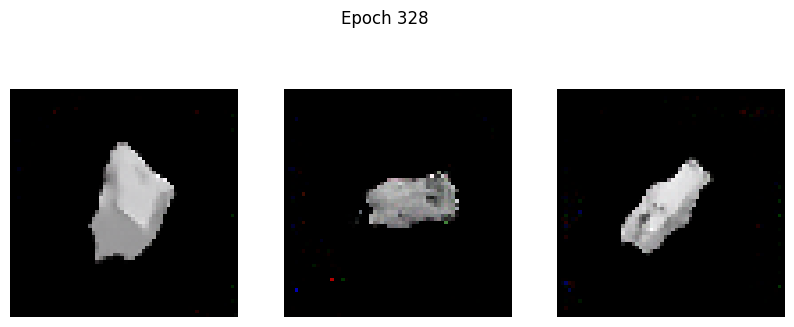

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0558 - g_loss: 4.3488
Epoch 329/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0447 - g_loss: 4.1494

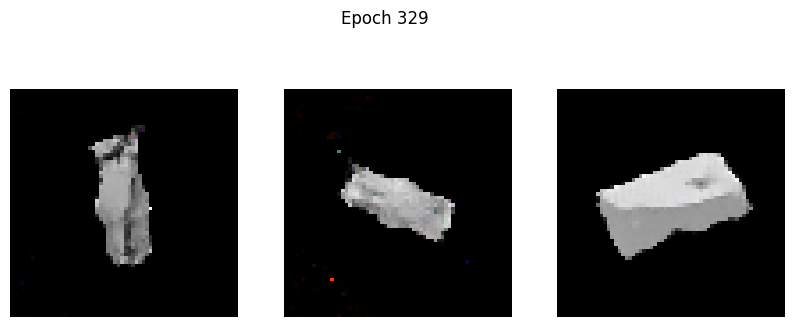

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0448 - g_loss: 4.1501
Epoch 330/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0456 - g_loss: 4.3422

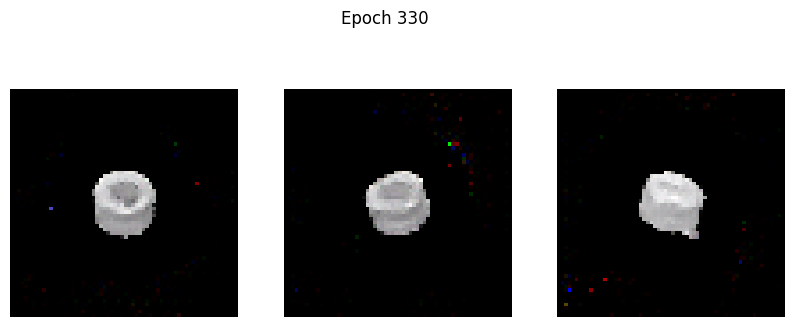

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0460 - g_loss: 4.3434
Epoch 331/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1043 - g_loss: 4.4434

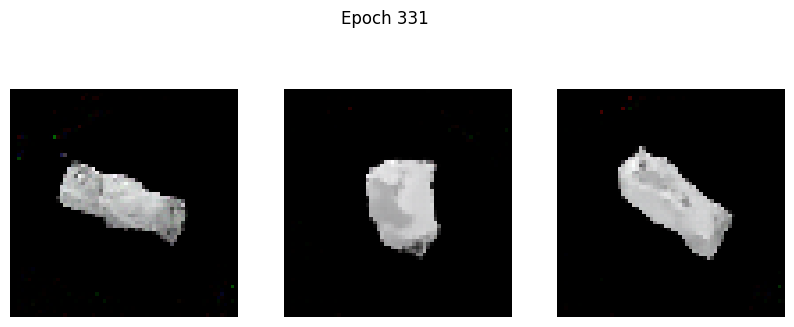

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1040 - g_loss: 4.4426
Epoch 332/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0444 - g_loss: 4.2672

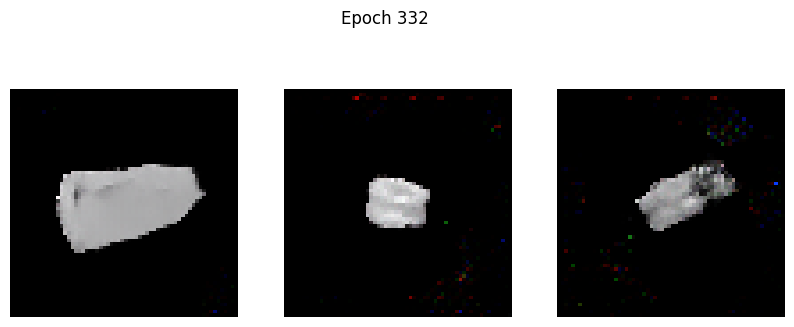

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0446 - g_loss: 4.2687
Epoch 333/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0593 - g_loss: 4.2855

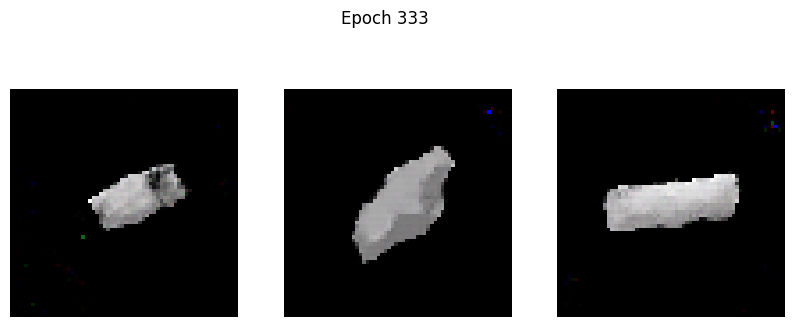

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0594 - g_loss: 4.2856
Epoch 334/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0633 - g_loss: 4.2929

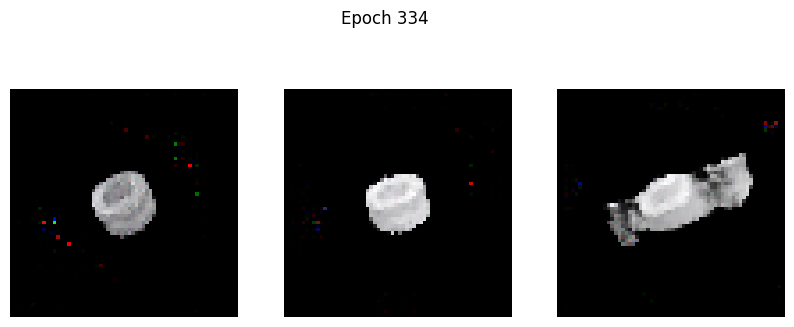

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0635 - g_loss: 4.2943
Epoch 335/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0480 - g_loss: 4.3589

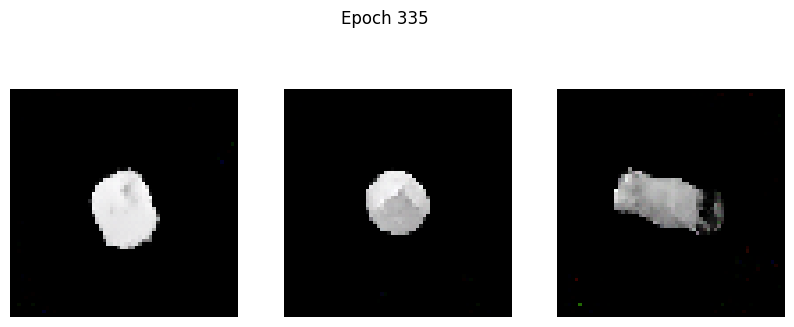

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0481 - g_loss: 4.3592
Epoch 336/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0394 - g_loss: 4.3329

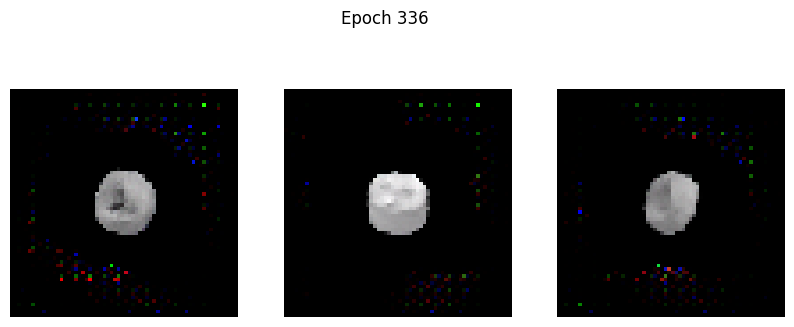

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0400 - g_loss: 4.3345
Epoch 337/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0733 - g_loss: 4.3933

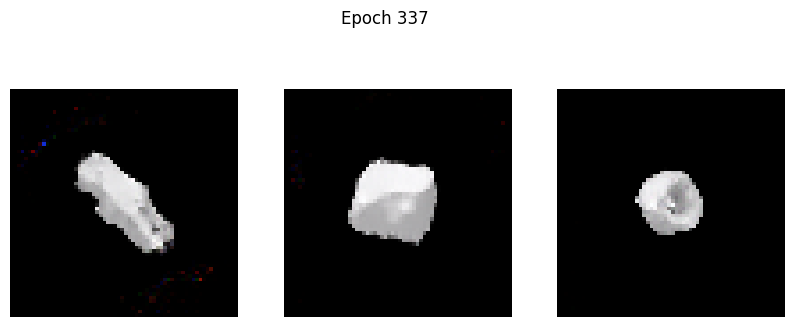

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0731 - g_loss: 4.3929
Epoch 338/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0576 - g_loss: 4.5632

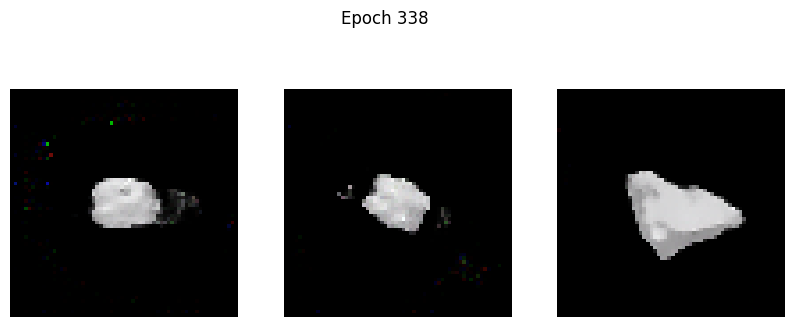

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0580 - g_loss: 4.5639
Epoch 339/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0610 - g_loss: 4.4908

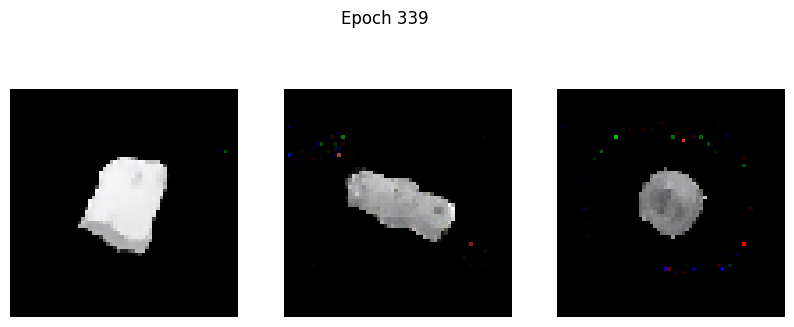

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0609 - g_loss: 4.4905
Epoch 340/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0298 - g_loss: 4.2907

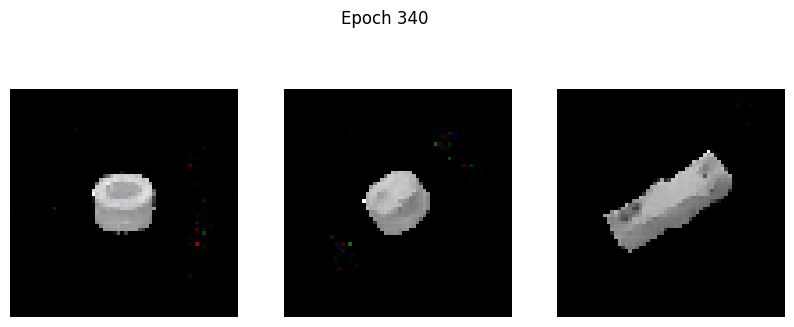

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0299 - g_loss: 4.2913
Epoch 341/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0429 - g_loss: 4.4039

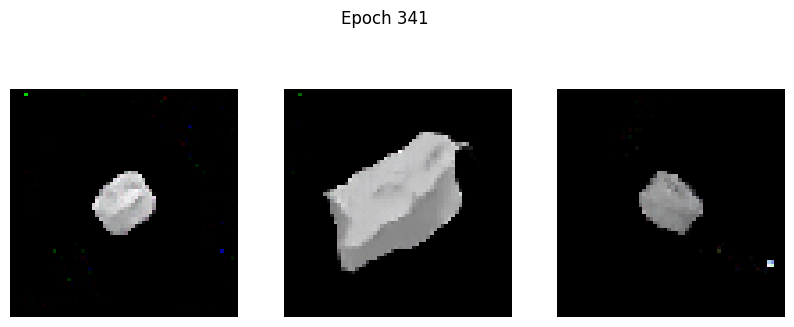

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0431 - g_loss: 4.4045
Epoch 342/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0528 - g_loss: 4.4657

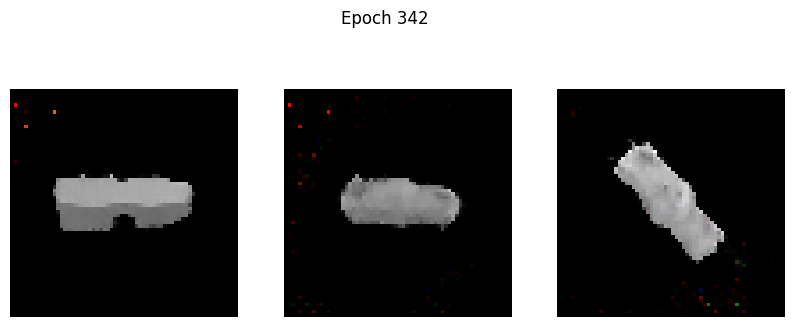

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0533 - g_loss: 4.4675
Epoch 343/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0282 - g_loss: 4.2045

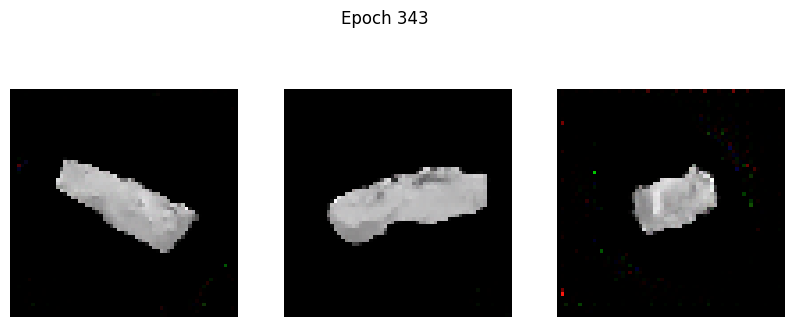

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0283 - g_loss: 4.2060
Epoch 344/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0479 - g_loss: 4.3384

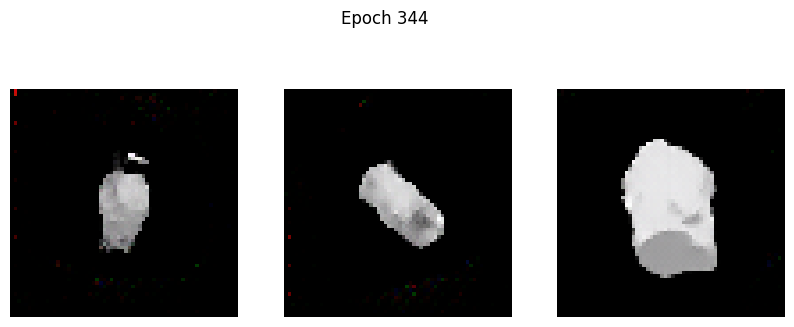

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0479 - g_loss: 4.3385
Epoch 345/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0370 - g_loss: 4.5108

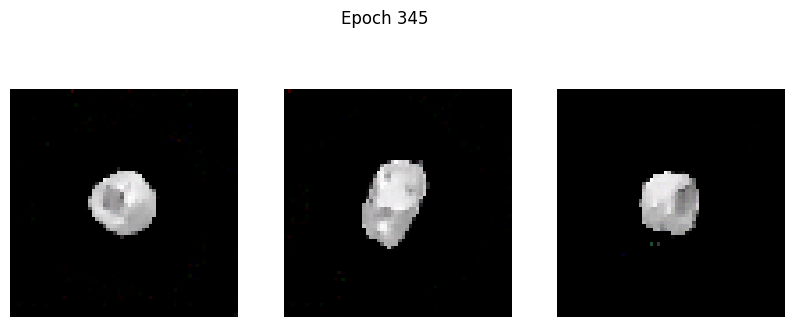

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0371 - g_loss: 4.5106
Epoch 346/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1949 - g_loss: 5.2918

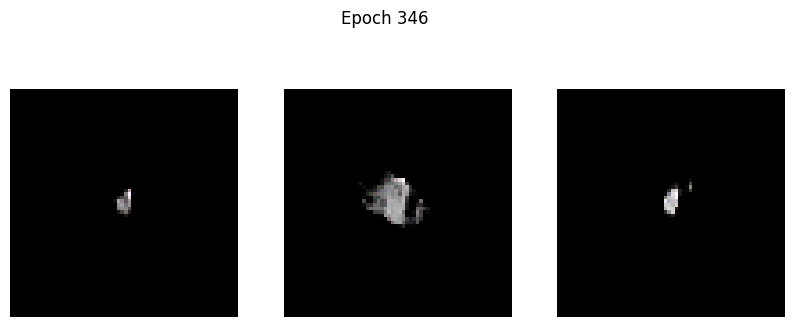

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1968 - g_loss: 5.3000
Epoch 347/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0221 - g_loss: 5.0346

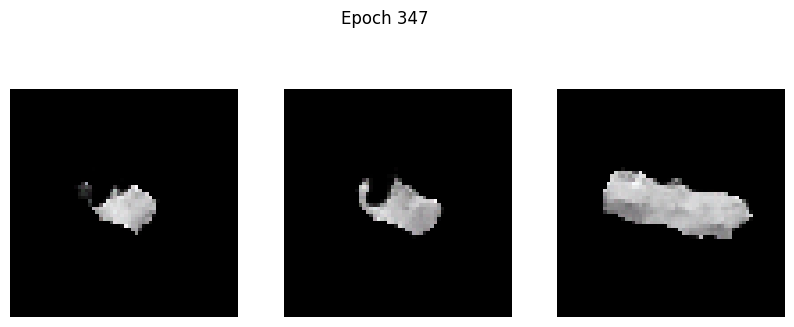

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0222 - g_loss: 5.0341
Epoch 348/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0164 - g_loss: 5.1780

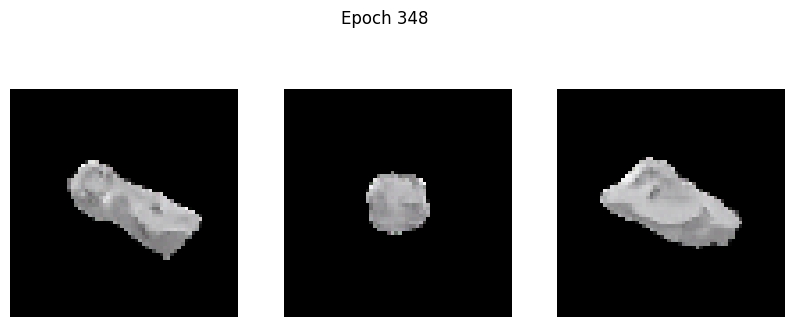

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.0164 - g_loss: 5.1776
Epoch 349/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0040 - g_loss: 4.8964

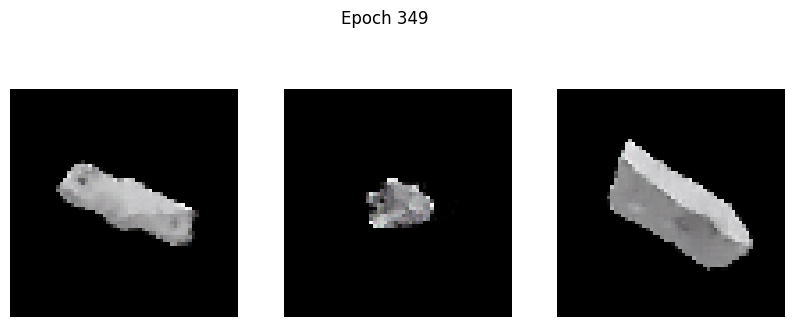

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0041 - g_loss: 4.8949
Epoch 350/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0091 - g_loss: 4.7501

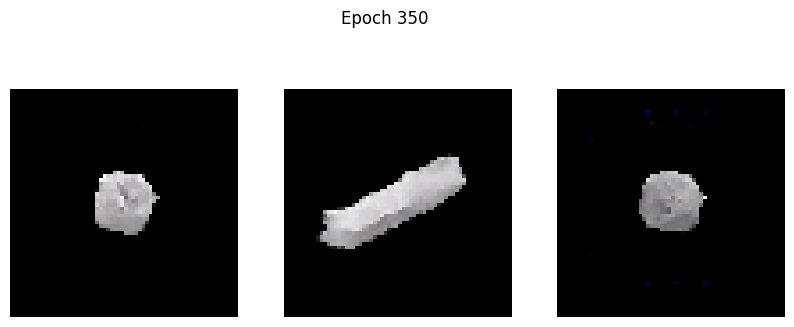

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0091 - g_loss: 4.7500
Epoch 351/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0359 - g_loss: 4.8740

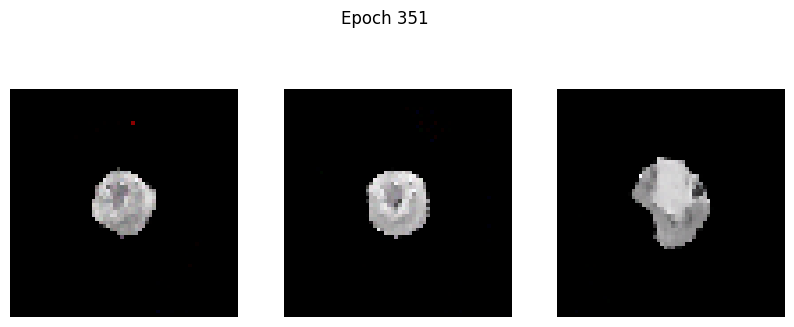

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0358 - g_loss: 4.8730
Epoch 352/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0362 - g_loss: 4.7958

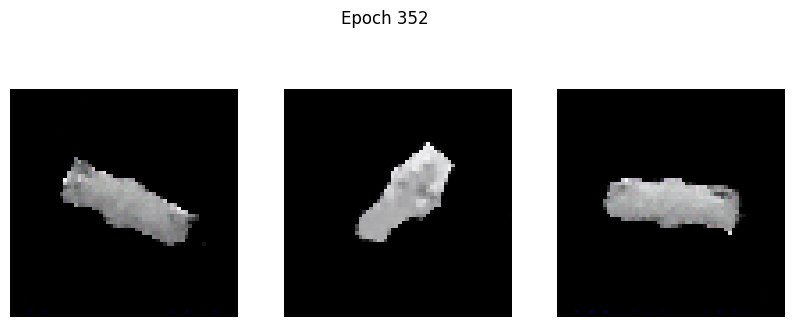

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0363 - g_loss: 4.7944
Epoch 353/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0529 - g_loss: 4.8412

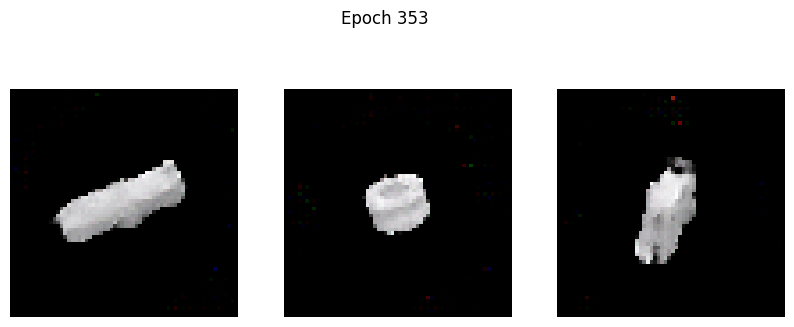

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0528 - g_loss: 4.8393
Epoch 354/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0485 - g_loss: 4.6520

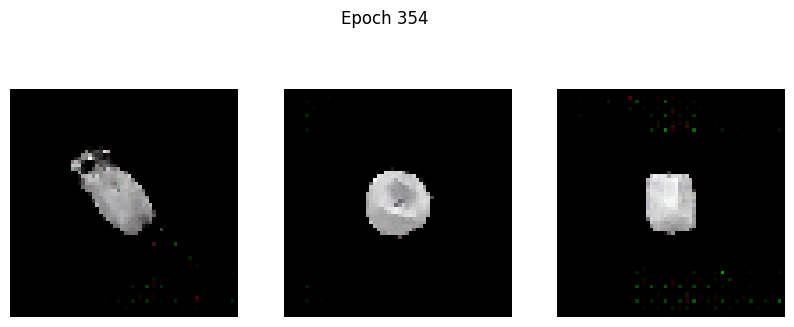

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0490 - g_loss: 4.6547
Epoch 355/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0475 - g_loss: 4.8249

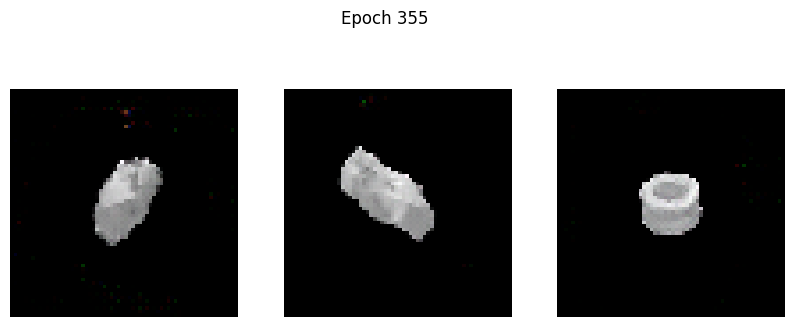

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0474 - g_loss: 4.8232
Epoch 356/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0410 - g_loss: 4.7506

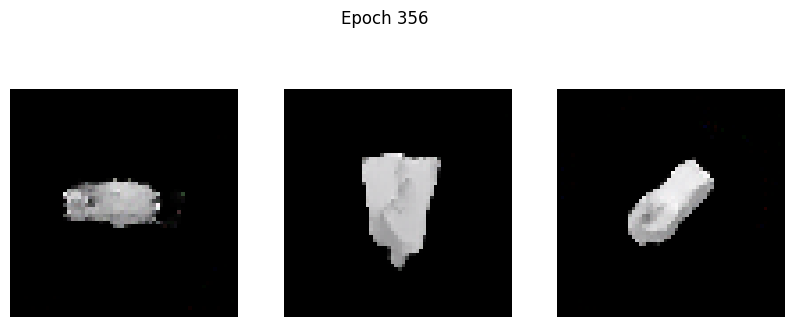

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0413 - g_loss: 4.7516
Epoch 357/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0383 - g_loss: 4.6688

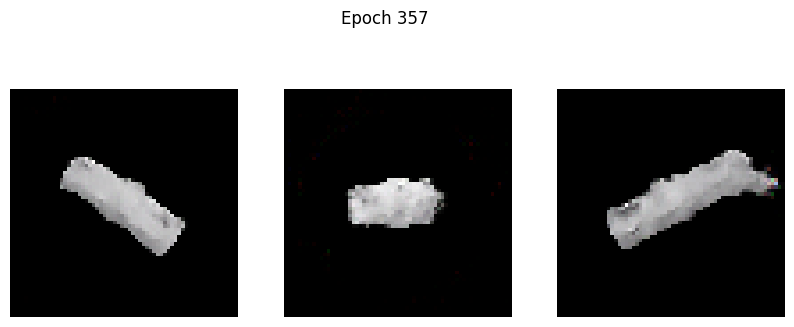

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0382 - g_loss: 4.6681
Epoch 358/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0649 - g_loss: 4.5860

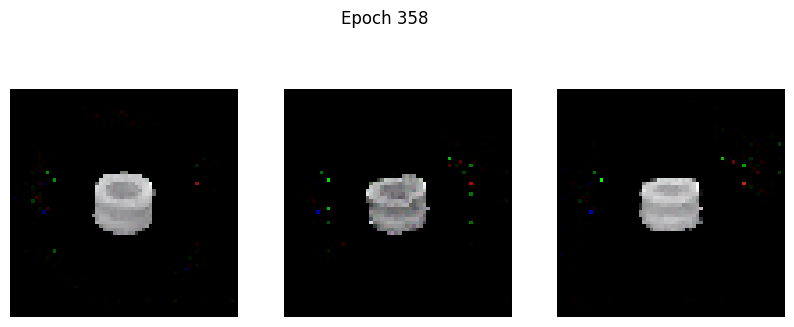

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0648 - g_loss: 4.5859
Epoch 359/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0530 - g_loss: 4.7497

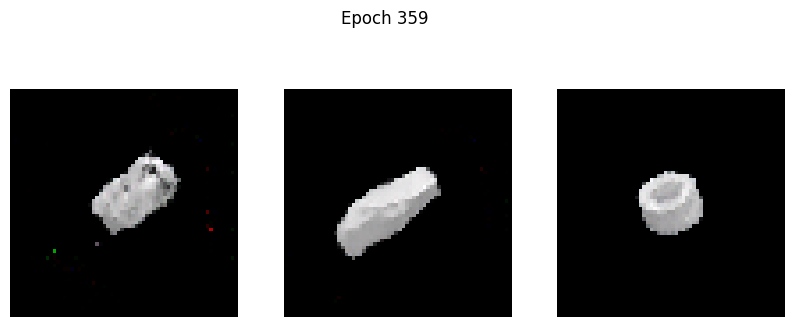

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0531 - g_loss: 4.7500
Epoch 360/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1166 - g_loss: 4.9161

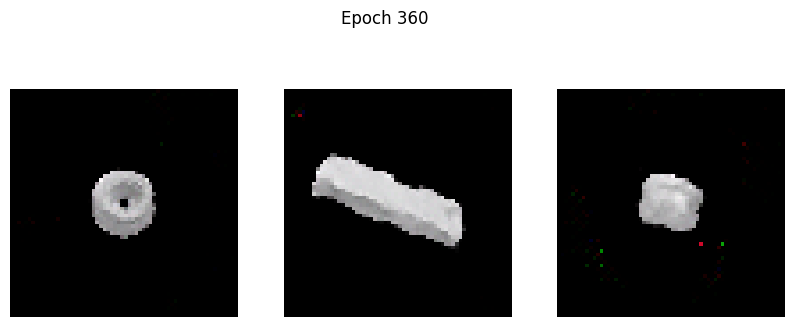

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1162 - g_loss: 4.9143
Epoch 361/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0685 - g_loss: 4.8509

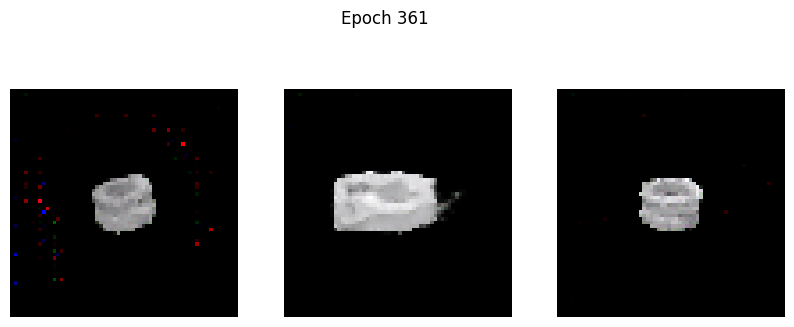

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0687 - g_loss: 4.8510
Epoch 362/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1332 - g_loss: 5.2382

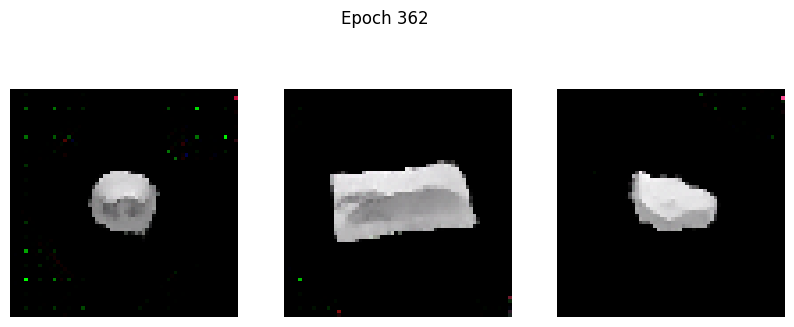

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1326 - g_loss: 5.2341
Epoch 363/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0286 - g_loss: 4.4815

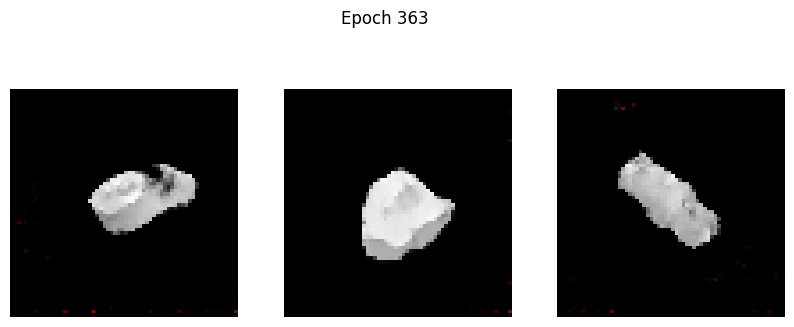

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0285 - g_loss: 4.4816
Epoch 364/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0416 - g_loss: 4.7513

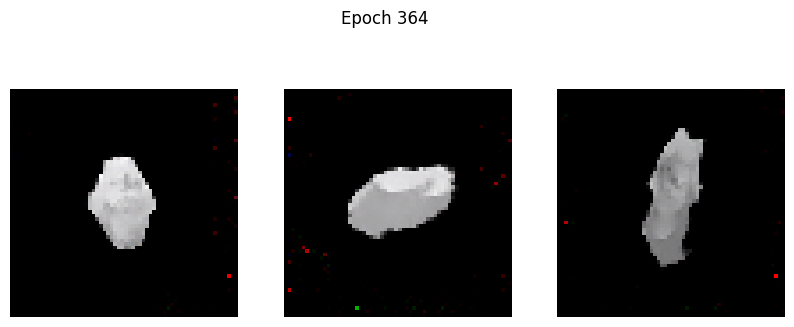

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0416 - g_loss: 4.7505
Epoch 365/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0312 - g_loss: 4.5583

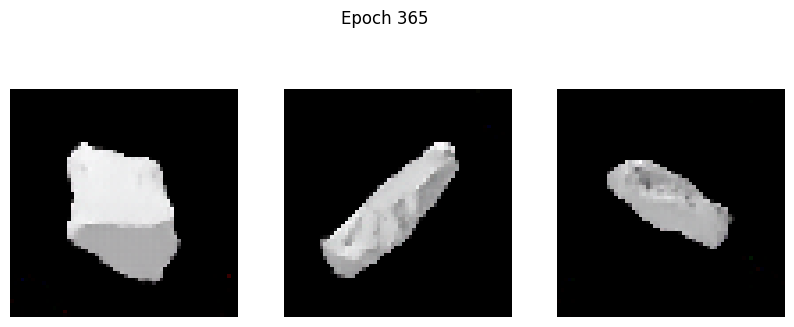

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0315 - g_loss: 4.5598
Epoch 366/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0235 - g_loss: 4.6405

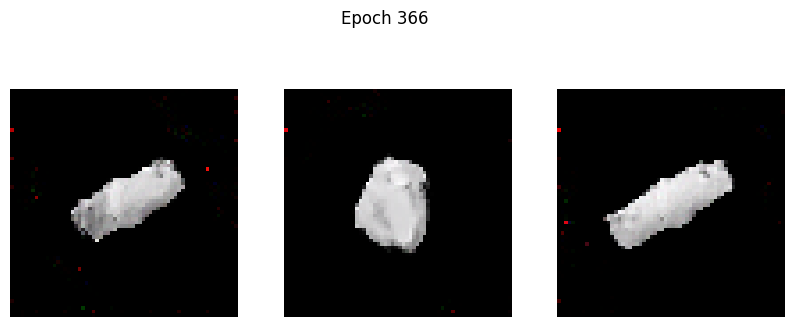

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0234 - g_loss: 4.6400
Epoch 367/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1411 - g_loss: 5.0334

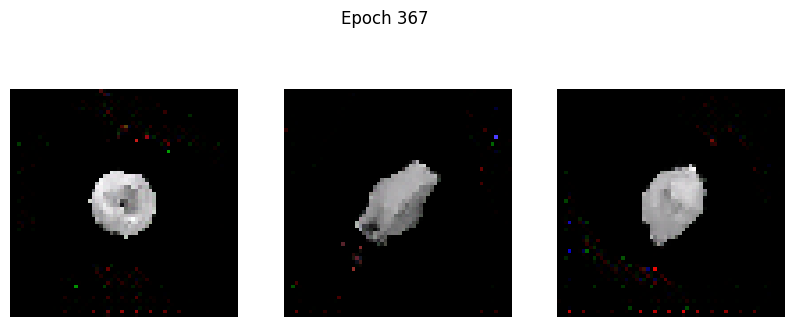

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1424 - g_loss: 5.0366
Epoch 368/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0278 - g_loss: 4.3721

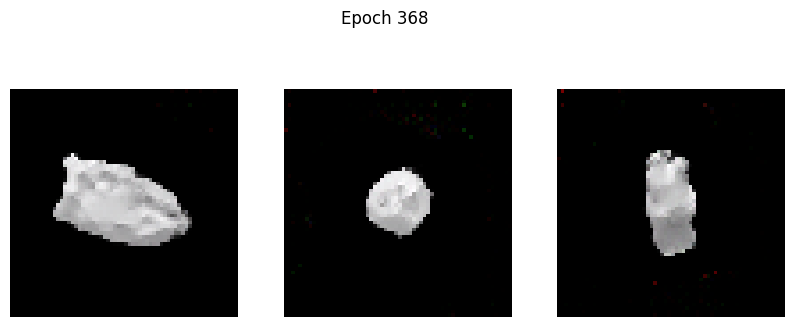

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0279 - g_loss: 4.3728
Epoch 369/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0170 - g_loss: 4.5159

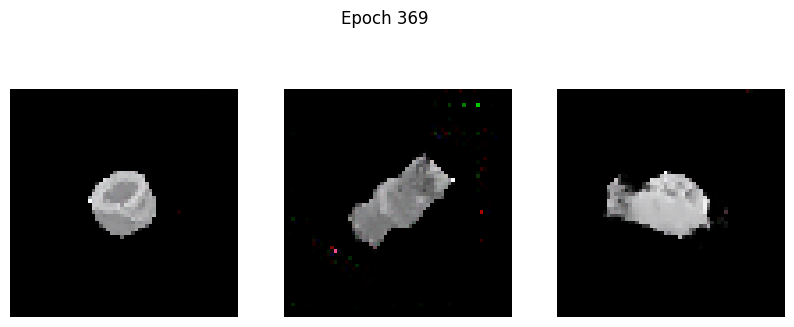

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0170 - g_loss: 4.5153
Epoch 370/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0181 - g_loss: 4.6821

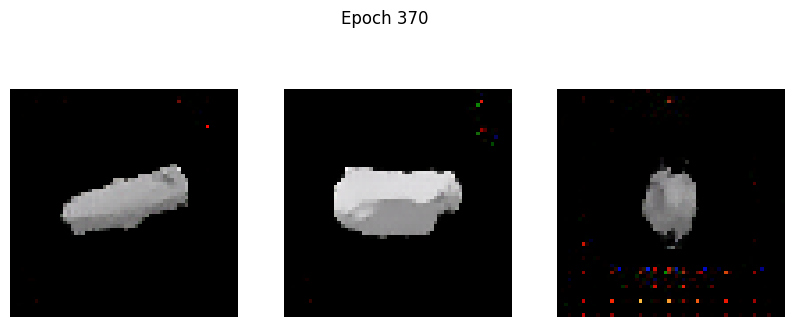

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0184 - g_loss: 4.6838
Epoch 371/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0930 - g_loss: 4.9598

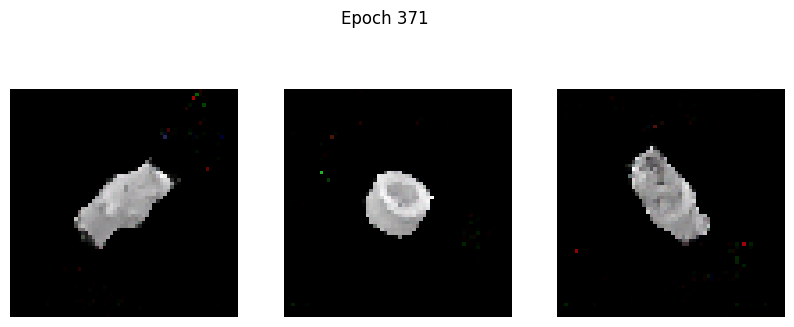

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0925 - g_loss: 4.9573
Epoch 372/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0210 - g_loss: 4.7859

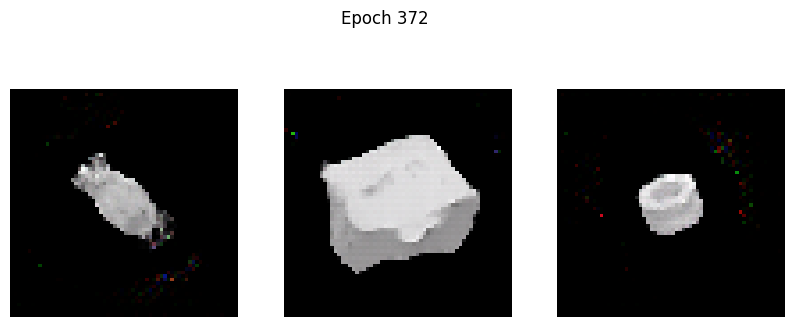

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0211 - g_loss: 4.7848
Epoch 373/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0536 - g_loss: 4.7974

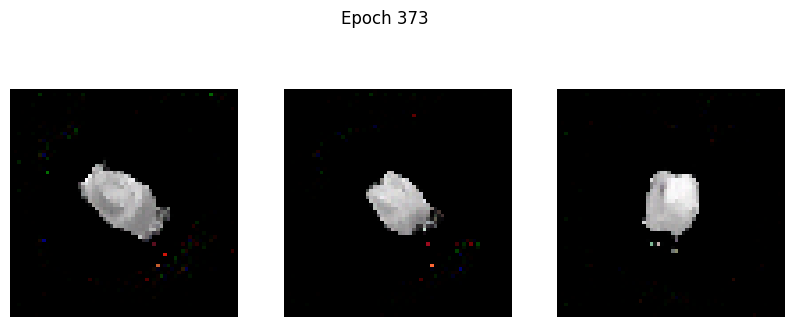

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0537 - g_loss: 4.7978
Epoch 374/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0494 - g_loss: 4.7171

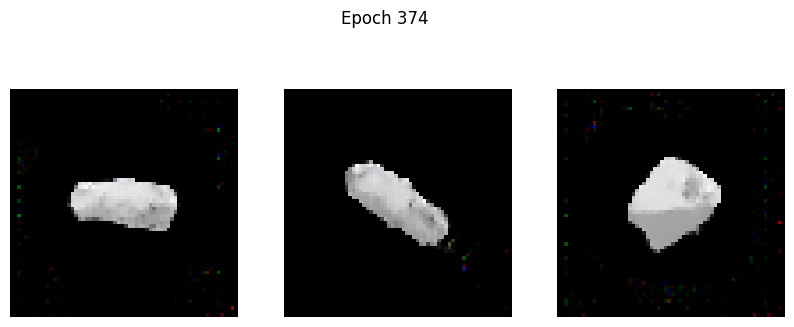

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0494 - g_loss: 4.7176
Epoch 375/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1159 - g_loss: 5.0110

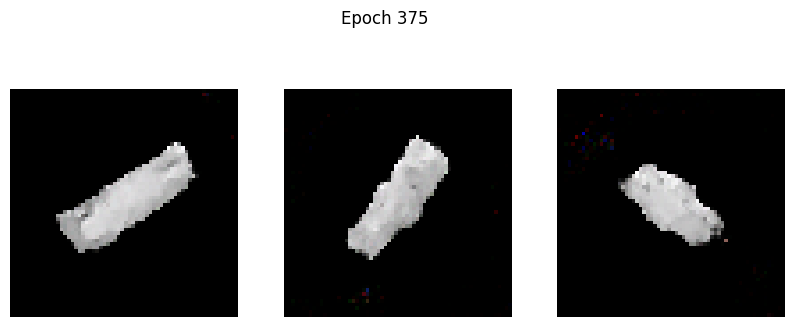

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1159 - g_loss: 5.0111
Epoch 376/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0215 - g_loss: 4.6052

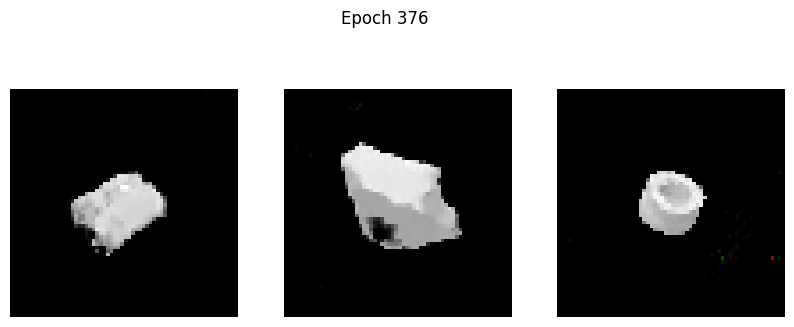

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0215 - g_loss: 4.6046
Epoch 377/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0377 - g_loss: 4.8358

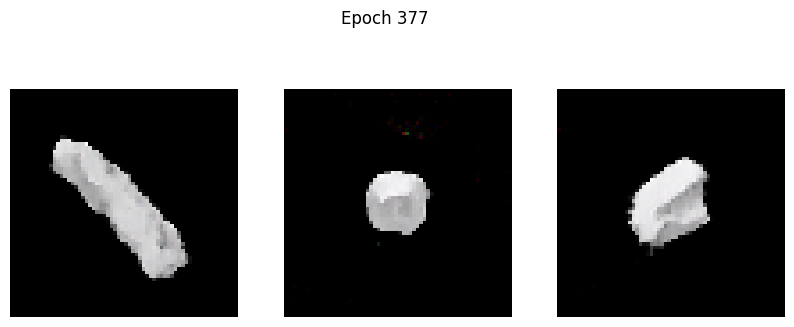

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0377 - g_loss: 4.8356
Epoch 378/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0130 - g_loss: 4.6492

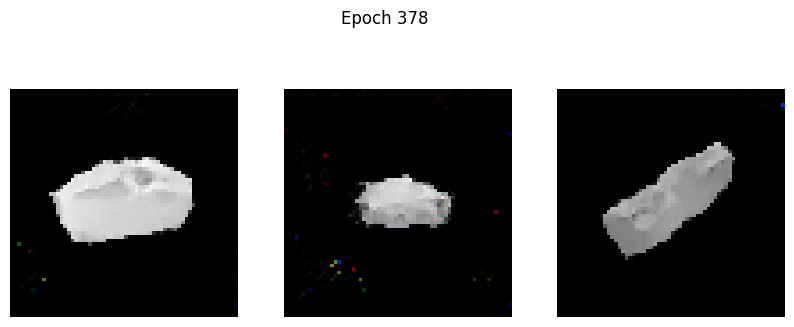

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0131 - g_loss: 4.6499
Epoch 379/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0800 - g_loss: 4.9407

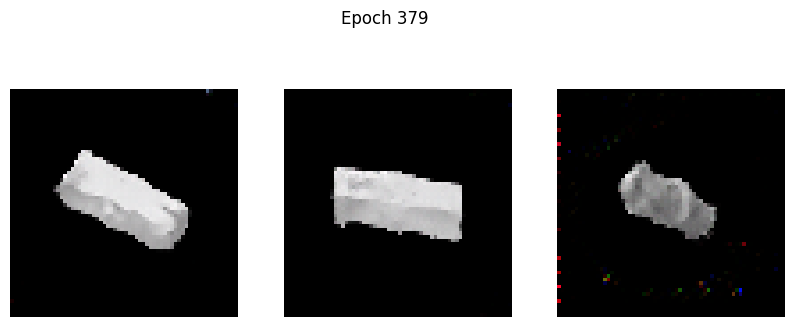

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0797 - g_loss: 4.9402
Epoch 380/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6423 - g_loss: 5.9548

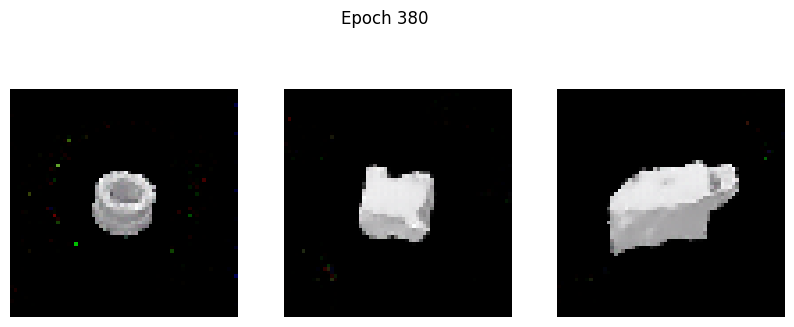

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.6418 - g_loss: 5.9506
Epoch 381/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0541 - g_loss: 4.3367

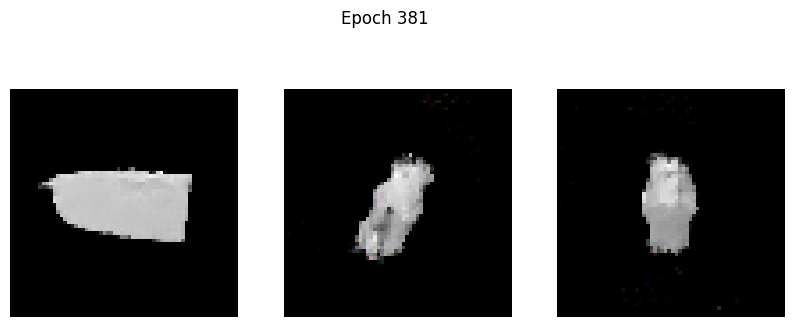

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0540 - g_loss: 4.3364
Epoch 382/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0202 - g_loss: 4.5945

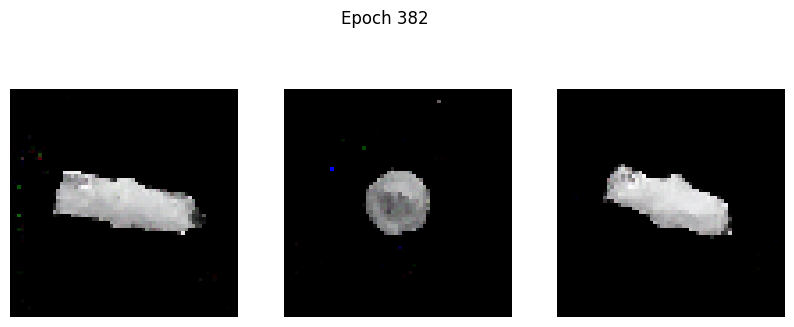

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0201 - g_loss: 4.5934
Epoch 383/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0024 - g_loss: 4.5073

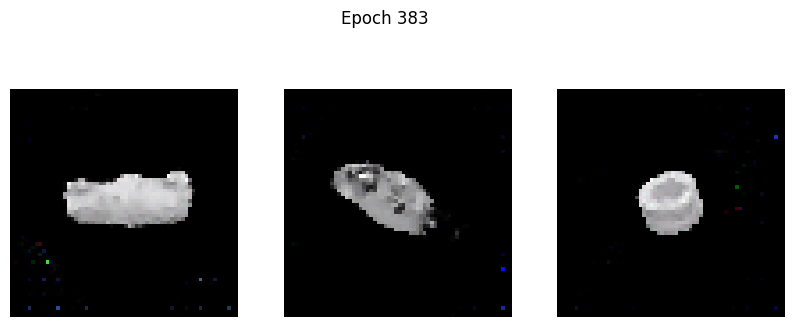

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0024 - g_loss: 4.5074
Epoch 384/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0075 - g_loss: 4.6200

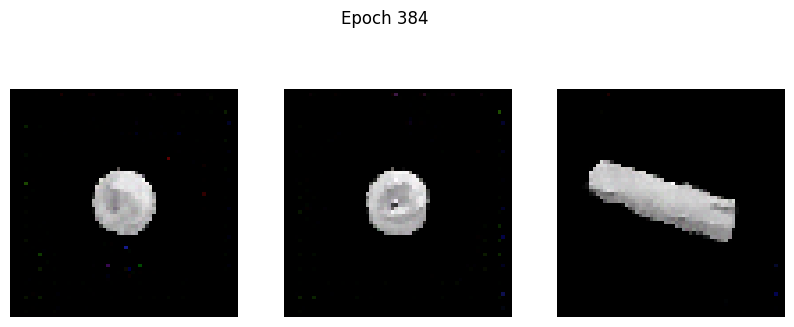

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0074 - g_loss: 4.6189
Epoch 385/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0058 - g_loss: 4.5557

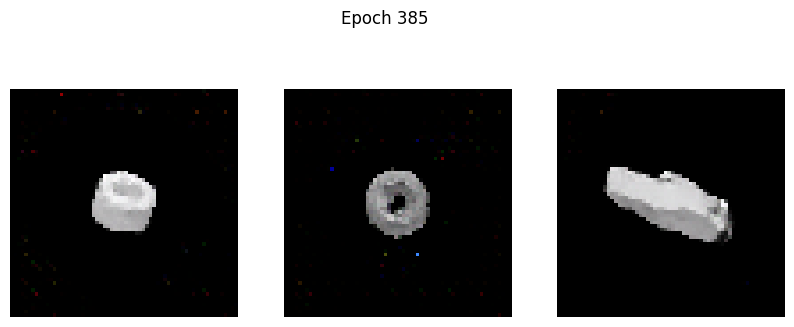

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0058 - g_loss: 4.5554
Epoch 386/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0188 - g_loss: 4.6508

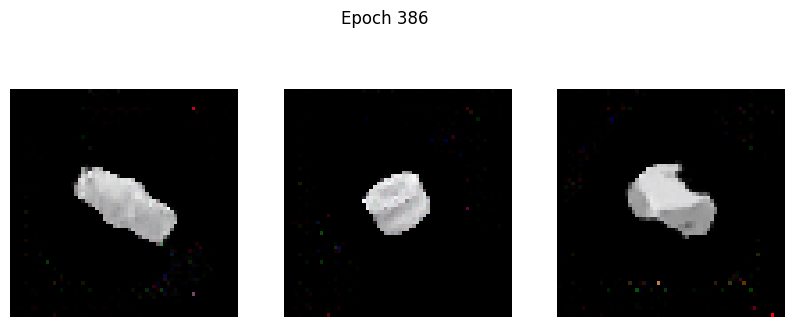

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0186 - g_loss: 4.6506
Epoch 387/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0172 - g_loss: 4.7421

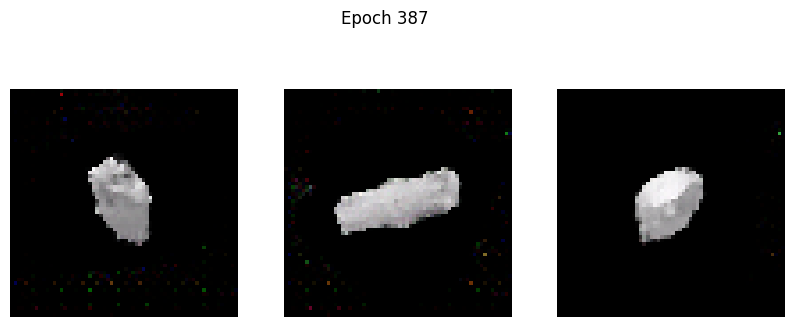

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0172 - g_loss: 4.7420
Epoch 388/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0149 - g_loss: 4.7094

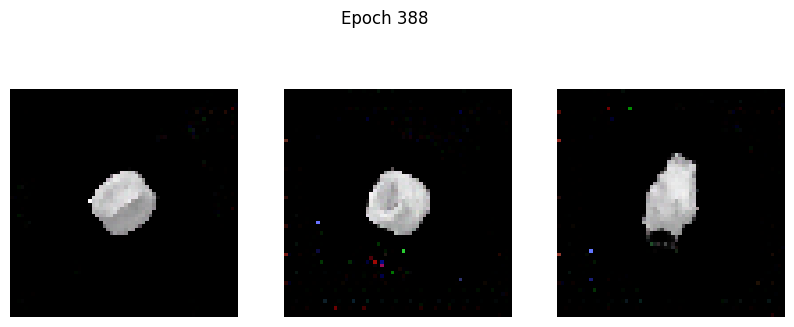

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0150 - g_loss: 4.7108
Epoch 389/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0357 - g_loss: 4.9273

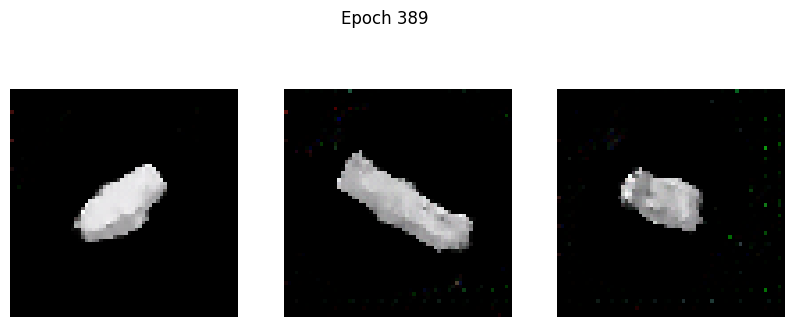

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0354 - g_loss: 4.9256
Epoch 390/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0507 - g_loss: 5.0571

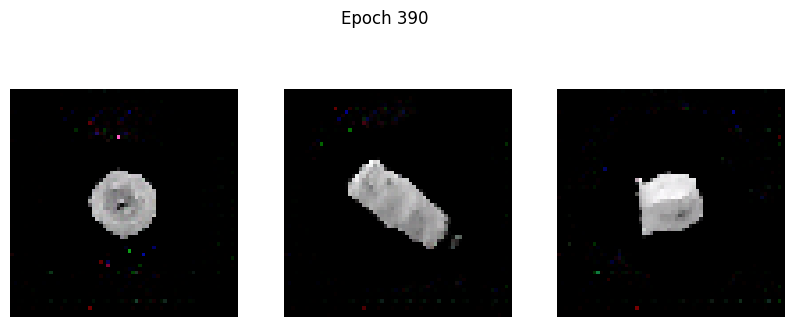

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0508 - g_loss: 5.0575
Epoch 391/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0638 - g_loss: 5.1667

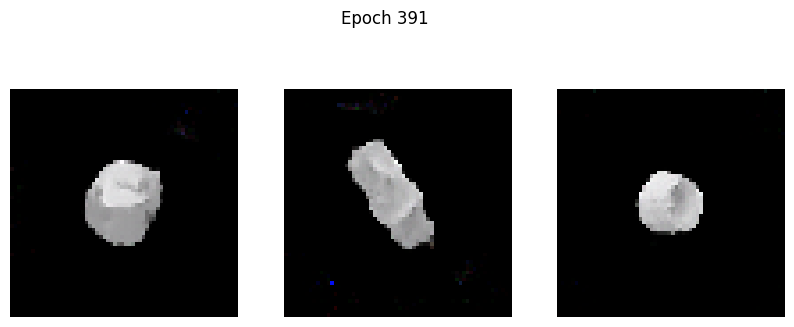

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0638 - g_loss: 5.1664
Epoch 392/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1618 - g_loss: 5.3057

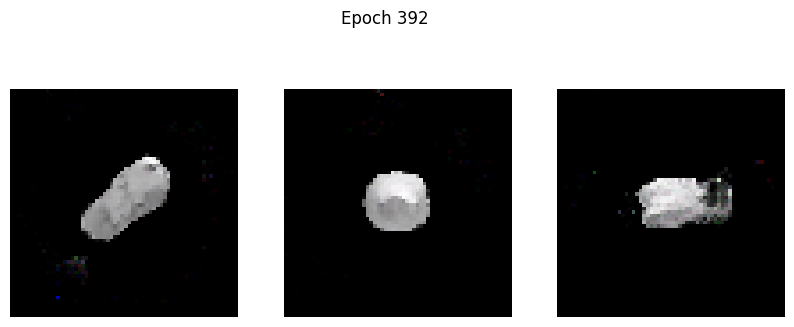

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1614 - g_loss: 5.3041
Epoch 393/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0218 - g_loss: 4.8275

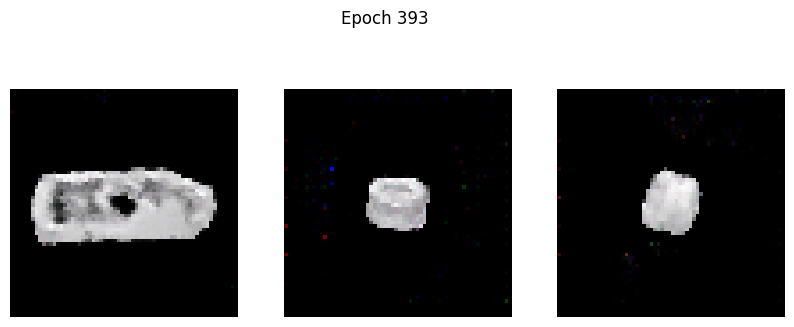

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0221 - g_loss: 4.8286
Epoch 394/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0278 - g_loss: 4.5749

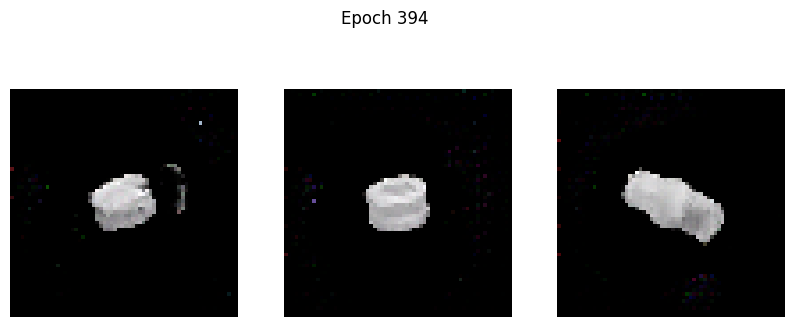

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0276 - g_loss: 4.5751
Epoch 395/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0035 - g_loss: 4.9369

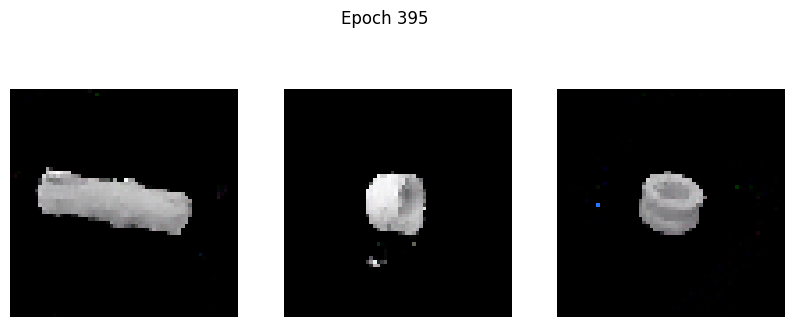

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0036 - g_loss: 4.9362
Epoch 396/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0377 - g_loss: 4.8433

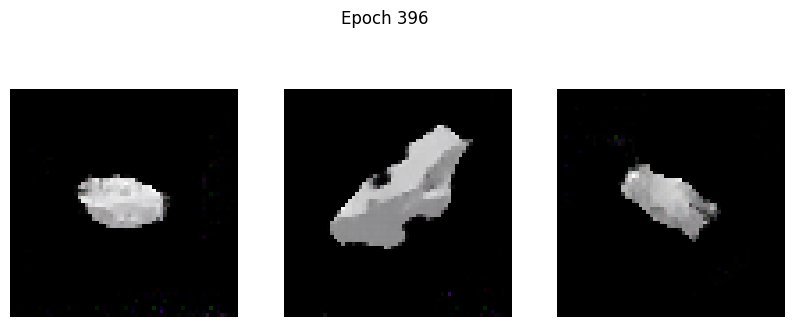

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0377 - g_loss: 4.8439
Epoch 397/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0479 - g_loss: 5.0151

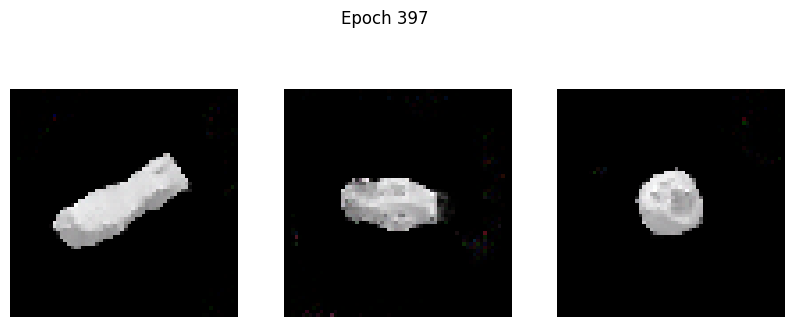

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0478 - g_loss: 5.0140
Epoch 398/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0246 - g_loss: 4.6051

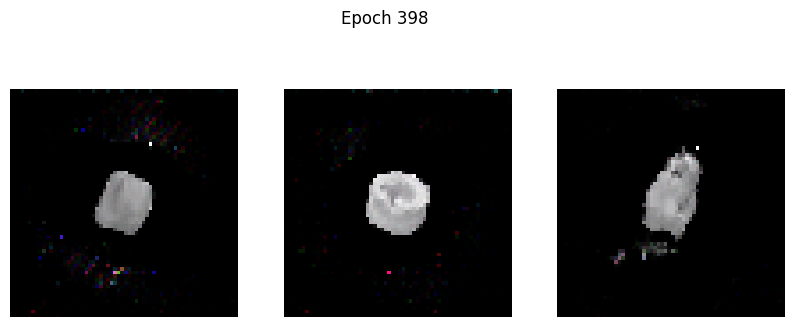

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0246 - g_loss: 4.6071
Epoch 399/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0227 - g_loss: 4.9534

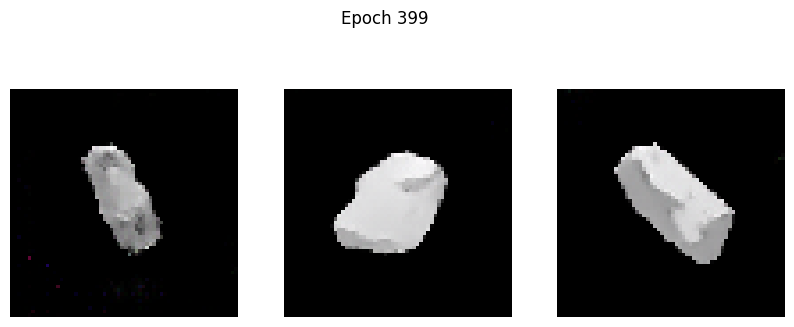

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0231 - g_loss: 4.9543
Epoch 400/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0319 - g_loss: 5.0154

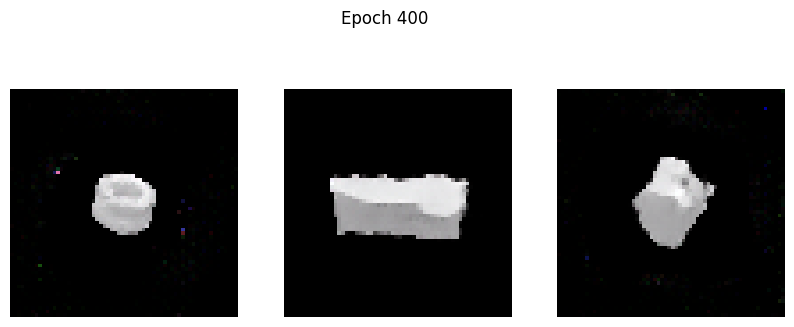

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0319 - g_loss: 5.0148
Epoch 401/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 4.5207e-04 - g_loss: 4.7743 

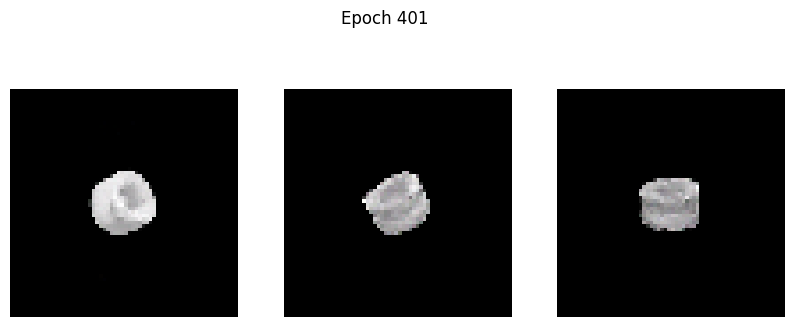

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 9.9192e-04 - g_loss: 4.7776
Epoch 402/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0045 - g_loss: 4.8650

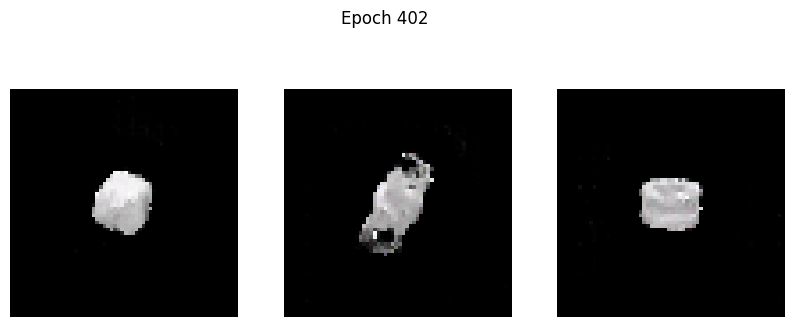

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0046 - g_loss: 4.8656
Epoch 403/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0164 - g_loss: 4.8909

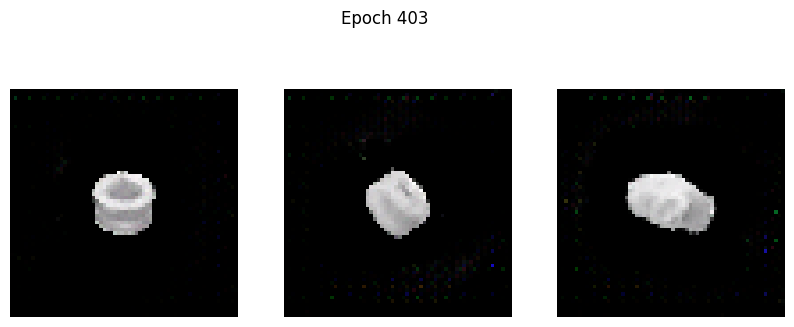

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0166 - g_loss: 4.8925
Epoch 404/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0275 - g_loss: 5.0934

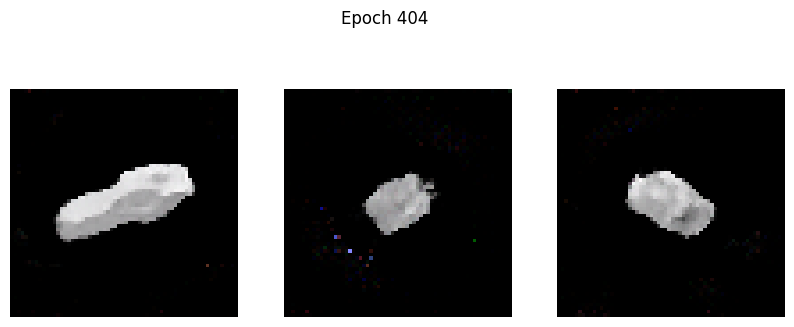

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0276 - g_loss: 5.0924
Epoch 405/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0165 - g_loss: 4.9830

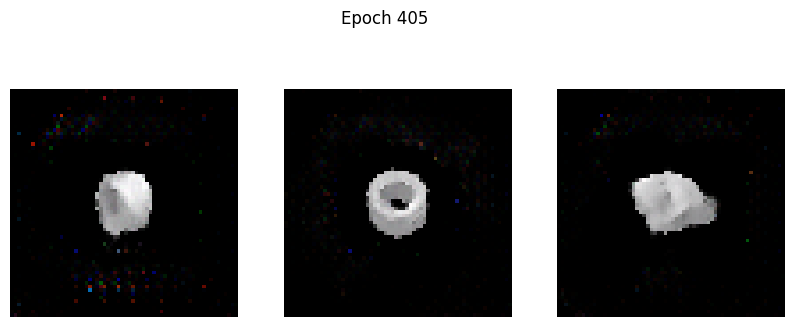

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0167 - g_loss: 4.9840
Epoch 406/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0873 - g_loss: 5.1935

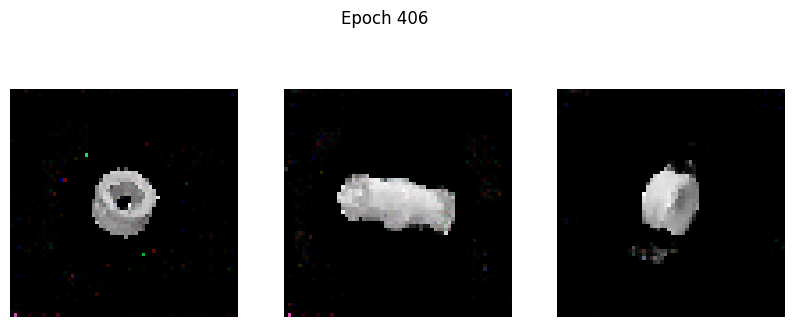

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0868 - g_loss: 5.1931
Epoch 407/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0302 - g_loss: 5.0815

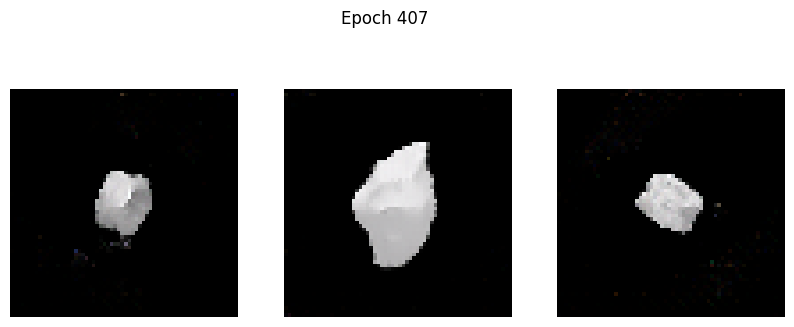

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0300 - g_loss: 5.0801
Epoch 408/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0166 - g_loss: 5.3782

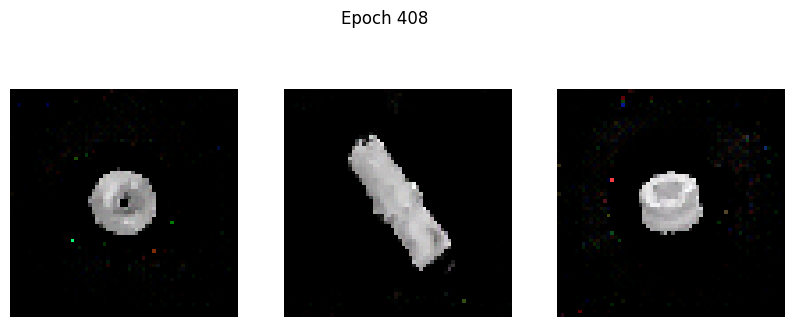

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0169 - g_loss: 5.3781
Epoch 409/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0155 - g_loss: 5.0107

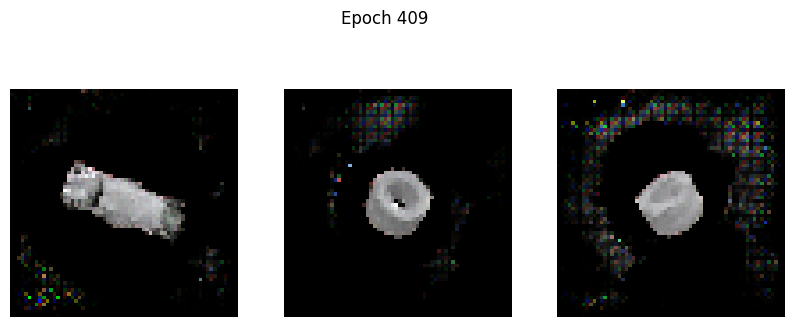

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0167 - g_loss: 5.0143
Epoch 410/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0911 - g_loss: 5.1483

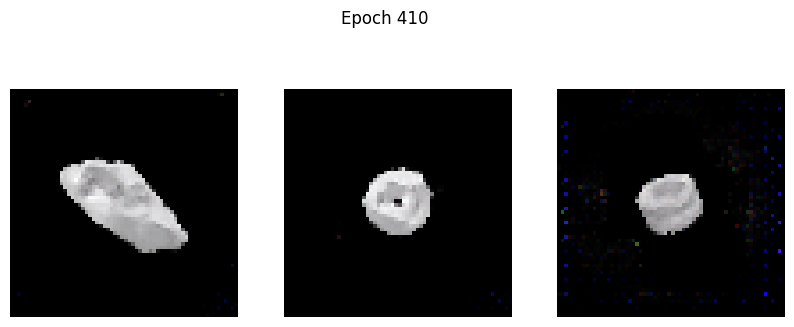

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0906 - g_loss: 5.1466
Epoch 411/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0244 - g_loss: 4.9240

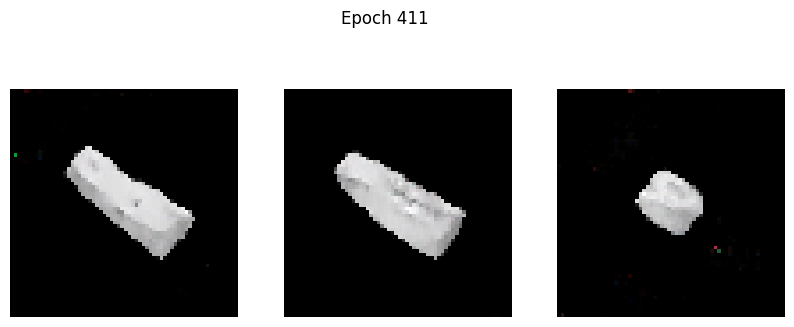

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0243 - g_loss: 4.9246
Epoch 412/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0055 - g_loss: 4.8196

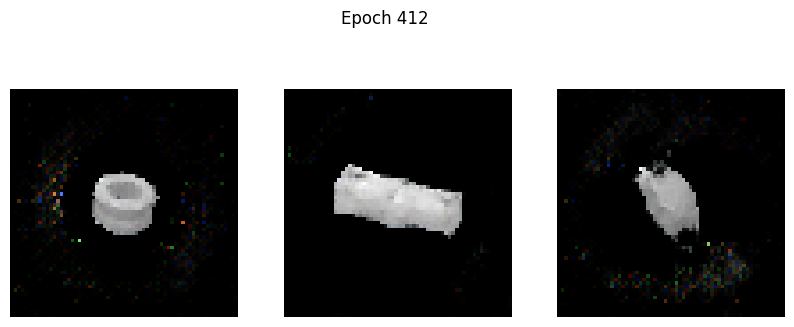

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0064 - g_loss: 4.8220
Epoch 413/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0503 - g_loss: 5.4112

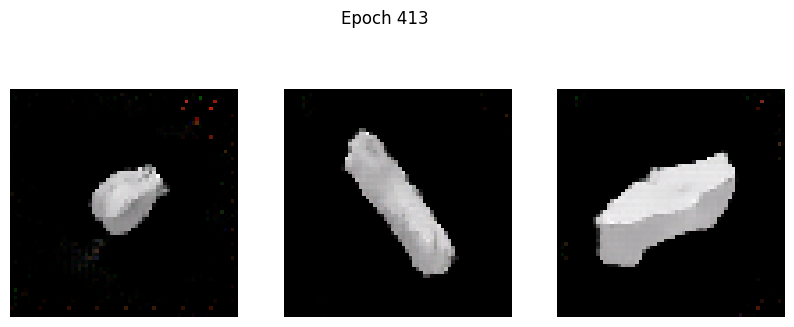

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0501 - g_loss: 5.4080
Epoch 414/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0155 - g_loss: 4.8804

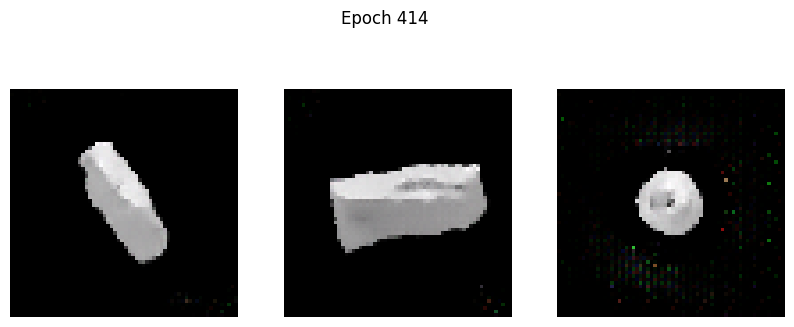

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0153 - g_loss: 4.8800
Epoch 415/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0264 - g_loss: 5.1049

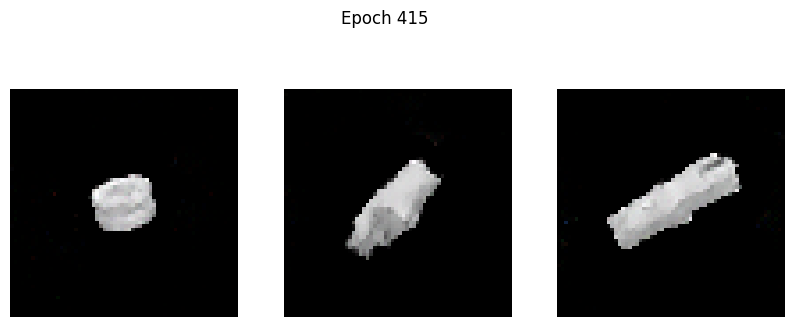

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0264 - g_loss: 5.1046
Epoch 416/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0165 - g_loss: 4.8721

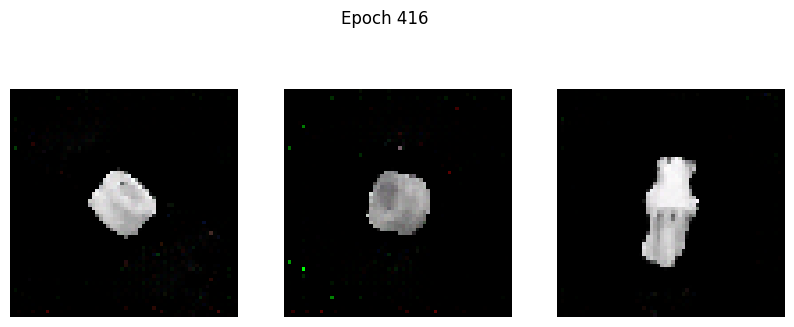

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0163 - g_loss: 4.8733
Epoch 417/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0127 - g_loss: 5.0926

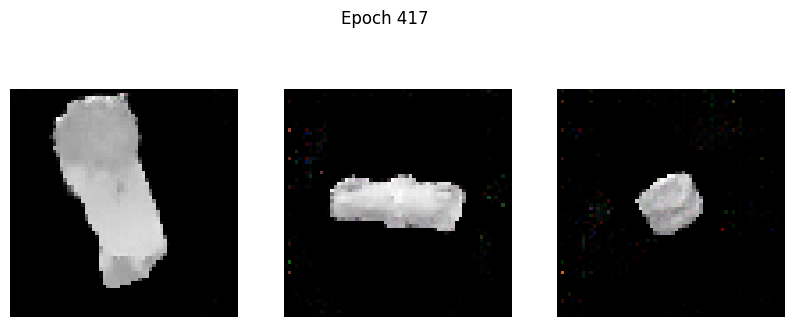

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0124 - g_loss: 5.0947
Epoch 418/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0040 - g_loss: 5.3306

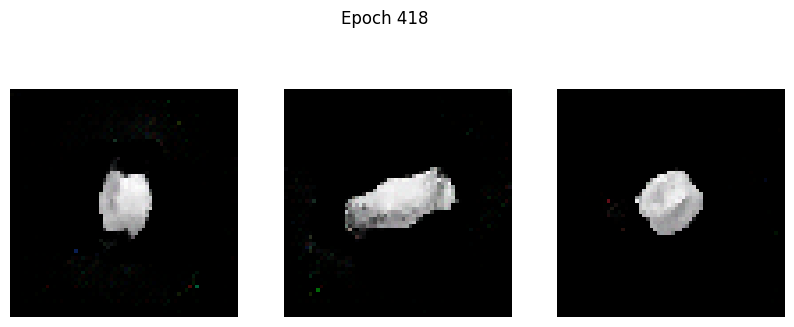

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.0039 - g_loss: 5.3292
Epoch 419/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0291 - g_loss: 5.5754

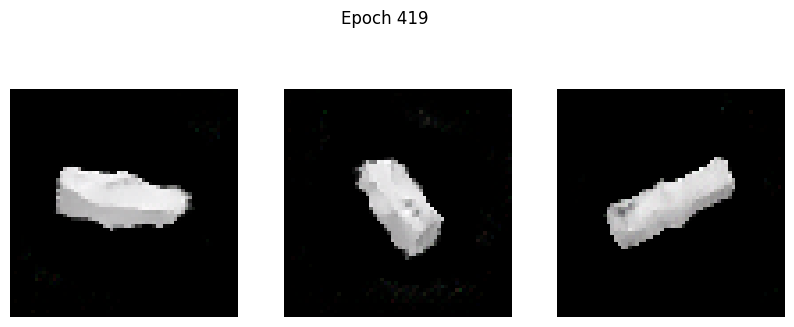

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.0290 - g_loss: 5.5734
Epoch 420/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0391 - g_loss: 5.1409

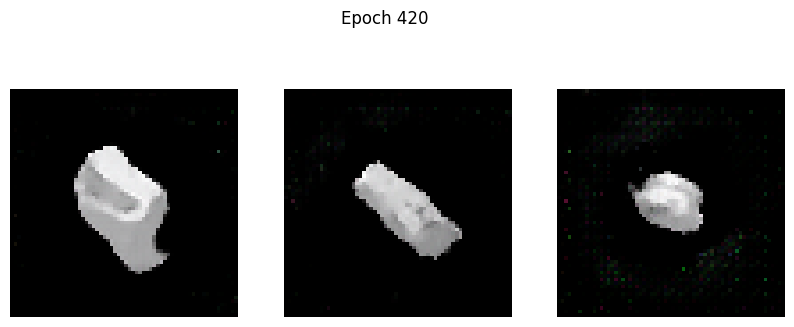

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0392 - g_loss: 5.1427
Epoch 421/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0209 - g_loss: 5.7732

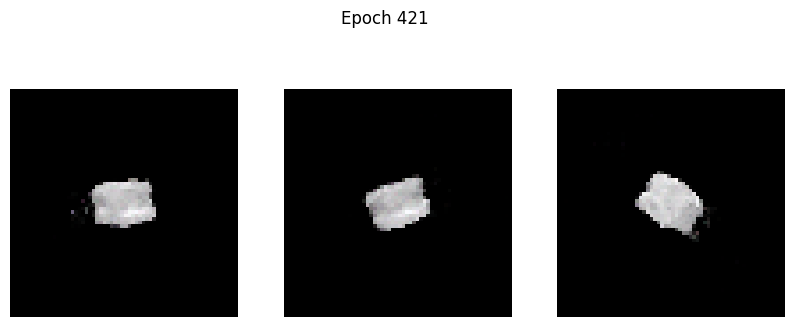

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0206 - g_loss: 5.7720
Epoch 422/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0373 - g_loss: 5.1047

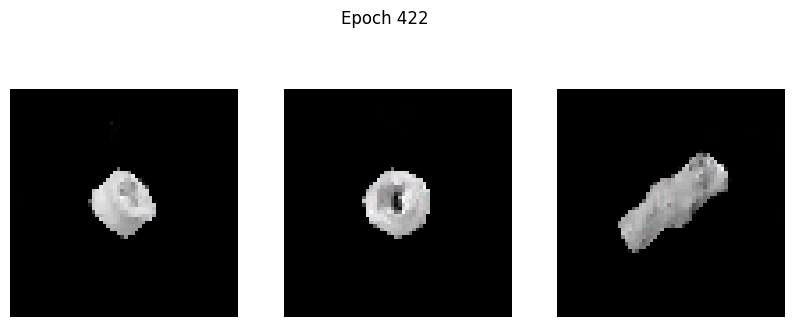

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0369 - g_loss: 5.1076
Epoch 423/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0044 - g_loss: 5.2027

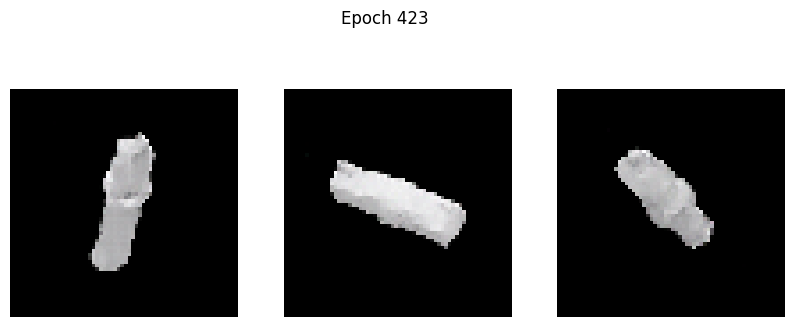

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0043 - g_loss: 5.2040
Epoch 424/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -8.4627e-04 - g_loss: 5.0592

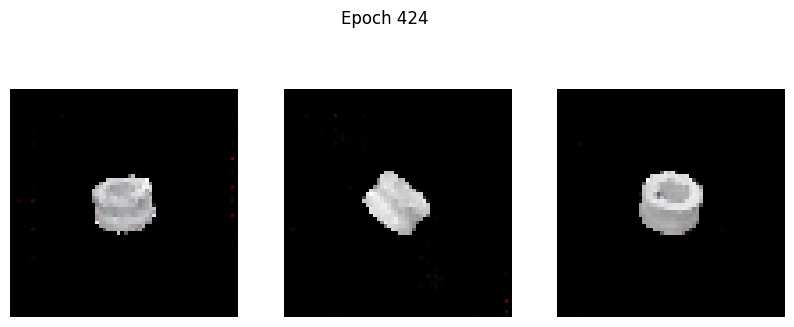

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -9.3759e-04 - g_loss: 5.0591
Epoch 425/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0071 - g_loss: 5.3813

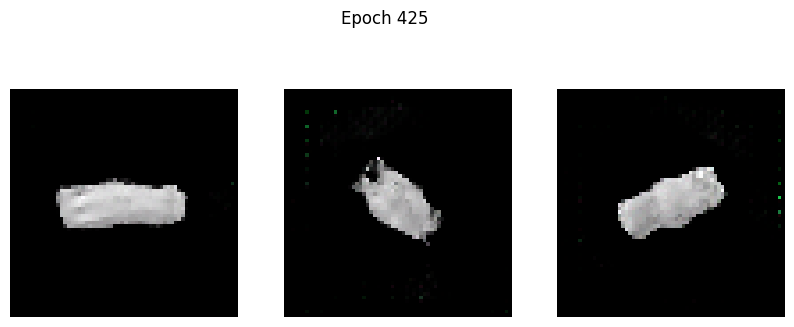

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0068 - g_loss: 5.3809
Epoch 426/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0012 - g_loss: 5.2939

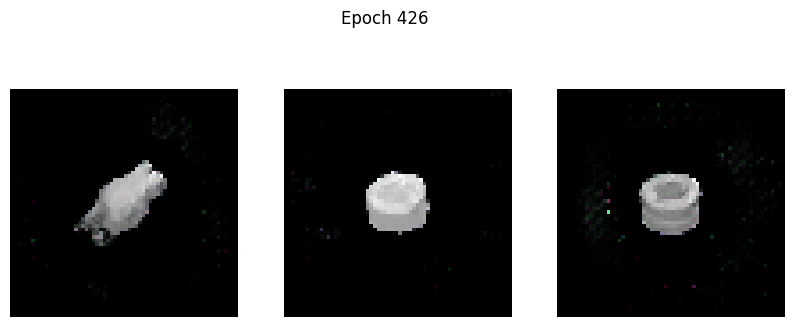

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -6.9117e-04 - g_loss: 5.2959
Epoch 427/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3144 - g_loss: 8.3486

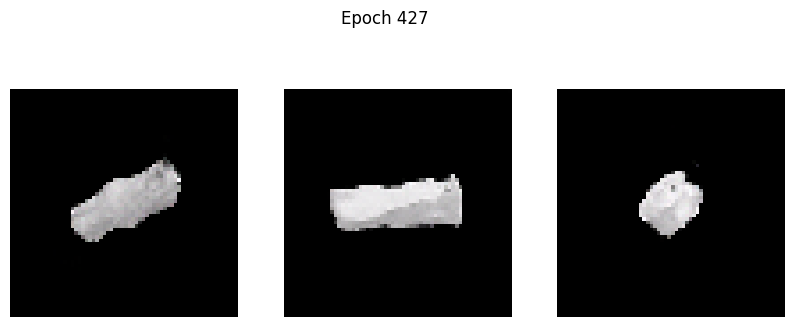

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3122 - g_loss: 8.3337
Epoch 428/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0090 - g_loss: 5.1236

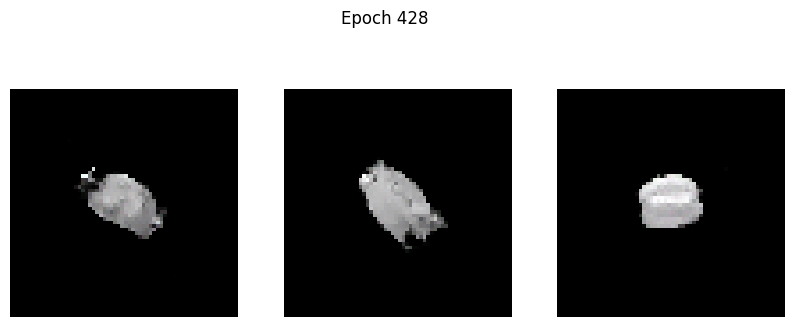

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0092 - g_loss: 5.1227
Epoch 429/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 2.9046e-04 - g_loss: 5.1667

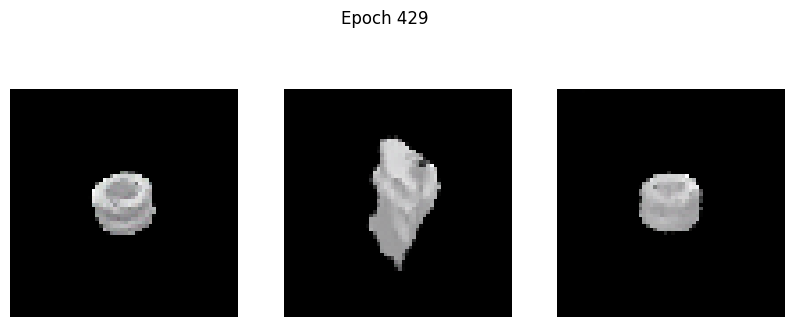

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 2.4083e-04 - g_loss: 5.1667
Epoch 430/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0029 - g_loss: 5.3292

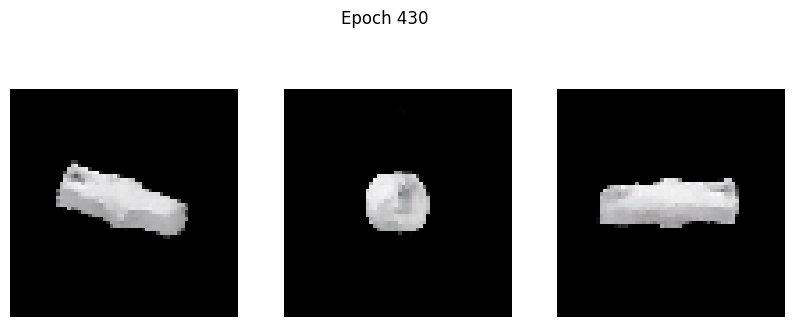

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0028 - g_loss: 5.3291
Epoch 431/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0249 - g_loss: 5.1663

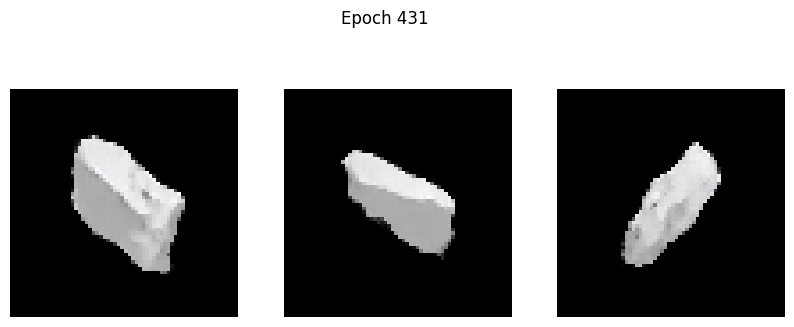

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0248 - g_loss: 5.1669
Epoch 432/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2105 - g_loss: 6.1655

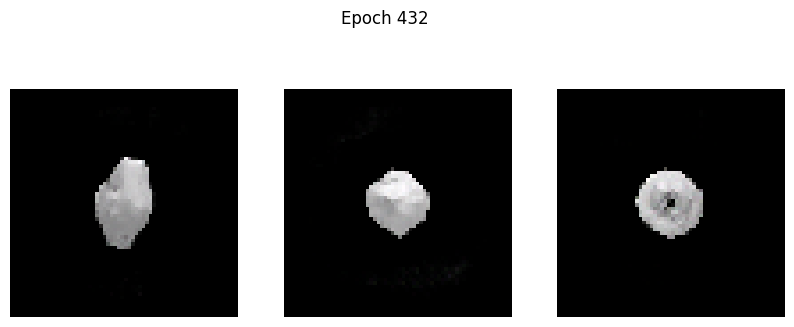

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2092 - g_loss: 6.1600
Epoch 433/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0166 - g_loss: 5.7231

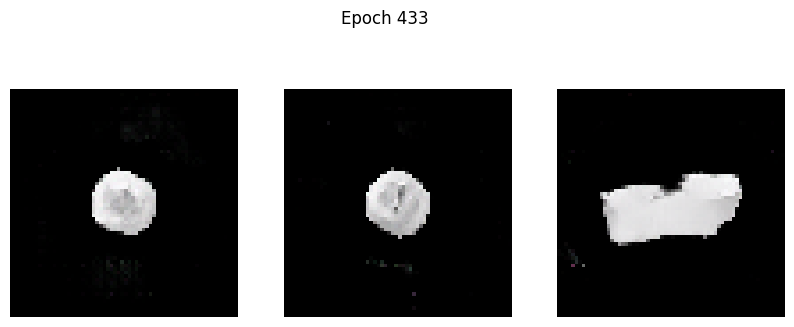

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0165 - g_loss: 5.7202
Epoch 434/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0230 - g_loss: 5.4013

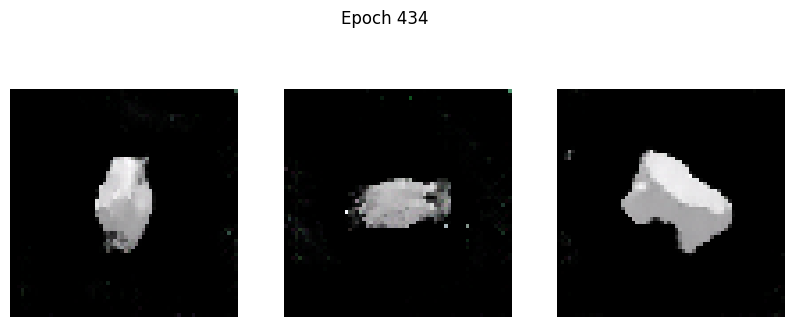

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0230 - g_loss: 5.3997
Epoch 435/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0301 - g_loss: 5.8263

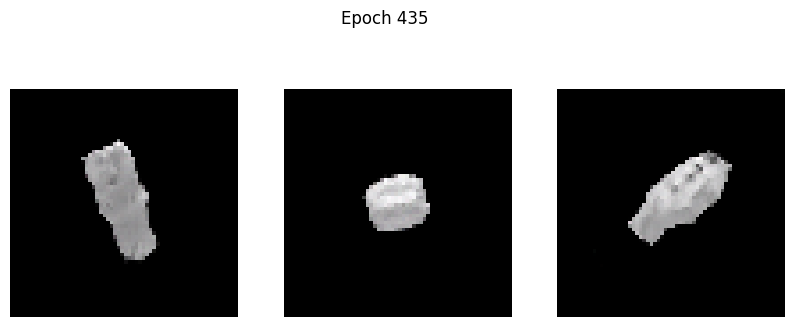

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0300 - g_loss: 5.8268
Epoch 436/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0230 - g_loss: 5.2510

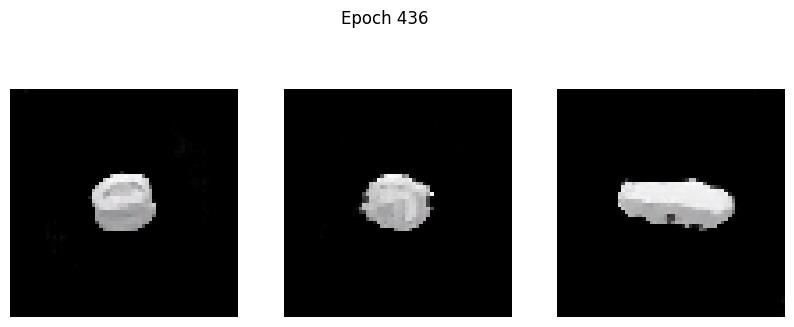

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0227 - g_loss: 5.2532
Epoch 437/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0167 - g_loss: 5.4119

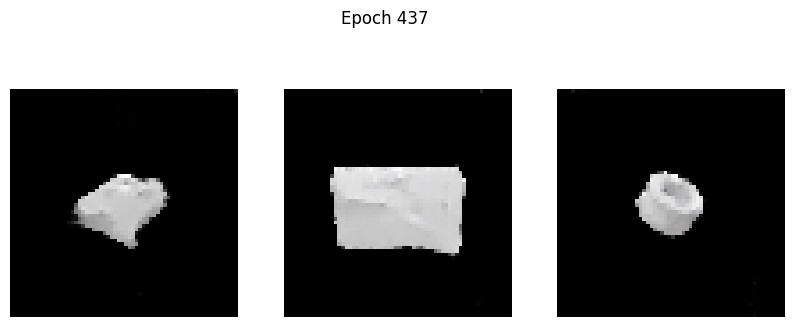

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0167 - g_loss: 5.4119
Epoch 438/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0047 - g_loss: 5.5435

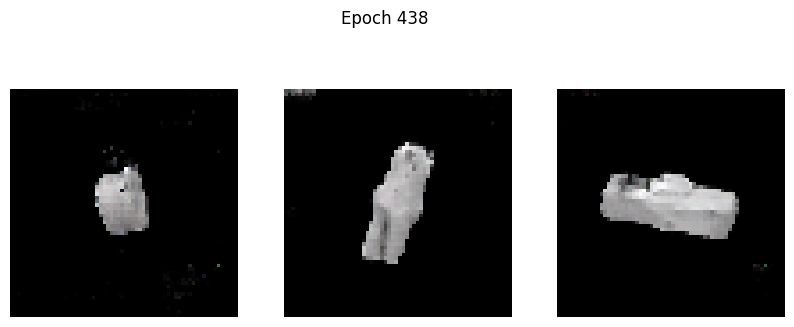

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - d_loss: -0.0048 - g_loss: 5.5430
Epoch 439/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 5.9227e-05 - g_loss: 5.5619 

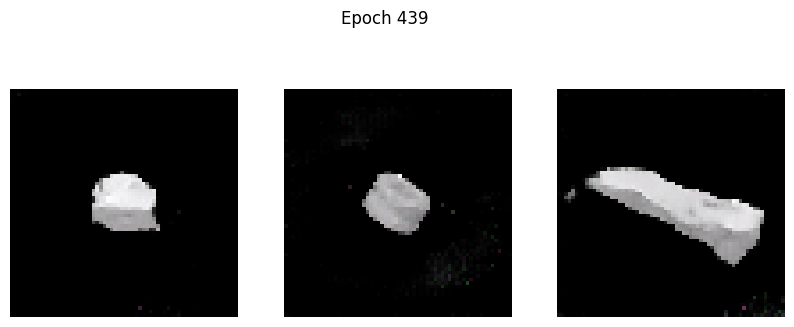

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 3.9202e-04 - g_loss: 5.5623
Epoch 440/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0291 - g_loss: 5.5090

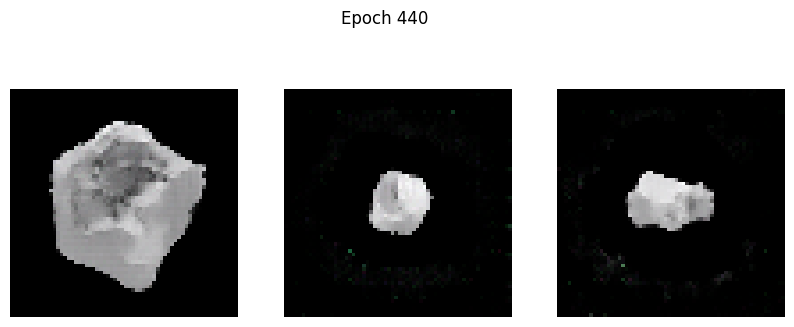

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0289 - g_loss: 5.5093
Epoch 441/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0435 - g_loss: 5.1912

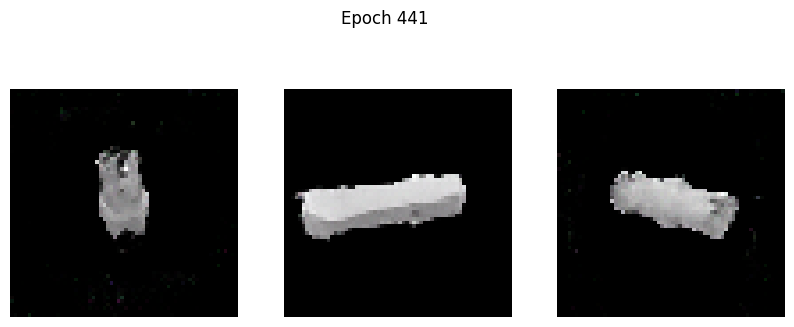

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - d_loss: -0.0433 - g_loss: 5.1925
Epoch 442/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0340 - g_loss: 5.2494

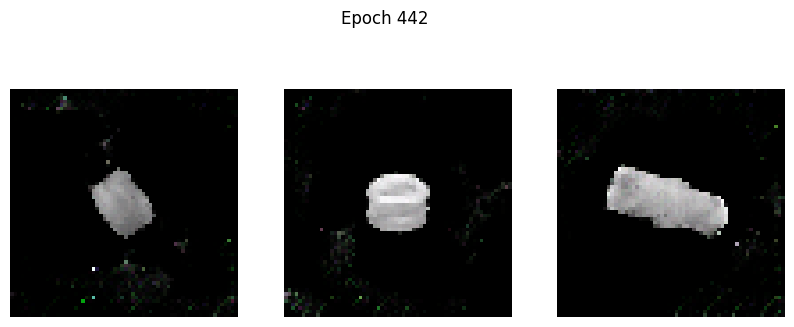

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0336 - g_loss: 5.2524
Epoch 443/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0495 - g_loss: 5.8217

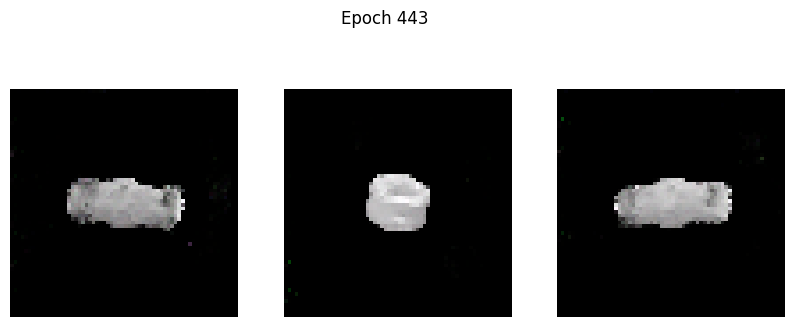

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0490 - g_loss: 5.8180
Epoch 444/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0023 - g_loss: 5.5032

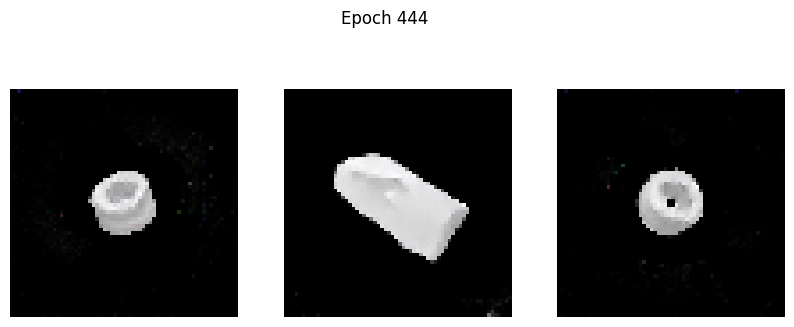

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0024 - g_loss: 5.5036
Epoch 445/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0177 - g_loss: 5.5382

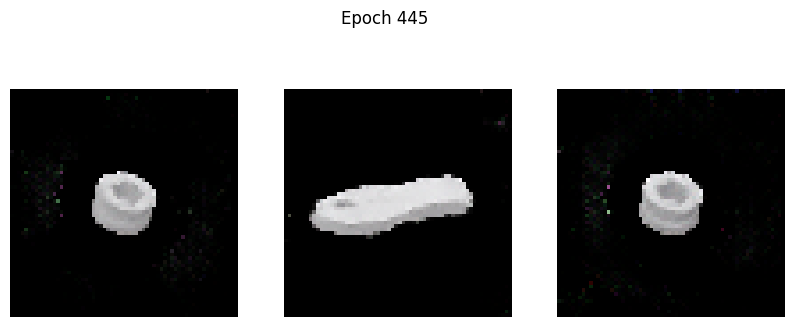

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0174 - g_loss: 5.5381
Epoch 446/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1007 - g_loss: 6.0846

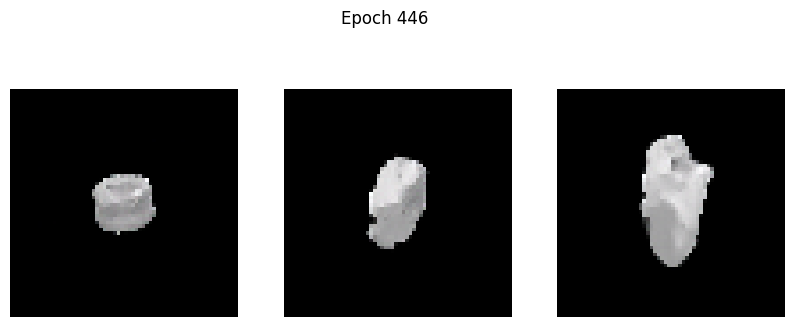

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1007 - g_loss: 6.0844
Epoch 447/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0092 - g_loss: 5.3302

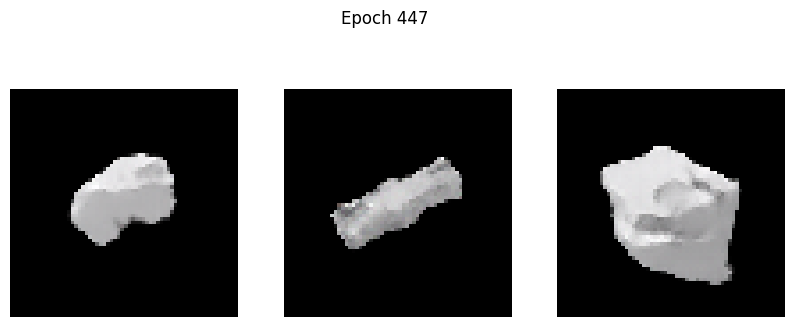

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0095 - g_loss: 5.3322
Epoch 448/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0366 - g_loss: 5.3877

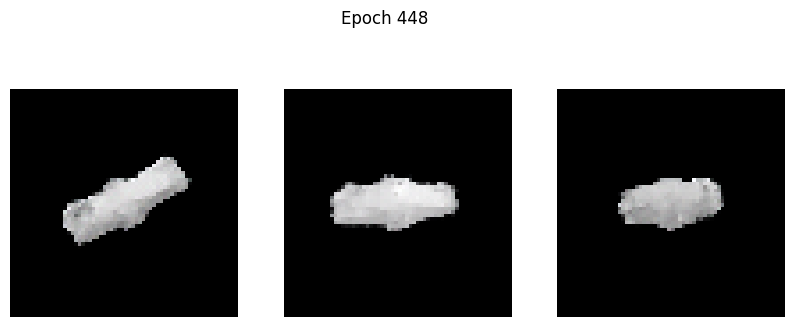

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0365 - g_loss: 5.3888
Epoch 449/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0679 - g_loss: 5.1480

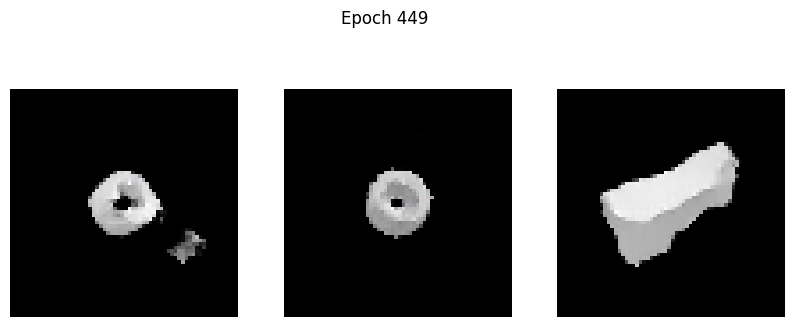

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0678 - g_loss: 5.1487
Epoch 450/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0398 - g_loss: 5.4816

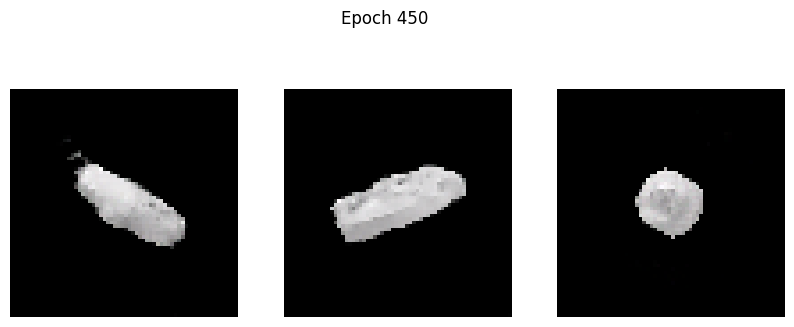

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0396 - g_loss: 5.4823
Epoch 451/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -3.4898e-04 - g_loss: 5.5531

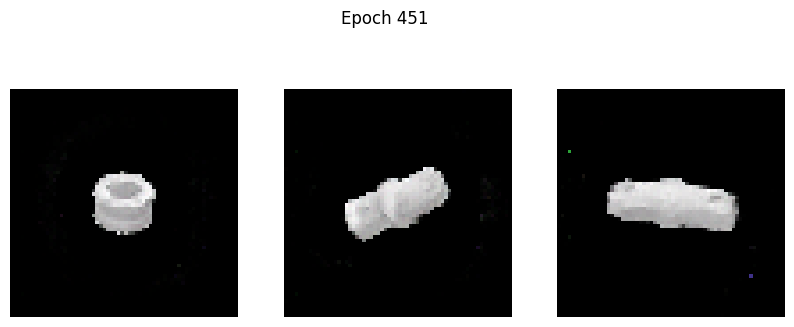

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -5.6098e-04 - g_loss: 5.5522
Epoch 452/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0113 - g_loss: 5.5047

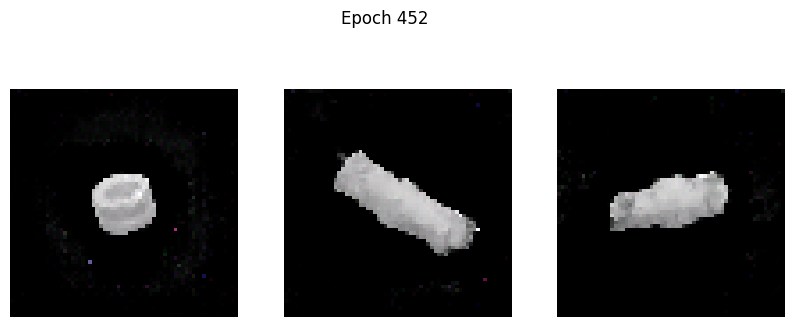

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0108 - g_loss: 5.5094
Epoch 453/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -2.3614e-04 - g_loss: 5.5274

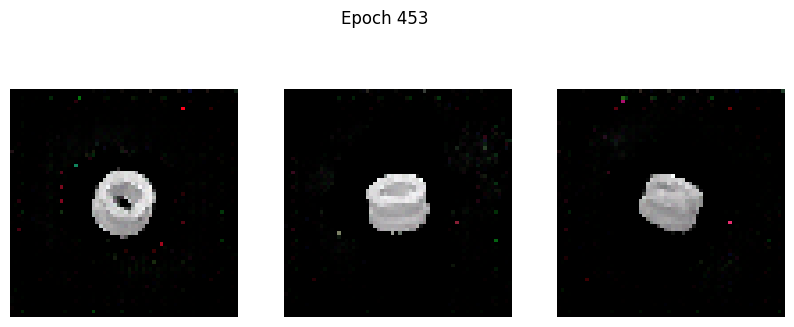

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -1.7417e-04 - g_loss: 5.5278
Epoch 454/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0057 - g_loss: 5.6568

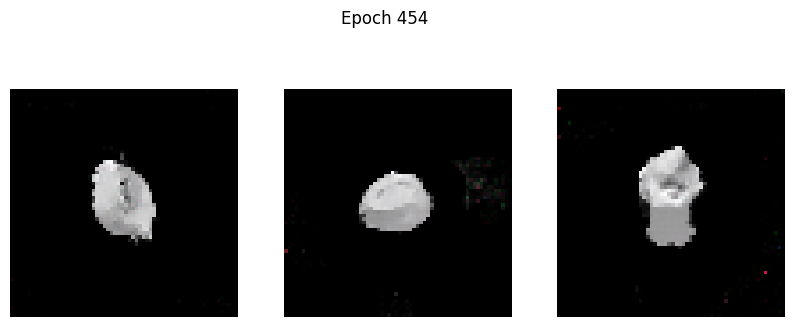

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0059 - g_loss: 5.6562
Epoch 455/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0139 - g_loss: 6.0019

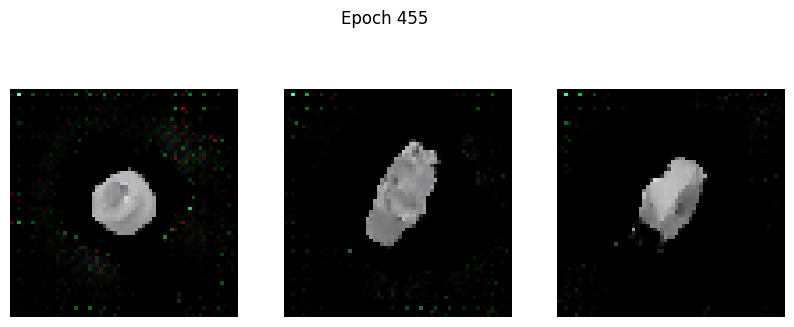

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0137 - g_loss: 5.9997
Epoch 456/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0386 - g_loss: 5.5400

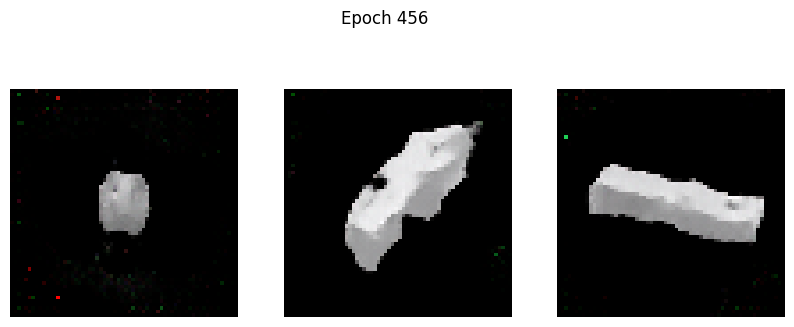

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0384 - g_loss: 5.5414
Epoch 457/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0378 - g_loss: 5.6735

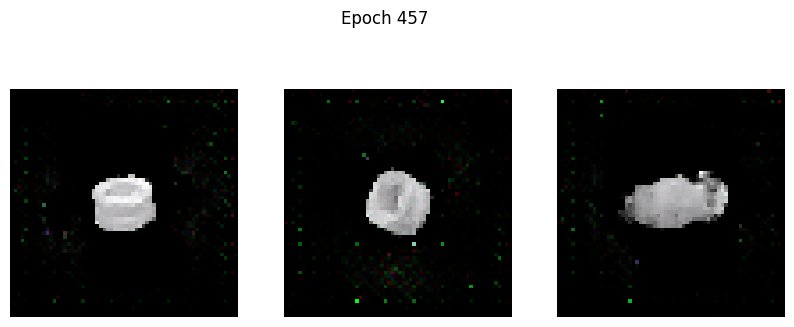

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0377 - g_loss: 5.6729
Epoch 458/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0025 - g_loss: 5.7373

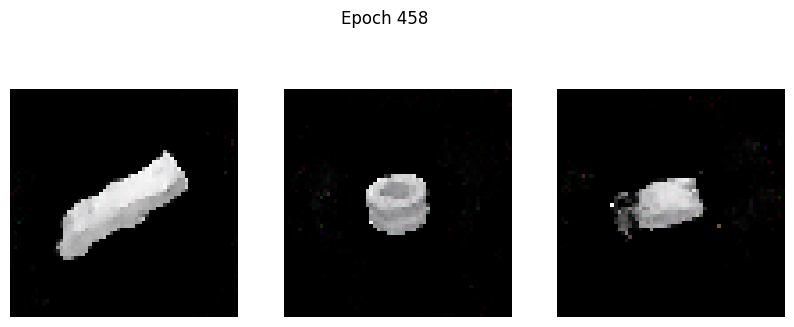

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0025 - g_loss: 5.7376
Epoch 459/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0176 - g_loss: 5.9414

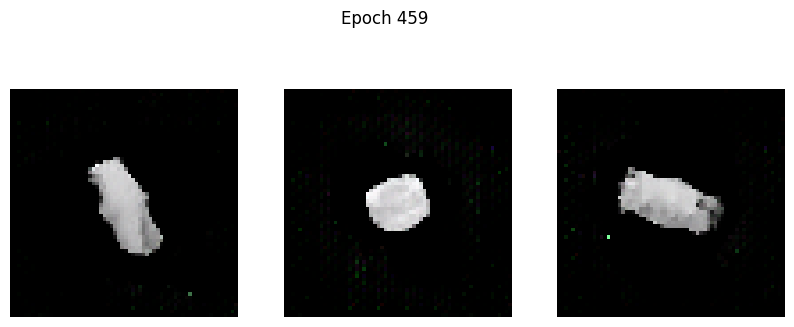

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0174 - g_loss: 5.9409
Epoch 460/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0071 - g_loss: 5.8626

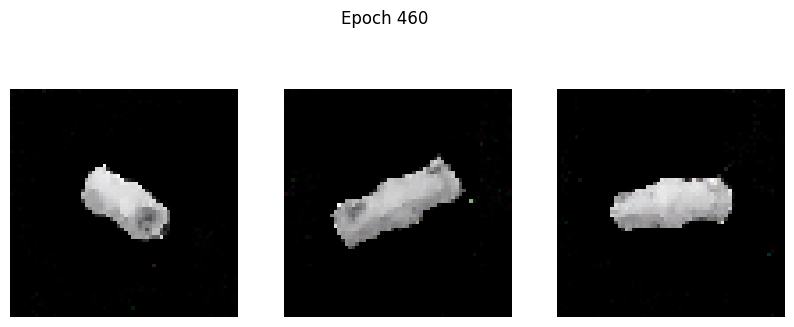

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.0069 - g_loss: 5.8624
Epoch 461/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0597 - g_loss: 5.7889

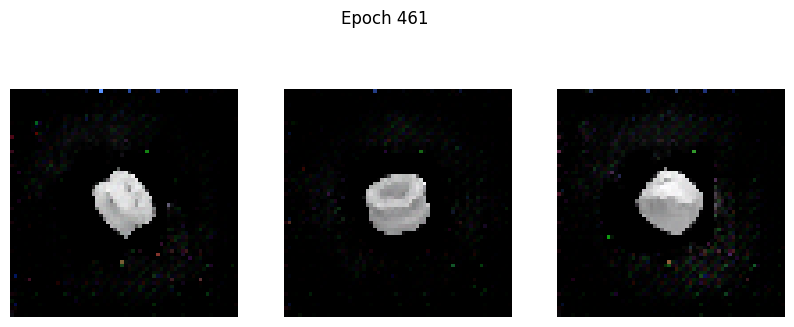

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.0597 - g_loss: 5.7879
Epoch 462/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0537 - g_loss: 5.8934

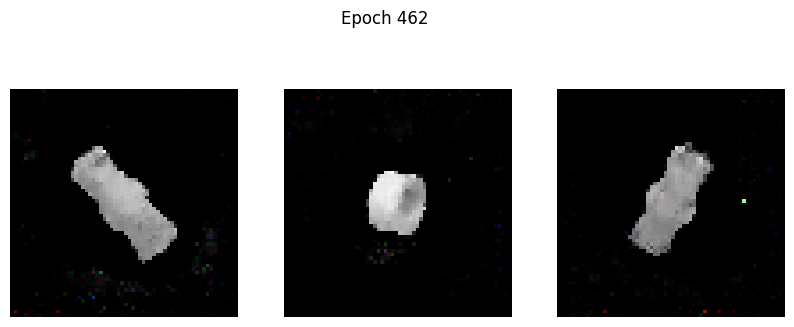

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.0535 - g_loss: 5.8923
Epoch 463/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0146 - g_loss: 5.9761

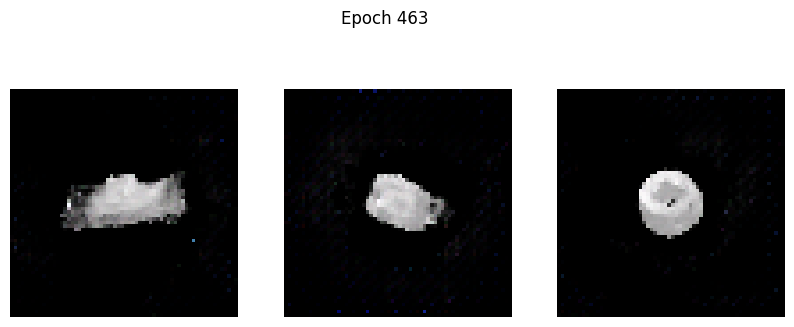

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.0154 - g_loss: 5.9804
Epoch 464/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0126 - g_loss: 5.6308

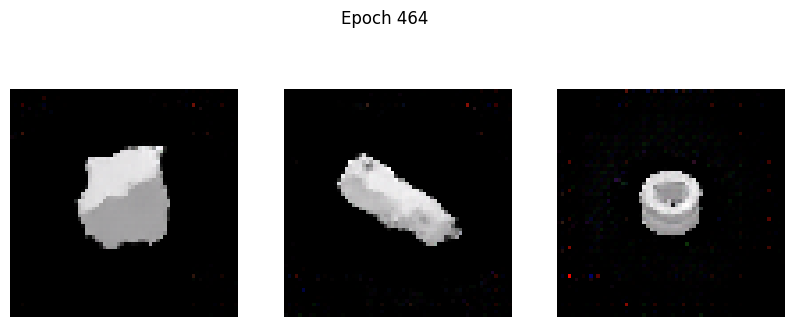

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0128 - g_loss: 5.6308
Epoch 465/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0366 - g_loss: 5.8070

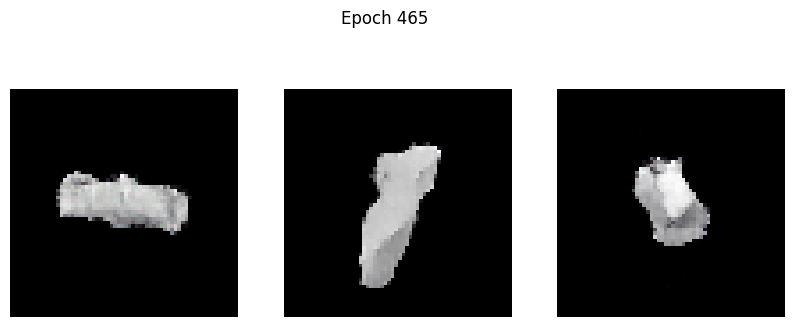

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0356 - g_loss: 5.8117
Epoch 466/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1091 - g_loss: 5.4867

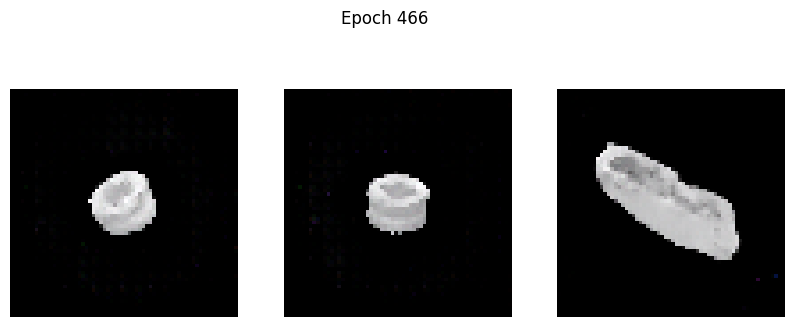

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.1090 - g_loss: 5.4863
Epoch 467/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0271 - g_loss: 5.7217

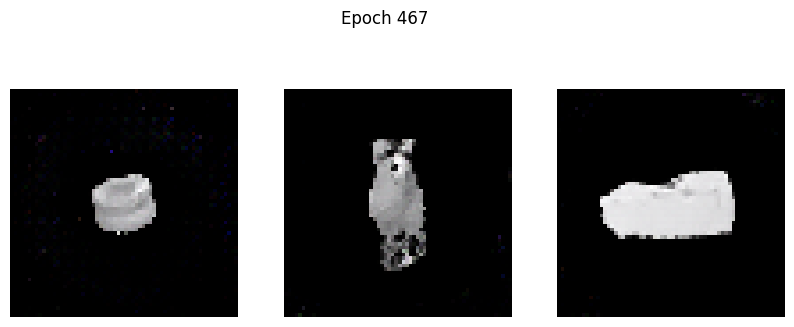

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0271 - g_loss: 5.7223
Epoch 468/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0352 - g_loss: 5.9200

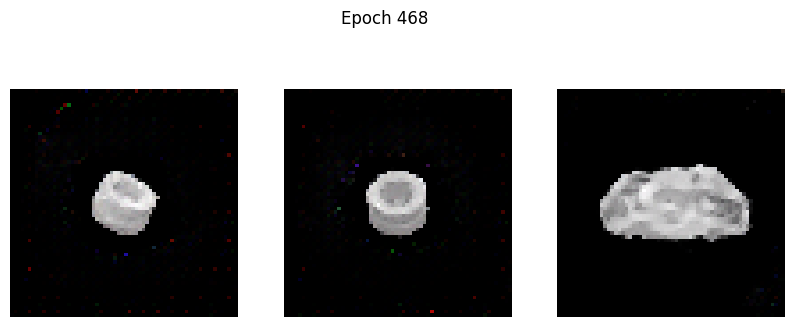

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0352 - g_loss: 5.9214
Epoch 469/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0400 - g_loss: 5.5747

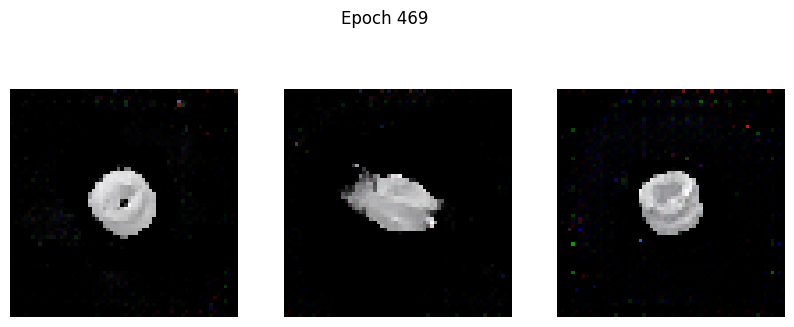

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0405 - g_loss: 5.5735
Epoch 470/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0225 - g_loss: 6.2946

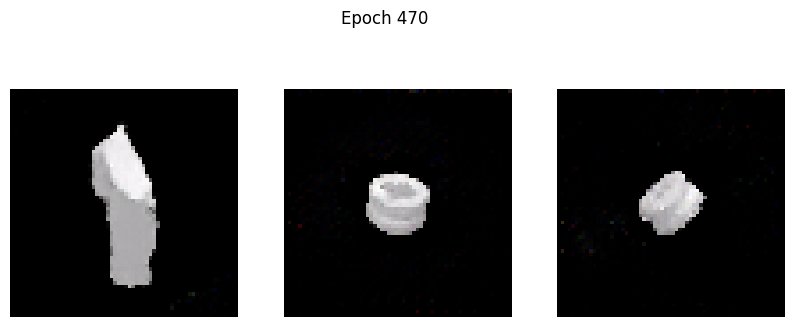

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0224 - g_loss: 6.2943
Epoch 471/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0824 - g_loss: 5.9368

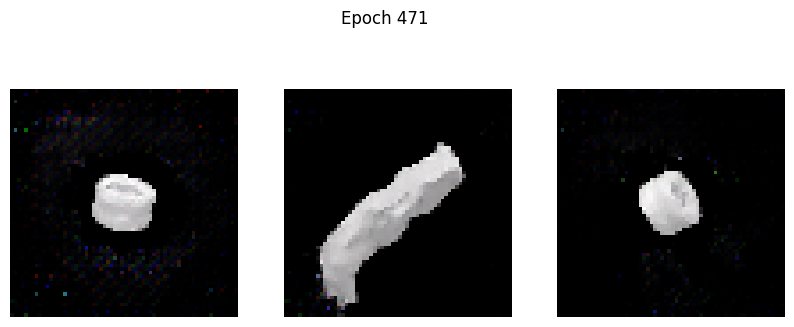

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0822 - g_loss: 5.9373
Epoch 472/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0639 - g_loss: 5.8175

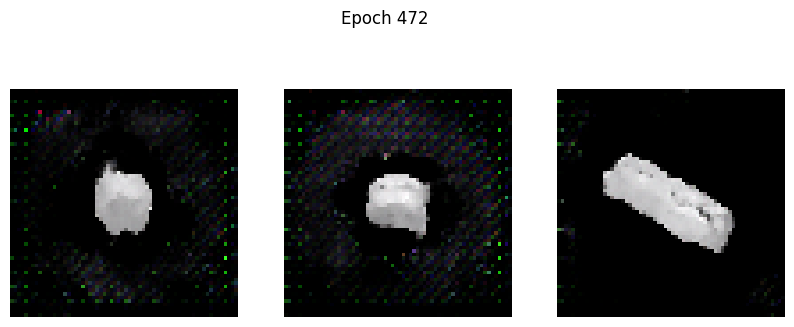

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0631 - g_loss: 5.8211
Epoch 473/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2062 - g_loss: 13.1445

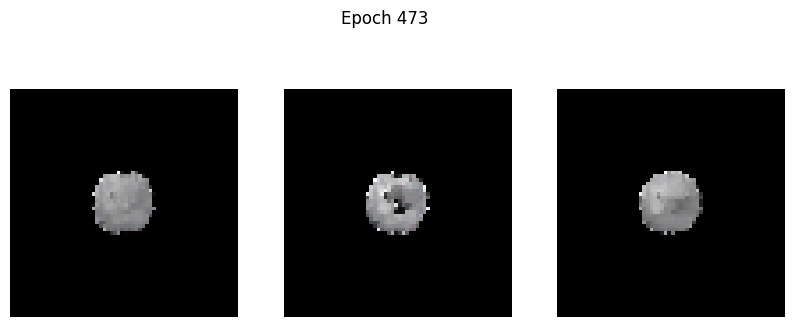

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2038 - g_loss: 13.1056
Epoch 474/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1722 - g_loss: 6.7975

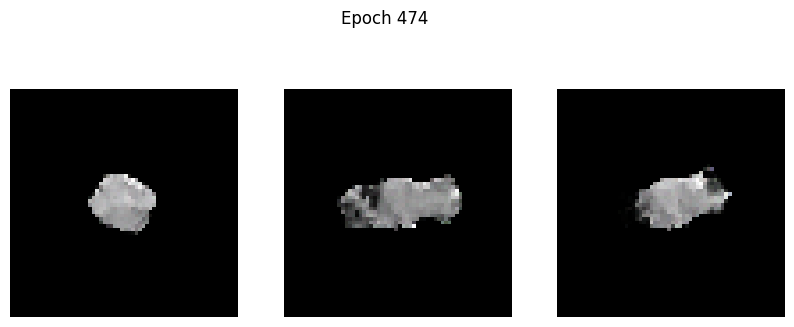

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.1721 - g_loss: 6.7948
Epoch 475/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1411 - g_loss: 6.3449

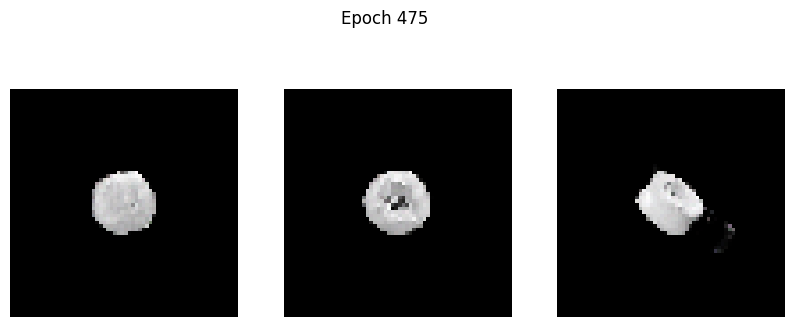

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1409 - g_loss: 6.3434
Epoch 476/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0836 - g_loss: 6.1384

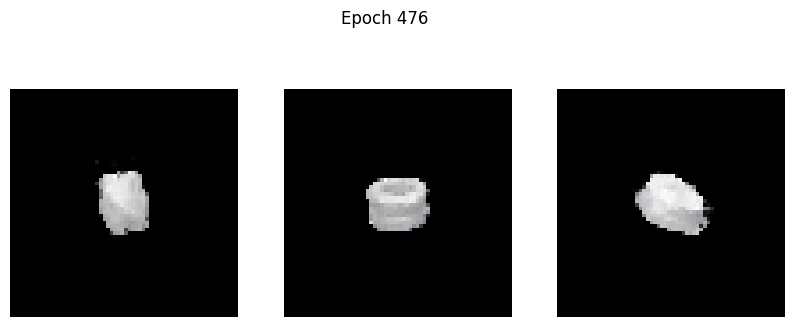

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0836 - g_loss: 6.1379
Epoch 477/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0832 - g_loss: 6.0646

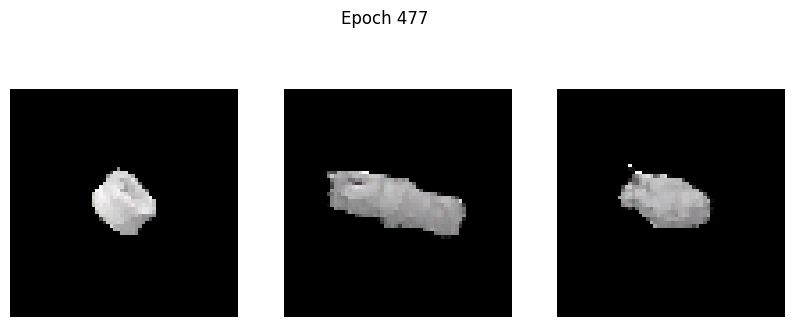

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0827 - g_loss: 6.0699
Epoch 478/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0679 - g_loss: 6.3569

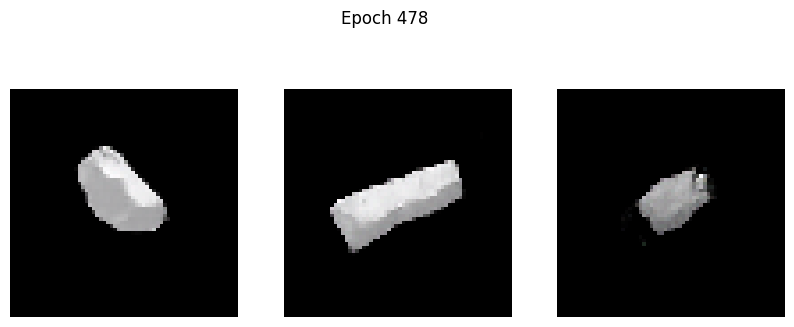

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0674 - g_loss: 6.3604
Epoch 479/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0790 - g_loss: 6.3266

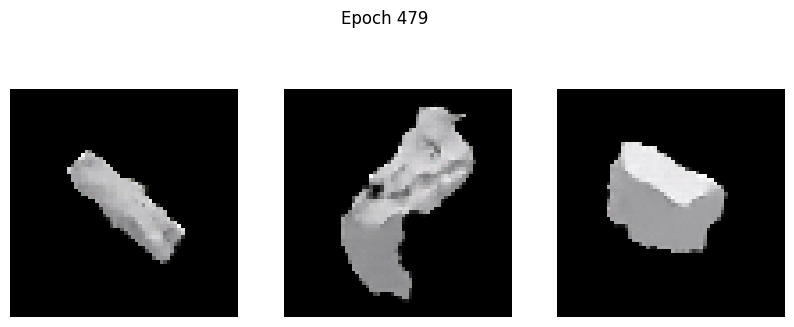

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0788 - g_loss: 6.3254
Epoch 480/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0361 - g_loss: 6.7144

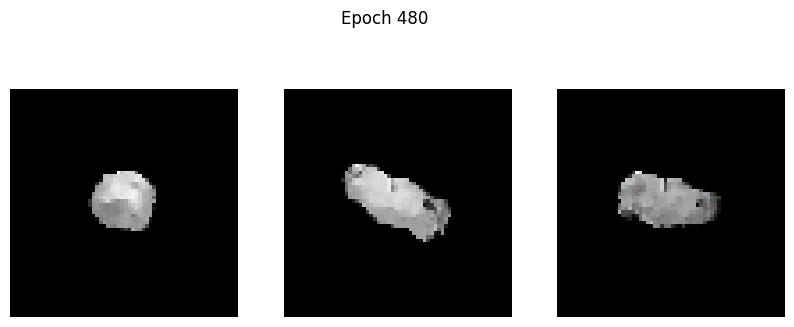

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0362 - g_loss: 6.7124
Epoch 481/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1151 - g_loss: 5.7006

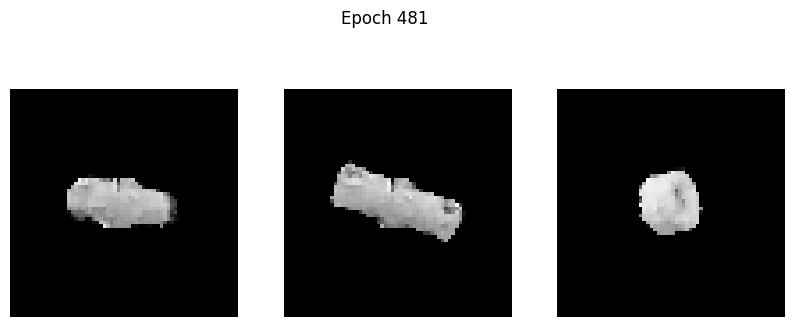

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1149 - g_loss: 5.7018
Epoch 482/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0286 - g_loss: 6.3617

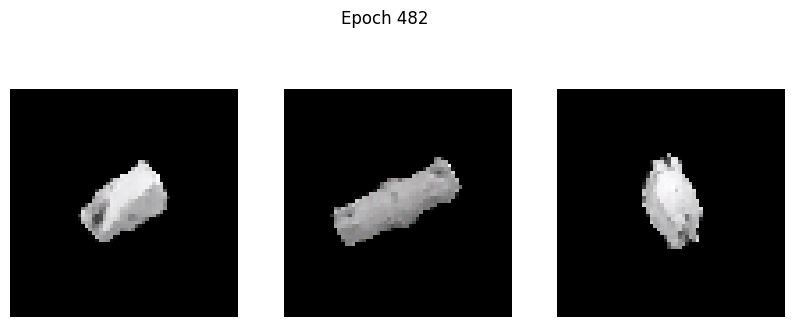

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0288 - g_loss: 6.3615
Epoch 483/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0945 - g_loss: 5.6840

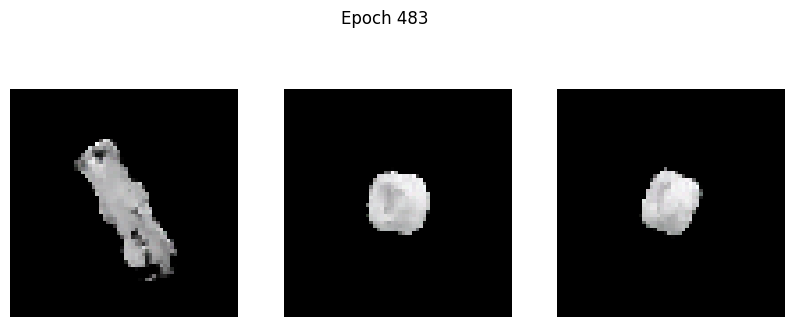

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0947 - g_loss: 5.6849
Epoch 484/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0049 - g_loss: 7.0817

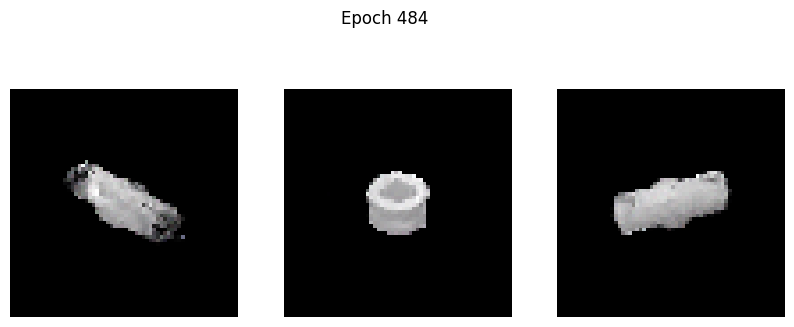

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0049 - g_loss: 7.0787
Epoch 485/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0286 - g_loss: 6.5921

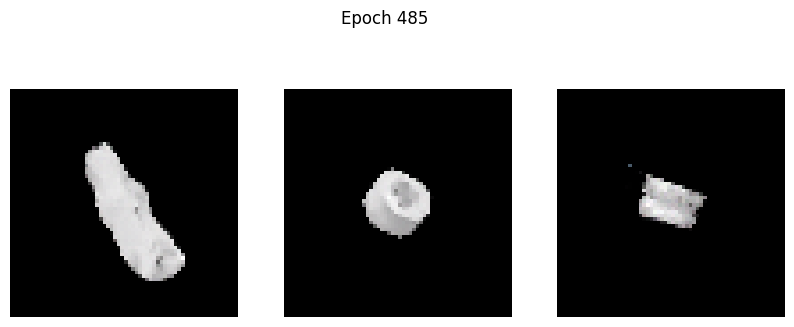

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0285 - g_loss: 6.5916
Epoch 486/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1536 - g_loss: 5.6731

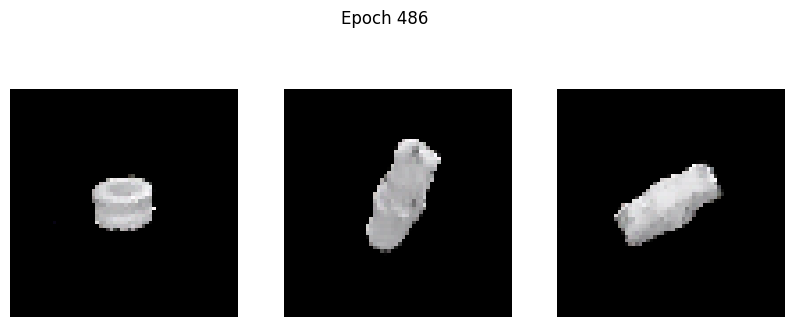

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1532 - g_loss: 5.6767
Epoch 487/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0507 - g_loss: 6.3917

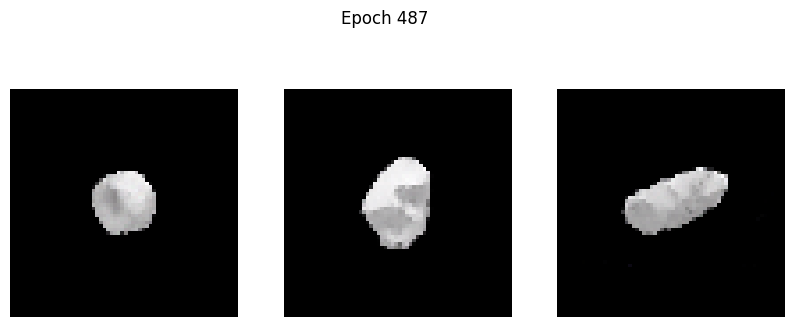

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0511 - g_loss: 6.3893
Epoch 488/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0887 - g_loss: 6.0676

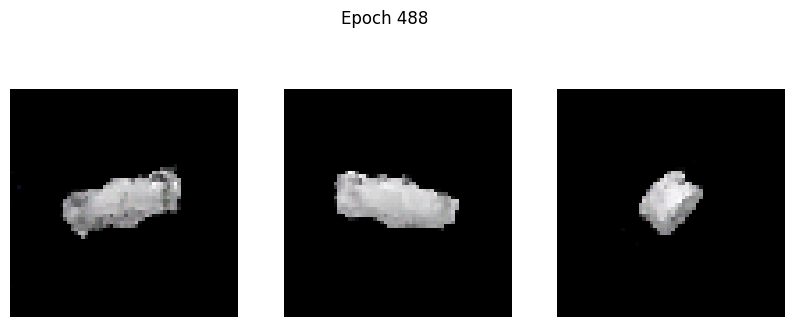

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0884 - g_loss: 6.0722
Epoch 489/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0285 - g_loss: 6.3446

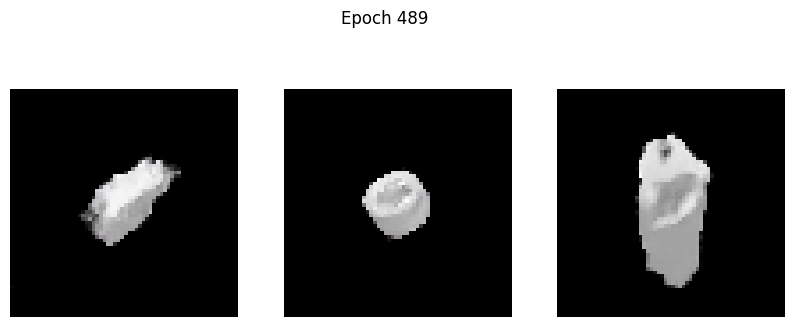

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0287 - g_loss: 6.3458
Epoch 490/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0428 - g_loss: 6.8408

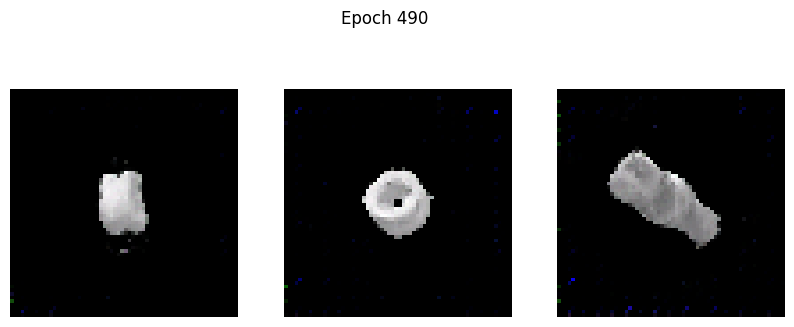

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0428 - g_loss: 6.8395
Epoch 491/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0921 - g_loss: 6.2465

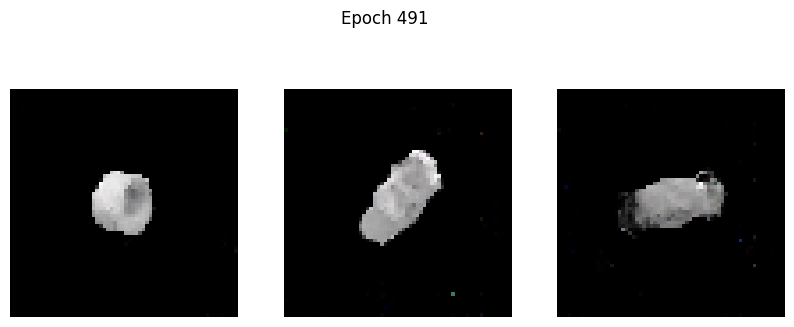

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0921 - g_loss: 6.2462
Epoch 492/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0154 - g_loss: 6.8391

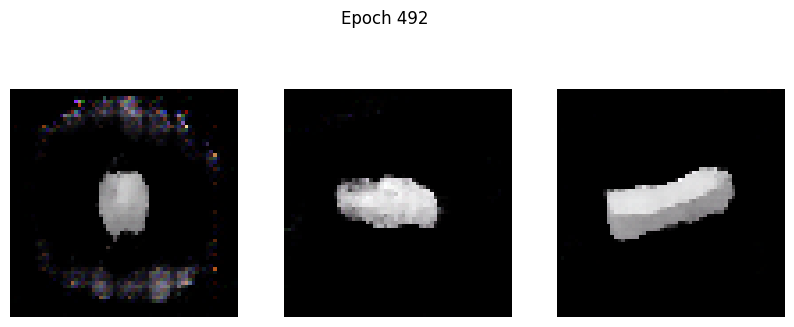

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0155 - g_loss: 6.8393
Epoch 493/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0555 - g_loss: 6.9202

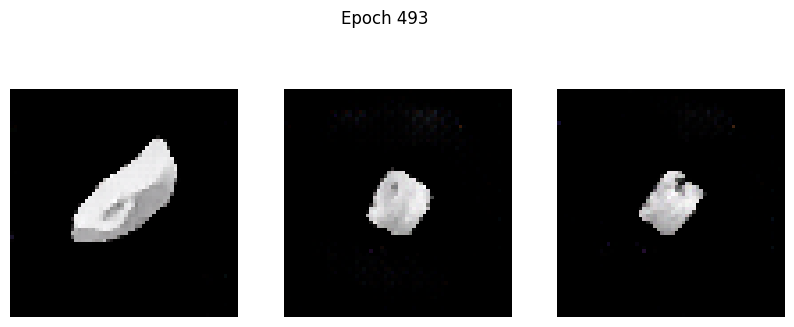

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0558 - g_loss: 6.9157
Epoch 494/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1521 - g_loss: 5.9657

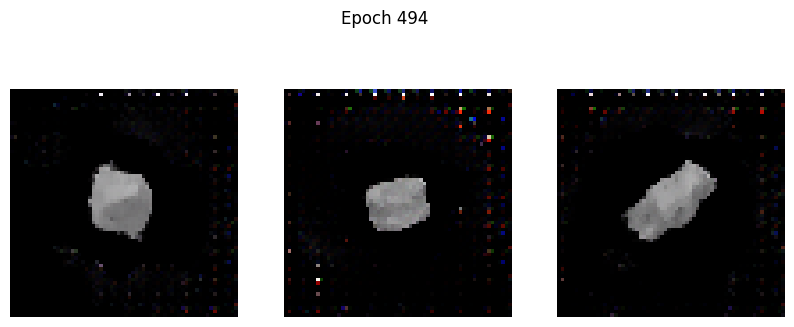

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.1518 - g_loss: 5.9683
Epoch 495/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0243 - g_loss: 9.9482

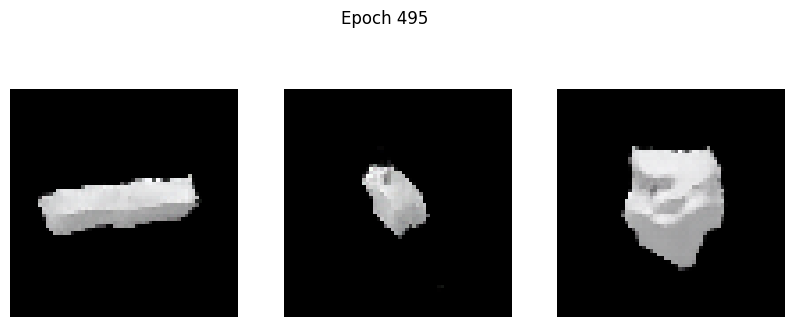

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0231 - g_loss: 9.9334
Epoch 496/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1109 - g_loss: 6.2685

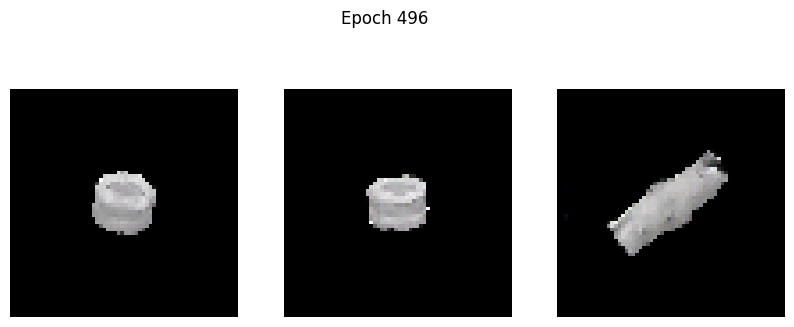

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1106 - g_loss: 6.2701
Epoch 497/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0794 - g_loss: 6.2968

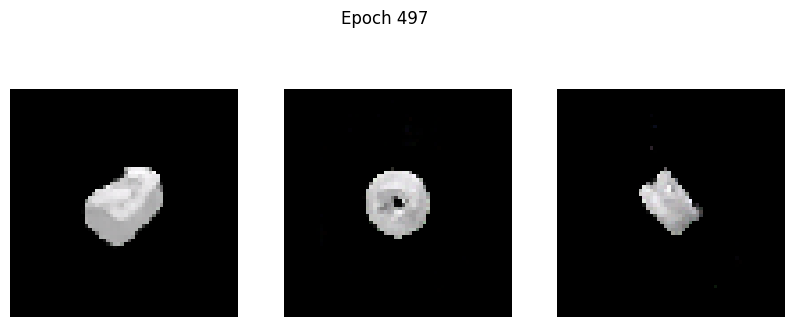

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0792 - g_loss: 6.2986
Epoch 498/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0665 - g_loss: 6.2606

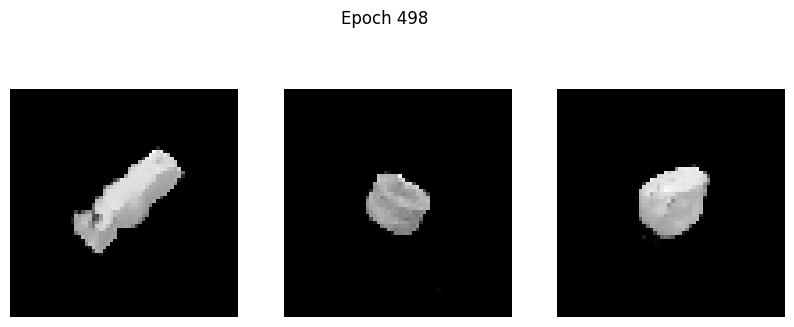

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0666 - g_loss: 6.2607
Epoch 499/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1170 - g_loss: 6.1535

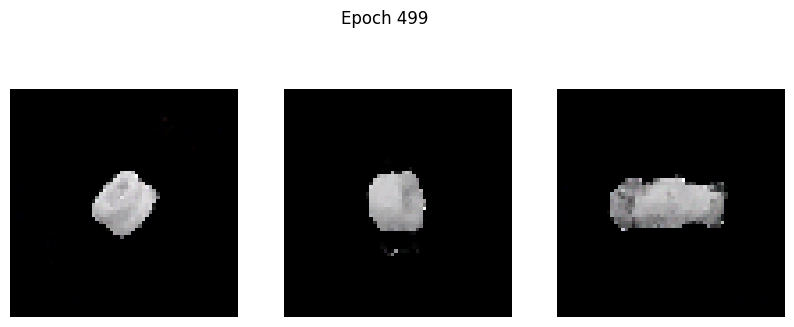

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1169 - g_loss: 6.1554
Epoch 500/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0735 - g_loss: 6.7264

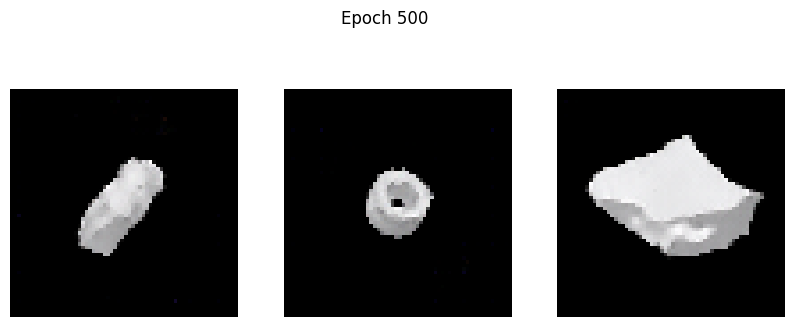

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0733 - g_loss: 6.7267
Epoch 501/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0795 - g_loss: 6.2203

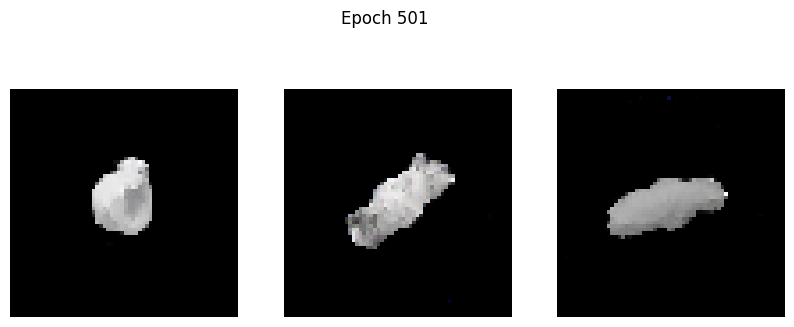

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.0794 - g_loss: 6.2241
Epoch 502/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1305 - g_loss: 6.6062

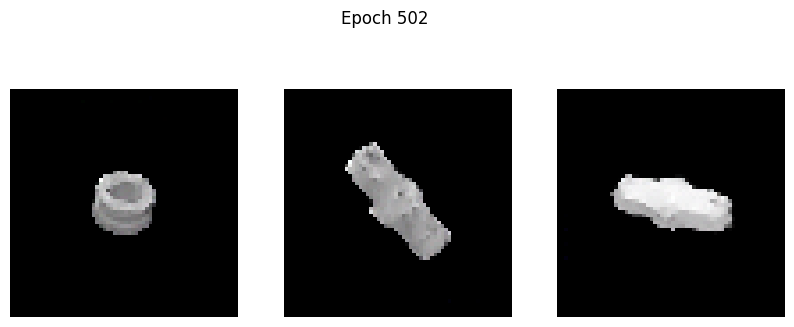

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.1302 - g_loss: 6.6069
Epoch 503/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0965 - g_loss: 6.5921

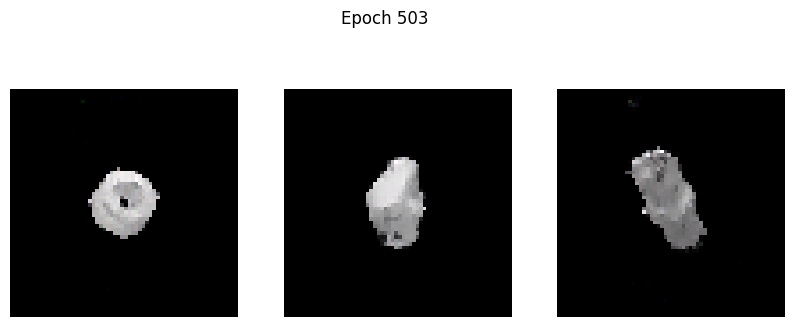

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0963 - g_loss: 6.5915
Epoch 504/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1511 - g_loss: 6.1455

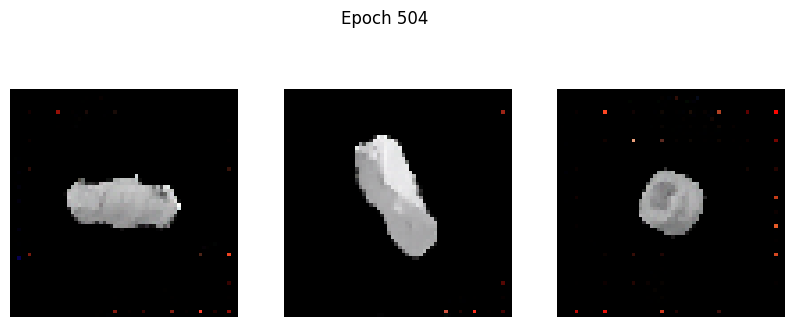

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1506 - g_loss: 6.1497
Epoch 505/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0581 - g_loss: 6.7115

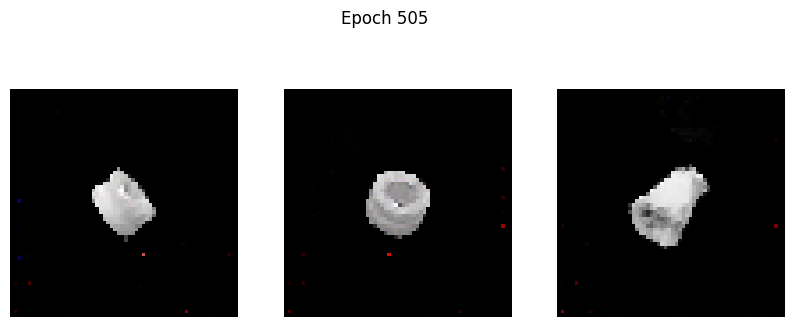

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0584 - g_loss: 6.7090
Epoch 506/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1253 - g_loss: 6.5317

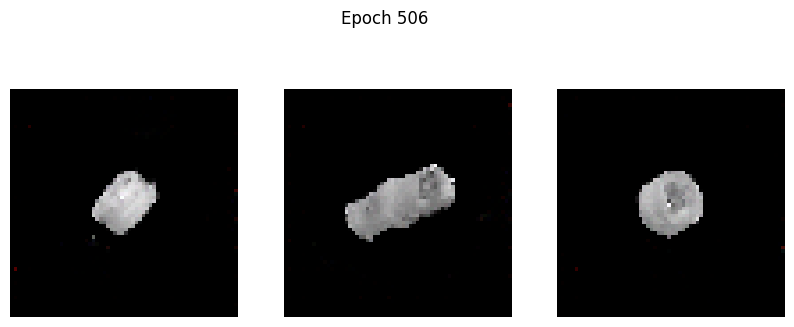

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1250 - g_loss: 6.5349
Epoch 507/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0430 - g_loss: 7.0320

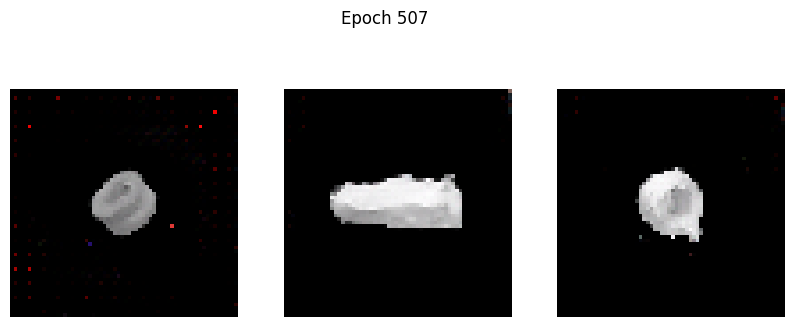

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0432 - g_loss: 7.0298
Epoch 508/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0543 - g_loss: 7.4244

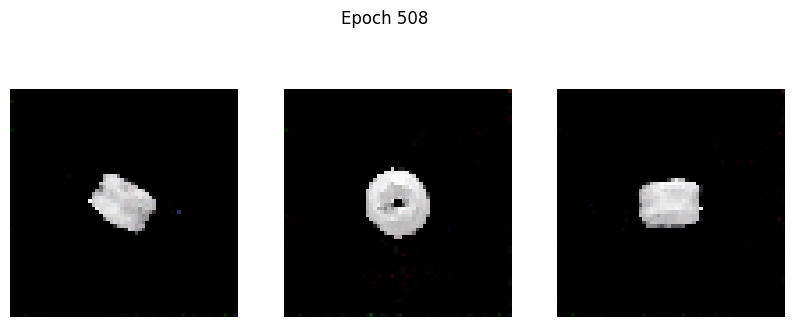

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0548 - g_loss: 7.4179
Epoch 509/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0349 - g_loss: 7.7237

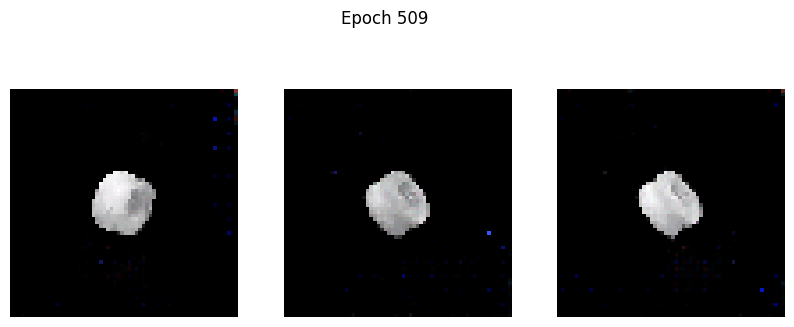

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0341 - g_loss: 7.7181
Epoch 510/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1173 - g_loss: 6.2627

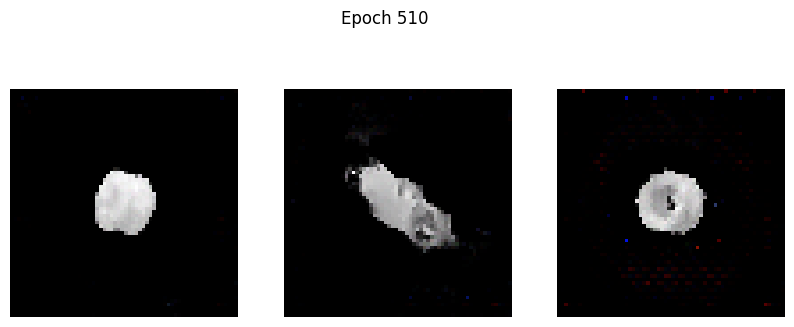

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1171 - g_loss: 6.2650
Epoch 511/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0851 - g_loss: 6.5816

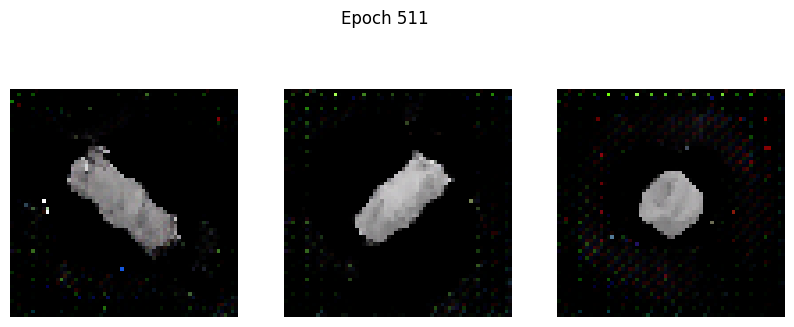

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0849 - g_loss: 6.5847
Epoch 512/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0810 - g_loss: 6.9411

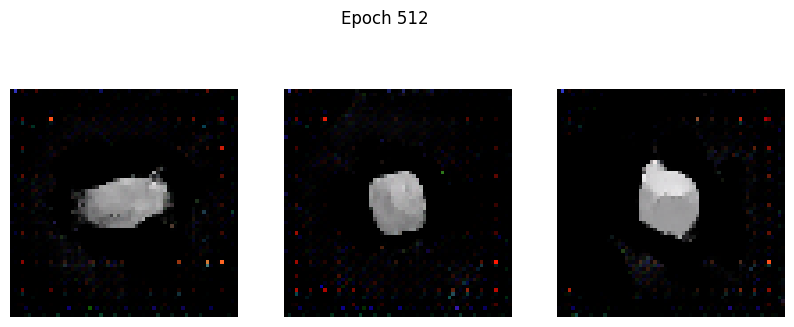

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0809 - g_loss: 6.9435
Epoch 513/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1054 - g_loss: 6.9653

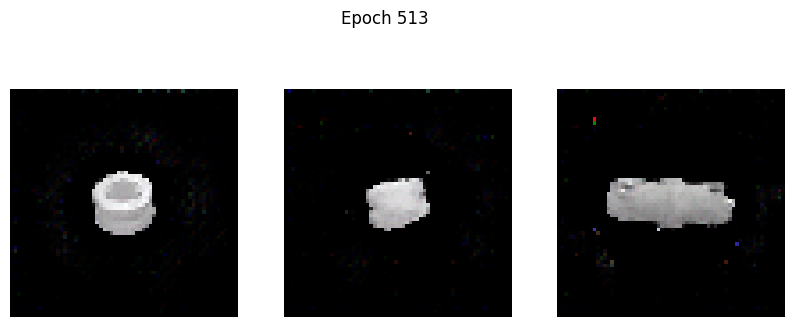

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1056 - g_loss: 6.9641
Epoch 514/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1024 - g_loss: 7.0788

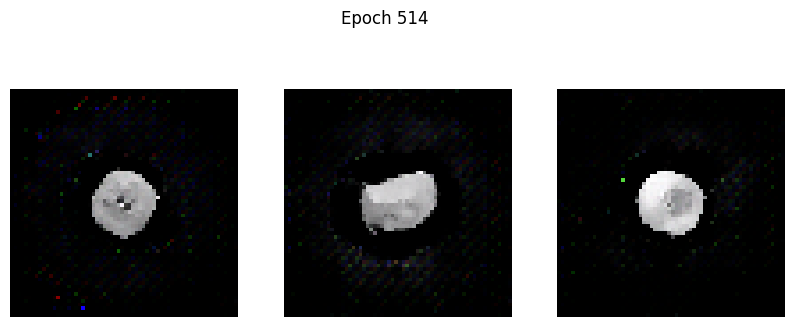

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1024 - g_loss: 7.0773
Epoch 515/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0480 - g_loss: 7.3422

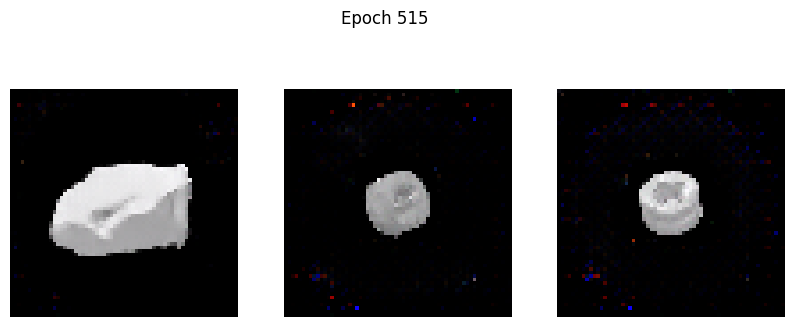

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.0486 - g_loss: 7.3388
Epoch 516/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0641 - g_loss: 7.2483

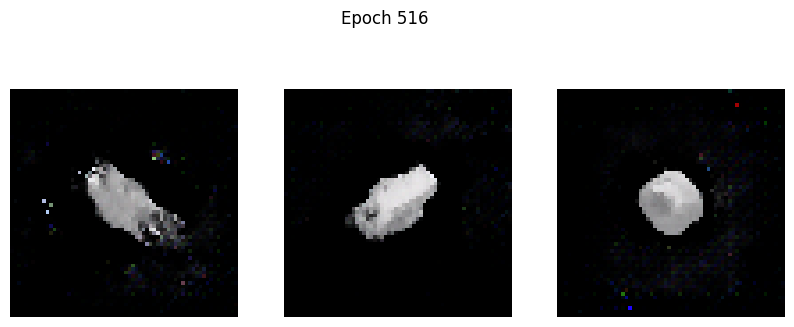

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0644 - g_loss: 7.2457
Epoch 517/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0642 - g_loss: 7.1824

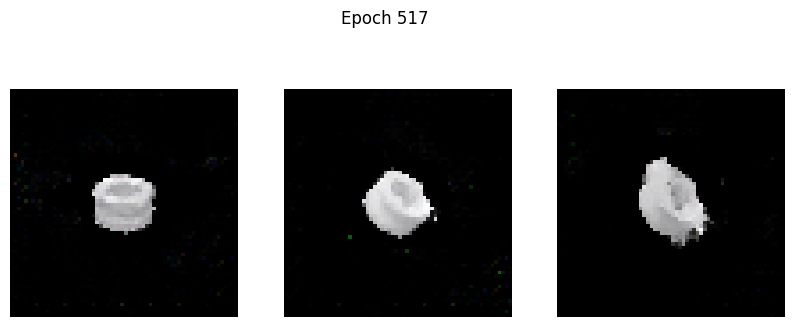

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0642 - g_loss: 7.1819
Epoch 518/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0849 - g_loss: 7.2877

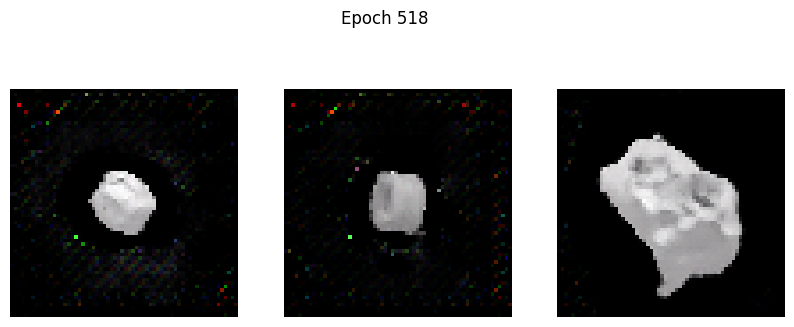

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0851 - g_loss: 7.2869
Epoch 519/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0821 - g_loss: 6.9932

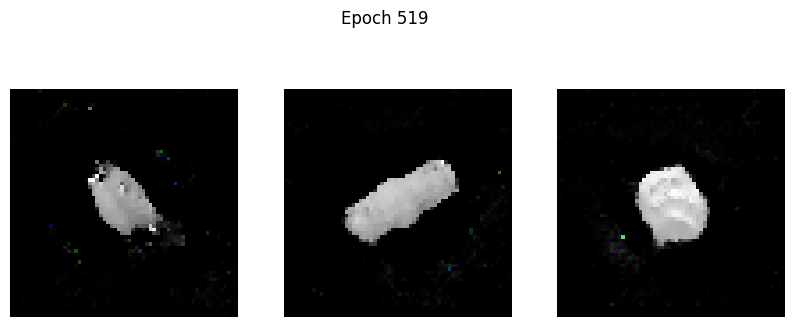

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0825 - g_loss: 6.9928
Epoch 520/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1747 - g_loss: 6.6893

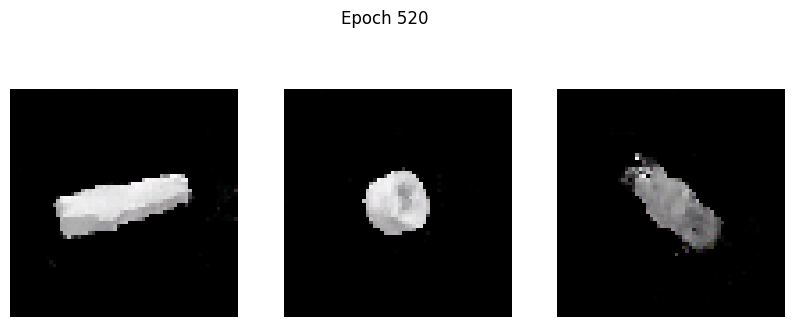

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1742 - g_loss: 6.6935
Epoch 521/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1821 - g_loss: 6.7388

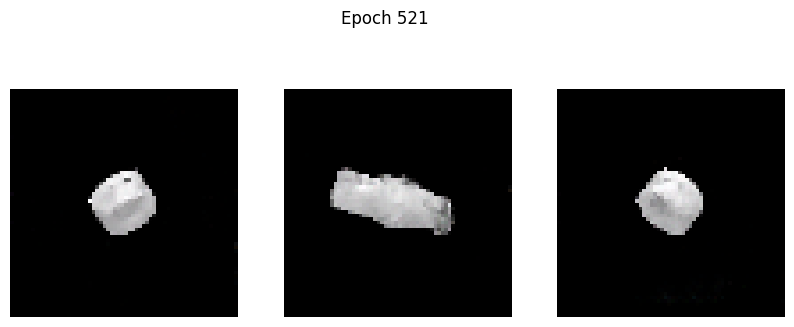

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1823 - g_loss: 6.7371
Epoch 522/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1323 - g_loss: 7.3646

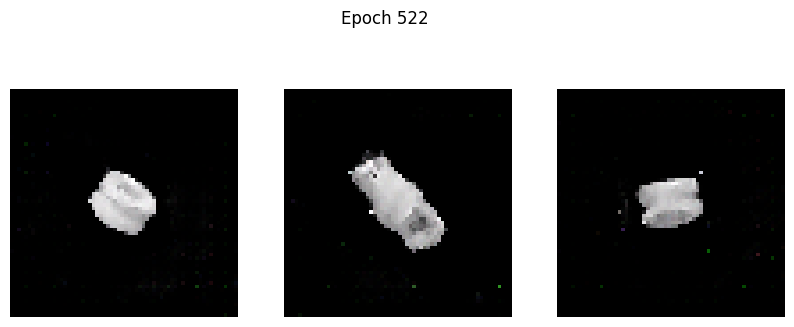

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1324 - g_loss: 7.3627
Epoch 523/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1393 - g_loss: 7.6567

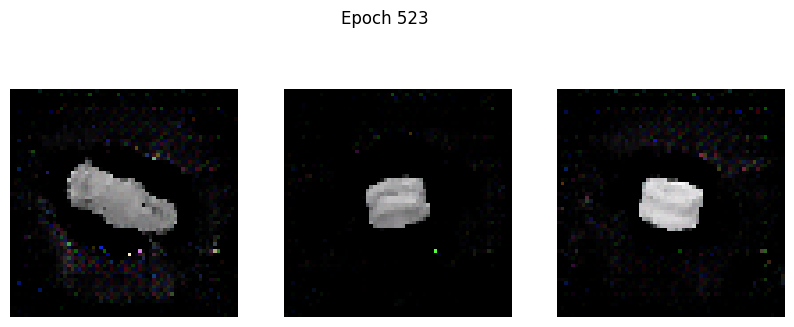

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1387 - g_loss: 7.6579
Epoch 524/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0749 - g_loss: 14.9311

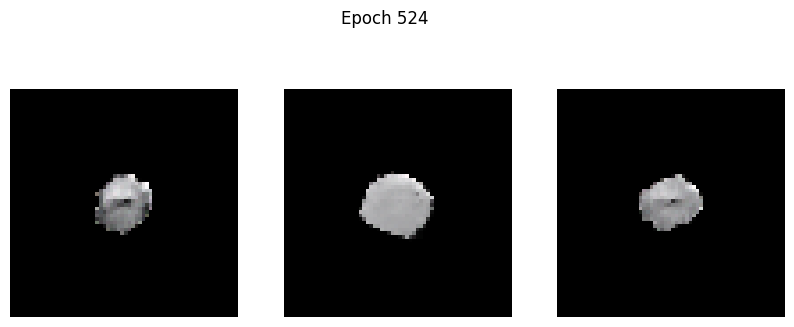

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0729 - g_loss: 14.9103
Epoch 525/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.3445 - g_loss: 9.5259

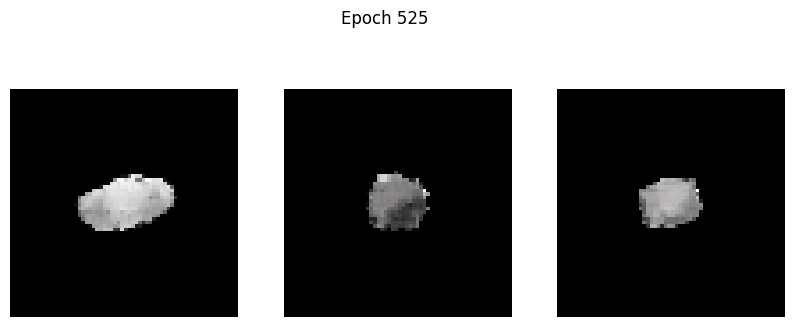

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.3444 - g_loss: 9.5225
Epoch 526/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.2703 - g_loss: 8.5197

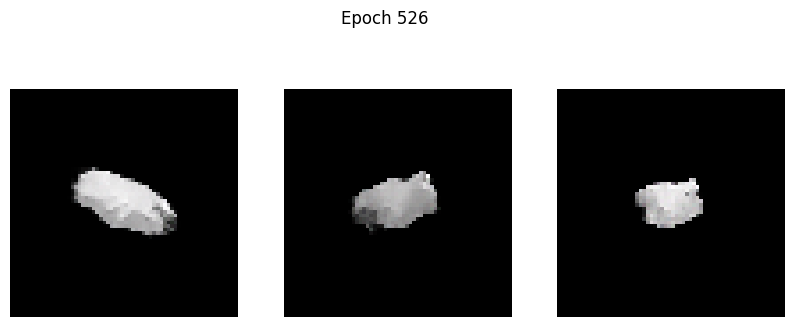

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.2700 - g_loss: 8.5178
Epoch 527/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.2587 - g_loss: 7.4018

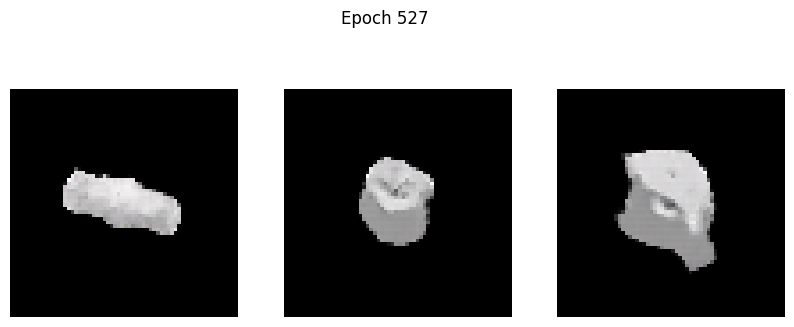

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.2586 - g_loss: 7.4007
Epoch 528/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.2692 - g_loss: 7.1321

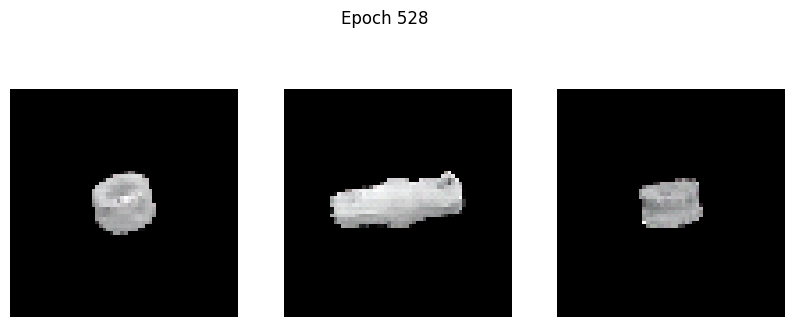

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.2688 - g_loss: 7.1331
Epoch 529/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.2907 - g_loss: 7.1524

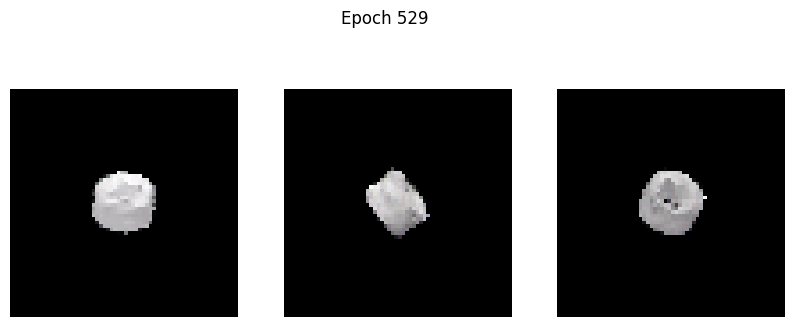

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.2900 - g_loss: 7.1544
Epoch 530/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1130 - g_loss: 7.7911

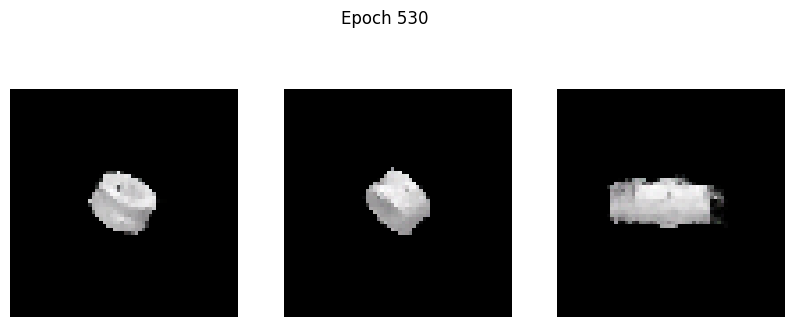

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1131 - g_loss: 7.7905
Epoch 531/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1568 - g_loss: 6.8442

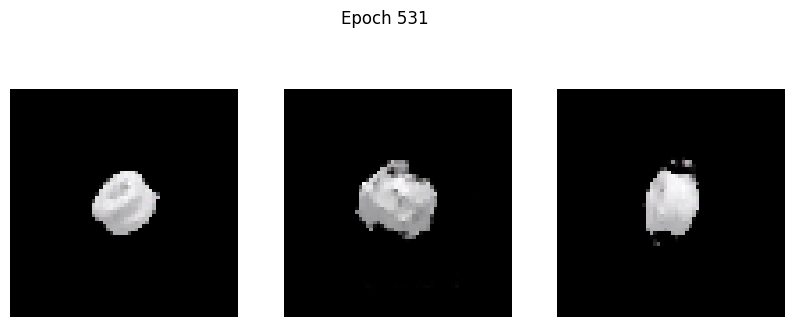

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1567 - g_loss: 6.8469
Epoch 532/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1912 - g_loss: 6.9635

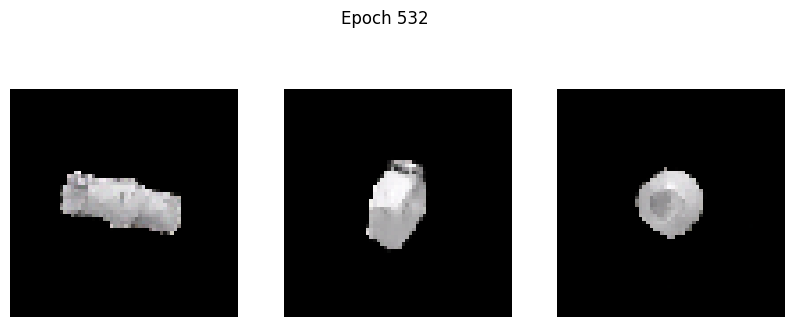

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1910 - g_loss: 6.9655
Epoch 533/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1428 - g_loss: 7.4632

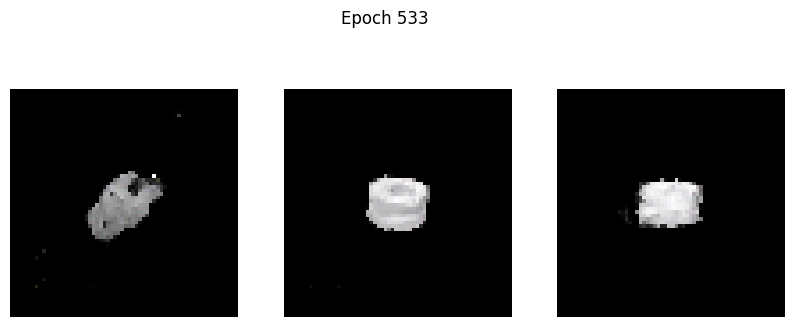

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1427 - g_loss: 7.4658
Epoch 534/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1642 - g_loss: 7.5903

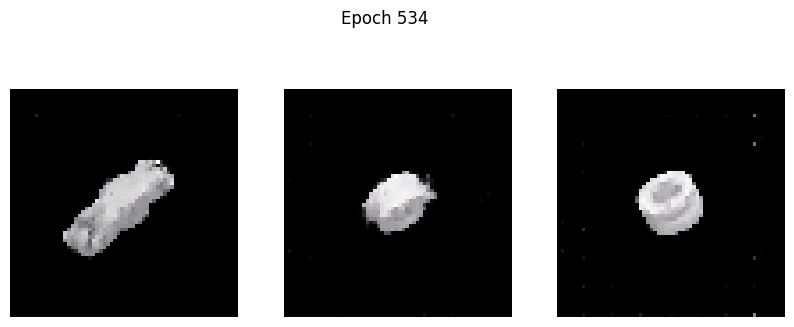

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.1642 - g_loss: 7.5905
Epoch 535/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0314 - g_loss: 8.7452

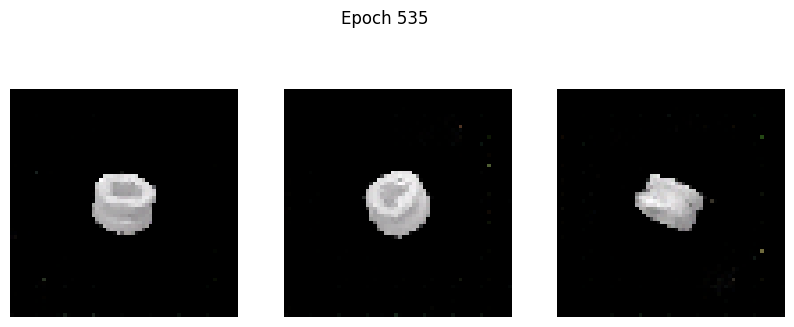

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0305 - g_loss: 8.7392
Epoch 536/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1340 - g_loss: 7.7731

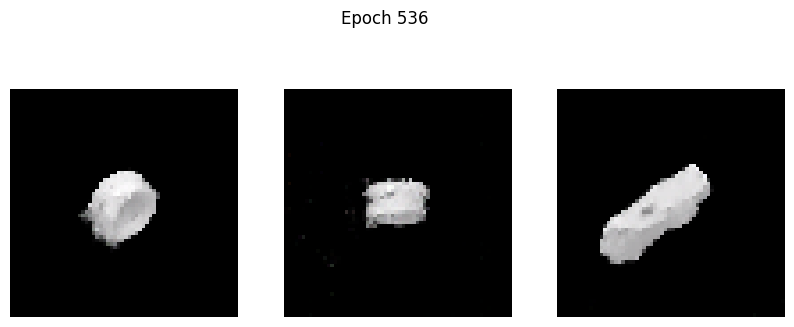

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1341 - g_loss: 7.7691
Epoch 537/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1603 - g_loss: 7.3050

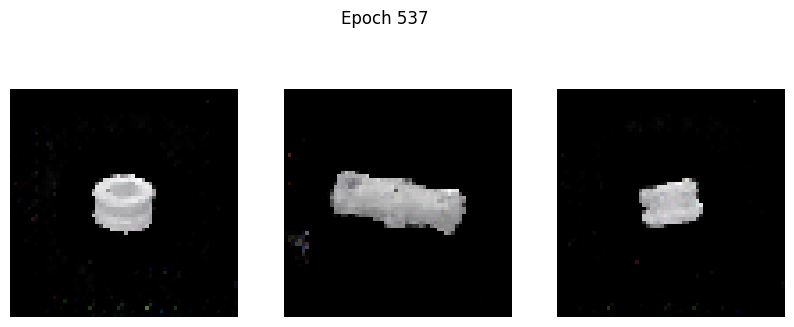

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.1608 - g_loss: 7.3041
Epoch 538/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1671 - g_loss: 7.3472

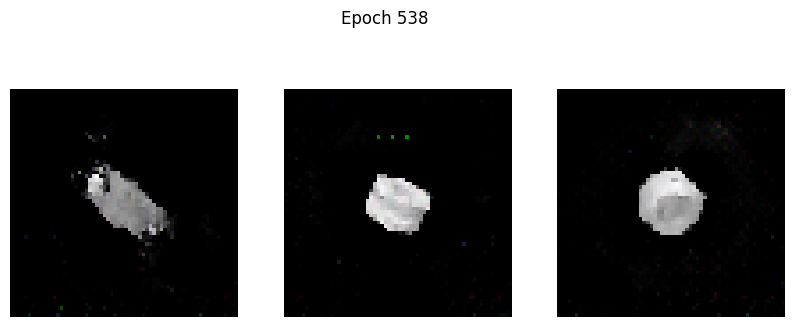

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.1673 - g_loss: 7.3499
Epoch 539/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.2200 - g_loss: 7.5130

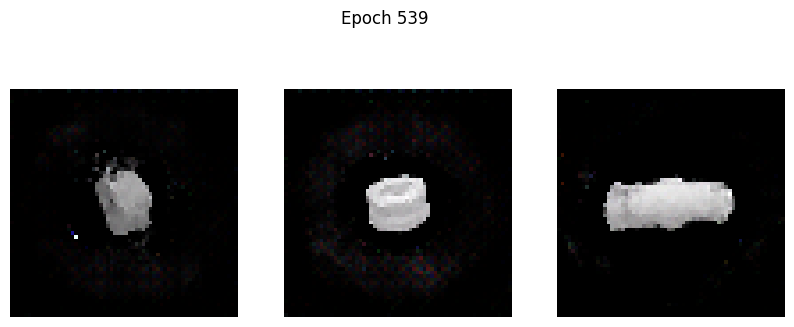

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.2195 - g_loss: 7.5192
Epoch 540/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1335 - g_loss: 7.9954

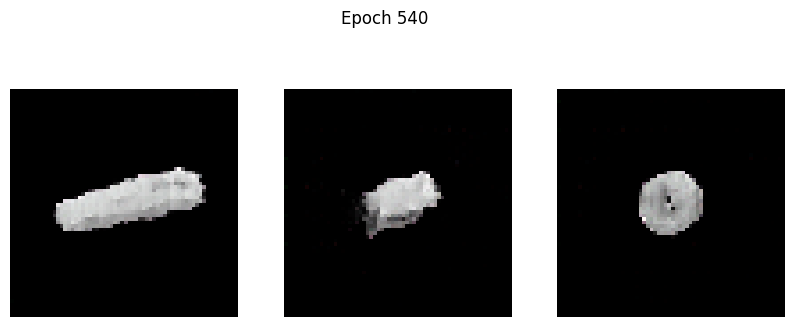

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1330 - g_loss: 8.0002
Epoch 541/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2606 - g_loss: 7.9252

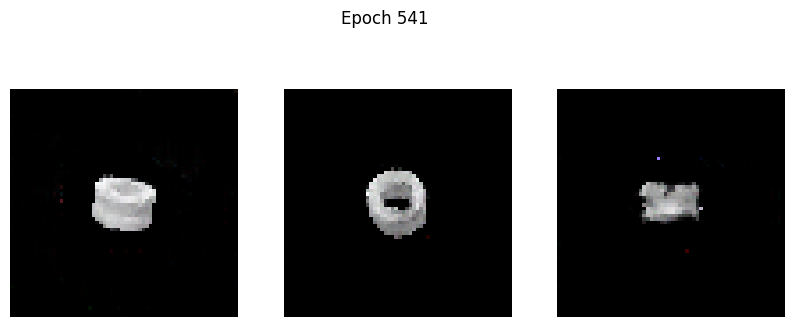

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.2594 - g_loss: 7.9295
Epoch 542/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1610 - g_loss: 8.4814

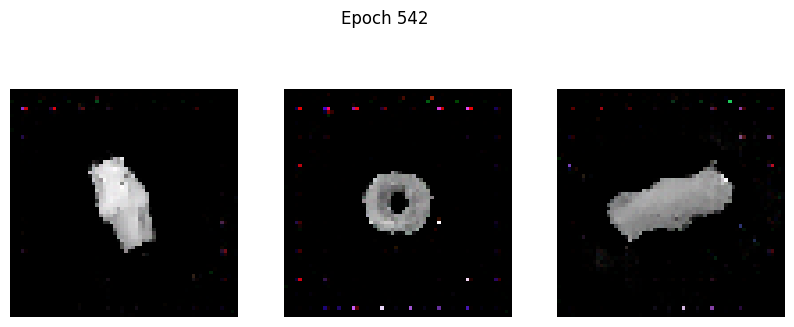

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - d_loss: -0.1611 - g_loss: 8.4770
Epoch 543/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.2428 - g_loss: 7.5748

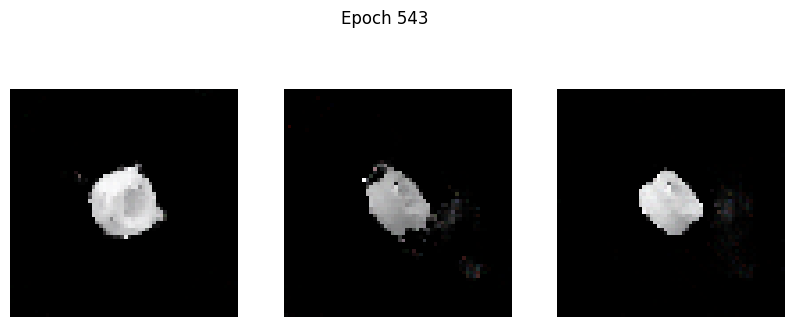

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.2422 - g_loss: 7.5779
Epoch 544/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.2412 - g_loss: 7.3851

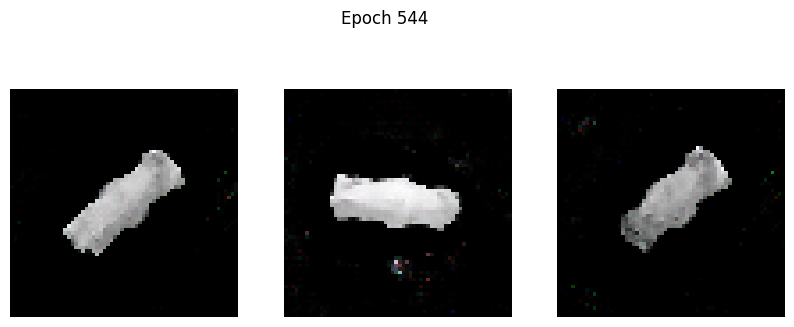

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.2411 - g_loss: 7.3908
Epoch 545/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1436 - g_loss: 8.4312

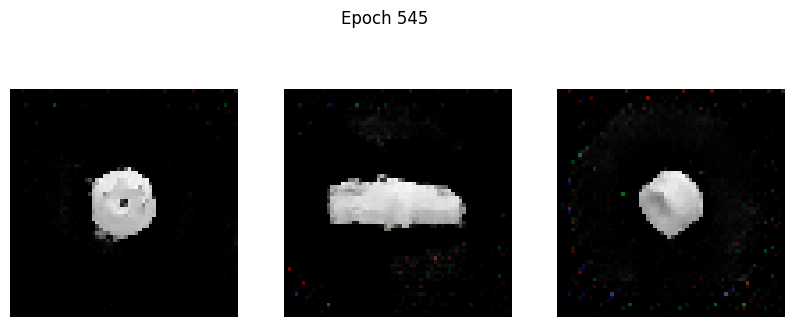

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1442 - g_loss: 8.4266
Epoch 546/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1767 - g_loss: 8.9002

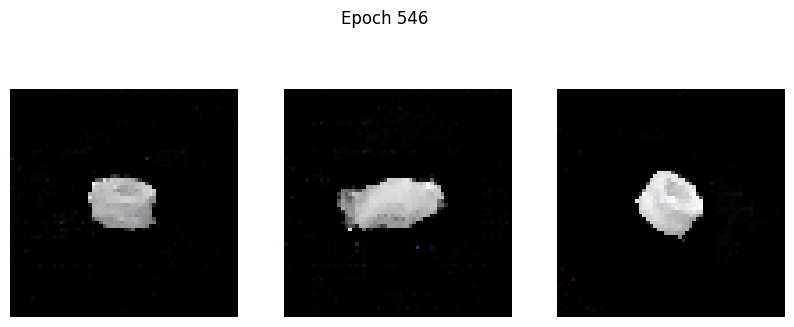

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1764 - g_loss: 8.8978
Epoch 547/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0651 - g_loss: 9.2844

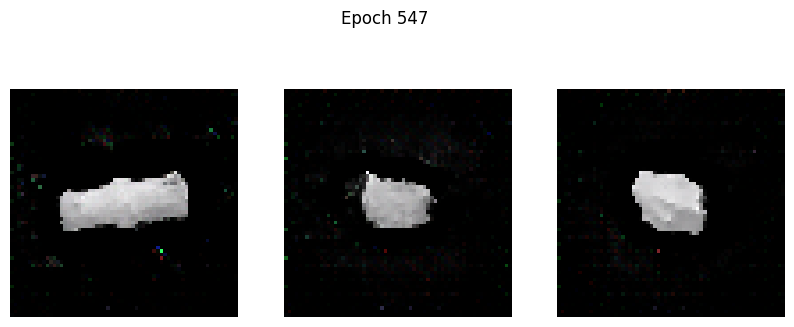

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0660 - g_loss: 9.2757
Epoch 548/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.3151 - g_loss: 7.6648

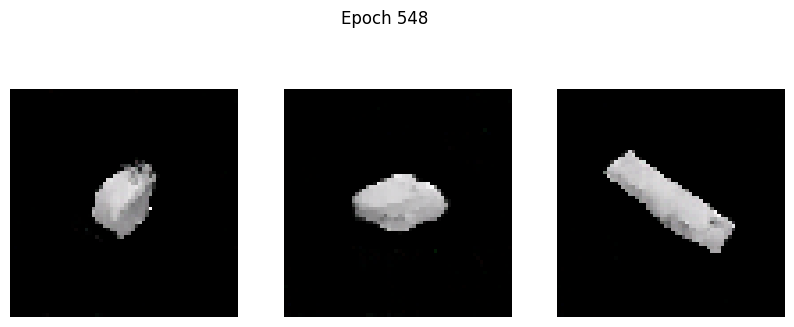

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.3148 - g_loss: 7.6670
Epoch 549/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1844 - g_loss: 7.8928

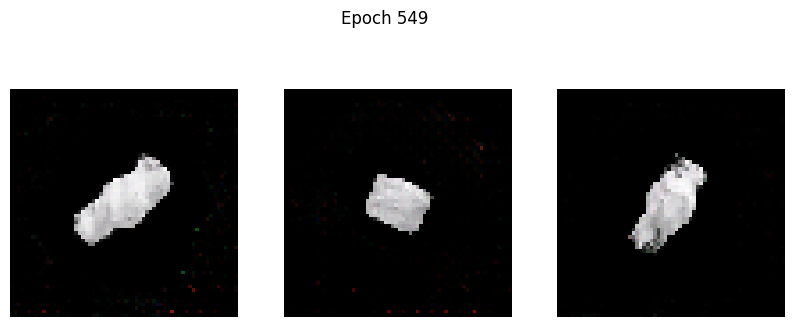

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.1845 - g_loss: 7.8977
Epoch 550/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.1205 - g_loss: 8.5239

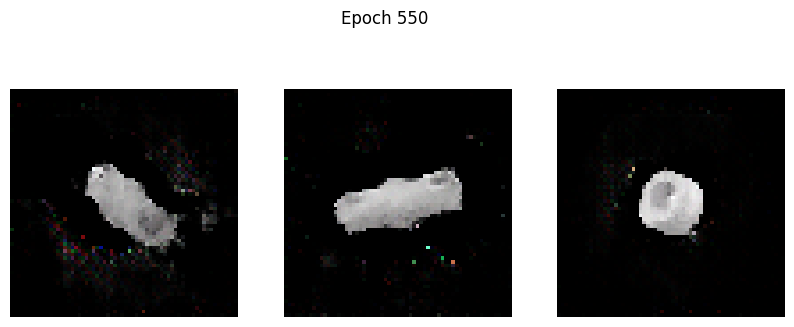

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.1205 - g_loss: 8.5263
Epoch 551/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.2267 - g_loss: 7.8119

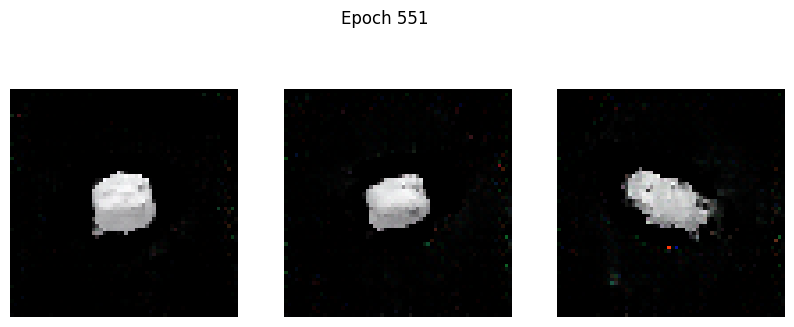

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.2262 - g_loss: 7.8172
Epoch 552/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2131 - g_loss: 8.4100

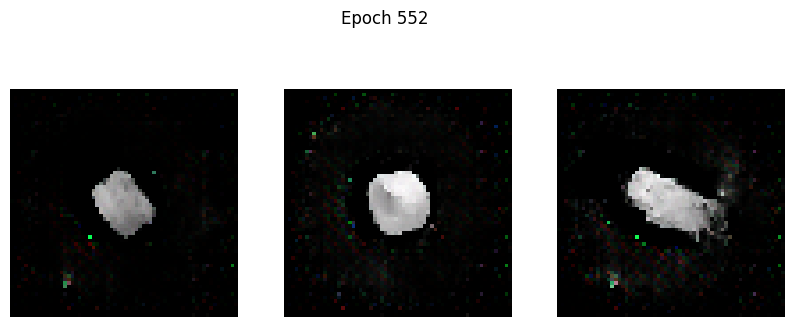

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.2131 - g_loss: 8.4098
Epoch 553/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1336 - g_loss: 8.8494

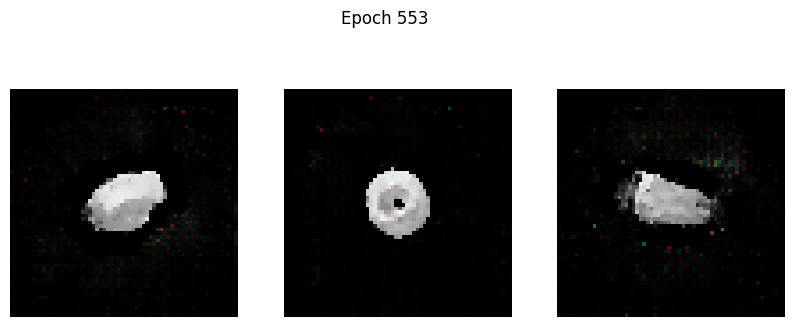

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - d_loss: -0.1340 - g_loss: 8.8491
Epoch 554/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.3555 - g_loss: 7.6027

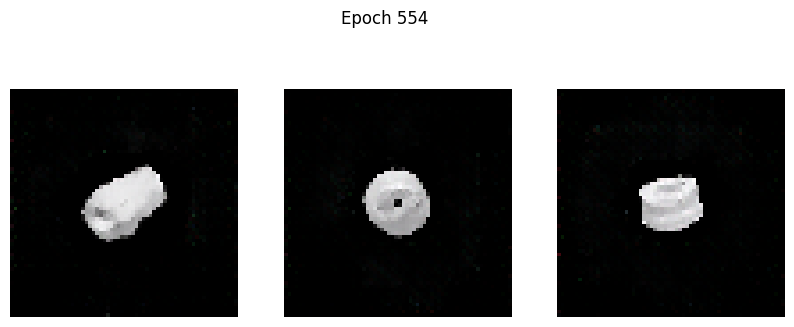

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.3548 - g_loss: 7.6073
Epoch 555/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: -0.2602 - g_loss: 8.5985

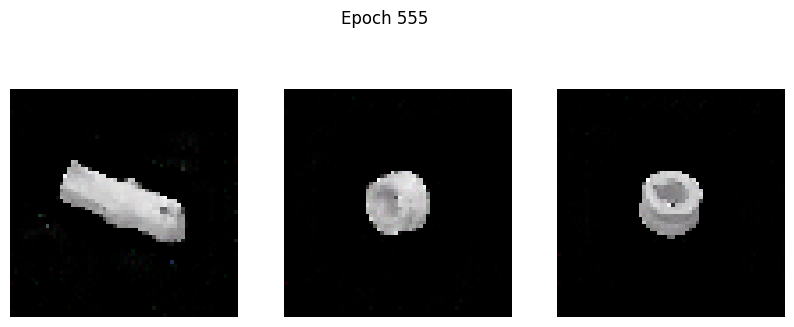

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.2599 - g_loss: 8.6001
Epoch 556/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.1554 - g_loss: 8.6319

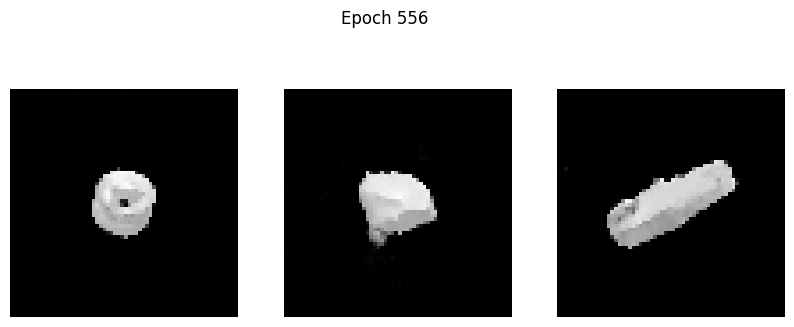

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.1561 - g_loss: 8.6317
Epoch 557/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1933 - g_loss: 8.5713

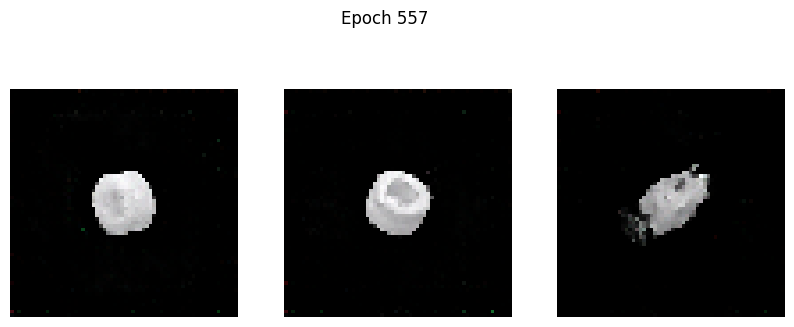

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.1936 - g_loss: 8.5668
Epoch 558/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.2626 - g_loss: 8.1209

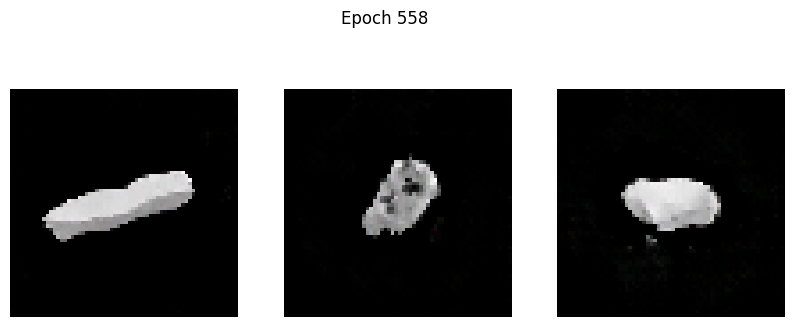

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.2622 - g_loss: 8.1261
Epoch 559/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.2696 - g_loss: 7.9687

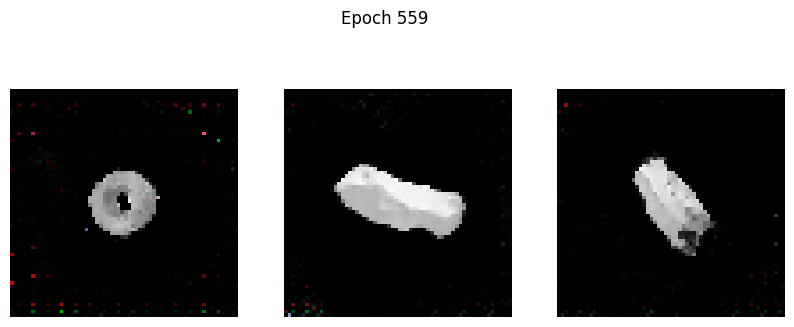

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.2694 - g_loss: 7.9696
Epoch 560/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0072 - g_loss: 10.2836

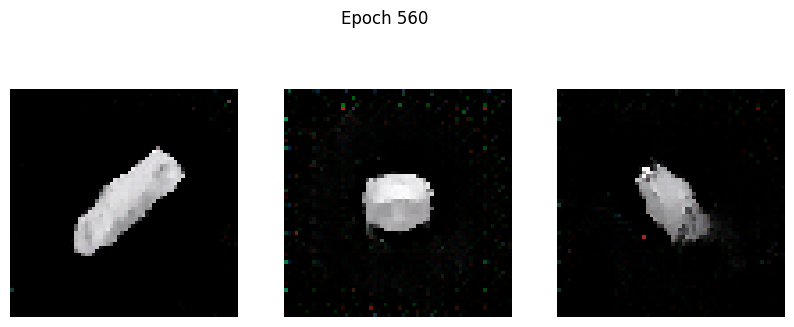

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0079 - g_loss: 10.2760
Epoch 561/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.2468 - g_loss: 8.5867

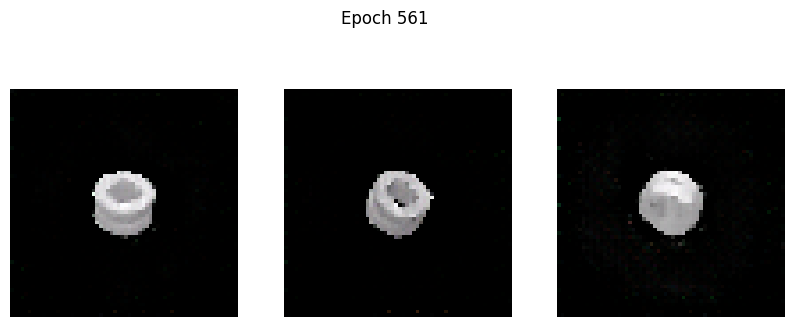

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.2461 - g_loss: 8.5907
Epoch 562/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.3091 - g_loss: 7.5440

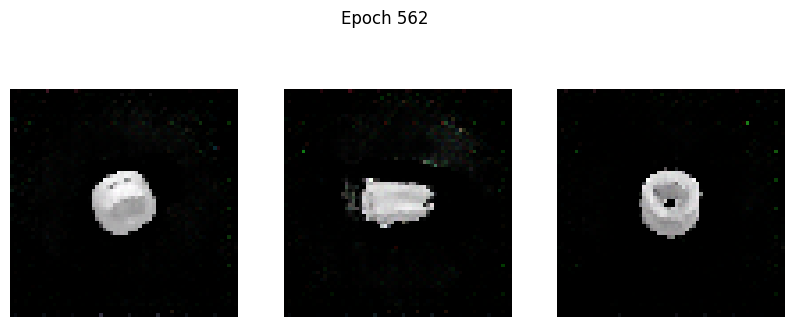

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.3086 - g_loss: 7.5513
Epoch 563/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.3184 - g_loss: 8.1789

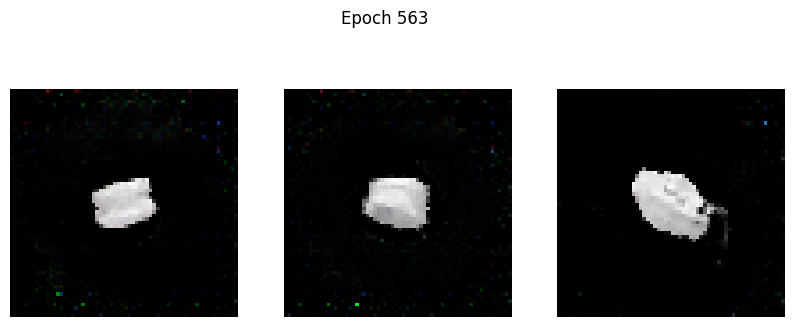

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.3181 - g_loss: 8.1798
Epoch 564/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1851 - g_loss: 9.0336

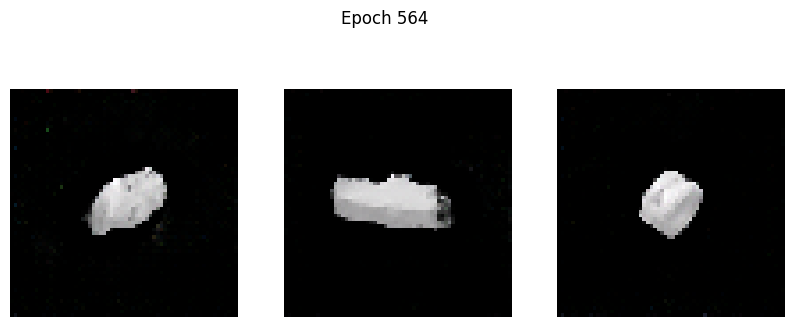

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.1855 - g_loss: 9.0301
Epoch 565/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.2117 - g_loss: 8.7451

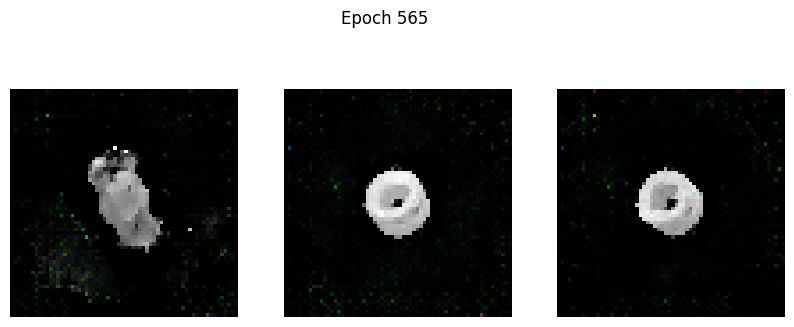

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.2113 - g_loss: 8.7492
Epoch 566/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.3800 - g_loss: 7.5727

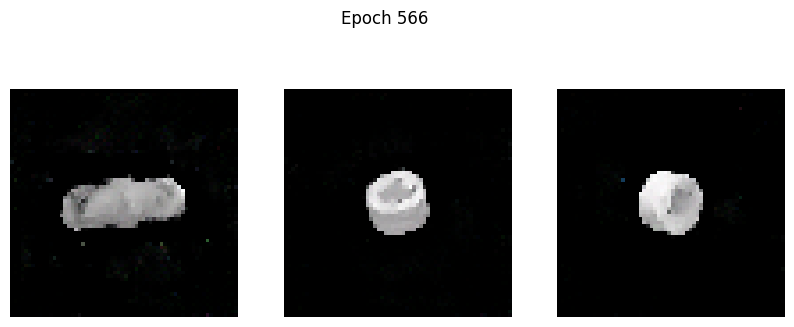

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.3792 - g_loss: 7.5787
Epoch 567/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1078 - g_loss: 9.5642

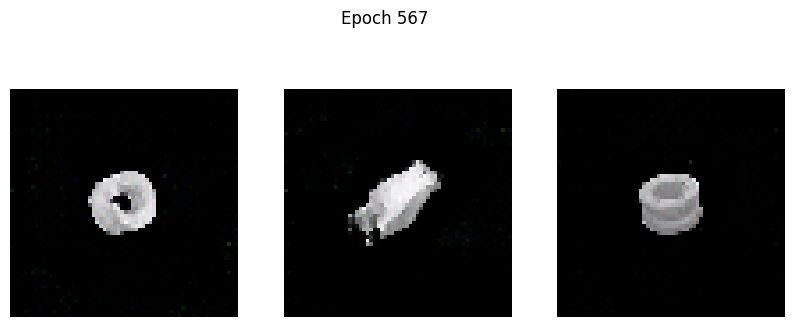

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1089 - g_loss: 9.5582
Epoch 568/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.3380 - g_loss: 8.5617

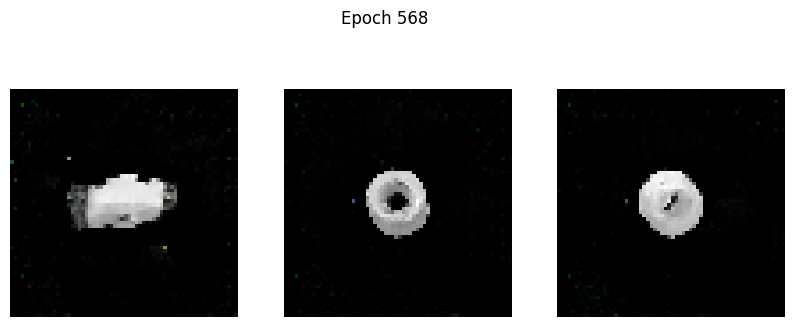

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - d_loss: -0.3375 - g_loss: 8.5633
Epoch 569/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1360 - g_loss: 10.0712

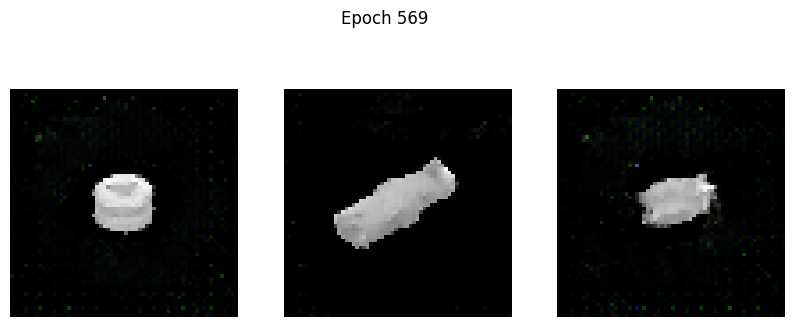

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1372 - g_loss: 10.0607
Epoch 570/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.3036 - g_loss: 8.7980

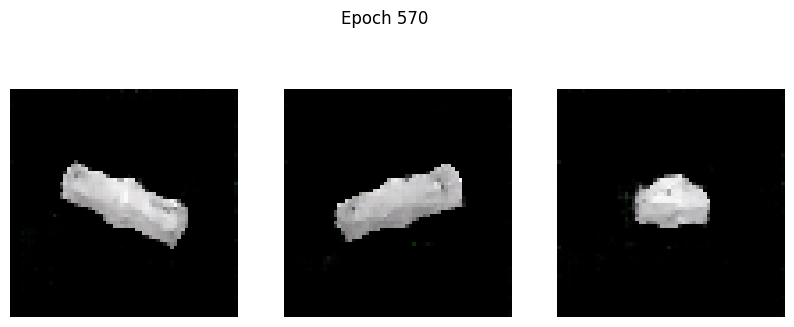

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.3030 - g_loss: 8.8016
Epoch 571/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.3128 - g_loss: 8.9615

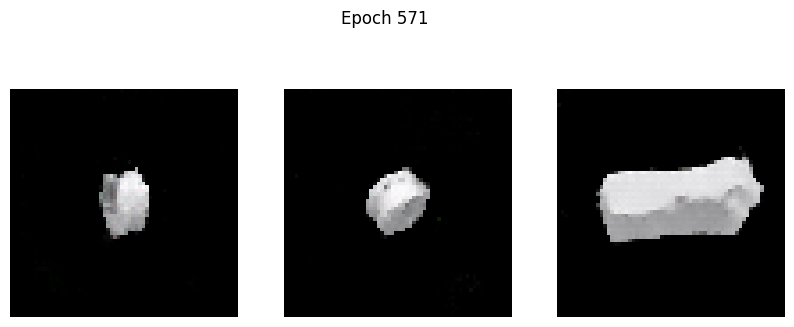

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.3118 - g_loss: 8.9680
Epoch 572/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.2151 - g_loss: 8.9767

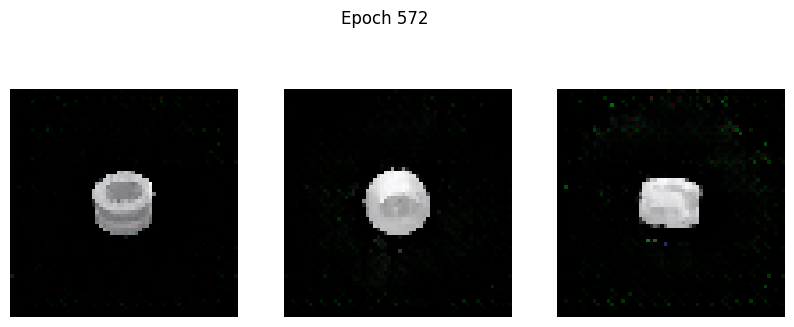

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.2155 - g_loss: 8.9737
Epoch 573/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.2829 - g_loss: 9.0111

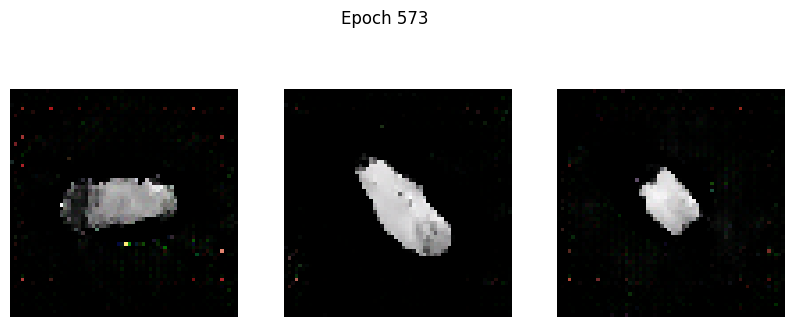

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.2829 - g_loss: 9.0102
Epoch 574/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.3211 - g_loss: 8.9014

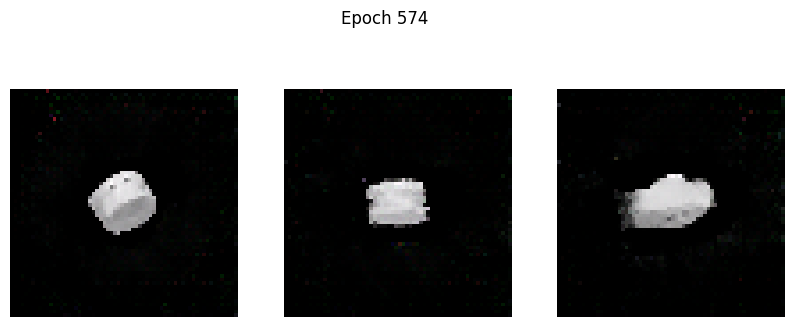

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.3207 - g_loss: 8.9020
Epoch 575/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4415 - g_loss: 8.6681

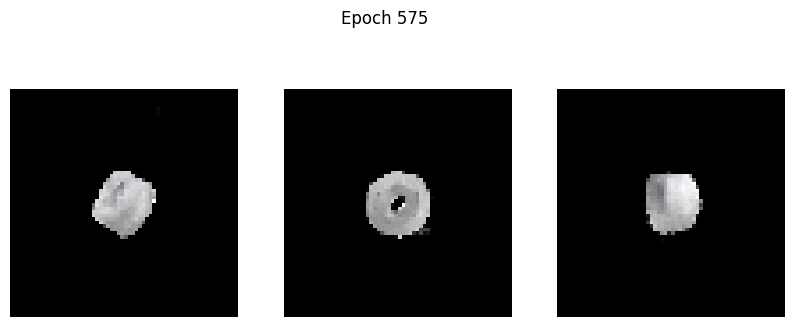

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4408 - g_loss: 8.6717
Epoch 576/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.4153 - g_loss: 8.5681

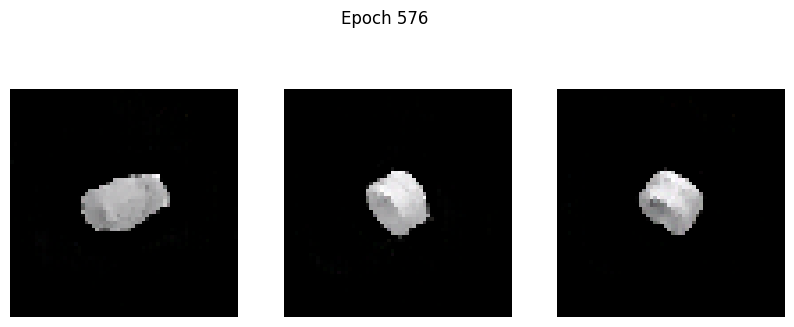

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.4146 - g_loss: 8.5726
Epoch 577/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.4066 - g_loss: 7.9217

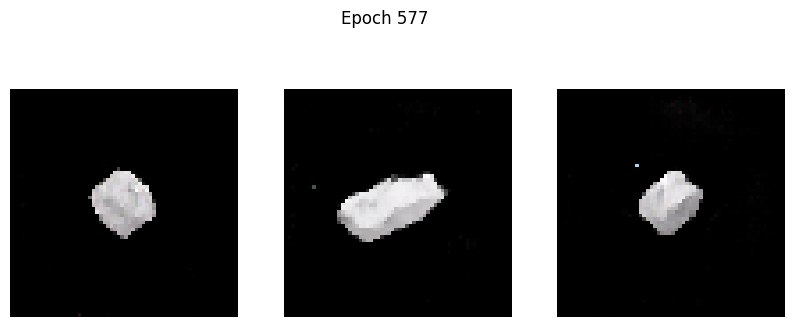

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.4062 - g_loss: 7.9259
Epoch 578/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2804 - g_loss: 9.1478

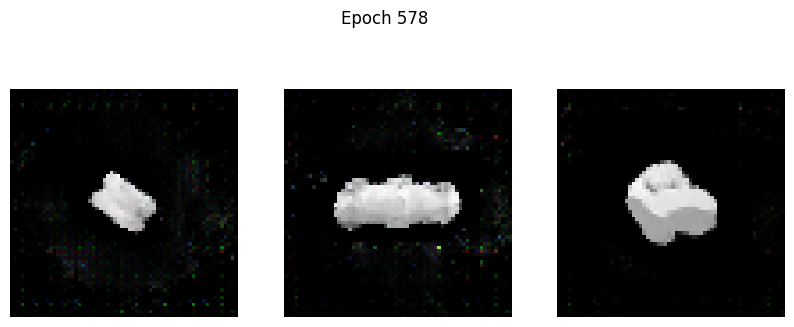

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.2801 - g_loss: 9.1501
Epoch 579/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2474 - g_loss: 9.1525

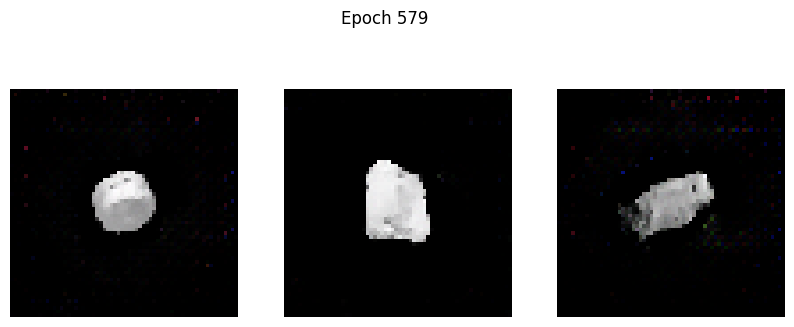

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.2475 - g_loss: 9.1548
Epoch 580/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.2556 - g_loss: 10.0233

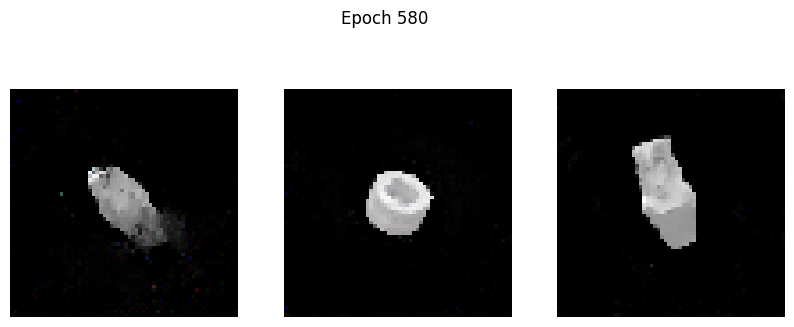

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.2560 - g_loss: 10.0207
Epoch 581/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.2798 - g_loss: 9.9556

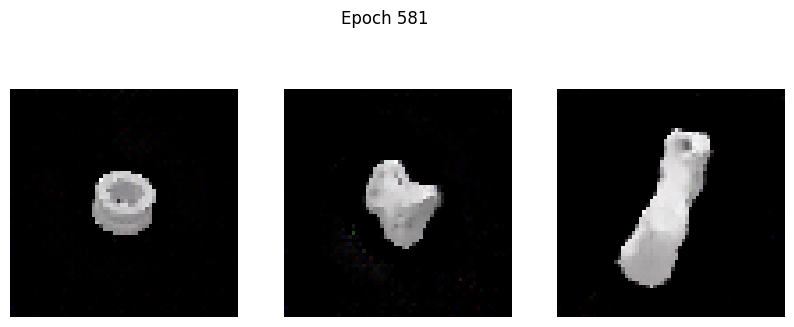

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.2807 - g_loss: 9.9452
Epoch 582/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.3330 - g_loss: 9.9509

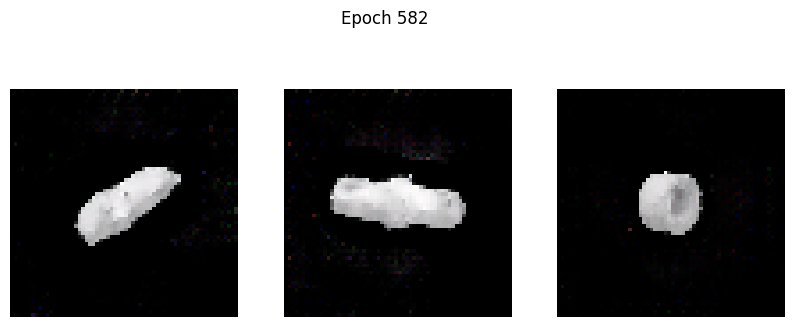

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.3325 - g_loss: 9.9516
Epoch 583/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2589 - g_loss: 9.3116

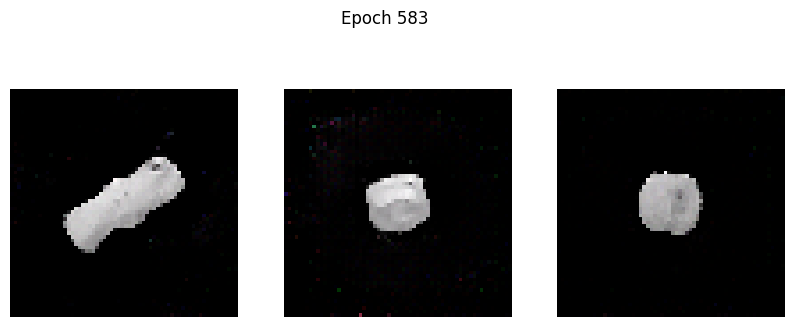

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.2591 - g_loss: 9.3134
Epoch 584/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4166 - g_loss: 9.2019

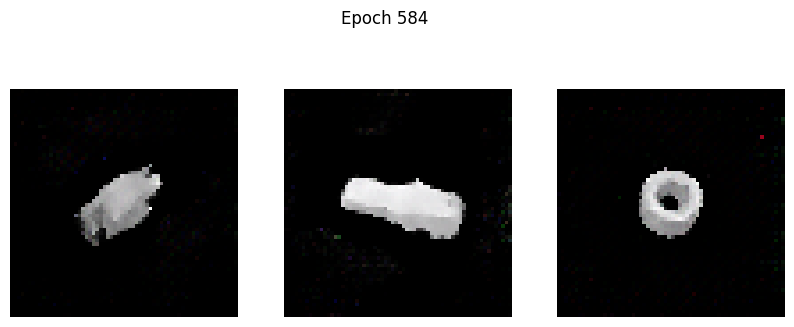

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4160 - g_loss: 9.2056
Epoch 585/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.3956 - g_loss: 9.2579

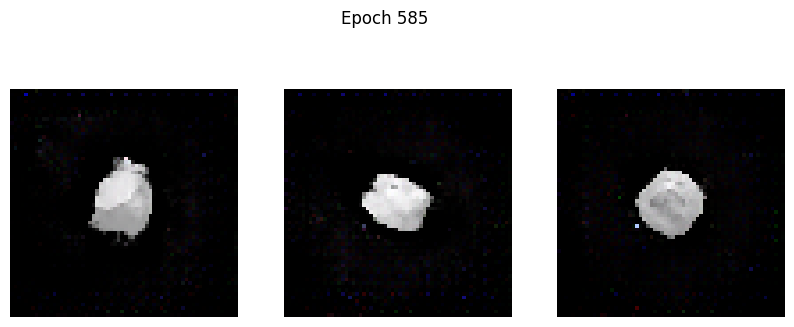

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.3951 - g_loss: 9.2600
Epoch 586/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4144 - g_loss: 8.6818

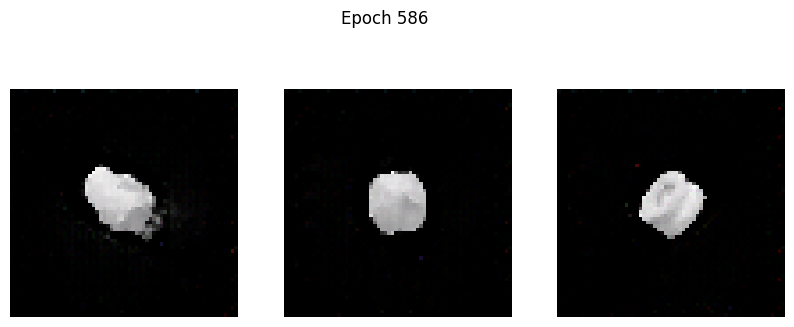

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4141 - g_loss: 8.6897
Epoch 587/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.3497 - g_loss: 9.6872

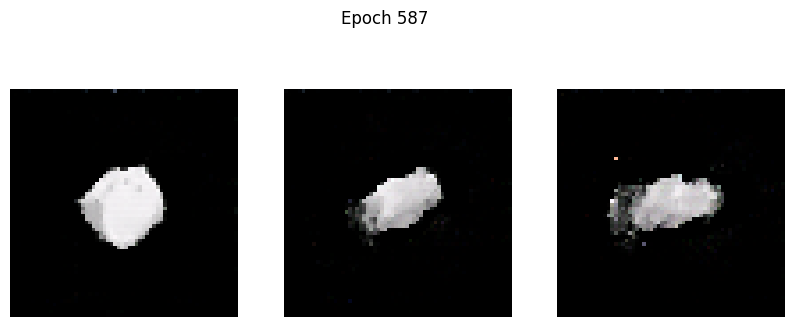

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.3497 - g_loss: 9.6878
Epoch 588/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.3462 - g_loss: 9.8543

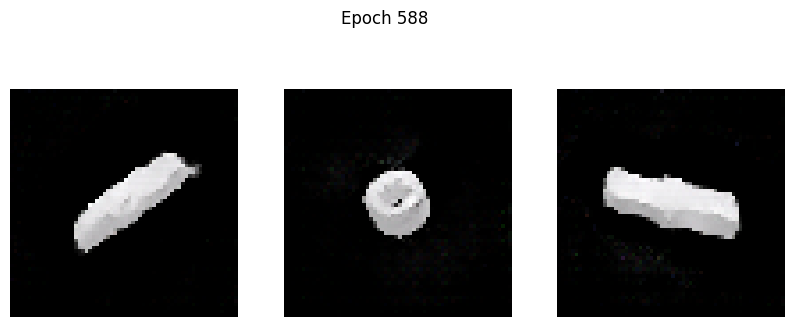

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.3456 - g_loss: 9.8626
Epoch 589/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.2843 - g_loss: 10.4326

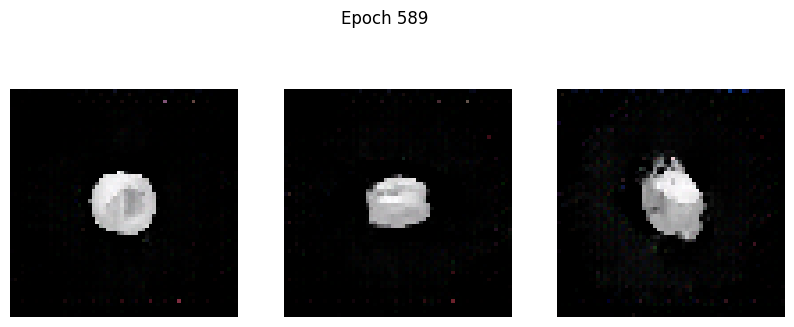

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - d_loss: -0.2848 - g_loss: 10.4231
Epoch 590/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1903 - g_loss: 11.5099

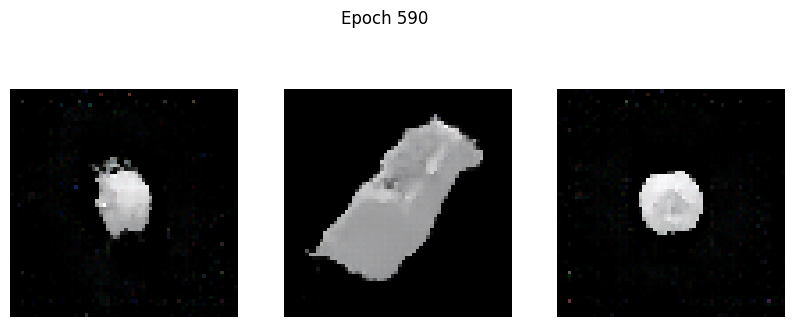

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1913 - g_loss: 11.4957
Epoch 591/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: -0.3478 - g_loss: 9.1588

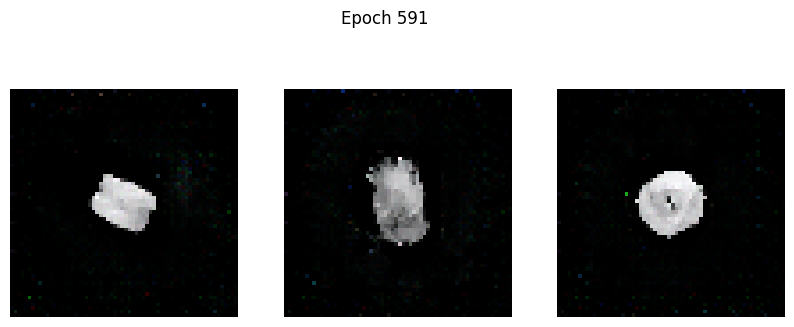

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.3483 - g_loss: 9.1608
Epoch 592/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.4100 - g_loss: 8.8048

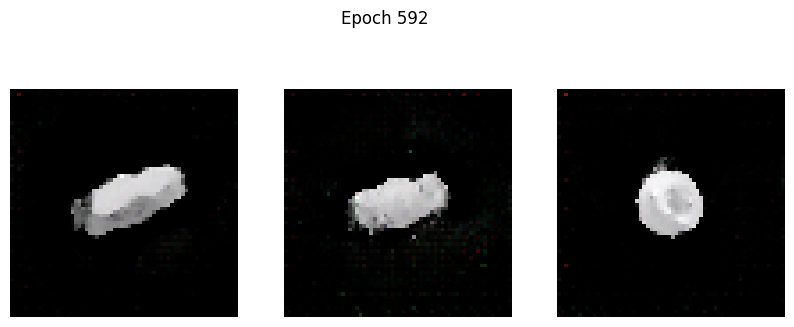

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.4100 - g_loss: 8.8067
Epoch 593/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.4356 - g_loss: 9.3583

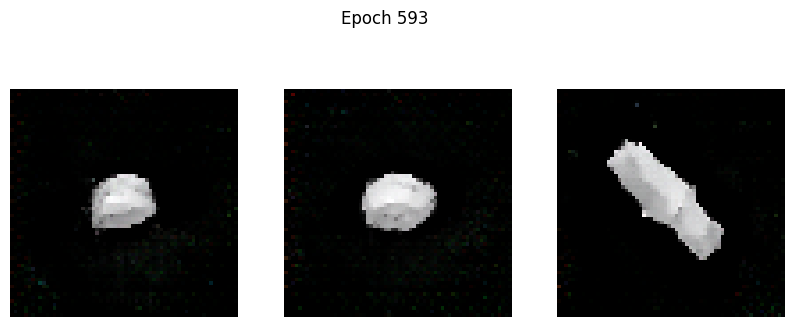

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.4346 - g_loss: 9.3606
Epoch 594/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.3538 - g_loss: 9.9190

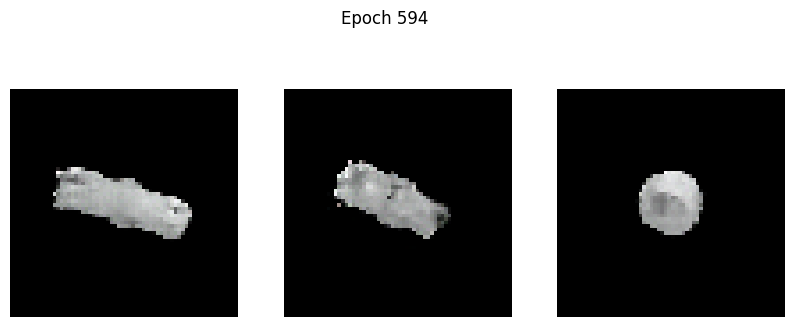

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.3526 - g_loss: 9.9336
Epoch 595/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.6241 - g_loss: 9.0549

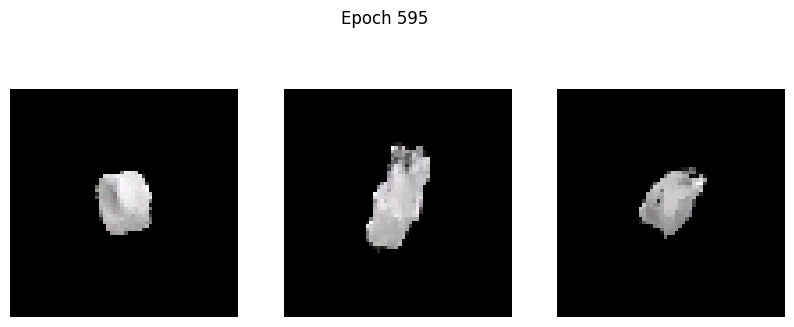

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.6234 - g_loss: 9.0542
Epoch 596/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.3894 - g_loss: 8.9874

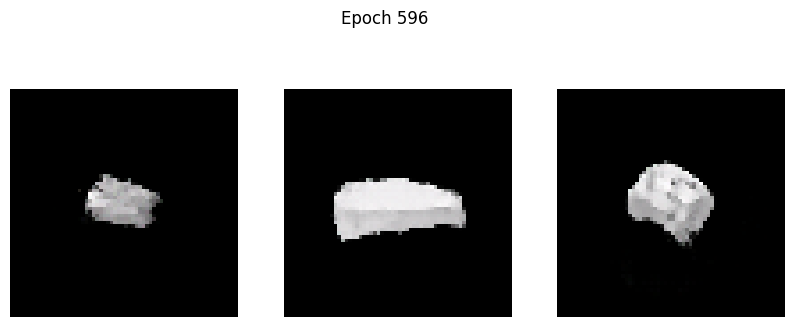

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.3893 - g_loss: 8.9890
Epoch 597/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4862 - g_loss: 9.2453

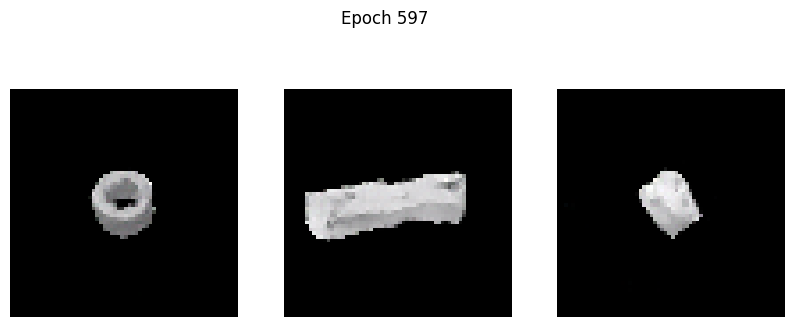

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4859 - g_loss: 9.2475
Epoch 598/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.3887 - g_loss: 9.9210

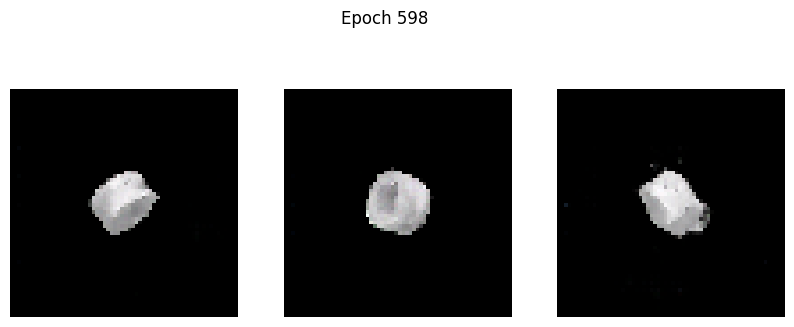

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.3887 - g_loss: 9.9214
Epoch 599/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.3081 - g_loss: 10.4023

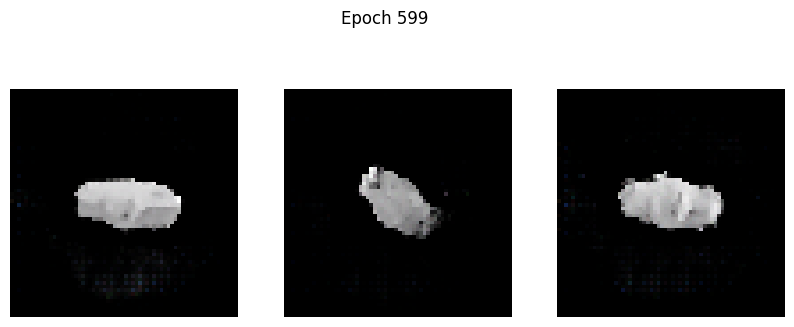

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.3089 - g_loss: 10.3927
Epoch 600/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4139 - g_loss: 9.6094

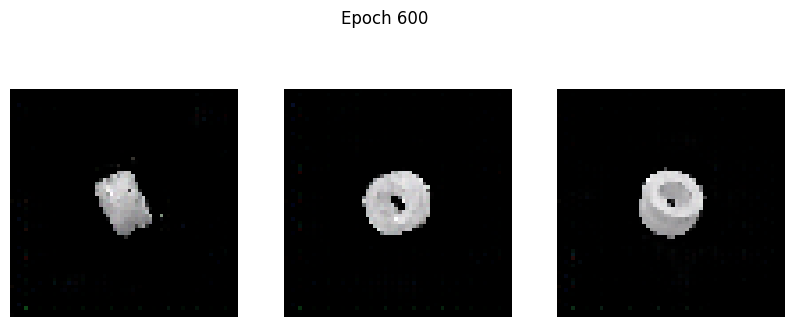

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4134 - g_loss: 9.6139
Epoch 601/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.3932 - g_loss: 10.3217

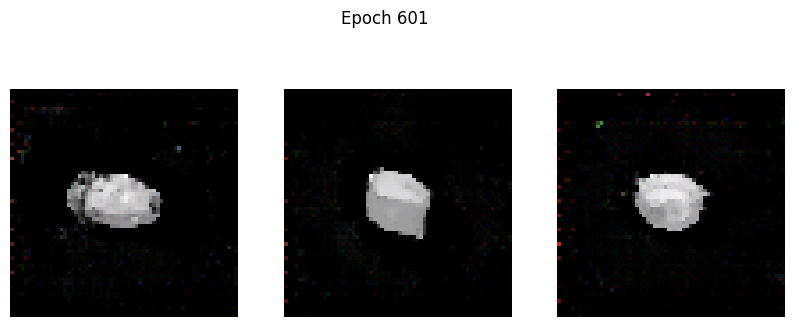

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.3930 - g_loss: 10.3227
Epoch 602/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.3163 - g_loss: 10.4848

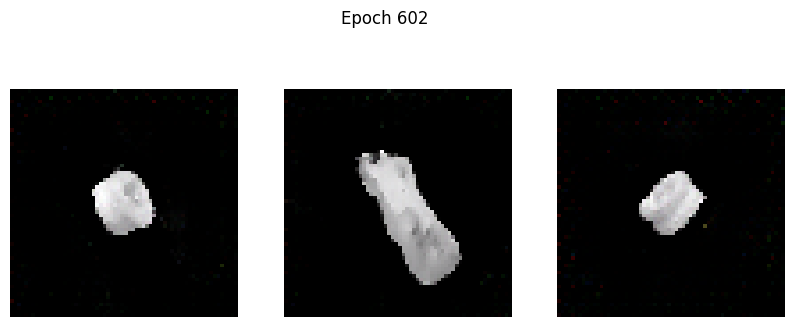

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.3168 - g_loss: 10.4846
Epoch 603/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.4710 - g_loss: 9.9052

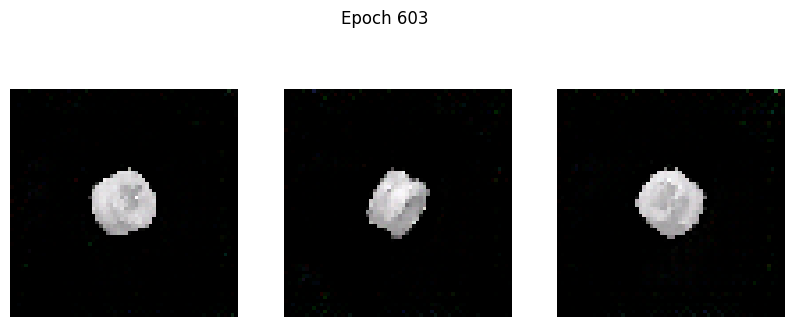

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.4707 - g_loss: 9.9095
Epoch 604/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1739 - g_loss: 10.8261

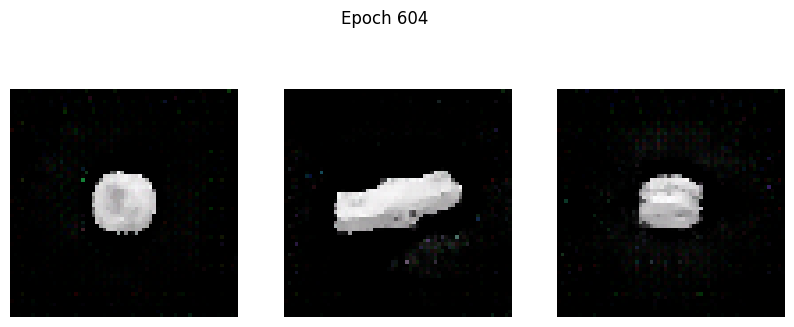

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1756 - g_loss: 10.8219
Epoch 605/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4095 - g_loss: 11.1142

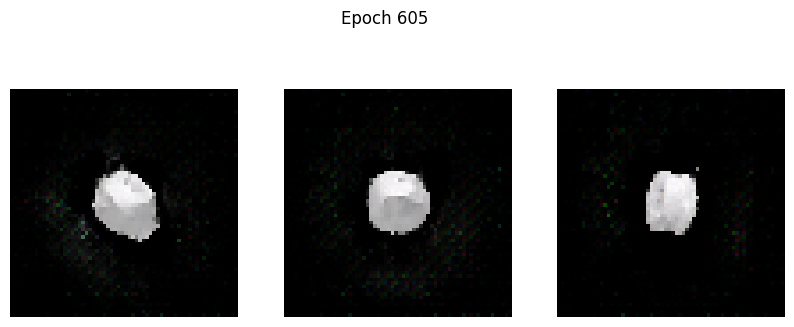

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4095 - g_loss: 11.1103
Epoch 606/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.5030 - g_loss: 9.4055

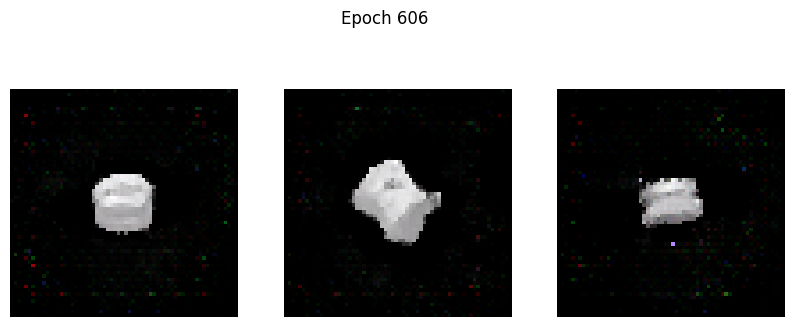

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.5020 - g_loss: 9.4163
Epoch 607/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4125 - g_loss: 10.5312

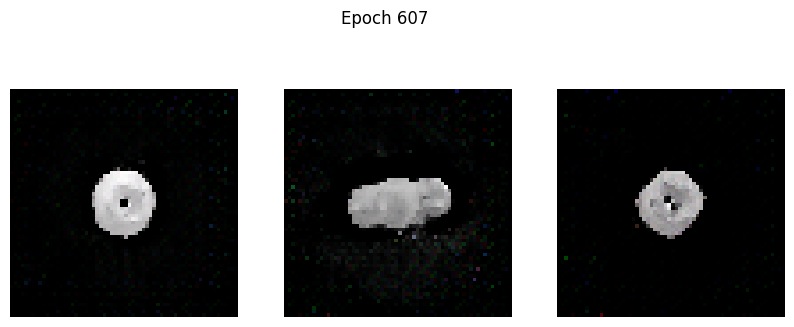

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4115 - g_loss: 10.5344
Epoch 608/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4698 - g_loss: 10.2349

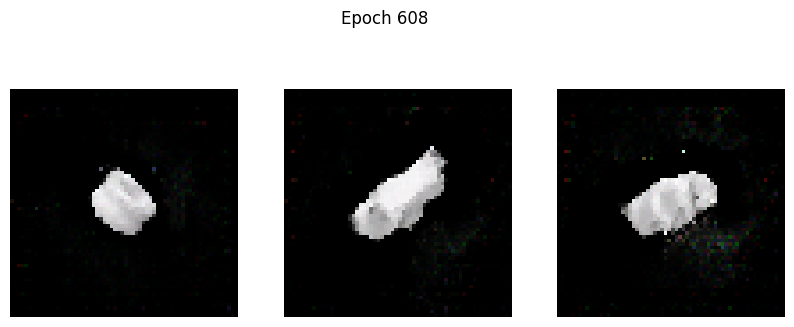

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4702 - g_loss: 10.2328
Epoch 609/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.3017 - g_loss: 12.0726

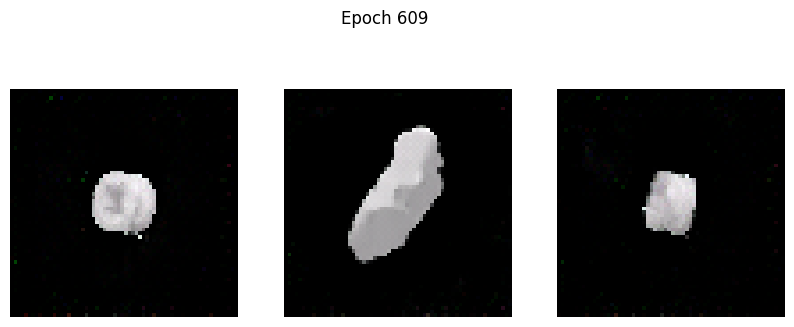

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.3030 - g_loss: 12.0577
Epoch 610/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4859 - g_loss: 10.1293

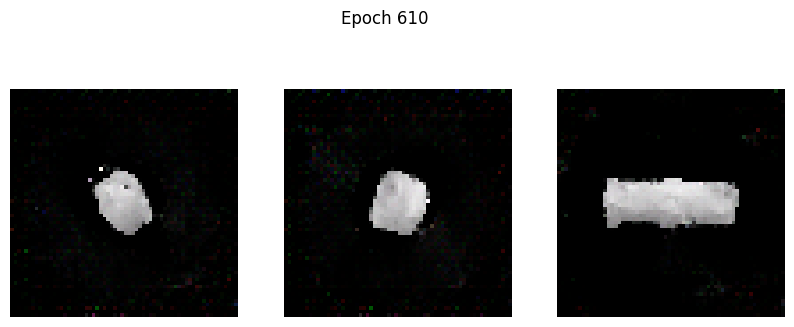

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4860 - g_loss: 10.1326
Epoch 611/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.4267 - g_loss: 10.7197

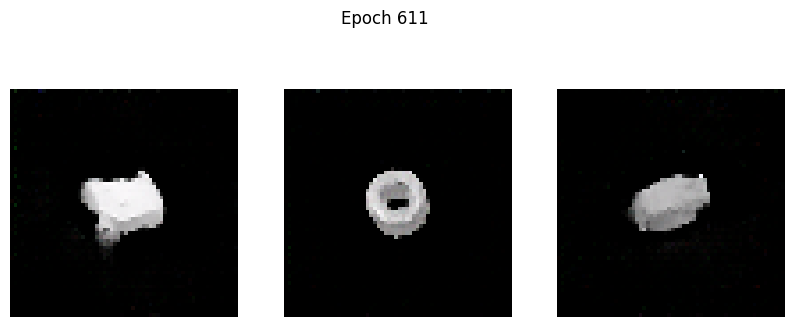

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - d_loss: -0.4269 - g_loss: 10.7178
Epoch 612/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.5034 - g_loss: 10.2592

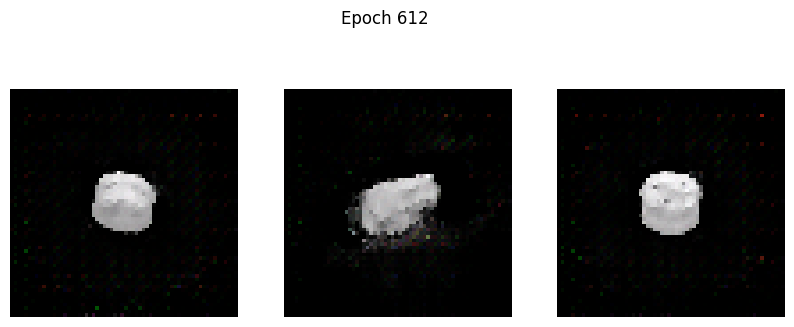

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.5036 - g_loss: 10.2589
Epoch 613/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.3503 - g_loss: 13.4212

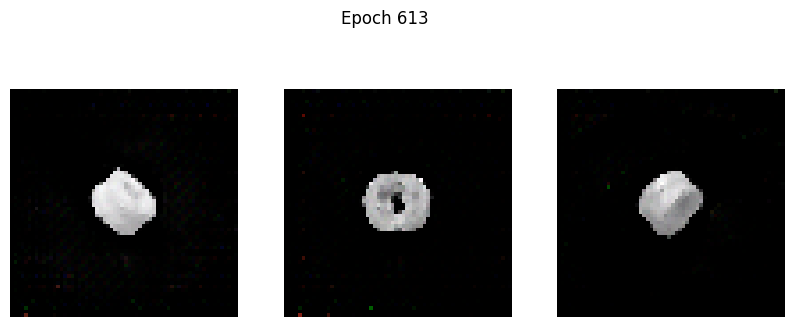

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.3510 - g_loss: 13.4081
Epoch 614/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.6377 - g_loss: 10.2181

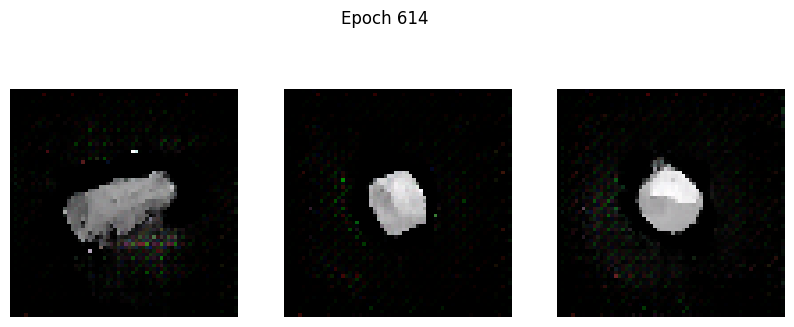

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.6368 - g_loss: 10.2225
Epoch 615/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.4106 - g_loss: 11.1863

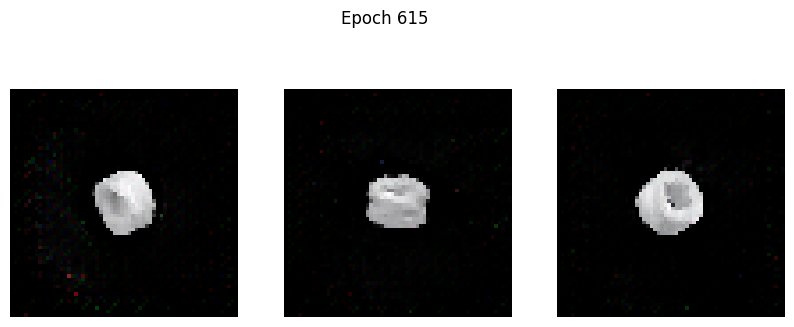

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.4104 - g_loss: 11.1871
Epoch 616/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.6442 - g_loss: 10.6196

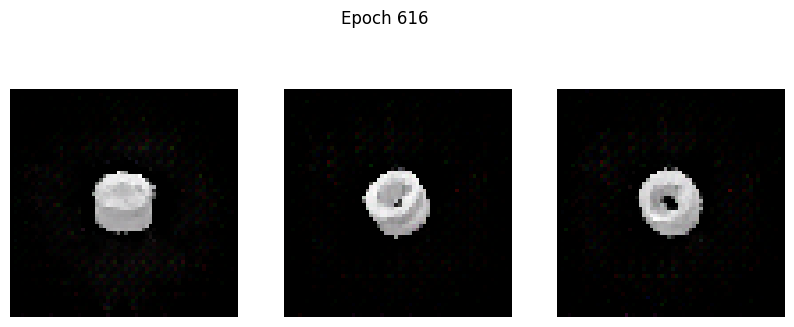

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.6432 - g_loss: 10.6267
Epoch 617/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.4955 - g_loss: 10.2201

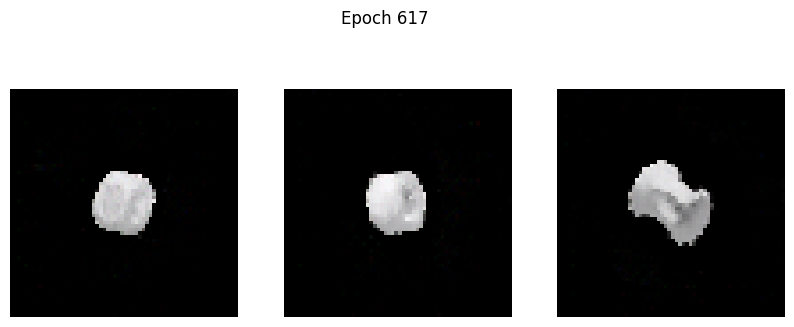

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.4961 - g_loss: 10.2199
Epoch 618/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4536 - g_loss: 12.2175

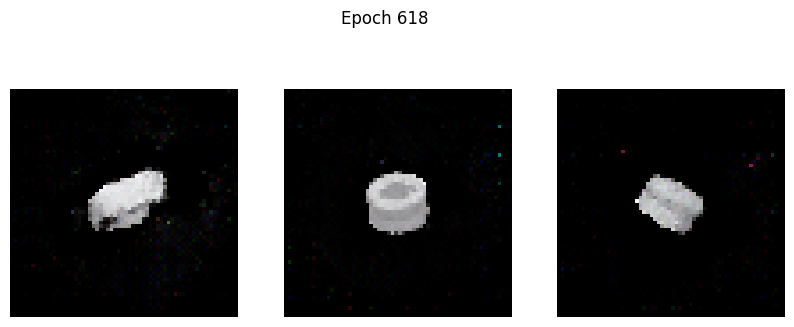

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4528 - g_loss: 12.2219
Epoch 619/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.6002 - g_loss: 11.6441

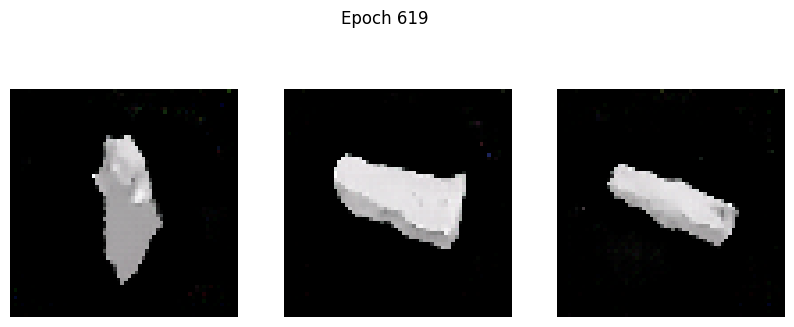

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.5992 - g_loss: 11.6446
Epoch 620/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.5292 - g_loss: 10.4892

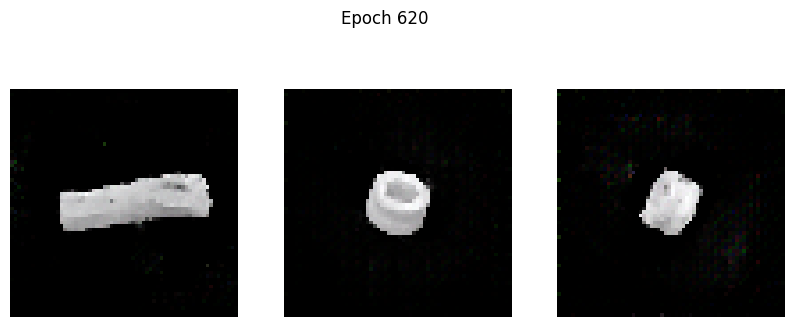

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.5290 - g_loss: 10.4948
Epoch 621/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4913 - g_loss: 11.7368

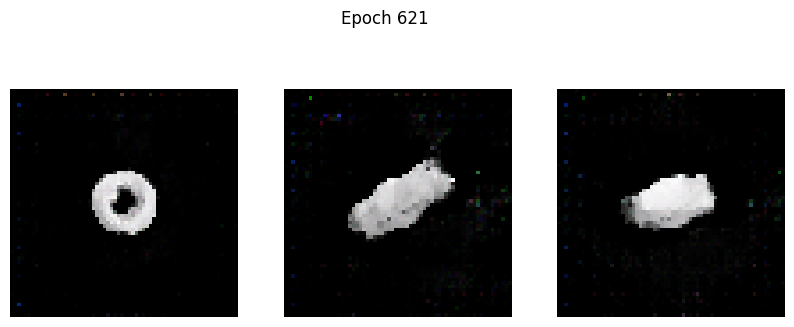

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4906 - g_loss: 11.7403
Epoch 622/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.6280 - g_loss: 10.8009

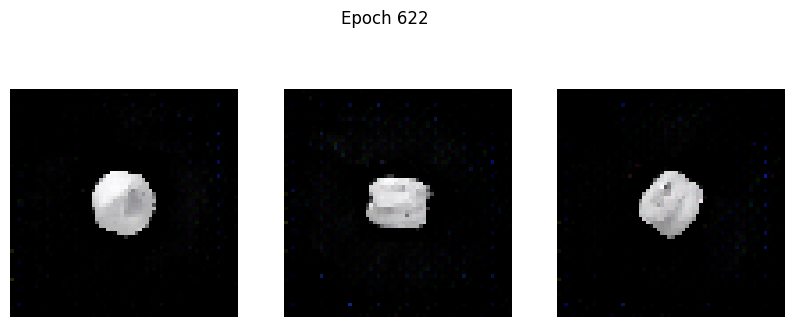

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.6271 - g_loss: 10.8079
Epoch 623/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.3657 - g_loss: 12.9020

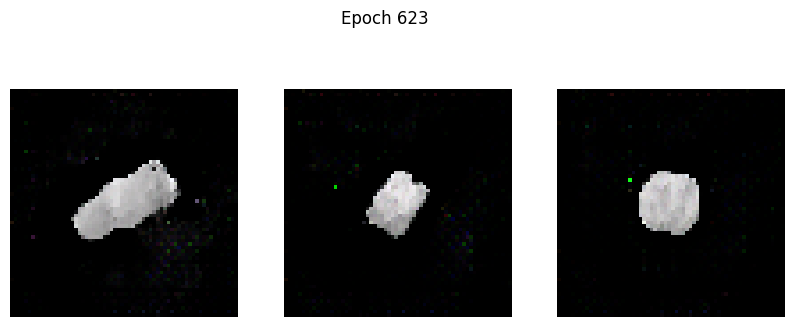

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.3670 - g_loss: 12.8858
Epoch 624/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.3969 - g_loss: 11.8894

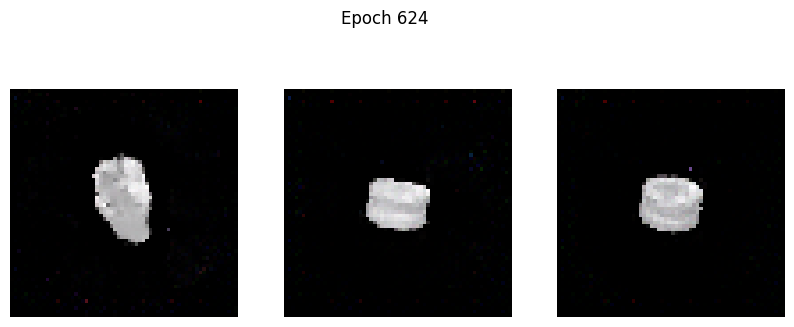

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.3969 - g_loss: 11.8931
Epoch 625/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2343 - g_loss: 13.2610

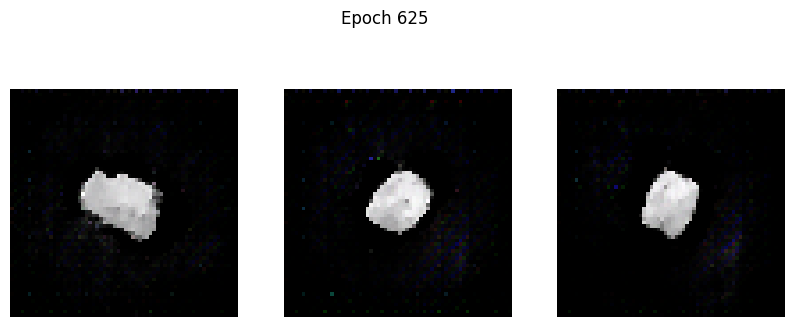

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.2353 - g_loss: 13.2617
Epoch 626/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.5208 - g_loss: 12.0653

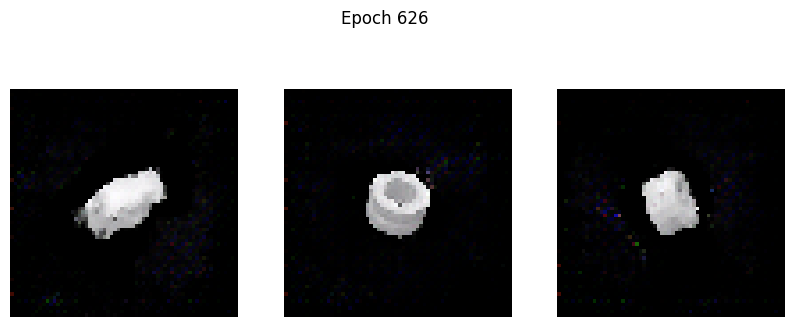

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.5204 - g_loss: 12.0658
Epoch 627/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4656 - g_loss: 11.4746

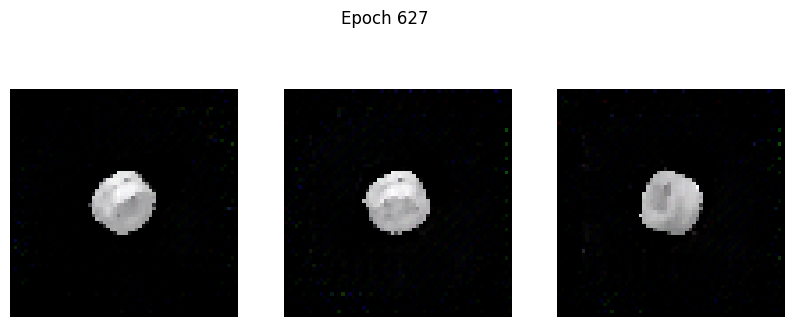

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4663 - g_loss: 11.4736
Epoch 628/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.3692 - g_loss: 12.3092

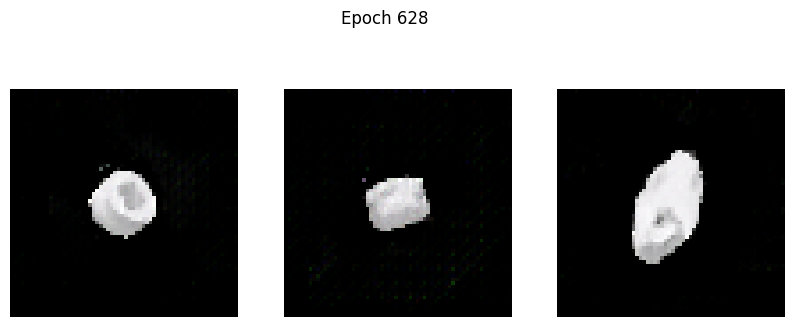

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.3686 - g_loss: 12.3153
Epoch 629/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4586 - g_loss: 11.5335

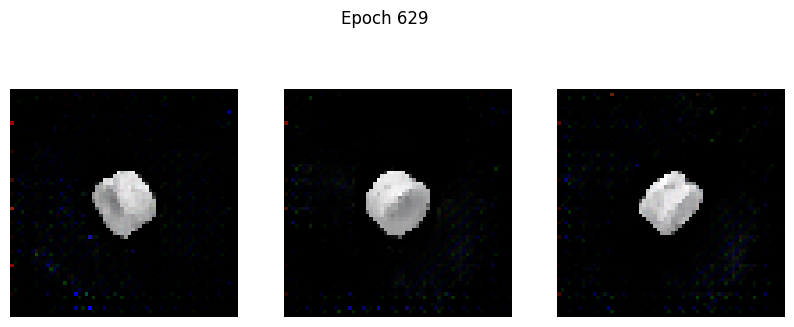

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4592 - g_loss: 11.5355
Epoch 630/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.6408 - g_loss: 11.4358

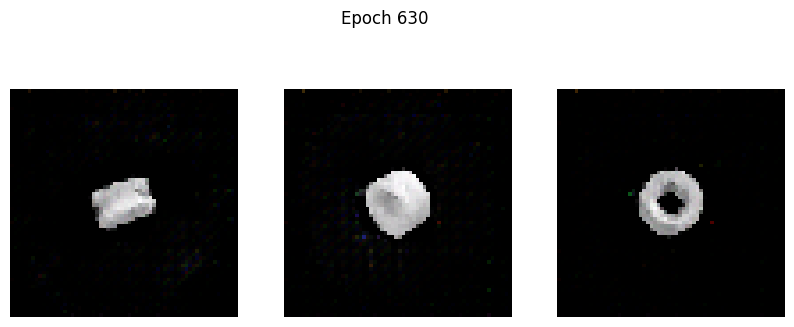

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.6401 - g_loss: 11.4385
Epoch 631/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.5250 - g_loss: 12.0904

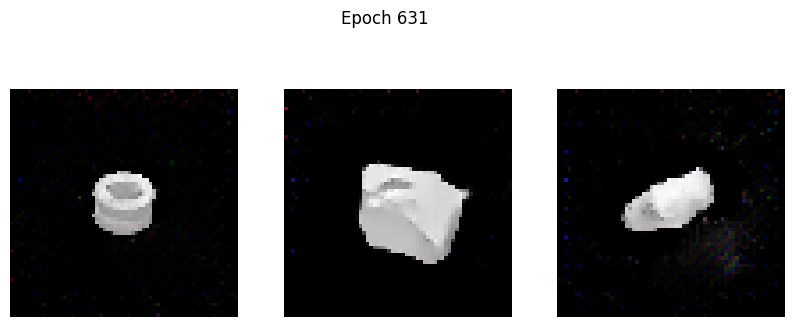

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.5258 - g_loss: 12.0899
Epoch 632/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.7597 - g_loss: 11.3780

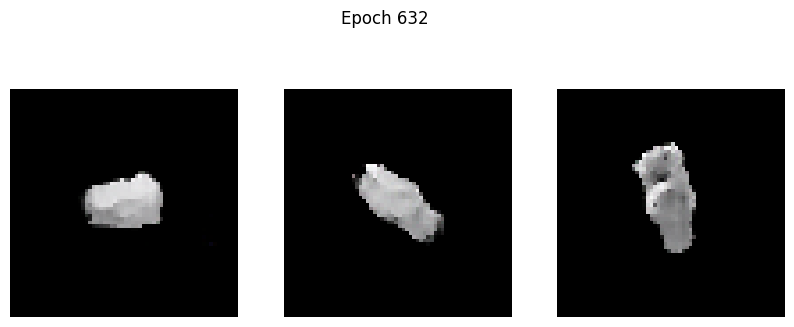

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.7595 - g_loss: 11.4021
Epoch 633/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.8667 - g_loss: 12.0557

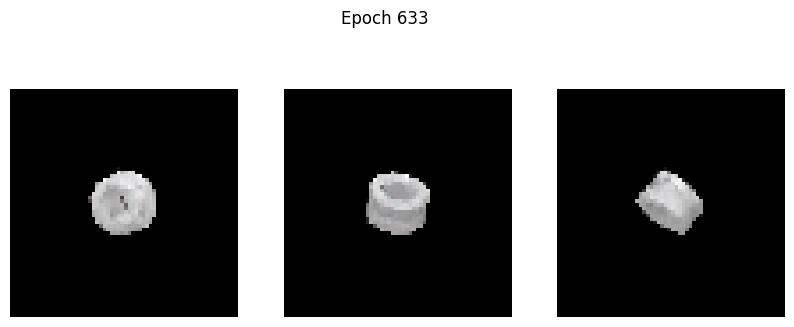

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.8664 - g_loss: 12.0540
Epoch 634/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.7488 - g_loss: 11.7679

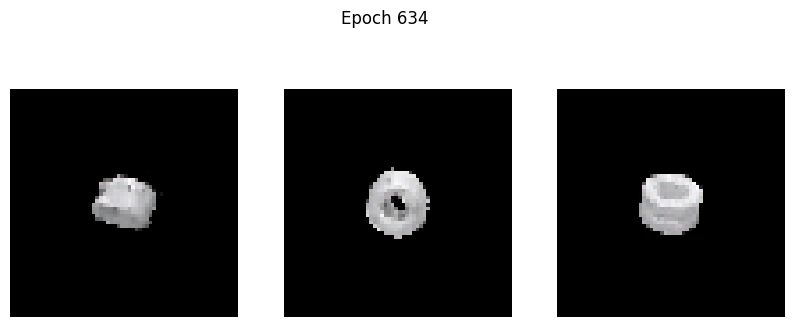

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.7483 - g_loss: 11.7724
Epoch 635/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.5384 - g_loss: 13.5771

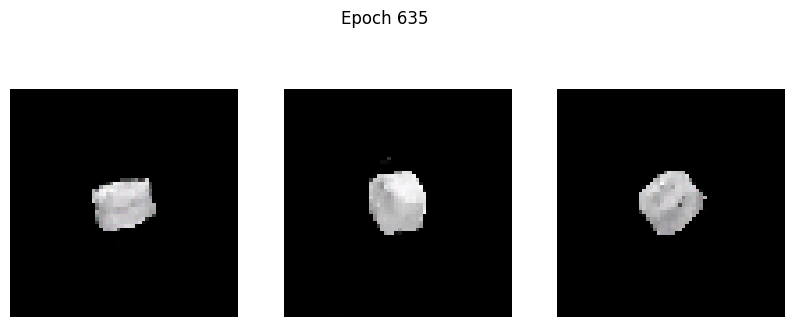

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.5390 - g_loss: 13.5763
Epoch 636/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.5721 - g_loss: 13.4288

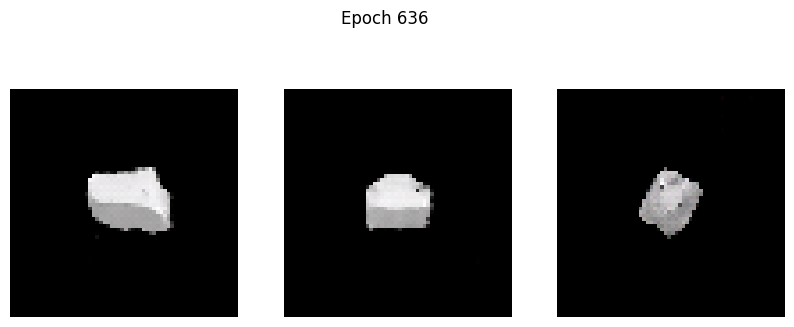

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.5723 - g_loss: 13.4245
Epoch 637/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.8257 - g_loss: 11.6437

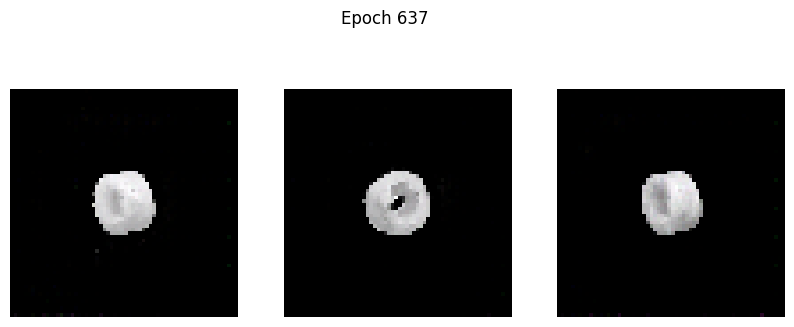

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.8255 - g_loss: 11.6453
Epoch 638/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4665 - g_loss: 14.2607

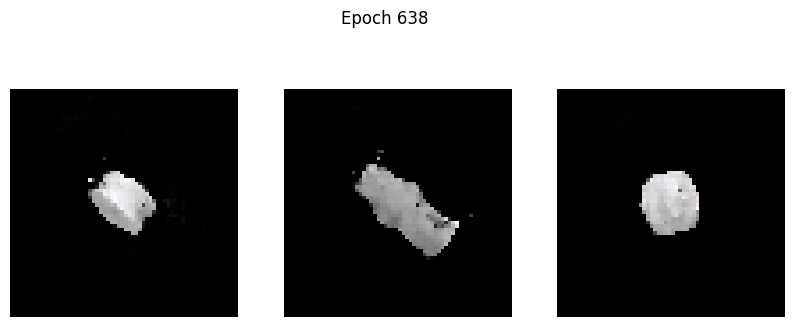

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4677 - g_loss: 14.2525
Epoch 639/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4129 - g_loss: 14.7357

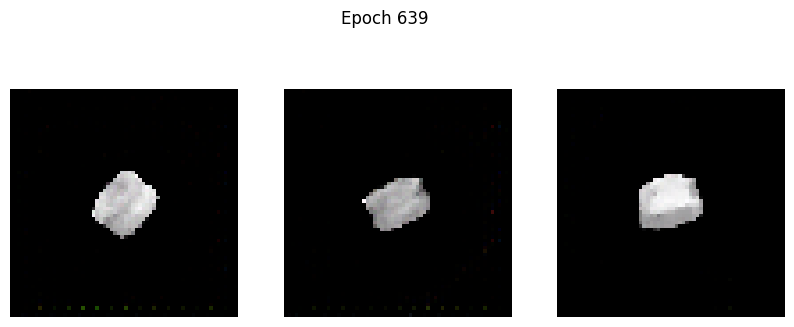

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4137 - g_loss: 14.7160
Epoch 640/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.6975 - g_loss: 12.2556

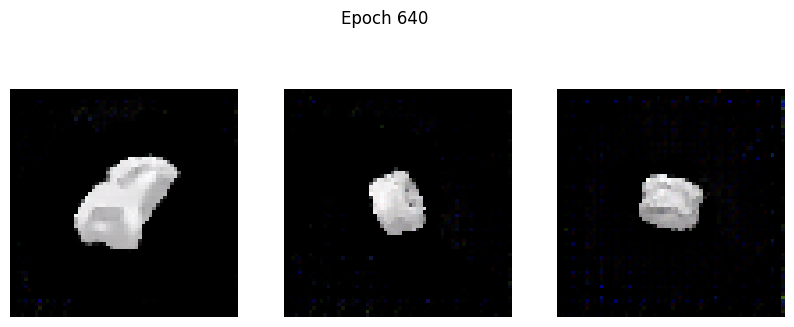

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.6974 - g_loss: 12.2570
Epoch 641/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.8249 - g_loss: 14.7671

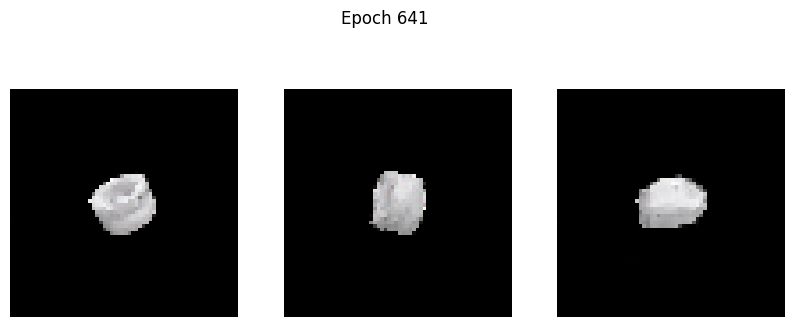

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.8234 - g_loss: 14.7607
Epoch 642/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.8938 - g_loss: 11.7115

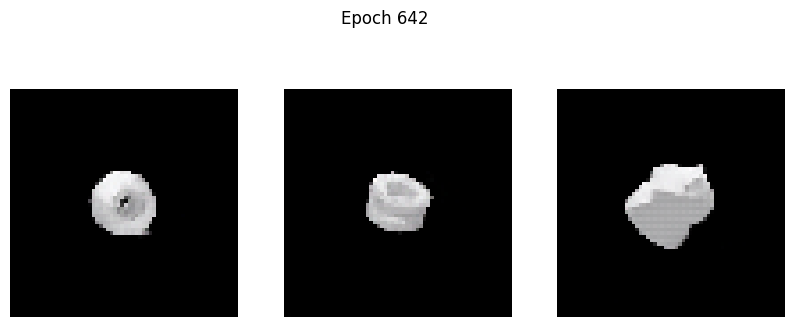

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.8936 - g_loss: 11.7095
Epoch 643/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.6454 - g_loss: 13.3487

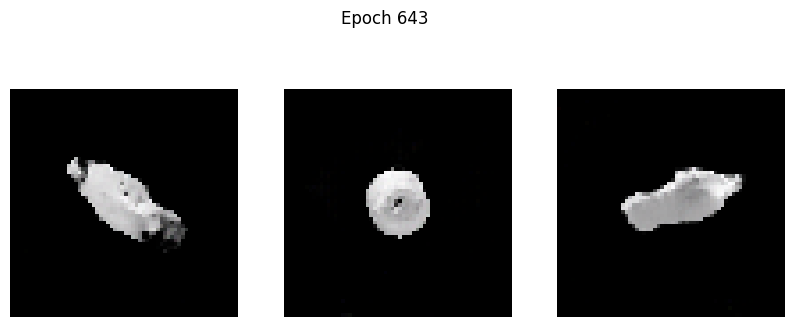

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.6451 - g_loss: 13.3449
Epoch 644/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4635 - g_loss: 14.8979

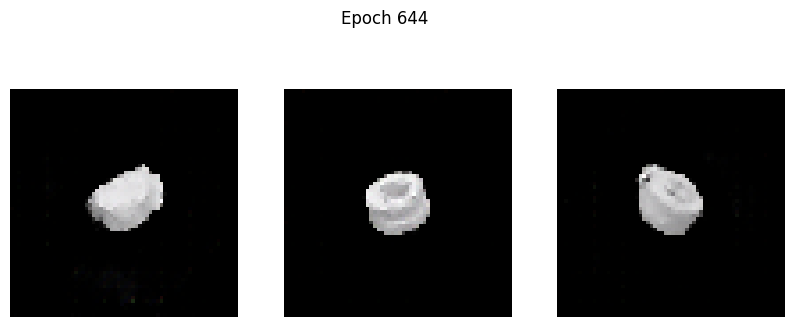

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.4641 - g_loss: 14.8922
Epoch 645/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.5025 - g_loss: 13.7893

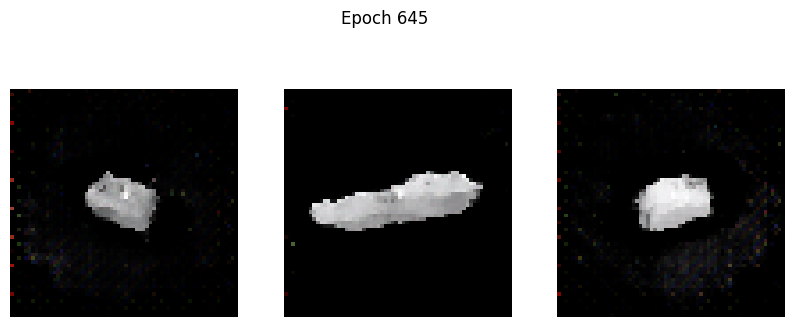

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.5012 - g_loss: 13.7946
Epoch 646/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.7570 - g_loss: 12.6080

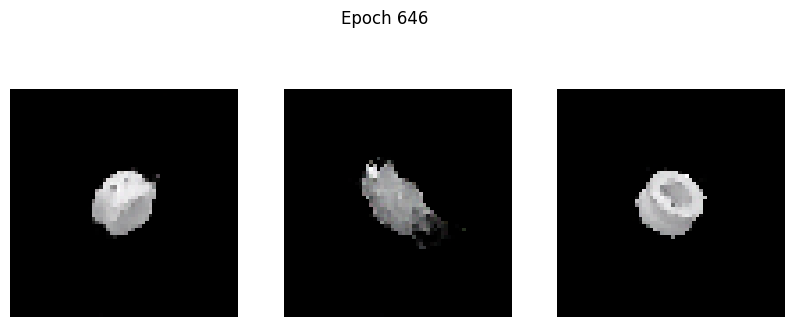

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.7579 - g_loss: 12.6031
Epoch 647/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.7119 - g_loss: 13.9025

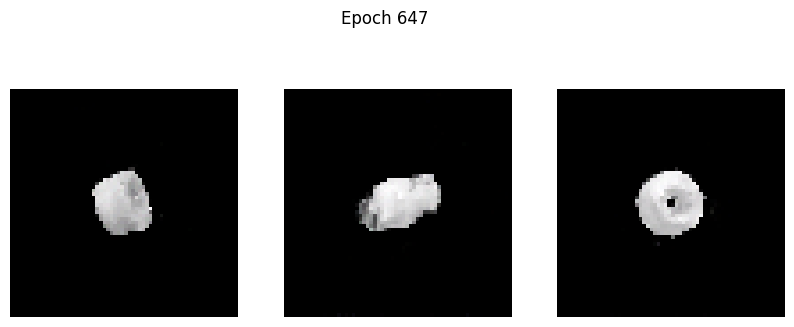

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.7122 - g_loss: 13.8949
Epoch 648/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.9393 - g_loss: 12.3370

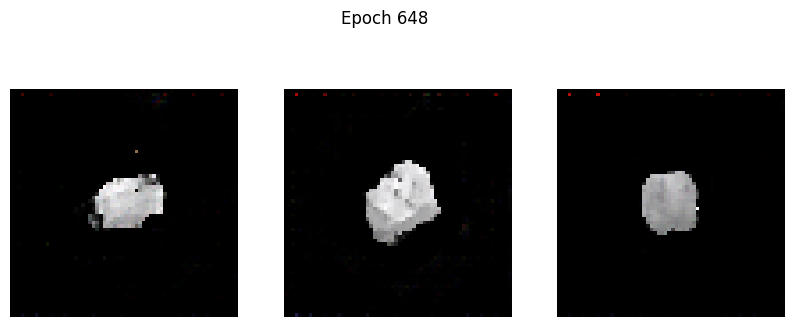

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.9382 - g_loss: 12.3364
Epoch 649/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.4716 - g_loss: 14.5649

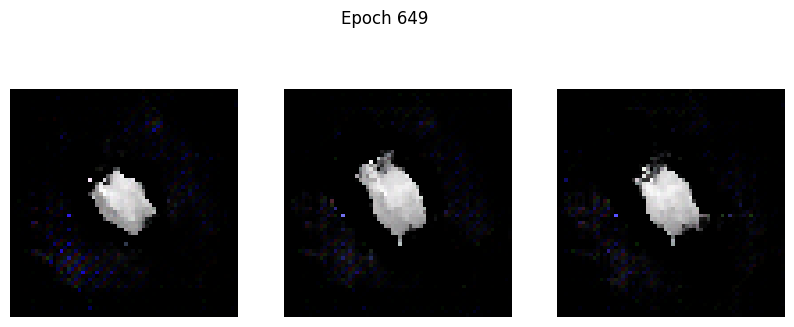

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.4719 - g_loss: 14.5666
Epoch 650/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.5580 - g_loss: 13.4440

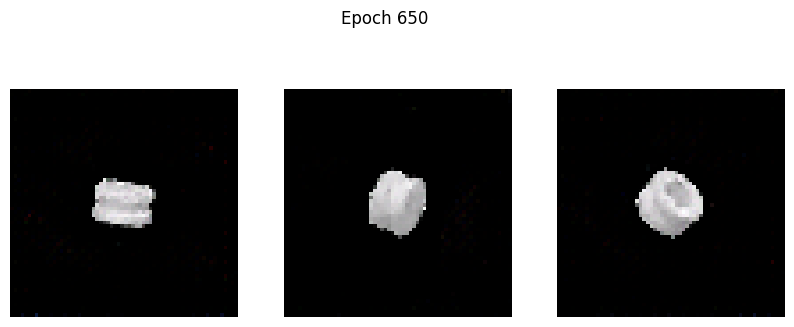

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.5583 - g_loss: 13.4462
Epoch 651/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.7030 - g_loss: 13.7181

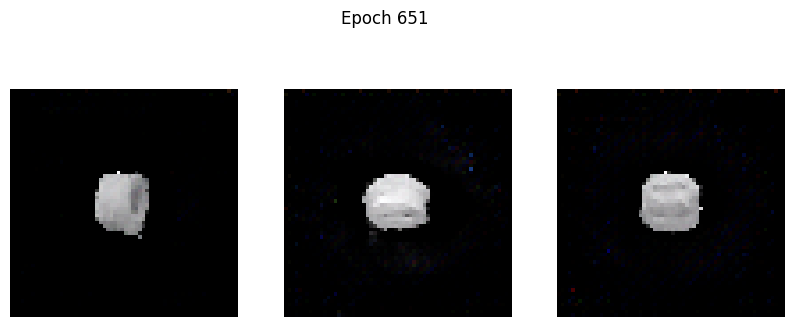

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.7030 - g_loss: 13.7159
Epoch 652/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.8168 - g_loss: 12.3338

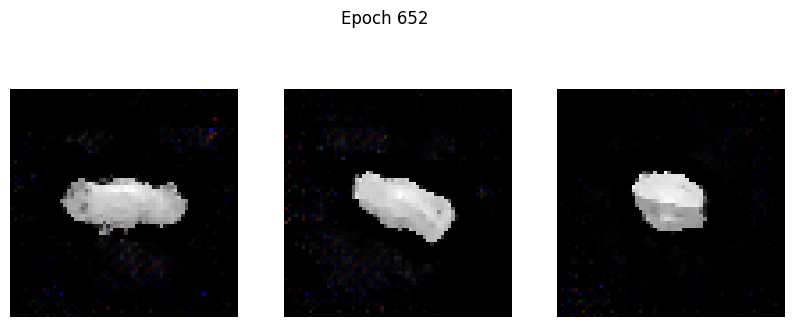

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.8170 - g_loss: 12.3328
Epoch 653/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.8693 - g_loss: 12.0004

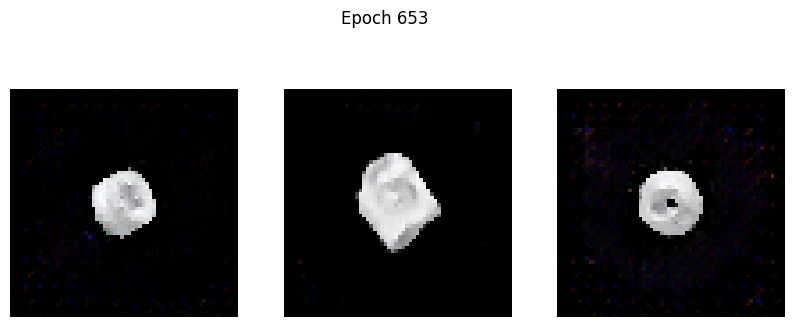

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.8686 - g_loss: 12.0177
Epoch 654/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.7693 - g_loss: 14.0213

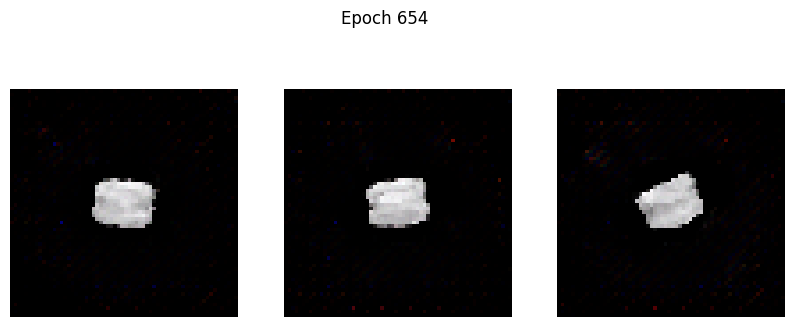

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.7697 - g_loss: 14.0175
Epoch 655/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.8031 - g_loss: 13.1180

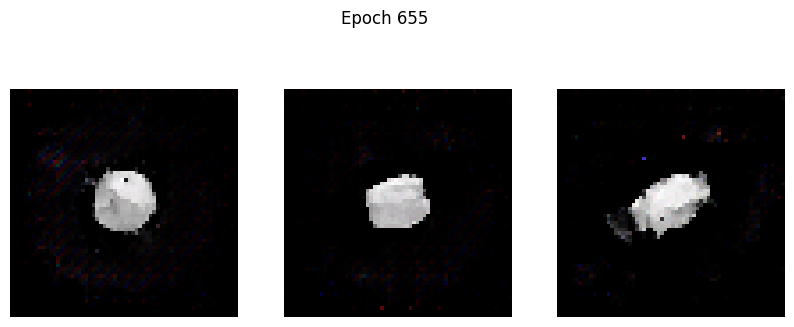

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.8021 - g_loss: 13.1270
Epoch 656/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.6392 - g_loss: 14.4158

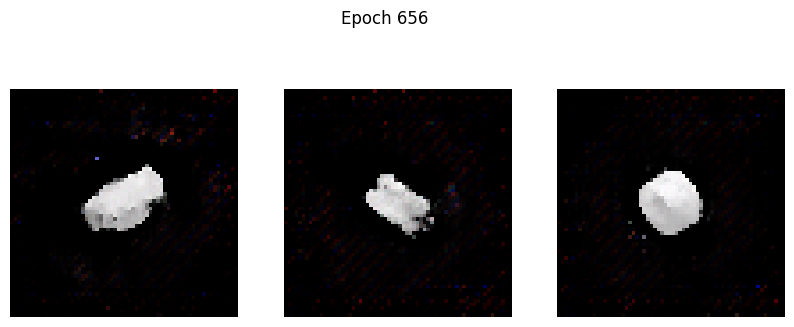

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.6402 - g_loss: 14.4145
Epoch 657/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.8154 - g_loss: 15.7008

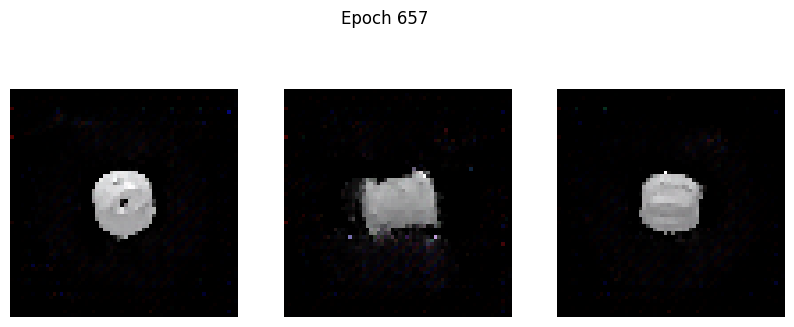

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.8152 - g_loss: 15.6874
Epoch 658/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.8113 - g_loss: 14.1171

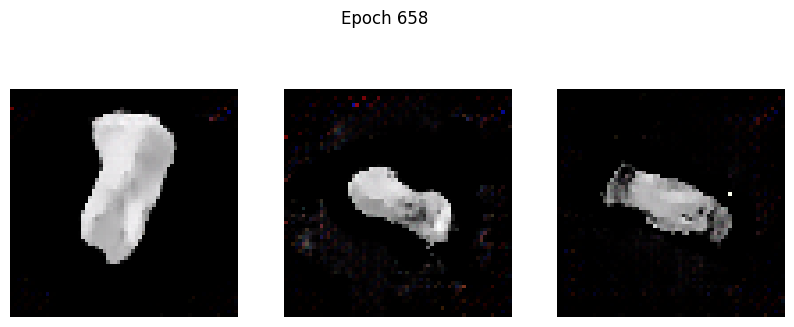

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.8106 - g_loss: 14.1170
Epoch 659/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.9791 - g_loss: 13.0565

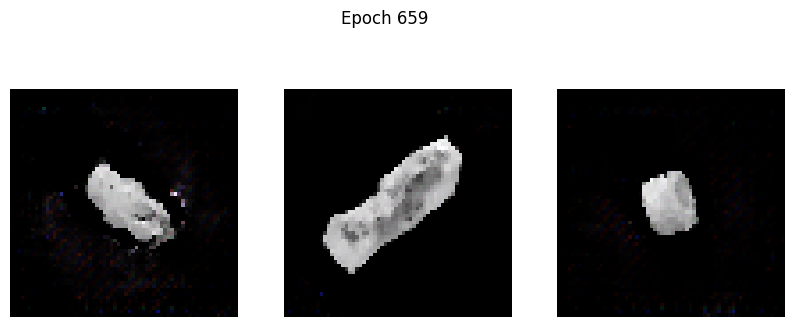

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.9771 - g_loss: 13.0642
Epoch 660/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.8305 - g_loss: 12.9582

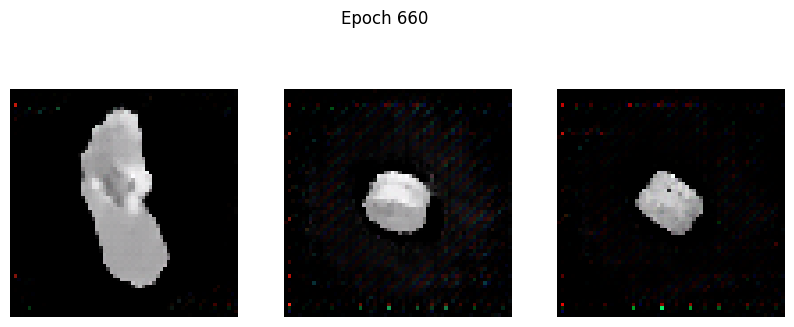

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - d_loss: -0.8293 - g_loss: 12.9708
Epoch 661/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.7921 - g_loss: 13.7145

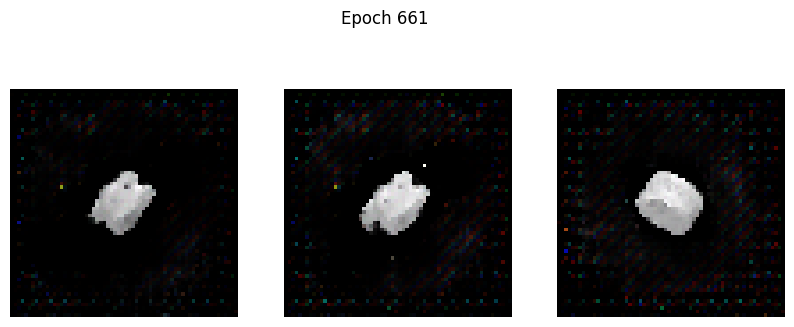

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.7921 - g_loss: 13.7100
Epoch 662/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: -0.8740 - g_loss: 14.6231

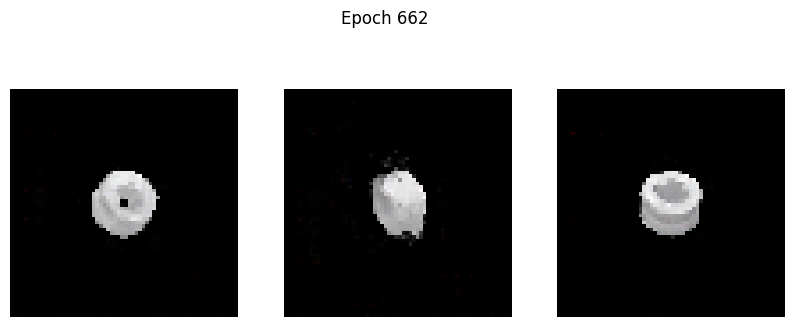

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.8744 - g_loss: 14.6118
Epoch 663/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.6635 - g_loss: 15.6578

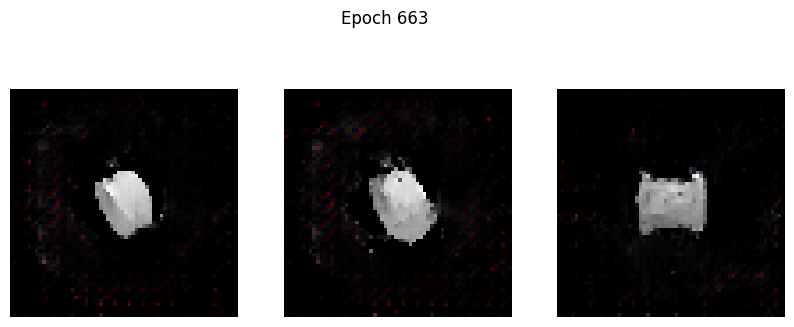

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.6631 - g_loss: 15.6577
Epoch 664/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.8819 - g_loss: 13.3914

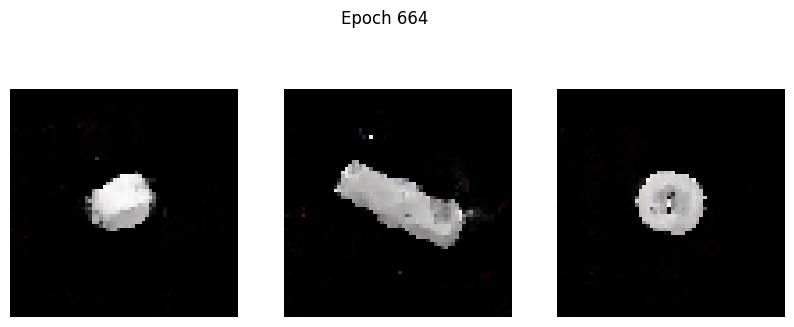

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.8794 - g_loss: 13.4040
Epoch 665/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.8793 - g_loss: 12.7824

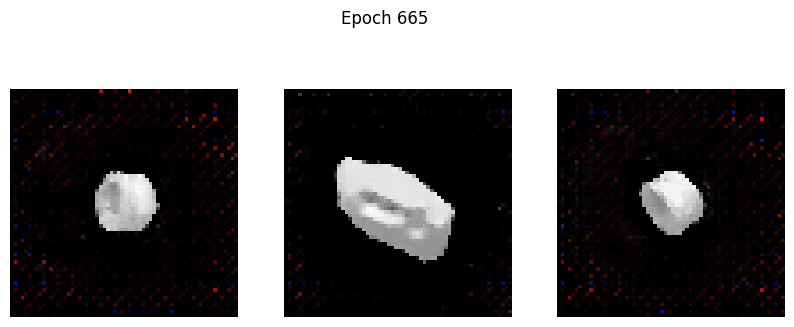

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.8788 - g_loss: 12.7909
Epoch 666/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.6991 - g_loss: 14.9620

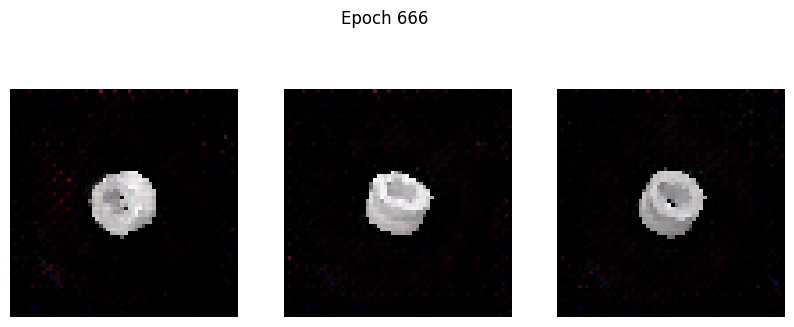

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.7008 - g_loss: 14.9534
Epoch 667/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.6320 - g_loss: 16.6703

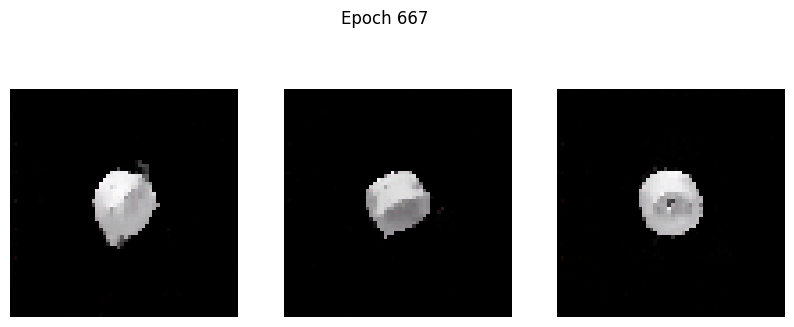

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.6338 - g_loss: 16.6569
Epoch 668/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -1.1169 - g_loss: 12.8691

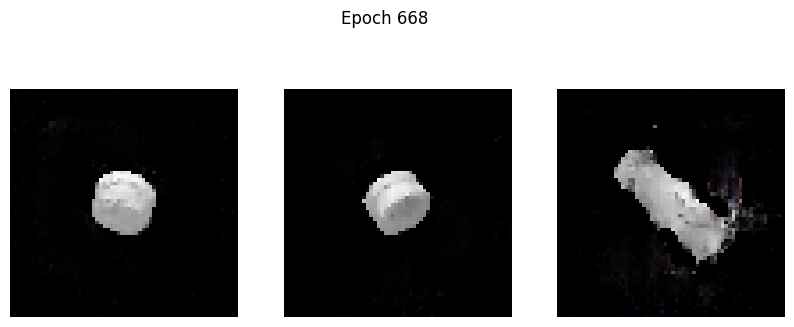

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -1.1166 - g_loss: 12.8784
Epoch 669/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.6067 - g_loss: 18.7451

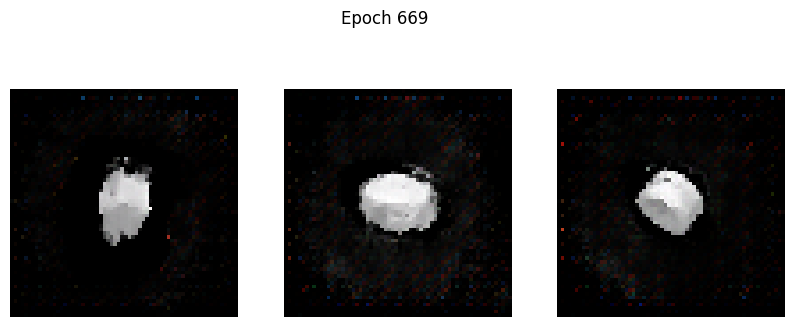

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.6063 - g_loss: 18.7288
Epoch 670/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.9387 - g_loss: 13.6676

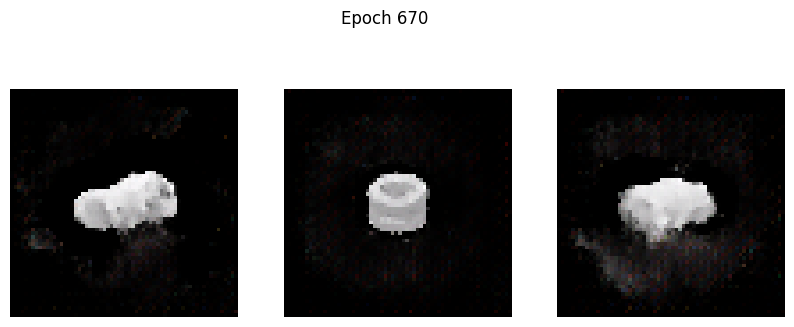

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.9382 - g_loss: 13.6876
Epoch 671/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.7965 - g_loss: 16.2641

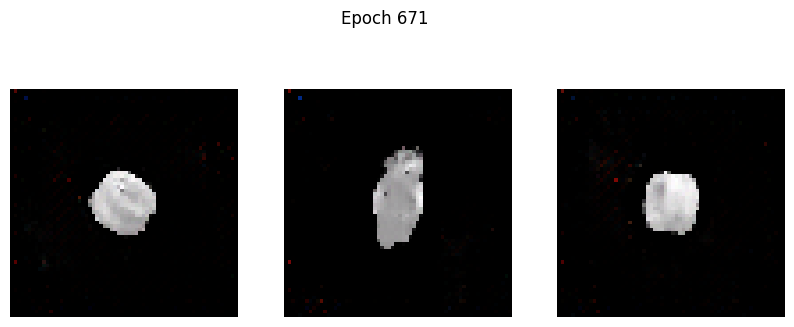

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.7963 - g_loss: 16.2554
Epoch 672/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.7952 - g_loss: 14.7356

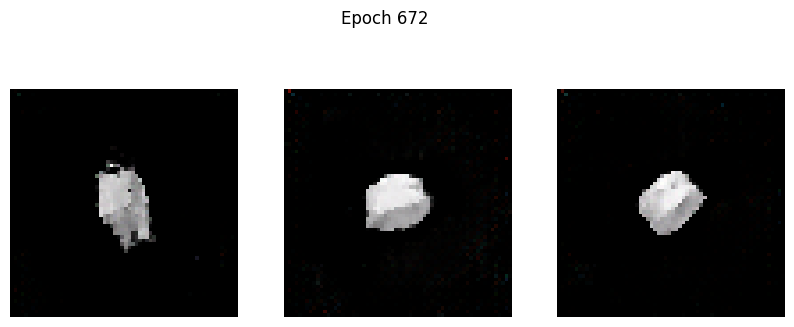

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.7958 - g_loss: 14.7317
Epoch 673/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.9600 - g_loss: 15.3309

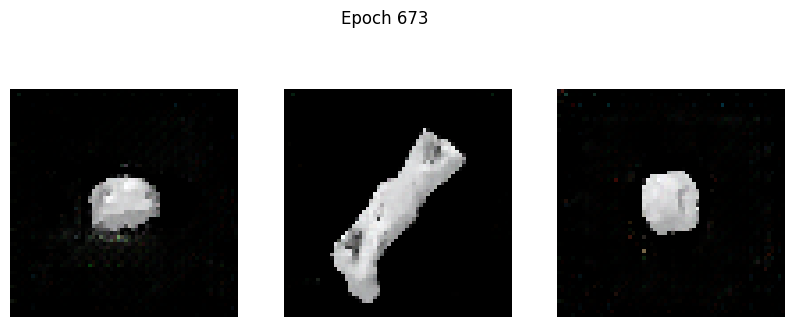

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.9599 - g_loss: 15.3295
Epoch 674/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.8351 - g_loss: 15.0868

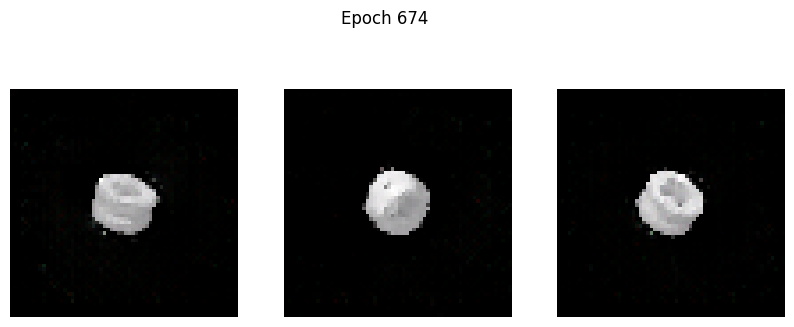

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.8353 - g_loss: 15.0886
Epoch 675/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -1.1228 - g_loss: 12.2907

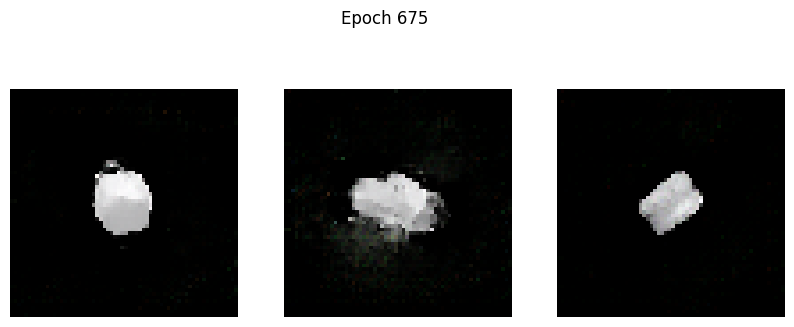

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -1.1223 - g_loss: 12.2981
Epoch 676/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -1.2147 - g_loss: 12.9204

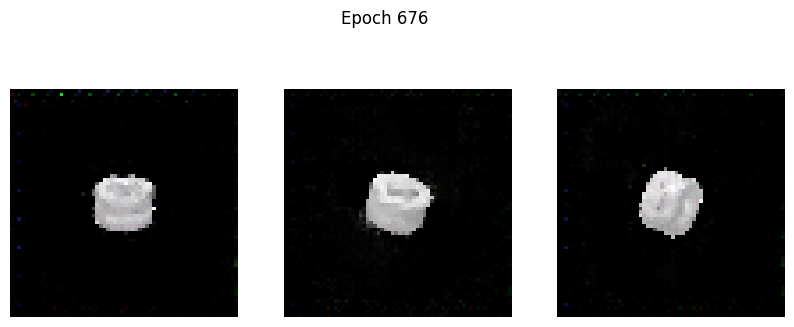

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -1.2127 - g_loss: 12.9431
Epoch 677/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.8909 - g_loss: 16.1543

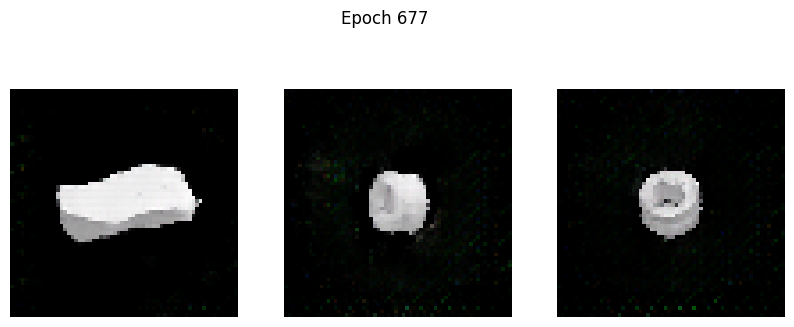

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.8895 - g_loss: 16.1642
Epoch 678/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.5493 - g_loss: 17.0627

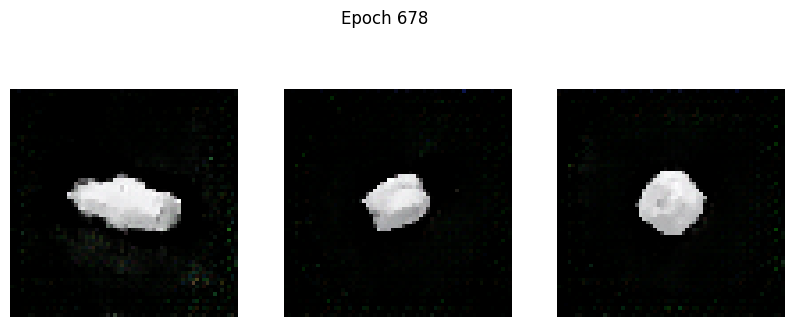

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.5519 - g_loss: 17.0482
Epoch 679/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -1.0791 - g_loss: 13.5520

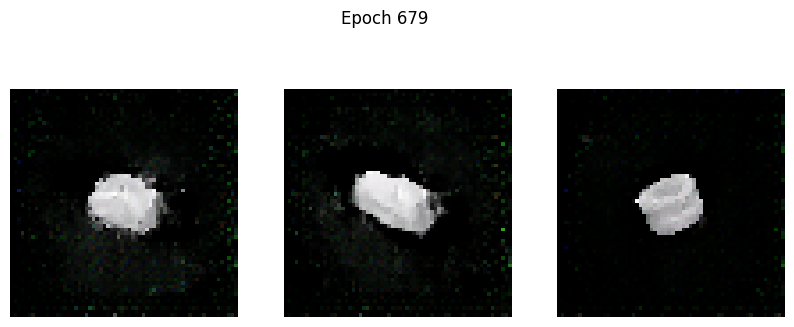

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -1.0790 - g_loss: 13.5665
Epoch 680/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.9606 - g_loss: 15.4248

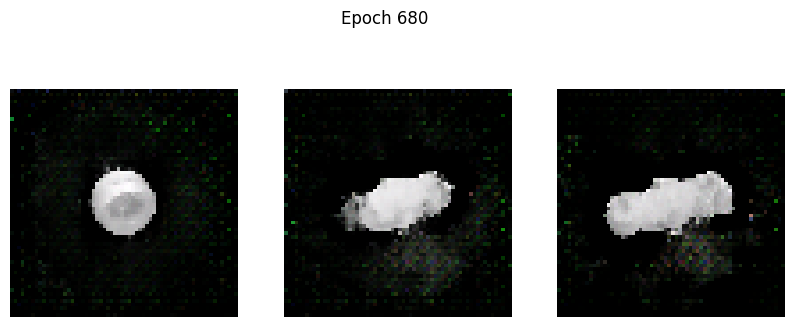

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.9597 - g_loss: 15.4400
Epoch 681/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.8109 - g_loss: 16.5319

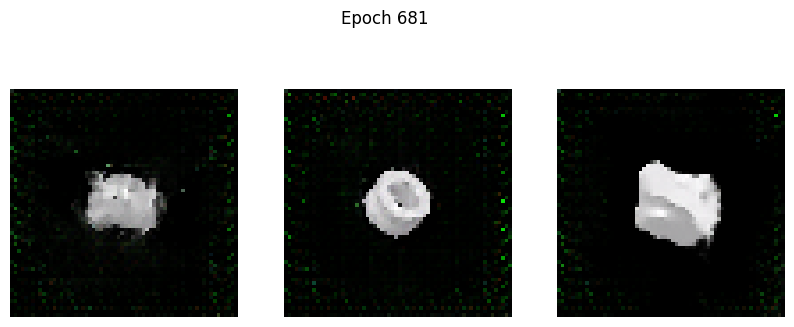

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.8102 - g_loss: 16.5460
Epoch 682/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -1.0627 - g_loss: 16.7389

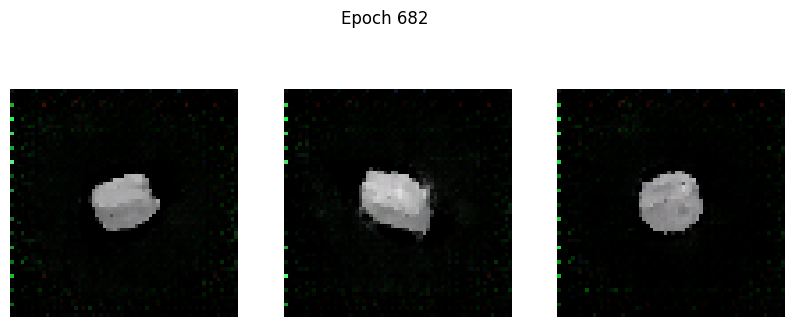

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -1.0621 - g_loss: 16.7297
Epoch 683/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.9363 - g_loss: 18.8954

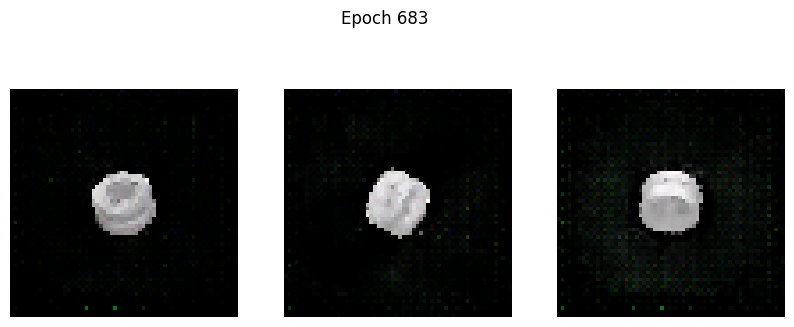

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.9363 - g_loss: 18.8798
Epoch 684/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -1.0361 - g_loss: 15.9946

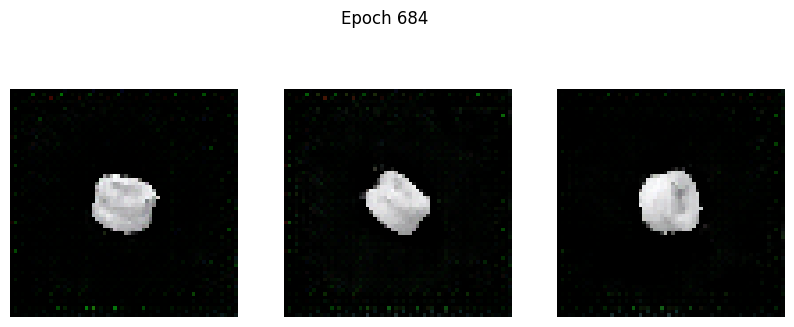

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -1.0358 - g_loss: 15.9994
Epoch 685/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -1.0223 - g_loss: 19.1870

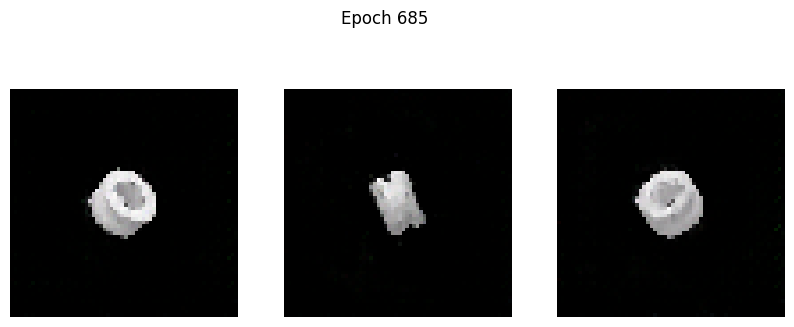

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -1.0216 - g_loss: 19.1665
Epoch 686/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.9813 - g_loss: 16.4326

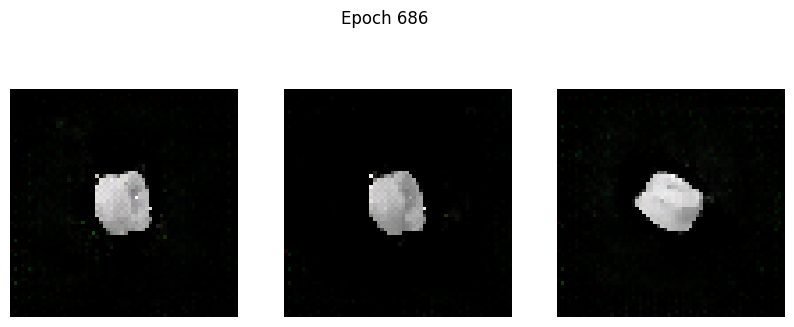

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.9815 - g_loss: 16.4367
Epoch 687/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -1.1282 - g_loss: 15.9809

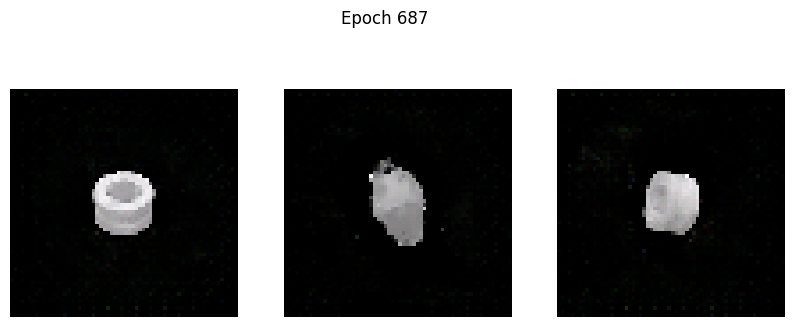

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -1.1269 - g_loss: 15.9847
Epoch 688/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -1.0900 - g_loss: 15.5204

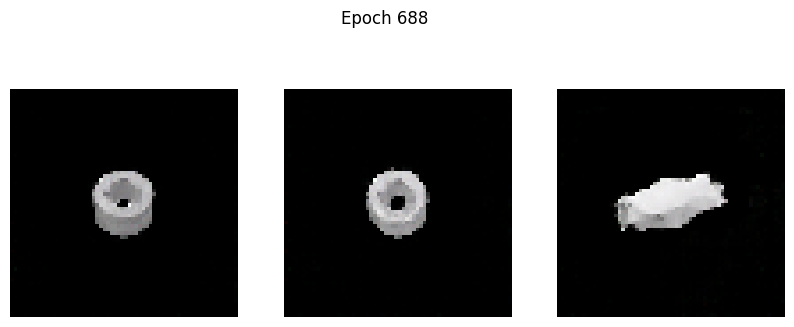

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -1.0893 - g_loss: 15.5300
Epoch 689/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -1.1479 - g_loss: 14.0481

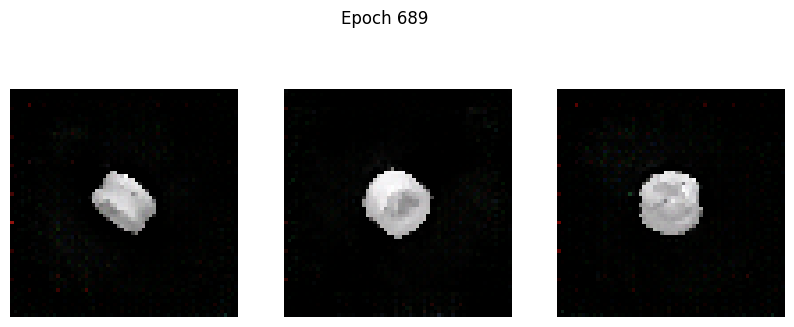

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -1.1469 - g_loss: 14.0611
Epoch 690/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -1.0580 - g_loss: 18.0894

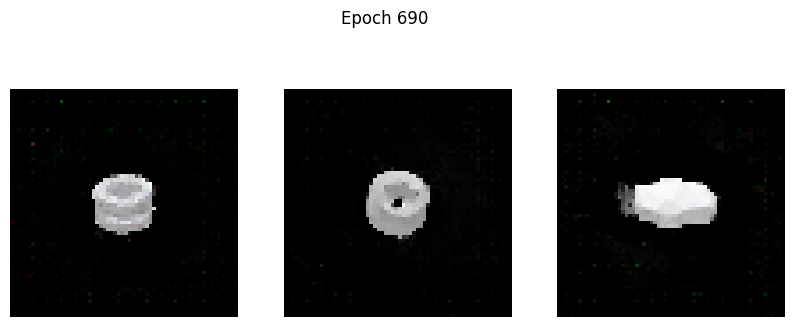

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -1.0582 - g_loss: 18.0856
Epoch 691/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -1.3172 - g_loss: 14.0721

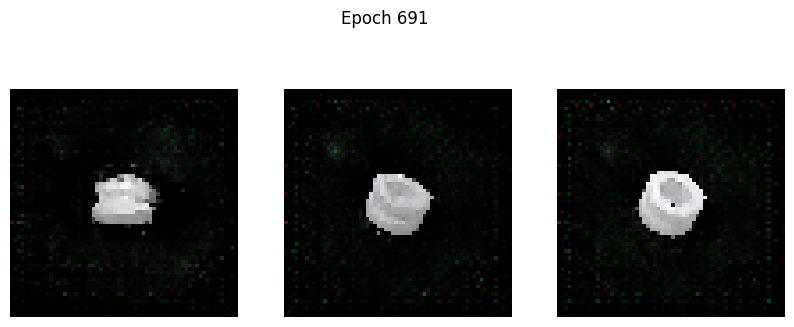

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -1.3169 - g_loss: 14.0808
Epoch 692/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -1.1214 - g_loss: 16.9063

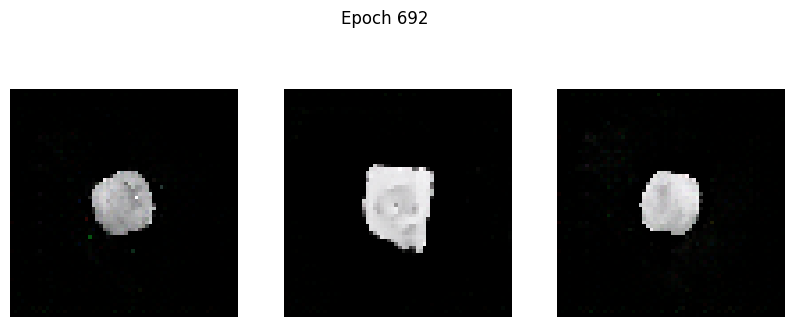

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -1.1219 - g_loss: 16.8975
Epoch 693/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -1.1555 - g_loss: 16.9058

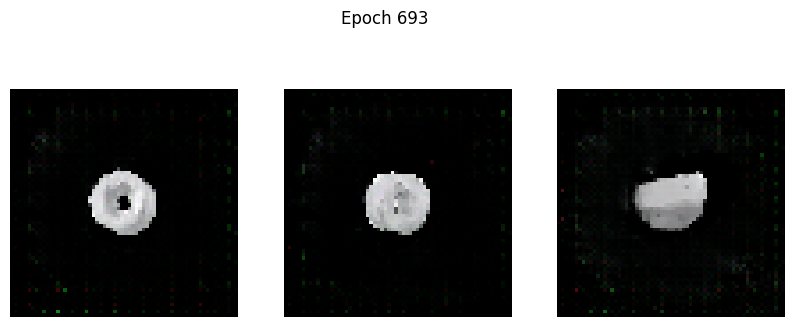

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -1.1531 - g_loss: 16.9210
Epoch 694/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.8109 - g_loss: 17.3202

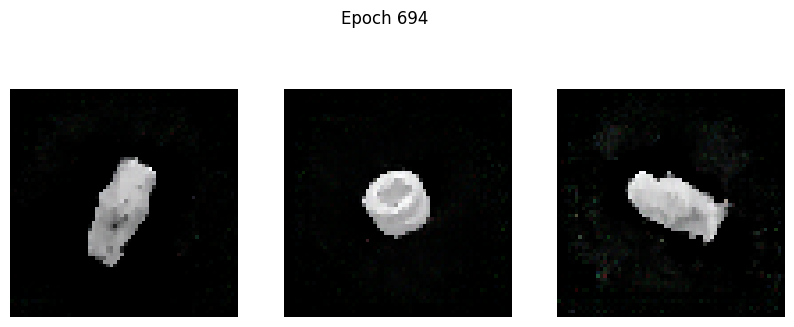

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.8121 - g_loss: 17.3223
Epoch 695/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -1.1453 - g_loss: 15.2405

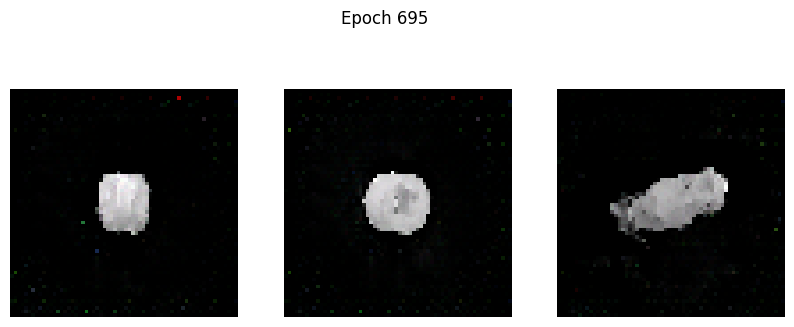

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -1.1455 - g_loss: 15.2496
Epoch 696/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.6854 - g_loss: 19.6368

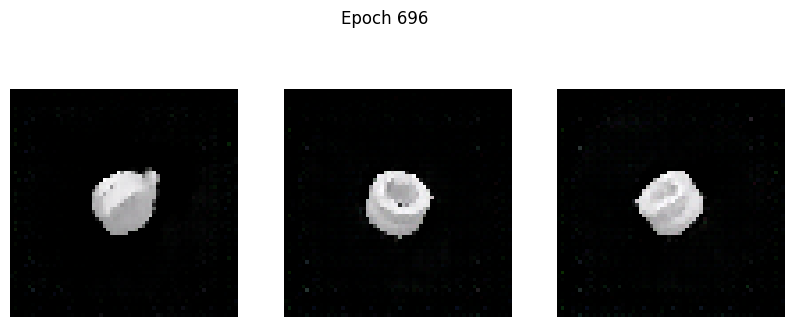

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.6886 - g_loss: 19.6278
Epoch 697/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -1.2077 - g_loss: 16.9358

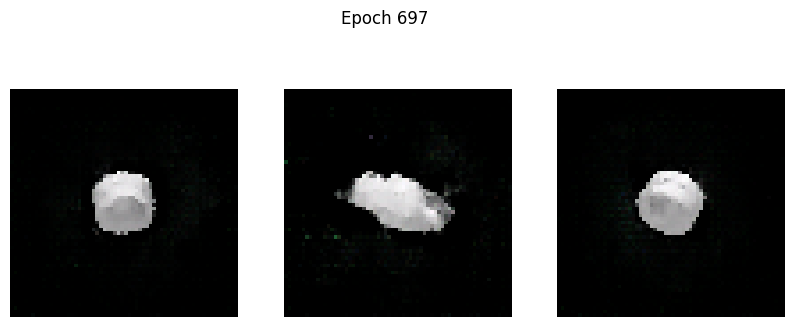

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -1.2085 - g_loss: 16.9363
Epoch 698/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -1.1787 - g_loss: 19.3851

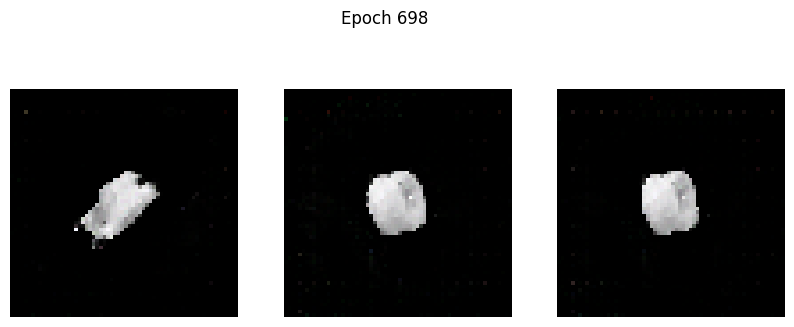

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - d_loss: -1.1790 - g_loss: 19.3790
Epoch 699/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -1.5028 - g_loss: 16.7938

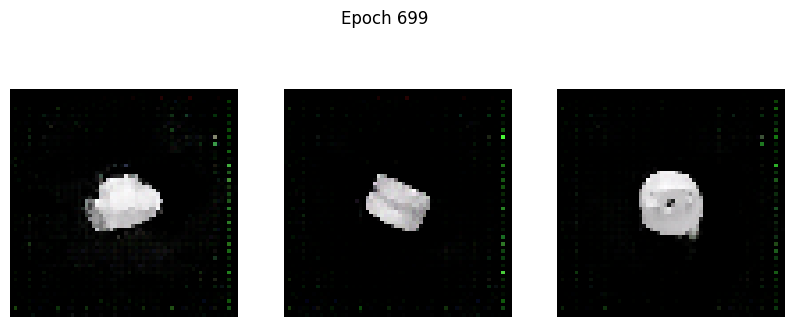

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -1.5013 - g_loss: 16.8052
Epoch 700/700
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: -0.8926 - g_loss: 18.8989

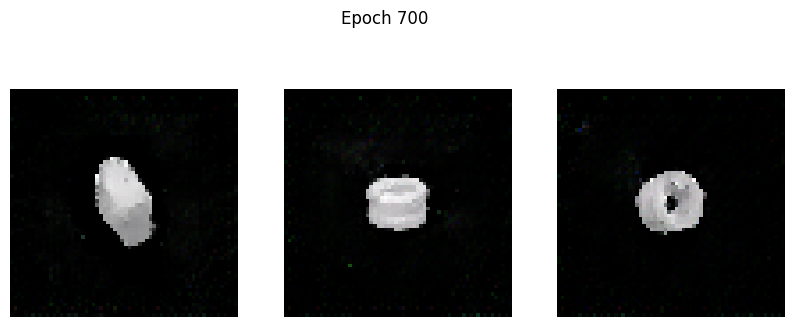

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.8955 - g_loss: 18.8788


In [ ]:
# Hyperparameters
EPOCHS = 700  # Tambahkan jumlah epoch untuk hasil lebih baik (misal: 100-200)
lr_generator = 0.0002
lr_discriminator = 0.0002

# Inisialisasi DCGAN
dcgan = DCGAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

# Compile
dcgan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=lr_discriminator, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=lr_generator, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(from_logits=True),
)

# Jalankan Training
print("Mulai Training...")
dcgan.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[GANMonitor(num_img=3, latent_dim=latent_dim)]
)

In [ ]:
# Simpan model generator
generator.save('generator_model_500_epochs.h5')
print("Model generator berhasil disimpan sebagai 'generator_model_500_epochs.h5'")

Model generator berhasil disimpan sebagai 'generator_model_500_epochs.h5'


5 Gambar Baru (Random Noise):


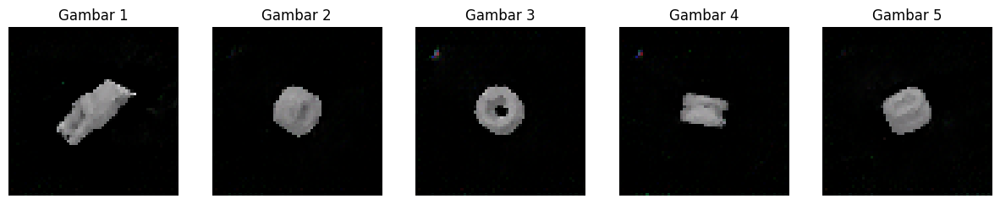

In [ ]:
def plot_generated_images(images, n=5):
    plt.figure(figsize=(15, 3))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        # Denormalisasi gambar dari [-1, 1] ke [0, 1] lalu ke [0, 255]
        img = (images[i] * 127.5 + 127.5).astype("uint8")
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Gambar {i+1}")
    plt.show()

# 1. Generate 5 vektor laten acak
num_images = 5
random_latent_vectors = tf.random.normal(shape=(num_images, latent_dim))

# 2. Masukkan ke model generator
generated_images = generator(random_latent_vectors)
generated_images = generated_images.numpy() # Ubah ke numpy array

# 3. Tampilkan
print("5 Gambar Baru (Random Noise):")
plot_generated_images(generated_images, n=num_images)

5 Gambar Hasil Latent Space Interpolation:


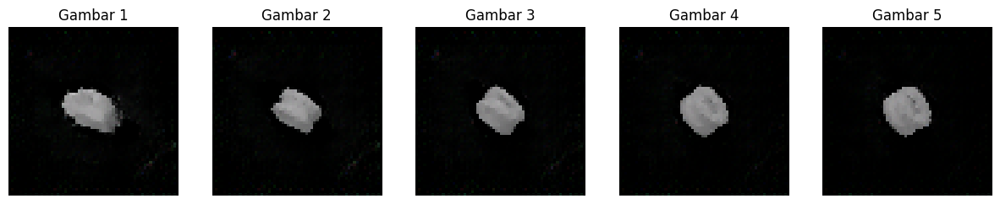

In [ ]:
def interpolate_points(p1, p2, n_steps=10):
    # Melakukan interpolasi linear antara dua vektor
    ratios = np.linspace(0, 1, num=n_steps)
    vectors = []
    for ratio in ratios:
        v = (1.0 - ratio) * p1 + ratio * p2
        vectors.append(v)
    return np.array(vectors)

# 1. Tentukan 2 titik acak di latent space (Awal dan Akhir)
start_point = tf.random.normal(shape=(1, latent_dim))
end_point = tf.random.normal(shape=(1, latent_dim))

# 2. Buat 5 titik interpolasi (termasuk awal dan akhir)
interpolated_vectors = interpolate_points(start_point, end_point, n_steps=5)
# Kita perlu reshape agar dimensinya sesuai: (5, 128)
interpolated_vectors = np.squeeze(interpolated_vectors)

# 3. Generate gambar dari vektor interpolasi
interpolated_images = generator(interpolated_vectors)
interpolated_images = interpolated_images.numpy()

# 4. Tampilkan
print("5 Gambar Hasil Latent Space Interpolation:")
plot_generated_images(interpolated_images, n=5)